# 6 - Attention is All You Need

In this notebook we will be implementing a (slightly modified version) of the Transformer model from the [Attention is All You Need](https://arxiv.org/abs/1706.03762) paper. All images in this notebook will be taken from the Transformer paper. For more information about the Transformer, [see](https://www.mihaileric.com/posts/transformers-attention-in-disguise/) [these](https://jalammar.github.io/illustrated-transformer/) [three](http://nlp.seas.harvard.edu/2018/04/03/attention.html) articles.

![](https://github.com/bentrevett/pytorch-seq2seq/blob/master/assets/transformer1.png?raw=1)

## Introduction

Similar to the Convolutional Sequence-to-Sequence model, the Transformer does not use any recurrence. It also does not use any convolutional layers. Instead the model is entirely made up of linear layers, attention mechanisms and normalization. 

As of January 2020, Transformers are the dominant architecture in NLP and are used to achieve state-of-the-art results for many tasks and it appears as if they will be for the near future. 

The most popular Transformer variant is [BERT](https://arxiv.org/abs/1810.04805) (**B**idirectional **E**ncoder **R**epresentations from **T**ransformers) and pre-trained versions of BERT are commonly used to replace the embedding layers - if not more - in NLP models. 

A common library used when dealing with pre-trained transformers is the [Transformers](https://huggingface.co/transformers/) library, see [here](https://huggingface.co/transformers/pretrained_models.html) for a list of all pre-trained models available.

The differences between the implementation in this notebook and the paper are:
- we use a learned positional encoding instead of a static one
- we use the standard Adam optimizer with a static learning rate instead of one with warm-up and cool-down steps
- we do not use label smoothing

We make all of these changes as they closely follow BERT's set-up and the majority of Transformer variants use a similar set-up.

## Preparing the Data

As always, let's import all the required modules and set the random seeds for reproducability.

In [18]:
import torch
import torch.nn as nn
import torch.optim as optim

import torchtext
from torchtext.legacy.datasets import Multi30k
from torchtext.legacy.data import Field, BucketIterator

import matplotlib.pyplot as plt
import matplotlib.ticker as ticker

import spacy
import numpy as np

import random
import math
import time

In [19]:
SEED = 1234

random.seed(SEED)
np.random.seed(SEED)
torch.manual_seed(SEED)
torch.cuda.manual_seed(SEED)
torch.backends.cudnn.deterministic = True

We'll then create our tokenizers as before.

In [20]:
spacy_de = spacy.load('de_core_news_sm')
spacy_en = spacy.load('en_core_web_sm')

In [21]:
def tokenize_de(text):
    """
    Tokenizes German text from a string into a list of strings
    """
    return [tok.text for tok in spacy_de.tokenizer(text)]

def tokenize_en(text):
    """
    Tokenizes English text from a string into a list of strings
    """
    return [tok.text for tok in spacy_en.tokenizer(text)]

Our fields are the same as the previous notebook. The model expects data to be fed in with the batch dimension first, so we use `batch_first = True`. 

In [22]:
SRC = Field(tokenize = tokenize_de, 
            init_token = '<sos>', 
            eos_token = '<eos>', 
            lower = True, 
            batch_first = True)

TRG = Field(tokenize = tokenize_en, 
            init_token = '<sos>', 
            eos_token = '<eos>', 
            lower = True, 
            batch_first = True)

We then load the Multi30k dataset and build the vocabulary.

In [23]:
train_data, valid_data, test_data = Multi30k.splits(exts = ('.de', '.en'), 
                                                    fields = (SRC, TRG))

In [24]:
SRC.build_vocab(train_data, min_freq = 2)
TRG.build_vocab(train_data, min_freq = 2)

Finally, we define the device and the data iterator.

In [25]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(device)

cpu


In [26]:
BATCH_SIZE = 128

train_iterator, valid_iterator, test_iterator = BucketIterator.splits(
    (train_data, valid_data, test_data), 
     batch_size = BATCH_SIZE,
     device = device)




## Building the Model

Next, we'll build the model. Like previous notebooks it is made up of an *encoder* and a *decoder*, with the encoder *encoding* the input/source sentence (in German) into *context vector* and the decoder then *decoding* this context vector to output our output/target sentence (in English). 

### Encoder

Similar to the ConvSeq2Seq model, the Transformer's encoder does not attempt to compress the entire source sentence, $X = (x_1, ... ,x_n)$, into a single context vector, $z$. Instead it produces a sequence of context vectors, $Z = (z_1, ... , z_n)$. So, if our input sequence was 5 tokens long we would have $Z = (z_1, z_2, z_3, z_4, z_5)$. Why do we call this a sequence of context vectors and not a sequence of hidden states? A hidden state at time $t$ in an RNN has only seen tokens $x_t$ and all the tokens before it. However, each context vector here has seen all tokens at all positions within the input sequence.

![](https://github.com/bentrevett/pytorch-seq2seq/blob/master/assets/transformer-encoder.png?raw=1)

First, the tokens are passed through a standard embedding layer. Next, as the model has no recurrent it has no idea about the order of the tokens within the sequence. We solve this by using a second embedding layer called a *positional embedding layer*. This is a standard embedding layer where the input is not the token itself but the position of the token within the sequence, starting with the first token, the `<sos>` (start of sequence) token, in position 0. The position embedding has a "vocabulary" size of 100, which means our model can accept sentences up to 100 tokens long. This can be increased if we want to handle longer sentences.

The original Transformer implementation from the Attention is All You Need paper does not learn positional embeddings. Instead it uses a fixed static embedding. Modern Transformer architectures, like BERT, use positional embeddings instead, hence we have decided to use them in these tutorials. Check out [this](http://nlp.seas.harvard.edu/2018/04/03/attention.html#positional-encoding) section to read more about the positional embeddings used in the original Transformer model.

Next, the token and positional embeddings are elementwise summed together to get a vector which contains information about the token and also its position with in the sequence. However, before they are summed, the token embeddings are multiplied by a scaling factor which is $\sqrt{d_{model}}$, where $d_{model}$ is the hidden dimension size, `hid_dim`. This supposedly reduces variance in the embeddings and the model is difficult to train reliably without this scaling factor. Dropout is then applied to the combined embeddings.

The combined embeddings are then passed through $N$ *encoder layers* to get $Z$, which is then output and can be used by the decoder.

The source mask, `src_mask`, is simply the same shape as the source sentence but has a value of 1 when the token in the source sentence is not a `<pad>` token and 0 when it is a `<pad>` token. This is used in the encoder layers to mask the multi-head attention mechanisms, which are used to calculate and apply attention over the source sentence, so the model does not pay attention to `<pad>` tokens, which contain no useful information.

In [27]:
class Encoder(nn.Module):
    def __init__(self, 
                 input_dim, 
                 hid_dim, 
                 n_layers, 
                 n_heads, 
                 pf_dim,
                 dropout, 
                 device,
                 max_length = 100):
        super().__init__()

        self.device = device
        
        self.tok_embedding = nn.Embedding(input_dim, hid_dim)
        self.pos_embedding = nn.Embedding(max_length, hid_dim)
        
        self.layers = nn.ModuleList([EncoderLayer(hid_dim, 
                                                  n_heads, 
                                                  pf_dim,
                                                  dropout, 
                                                  device) 
                                     for _ in range(n_layers)])
        
        self.dropout = nn.Dropout(dropout)
        
        self.scale = torch.sqrt(torch.FloatTensor([hid_dim])).to(device)
        
    def forward(self, src, src_mask):
        
        #src = [batch size, src len]
        #src_mask = [batch size, 1, 1, src len]
        
        batch_size = src.shape[0]
        src_len = src.shape[1]
        
        pos = torch.arange(0, src_len).unsqueeze(0).repeat(batch_size, 1).to(self.device)
        
        #pos = [batch size, src len]
        
        src = self.dropout((self.tok_embedding(src) * self.scale) + self.pos_embedding(pos))
        
        #src = [batch size, src len, hid dim]
        
        for layer in self.layers:
            src = layer(src, src_mask)
            
        #src = [batch size, src len, hid dim]
            
        return src

### Encoder Layer

The encoder layers are where all of the "meat" of the encoder is contained. We first pass the source sentence and its mask into the *multi-head attention layer*, then perform dropout on it, apply a residual connection and pass it through a [Layer Normalization](https://arxiv.org/abs/1607.06450) layer. We then pass it through a *position-wise feedforward* layer and then, again, apply dropout, a residual connection and then layer normalization to get the output of this layer which is fed into the next layer. The parameters are not shared between layers. 

The mutli head attention layer is used by the encoder layer to attend to the source sentence, i.e. it is calculating and applying attention over itself instead of another sequence, hence we call it *self attention*.

[This](https://mlexplained.com/2018/01/13/weight-normalization-and-layer-normalization-explained-normalization-in-deep-learning-part-2/) article goes into more detail about layer normalization, but the gist is that it normalizes the values of the features, i.e. across the hidden dimension, so each feature has a mean of 0 and a standard deviation of 1. This allows neural networks with a larger number of layers, like the Transformer, to be trained easier.

In [28]:
class EncoderLayer(nn.Module):
    def __init__(self, 
                 hid_dim, 
                 n_heads, 
                 pf_dim,  
                 dropout, 
                 device):
        super().__init__()
        
        self.self_attn_layer_norm = nn.LayerNorm(hid_dim)
        self.ff_layer_norm = nn.LayerNorm(hid_dim)
        self.self_attention = MultiHeadAttentionLayer(hid_dim, n_heads, dropout, device)
        self.positionwise_feedforward = PositionwiseFeedforwardLayer(hid_dim, 
                                                                     pf_dim, 
                                                                     dropout)
        self.dropout = nn.Dropout(dropout)
        
    def forward(self, src, src_mask):
        
        #src = [batch size, src len, hid dim]
        #src_mask = [batch size, 1, 1, src len] 
                
        #self attention
        _src, _ = self.self_attention(src, src, src, src_mask)
        
        #dropout, residual connection and layer norm
        src = self.self_attn_layer_norm(src + self.dropout(_src))
        
        #src = [batch size, src len, hid dim]
        
        #positionwise feedforward
        _src = self.positionwise_feedforward(src)
        
        #dropout, residual and layer norm
        src = self.ff_layer_norm(src + self.dropout(_src))
        
        #src = [batch size, src len, hid dim]
        
        return src

### Mutli Head Attention Layer

One of the key, novel concepts introduced by the Transformer paper is the *multi-head attention layer*. 

![](https://github.com/bentrevett/pytorch-seq2seq/blob/master/assets/transformer-attention.png?raw=1)

Attention can be though of as *queries*, *keys* and *values* - where the query is used with the key to get an attention vector (usually the output of a *softmax* operation and has all values between 0 and 1 which sum to 1) which is then used to get a weighted sum of the values.

The Transformer uses *scaled dot-product attention*, where the query and key are combined by taking the dot product between them, then applying the softmax operation and scaling by $d_k$ before finally then multiplying by the value. $d_k$ is the *head dimension*, `head_dim`, which we will shortly explain further.

$$ \text{Attention}(Q, K, V) = \text{Softmax} \big( \frac{QK^T}{\sqrt{d_k}} \big)V $$ 

This is similar to standard *dot product attention* but is scaled by $d_k$, which the paper states is used to stop the results of the dot products growing large, causing gradients to become too small.

However, the scaled dot-product attention isn't simply applied to the queries, keys and values. Instead of doing a single attention application the queries, keys and values have their `hid_dim` split into $h$ *heads* and the scaled dot-product attention is calculated over all heads in parallel. This means instead of paying attention to one concept per attention application, we pay attention to $h$. We then re-combine the heads into their `hid_dim` shape, thus each `hid_dim` is potentially paying attention to $h$ different concepts.

$$ \text{MultiHead}(Q, K, V) = \text{Concat}(\text{head}_1,...,\text{head}_h)W^O $$

$$\text{head}_i = \text{Attention}(QW_i^Q, KW_i^K, VW_i^V) $$

$W^O$ is the linear layer applied at the end of the multi-head attention layer, `fc`. $W^Q, W^K, W^V$ are the linear layers `fc_q`, `fc_k` and `fc_v`.

Walking through the module, first we calculate $QW^Q$, $KW^K$ and $VW^V$ with the linear layers, `fc_q`, `fc_k` and `fc_v`, to give us `Q`, `K` and `V`. Next, we split the `hid_dim` of the query, key and value into `n_heads` using `.view` and correctly permute them so they can be multiplied together. We then calculate the `energy` (the un-normalized attention) by multiplying `Q` and `K` together and scaling it by the square root of `head_dim`, which is calulated as `hid_dim // n_heads`. We then mask the energy so we do not pay attention over any elements of the sequeuence we shouldn't, then apply the softmax and dropout. We then apply the attention to the value heads, `V`, before combining the `n_heads` together. Finally, we multiply this $W^O$, represented by `fc_o`. 

Note that in our implementation the lengths of the keys and values are always the same, thus when matrix multiplying the output of the softmax, `attention`, with `V` we will always have valid dimension sizes for matrix multiplication. This multiplication is carried out using `torch.matmul` which, when both tensors are >2-dimensional, does a batched matrix multiplication over the last two dimensions of each tensor. This will be a **[query len, key len] x [value len, head dim]** batched matrix multiplication over the batch size and each head which provides the **[batch size, n heads, query len, head dim]** result.

One thing that looks strange at first is that dropout is applied directly to the attention. This means that our attention vector will most probably not sum to 1 and we may pay full attention to a token but the attention over that token is set to 0 by dropout. This is never explained, or even mentioned, in the paper however is used by the [official implementation](https://github.com/tensorflow/tensor2tensor/) and every Transformer implementation since, [including BERT](https://github.com/google-research/bert/).

In [29]:
class MultiHeadAttentionLayer(nn.Module):
    def __init__(self, hid_dim, n_heads, dropout, device):
        super().__init__()
        
        assert hid_dim % n_heads == 0
        
        self.hid_dim = hid_dim
        self.n_heads = n_heads
        self.head_dim = hid_dim // n_heads
        
        self.fc_q = nn.Linear(hid_dim, hid_dim)
        self.fc_k = nn.Linear(hid_dim, hid_dim)
        self.fc_v = nn.Linear(hid_dim, hid_dim)
        
        self.fc_o = nn.Linear(hid_dim, hid_dim)
        
        self.dropout = nn.Dropout(dropout)
        
        self.scale = torch.sqrt(torch.FloatTensor([self.head_dim])).to(device)
        
    def forward(self, query, key, value, mask = None):
        
        batch_size = query.shape[0]
        
        #query = [batch size, query len, hid dim]
        #key = [batch size, key len, hid dim]
        #value = [batch size, value len, hid dim]
                
        Q = self.fc_q(query)
        K = self.fc_k(key)
        V = self.fc_v(value)
        
        #Q = [batch size, query len, hid dim]
        #K = [batch size, key len, hid dim]
        #V = [batch size, value len, hid dim]
                
        Q = Q.view(batch_size, -1, self.n_heads, self.head_dim).permute(0, 2, 1, 3)
        K = K.view(batch_size, -1, self.n_heads, self.head_dim).permute(0, 2, 1, 3)
        V = V.view(batch_size, -1, self.n_heads, self.head_dim).permute(0, 2, 1, 3)
        
        #Q = [batch size, n heads, query len, head dim]
        #K = [batch size, n heads, key len, head dim]
        #V = [batch size, n heads, value len, head dim]
                
        energy = torch.matmul(Q, K.permute(0, 1, 3, 2)) / self.scale
        
        #energy = [batch size, n heads, query len, key len]
        
        if mask is not None:
            energy = energy.masked_fill(mask == 0, -1e10)
        
        attention = torch.softmax(energy, dim = -1)
                
        #attention = [batch size, n heads, query len, key len]
                
        x = torch.matmul(self.dropout(attention), V)
        
        #x = [batch size, n heads, query len, head dim]
        
        x = x.permute(0, 2, 1, 3).contiguous()
        
        #x = [batch size, query len, n heads, head dim]
        
        x = x.view(batch_size, -1, self.hid_dim)
        
        #x = [batch size, query len, hid dim]
        
        x = self.fc_o(x)
        
        #x = [batch size, query len, hid dim]
        
        return x, attention

### Position-wise Feedforward Layer

The other main block inside the encoder layer is the *position-wise feedforward layer* This is relatively simple compared to the multi-head attention layer. The input is transformed from `hid_dim` to `pf_dim`, where `pf_dim` is usually a lot larger than `hid_dim`. The original Transformer used a `hid_dim` of 512 and a `pf_dim` of 2048. The ReLU activation function and dropout are applied before it is transformed back into a `hid_dim` representation. 

Why is this used? Unfortunately, it is never explained in the paper.

BERT uses the [GELU](https://arxiv.org/abs/1606.08415) activation function, which can be used by simply switching `torch.relu` for `F.gelu`. Why did they use GELU? Again, it is never explained.

In [30]:
class PositionwiseFeedforwardLayer(nn.Module):
    def __init__(self, hid_dim, pf_dim, dropout):
        super().__init__()
        
        self.fc_1 = nn.Linear(hid_dim, pf_dim)
        self.fc_2 = nn.Linear(pf_dim, hid_dim)
        
        self.dropout = nn.Dropout(dropout)
        
    def forward(self, x):
        
        #x = [batch size, seq len, hid dim]
        
        x = self.dropout(torch.relu(self.fc_1(x)))
        
        #x = [batch size, seq len, pf dim]
        
        x = self.fc_2(x)
        
        #x = [batch size, seq len, hid dim]
        
        return x

### Decoder

The objective of the decoder is to take the encoded representation of the source sentence, $Z$, and convert it into predicted tokens in the target sentence, $\hat{Y}$. We then compare $\hat{Y}$ with the actual tokens in the target sentence, $Y$, to calculate our loss, which will be used to calculate the gradients of our parameters and then use our optimizer to update our weights in order to improve our predictions. 

![](https://github.com/bentrevett/pytorch-seq2seq/blob/master/assets/transformer-decoder.png?raw=1)

The decoder is similar to encoder, however it now has two multi-head attention layers. A *masked multi-head attention layer* over the target sequence, and a multi-head attention layer which uses the decoder representation as the query and the encoder representation as the key and value.

The decoder uses positional embeddings and combines - via an elementwise sum - them with the scaled embedded target tokens, followed by dropout. Again, our positional encodings have a "vocabulary" of 100, which means they can accept sequences up to 100 tokens long. This can be increased if desired.

The combined embeddings are then passed through the $N$ decoder layers, along with the encoded source, `enc_src`, and the source and target masks. Note that the number of layers in the encoder does not have to be equal to the number of layers in the decoder, even though they are both denoted by $N$.

The decoder representation after the $N^{th}$ layer is then passed through a linear layer, `fc_out`. In PyTorch, the softmax operation is contained within our loss function, so we do not explicitly need to use a softmax layer here.

As well as using the source mask, as we did in the encoder to prevent our model attending to `<pad>` tokens, we also use a target mask. This will be explained further in the `Seq2Seq` model which encapsulates both the encoder and decoder, but the gist of it is that it performs a similar operation as the decoder padding in the convolutional sequence-to-sequence model. As we are processing all of the target tokens at once in parallel we need a method of stopping the decoder from "cheating" by simply "looking" at what the next token in the target sequence is and outputting it. 

Our decoder layer also outputs the normalized attention values so we can later plot them to see what our model is actually paying attention to.

In [31]:
class Decoder(nn.Module):
    def __init__(self, 
                 output_dim, 
                 hid_dim, 
                 n_layers, 
                 n_heads, 
                 pf_dim, 
                 dropout, 
                 device,
                 max_length = 100):
        super().__init__()
        
        self.device = device
        
        self.tok_embedding = nn.Embedding(output_dim, hid_dim)
        self.pos_embedding = nn.Embedding(max_length, hid_dim)
        
        self.layers = nn.ModuleList([DecoderLayer(hid_dim, 
                                                  n_heads, 
                                                  pf_dim, 
                                                  dropout, 
                                                  device)
                                     for _ in range(n_layers)])
        
        self.fc_out = nn.Linear(hid_dim, output_dim)
        
        self.dropout = nn.Dropout(dropout)
        
        self.scale = torch.sqrt(torch.FloatTensor([hid_dim])).to(device)
        
    def forward(self, trg, enc_src, trg_mask, src_mask):
        
        #trg = [batch size, trg len]
        #enc_src = [batch size, src len, hid dim]
        #trg_mask = [batch size, 1, trg len, trg len]
        #src_mask = [batch size, 1, 1, src len]
                
        batch_size = trg.shape[0]
        trg_len = trg.shape[1]
        
        pos = torch.arange(0, trg_len).unsqueeze(0).repeat(batch_size, 1).to(self.device)
                            
        #pos = [batch size, trg len]
            
        trg = self.dropout((self.tok_embedding(trg) * self.scale) + self.pos_embedding(pos))
                
        #trg = [batch size, trg len, hid dim]
        
        for layer in self.layers:
            trg, attention = layer(trg, enc_src, trg_mask, src_mask)
        
        #trg = [batch size, trg len, hid dim]
        #attention = [batch size, n heads, trg len, src len]
        
        output = self.fc_out(trg)
        
        #output = [batch size, trg len, output dim]
            
        return output, attention

### Decoder Layer

As mentioned previously, the decoder layer is similar to the encoder layer except that it now has two multi-head attention layers, `self_attention` and `encoder_attention`. 

The first performs self-attention, as in the encoder, by using the decoder representation so far as the query, key and value. This is followed by dropout, residual connection and layer normalization. This `self_attention` layer uses the target sequence mask, `trg_mask`, in order to prevent the decoder from "cheating" by paying attention to tokens that are "ahead" of the one it is currently processing as it processes all tokens in the target sentence in parallel.

The second is how we actually feed the encoded source sentence, `enc_src`, into our decoder. In this multi-head attention layer the queries are the decoder representations and the keys and values are the encoder representations. Here, the source mask, `src_mask` is used to prevent the multi-head attention layer from attending to `<pad>` tokens within the source sentence. This is then followed by the dropout, residual connection and layer normalization layers. 

Finally, we pass this through the position-wise feedforward layer and yet another sequence of dropout, residual connection and layer normalization.

The decoder layer isn't introducing any new concepts, just using the same set of layers as the encoder in a slightly different way.

In [32]:
class DecoderLayer(nn.Module):
    def __init__(self, 
                 hid_dim, 
                 n_heads, 
                 pf_dim, 
                 dropout, 
                 device):
        super().__init__()
        
        self.self_attn_layer_norm = nn.LayerNorm(hid_dim)
        self.enc_attn_layer_norm = nn.LayerNorm(hid_dim)
        self.ff_layer_norm = nn.LayerNorm(hid_dim)
        self.self_attention = MultiHeadAttentionLayer(hid_dim, n_heads, dropout, device)
        self.encoder_attention = MultiHeadAttentionLayer(hid_dim, n_heads, dropout, device)
        self.positionwise_feedforward = PositionwiseFeedforwardLayer(hid_dim, 
                                                                     pf_dim, 
                                                                     dropout)
        self.dropout = nn.Dropout(dropout)
        
    def forward(self, trg, enc_src, trg_mask, src_mask):
        
        #trg = [batch size, trg len, hid dim]
        #enc_src = [batch size, src len, hid dim]
        #trg_mask = [batch size, 1, trg len, trg len]
        #src_mask = [batch size, 1, 1, src len]
        
        #self attention
        _trg, _ = self.self_attention(trg, trg, trg, trg_mask)
        
        #dropout, residual connection and layer norm
        trg = self.self_attn_layer_norm(trg + self.dropout(_trg))
            
        #trg = [batch size, trg len, hid dim]
            
        #encoder attention
        _trg, attention = self.encoder_attention(trg, enc_src, enc_src, src_mask)
        
        #dropout, residual connection and layer norm
        trg = self.enc_attn_layer_norm(trg + self.dropout(_trg))
                    
        #trg = [batch size, trg len, hid dim]
        
        #positionwise feedforward
        _trg = self.positionwise_feedforward(trg)
        
        #dropout, residual and layer norm
        trg = self.ff_layer_norm(trg + self.dropout(_trg))
        
        #trg = [batch size, trg len, hid dim]
        #attention = [batch size, n heads, trg len, src len]
        
        return trg, attention

### Seq2Seq

Finally, we have the `Seq2Seq` module which encapsulates the encoder and decoder, as well as handling the creation of the masks.

The source mask is created by checking where the source sequence is not equal to a `<pad>` token. It is 1 where the token is not a `<pad>` token and 0 when it is. It is then unsqueezed so it can be correctly broadcast when applying the mask to the `energy`, which of shape **_[batch size, n heads, seq len, seq len]_**.

The target mask is slightly more complicated. First, we create a mask for the `<pad>` tokens, as we did for the source mask. Next, we create a "subsequent" mask, `trg_sub_mask`, using `torch.tril`. This creates a diagonal matrix where the elements above the diagonal will be zero and the elements below the diagonal will be set to whatever the input tensor is. In this case, the input tensor will be a tensor filled with ones. So this means our `trg_sub_mask` will look something like this (for a target with 5 tokens):

$$\begin{matrix}
1 & 0 & 0 & 0 & 0\\
1 & 1 & 0 & 0 & 0\\
1 & 1 & 1 & 0 & 0\\
1 & 1 & 1 & 1 & 0\\
1 & 1 & 1 & 1 & 1\\
\end{matrix}$$

This shows what each target token (row) is allowed to look at (column). The first target token has a mask of **_[1, 0, 0, 0, 0]_** which means it can only look at the first target token. The second target token has a mask of **_[1, 1, 0, 0, 0]_** which it means it can look at both the first and second target tokens. 

The "subsequent" mask is then logically anded with the padding mask, this combines the two masks ensuring both the subsequent tokens and the padding tokens cannot be attended to. For example if the last two tokens were `<pad>` tokens the mask would look like:

$$\begin{matrix}
1 & 0 & 0 & 0 & 0\\
1 & 1 & 0 & 0 & 0\\
1 & 1 & 1 & 0 & 0\\
1 & 1 & 1 & 0 & 0\\
1 & 1 & 1 & 0 & 0\\
\end{matrix}$$

After the masks are created, they used with the encoder and decoder along with the source and target sentences to get our predicted target sentence, `output`, along with the decoder's attention over the source sequence.

In [33]:
class Seq2Seq(nn.Module):
    def __init__(self, 
                 encoder, 
                 decoder, 
                 src_pad_idx, 
                 trg_pad_idx, 
                 device):
        super().__init__()
        
        self.encoder = encoder
        self.decoder = decoder
        self.src_pad_idx = src_pad_idx
        self.trg_pad_idx = trg_pad_idx
        self.device = device
        
    def make_src_mask(self, src):
        
        #src = [batch size, src len]
        
        src_mask = (src != self.src_pad_idx).unsqueeze(1).unsqueeze(2)

        #src_mask = [batch size, 1, 1, src len]

        return src_mask
    
    def make_trg_mask(self, trg):
        
        #trg = [batch size, trg len]
        
        trg_pad_mask = (trg != self.trg_pad_idx).unsqueeze(1).unsqueeze(2)
        
        #trg_pad_mask = [batch size, 1, 1, trg len]
        
        trg_len = trg.shape[1]
        
        trg_sub_mask = torch.tril(torch.ones((trg_len, trg_len), device = self.device)).bool()
        
        #trg_sub_mask = [trg len, trg len]
            
        trg_mask = trg_pad_mask & trg_sub_mask
        
        #trg_mask = [batch size, 1, trg len, trg len]
        
        return trg_mask

    def forward(self, src, trg):
        
        #src = [batch size, src len]
        #trg = [batch size, trg len]
                
        src_mask = self.make_src_mask(src)
        trg_mask = self.make_trg_mask(trg)
        
        #src_mask = [batch size, 1, 1, src len]
        #trg_mask = [batch size, 1, trg len, trg len]
        
        enc_src = self.encoder(src, src_mask)
        
        #enc_src = [batch size, src len, hid dim]
                
        output, attention = self.decoder(trg, enc_src, trg_mask, src_mask)
        
        #output = [batch size, trg len, output dim]
        #attention = [batch size, n heads, trg len, src len]
        print(attention)
        return output, attention

## Training the Seq2Seq Model

We can now define our encoder and decoders. This model is significantly smaller than Transformers used in research today, but is able to be run on a single GPU quickly.

In [34]:
INPUT_DIM = len(SRC.vocab)
OUTPUT_DIM = len(TRG.vocab)
HID_DIM = 256
ENC_LAYERS = 3
DEC_LAYERS = 3
ENC_HEADS = 8
DEC_HEADS = 8
ENC_PF_DIM = 512
DEC_PF_DIM = 512
ENC_DROPOUT = 0.1
DEC_DROPOUT = 0.1

enc = Encoder(INPUT_DIM, 
              HID_DIM, 
              ENC_LAYERS, 
              ENC_HEADS, 
              ENC_PF_DIM, 
              ENC_DROPOUT, 
              device)

dec = Decoder(OUTPUT_DIM, 
              HID_DIM, 
              DEC_LAYERS, 
              DEC_HEADS, 
              DEC_PF_DIM, 
              DEC_DROPOUT, 
              device)

Then, use them to define our whole sequence-to-sequence encapsulating model.

In [35]:
SRC_PAD_IDX = SRC.vocab.stoi[SRC.pad_token]
TRG_PAD_IDX = TRG.vocab.stoi[TRG.pad_token]

model = Seq2Seq(enc, dec, SRC_PAD_IDX, TRG_PAD_IDX, device).to(device)

We can check the number of parameters, noticing it is significantly less than the 37M for the convolutional sequence-to-sequence model.

In [36]:
def count_parameters(model):
    return sum(p.numel() for p in model.parameters() if p.requires_grad)

print(f'The model has {count_parameters(model):,} trainable parameters')

The model has 9,038,341 trainable parameters


The paper does not mention which weight initialization scheme was used, however Xavier uniform seems to be common amongst Transformer models, so we use it here.

In [37]:
def initialize_weights(m):
    if hasattr(m, 'weight') and m.weight.dim() > 1:
        nn.init.xavier_uniform_(m.weight.data)

In [38]:
model.apply(initialize_weights);

The optimizer used in the original Transformer paper uses Adam with a learning rate that has a "warm-up" and then a "cool-down" period. BERT and other Transformer models use Adam with a fixed learning rate, so we will implement that. Check [this](http://nlp.seas.harvard.edu/2018/04/03/attention.html#optimizer) link for more details about the original Transformer's learning rate schedule.

Note that the learning rate needs to be lower than the default used by Adam or else learning is unstable.

In [39]:
LEARNING_RATE = 0.0005

optimizer = torch.optim.Adam(model.parameters(), lr = LEARNING_RATE)

Next, we define our loss function, making sure to ignore losses calculated over `<pad>` tokens.

In [40]:
criterion = nn.CrossEntropyLoss(ignore_index = TRG_PAD_IDX)

Then, we'll define our training loop. This is the exact same as the one used in the previous tutorial.

As we want our model to predict the `<eos>` token but not have it be an input into our model we simply slice the `<eos>` token off the end of the sequence. Thus:

$$\begin{align*}
\text{trg} &= [sos, x_1, x_2, x_3, eos]\\
\text{trg[:-1]} &= [sos, x_1, x_2, x_3]
\end{align*}$$

$x_i$ denotes actual target sequence element. We then feed this into the model to get a predicted sequence that should hopefully predict the `<eos>` token:

$$\begin{align*}
\text{output} &= [y_1, y_2, y_3, eos]
\end{align*}$$

$y_i$ denotes predicted target sequence element. We then calculate our loss using the original `trg` tensor with the `<sos>` token sliced off the front, leaving the `<eos>` token:

$$\begin{align*}
\text{output} &= [y_1, y_2, y_3, eos]\\
\text{trg[1:]} &= [x_1, x_2, x_3, eos]
\end{align*}$$

We then calculate our losses and update our parameters as is standard.

In [41]:
def train(model, iterator, optimizer, criterion, clip):
    
    model.train()
    
    epoch_loss = 0
    
    for i, batch in enumerate(iterator):
        
        src = batch.src
        trg = batch.trg
        
        optimizer.zero_grad()
        
        output, _ = model(src, trg[:,:-1])
                
        #output = [batch size, trg len - 1, output dim]
        #trg = [batch size, trg len]
            
        output_dim = output.shape[-1]
            
        output = output.contiguous().view(-1, output_dim)
        trg = trg[:,1:].contiguous().view(-1)
                
        #output = [batch size * trg len - 1, output dim]
        #trg = [batch size * trg len - 1]
            
        loss = criterion(output, trg)
        
        loss.backward()
        
        torch.nn.utils.clip_grad_norm_(model.parameters(), clip)
        
        optimizer.step()
        
        epoch_loss += loss.item()
        
    return epoch_loss / len(iterator)

The evaluation loop is the same as the training loop, just without the gradient calculations and parameter updates.

In [42]:
def evaluate(model, iterator, criterion):
    
    model.eval()
    
    epoch_loss = 0
    
    with torch.no_grad():
    
        for i, batch in enumerate(iterator):

            src = batch.src
            trg = batch.trg

            output, _ = model(src, trg[:,:-1])
            
            #output = [batch size, trg len - 1, output dim]
            #trg = [batch size, trg len]
            
            output_dim = output.shape[-1]
            
            output = output.contiguous().view(-1, output_dim)
            trg = trg[:,1:].contiguous().view(-1)
            
            #output = [batch size * trg len - 1, output dim]
            #trg = [batch size * trg len - 1]
            
            loss = criterion(output, trg)

            epoch_loss += loss.item()
        
    return epoch_loss / len(iterator)

We then define a small function that we can use to tell us how long an epoch takes.

In [43]:
def epoch_time(start_time, end_time):
    elapsed_time = end_time - start_time
    elapsed_mins = int(elapsed_time / 60)
    elapsed_secs = int(elapsed_time - (elapsed_mins * 60))
    return elapsed_mins, elapsed_secs

Finally, we train our actual model. This model is almost 3x faster than the convolutional sequence-to-sequence model and also achieves a lower validation perplexity!

In [44]:
N_EPOCHS = 2
CLIP = 1

best_valid_loss = float('inf')

for epoch in range(N_EPOCHS):
    
    start_time = time.time()
    
    train_loss = train(model, train_iterator, optimizer, criterion, CLIP)
    valid_loss = evaluate(model, valid_iterator, criterion)
    
    end_time = time.time()
    
    epoch_mins, epoch_secs = epoch_time(start_time, end_time)
    
    if valid_loss < best_valid_loss:
        best_valid_loss = valid_loss
        torch.save(model.state_dict(), 'tut6-model.pt')
    
    print(f'Epoch: {epoch+1:02} | Time: {epoch_mins}m {epoch_secs}s')
    print(f'\tTrain Loss: {train_loss:.3f} | Train PPL: {math.exp(train_loss):7.3f}')
    print(f'\t Val. Loss: {valid_loss:.3f} |  Val. PPL: {math.exp(valid_loss):7.3f}')

tensor([[[[0.0549, 0.0857, 0.0726,  ..., 0.0000, 0.0000, 0.0000],
          [0.0485, 0.1713, 0.0607,  ..., 0.0000, 0.0000, 0.0000],
          [0.0483, 0.1135, 0.1614,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.0067, 0.0642, 0.0781,  ..., 0.0000, 0.0000, 0.0000],
          [0.0070, 0.0625, 0.0795,  ..., 0.0000, 0.0000, 0.0000],
          [0.0081, 0.0589, 0.0836,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.0392, 0.0750, 0.0890,  ..., 0.0000, 0.0000, 0.0000],
          [0.0510, 0.0519, 0.1306,  ..., 0.0000, 0.0000, 0.0000],
          [0.0431, 0.0599, 0.1143,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.0371, 0.0771, 0.1274,  ..., 0.0000, 0.0000, 0.0000],
          [0.0335, 0.1377, 0.1444,  ..., 0.0000, 0.0000, 0.0000],
          [0.0449, 0.0775, 0.1393,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.0662, 0.1631, 0.1068,  ..., 0.0000, 0.0000, 0.0000],
          [0.1019, 0.1290, 0.0836,  ..., 0.0000, 0.0000, 0.0000],
          [0.0677, 0.1027, 0.1042,  ..., 0

tensor([[[[0.0325, 0.0344, 0.0718,  ..., 0.0000, 0.0000, 0.0000],
          [0.0279, 0.0534, 0.0607,  ..., 0.0000, 0.0000, 0.0000],
          [0.0501, 0.0408, 0.0639,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.0313, 0.0448, 0.0884,  ..., 0.0000, 0.0000, 0.0000],
          [0.0350, 0.0349, 0.0660,  ..., 0.0000, 0.0000, 0.0000],
          [0.0280, 0.0487, 0.0631,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.0711, 0.0845, 0.1181,  ..., 0.0000, 0.0000, 0.0000],
          [0.0654, 0.0713, 0.1417,  ..., 0.0000, 0.0000, 0.0000],
          [0.0593, 0.1201, 0.1540,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.0691, 0.0623, 0.1645,  ..., 0.0000, 0.0000, 0.0000],
          [0.0768, 0.0754, 0.1447,  ..., 0.0000, 0.0000, 0.0000],
          [0.0746, 0.0717, 0.1250,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.0695, 0.1046, 0.0964,  ..., 0.0000, 0.0000, 0.0000],
          [0.0457, 0.1150, 0.0683,  ..., 0.0000, 0.0000, 0.0000],
          [0.0470, 0.0875, 0.0959,  ..., 0

tensor([[[[0.0732, 0.0371, 0.1185,  ..., 0.0000, 0.0000, 0.0000],
          [0.0510, 0.0480, 0.0821,  ..., 0.0000, 0.0000, 0.0000],
          [0.0627, 0.0597, 0.0644,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.0568, 0.0712, 0.0694,  ..., 0.0000, 0.0000, 0.0000],
          [0.0488, 0.0670, 0.0747,  ..., 0.0000, 0.0000, 0.0000],
          [0.0501, 0.0736, 0.0695,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.0894, 0.0889, 0.0754,  ..., 0.0000, 0.0000, 0.0000],
          [0.0846, 0.1125, 0.0837,  ..., 0.0000, 0.0000, 0.0000],
          [0.0748, 0.0925, 0.0886,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.0755, 0.1209, 0.0742,  ..., 0.0000, 0.0000, 0.0000],
          [0.0950, 0.1197, 0.0728,  ..., 0.0000, 0.0000, 0.0000],
          [0.0804, 0.1409, 0.0615,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.1016, 0.0436, 0.0794,  ..., 0.0000, 0.0000, 0.0000],
          [0.0755, 0.0425, 0.1142,  ..., 0.0000, 0.0000, 0.0000],
          [0.0655, 0.0518, 0.0662,  ..., 0

tensor([[[[0.0551, 0.0664, 0.0690,  ..., 0.0000, 0.0000, 0.0000],
          [0.0505, 0.0826, 0.0643,  ..., 0.0000, 0.0000, 0.0000],
          [0.0500, 0.0821, 0.0819,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.0718, 0.0833, 0.0550,  ..., 0.0000, 0.0000, 0.0000],
          [0.0739, 0.0802, 0.0692,  ..., 0.0000, 0.0000, 0.0000],
          [0.0786, 0.0735, 0.0605,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.0679, 0.0328, 0.0949,  ..., 0.0000, 0.0000, 0.0000],
          [0.0854, 0.0390, 0.0878,  ..., 0.0000, 0.0000, 0.0000],
          [0.0733, 0.0403, 0.0785,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.0997, 0.0472, 0.0649,  ..., 0.0000, 0.0000, 0.0000],
          [0.1024, 0.0399, 0.0829,  ..., 0.0000, 0.0000, 0.0000],
          [0.0954, 0.0368, 0.0799,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.0385, 0.0661, 0.0486,  ..., 0.0000, 0.0000, 0.0000],
          [0.0551, 0.0758, 0.0473,  ..., 0.0000, 0.0000, 0.0000],
          [0.0651, 0.0925, 0.0734,  ..., 0

tensor([[[[0.0296, 0.0480, 0.0459,  ..., 0.0000, 0.0000, 0.0000],
          [0.0303, 0.0735, 0.0322,  ..., 0.0000, 0.0000, 0.0000],
          [0.0214, 0.0600, 0.0350,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.0327, 0.0805, 0.0373,  ..., 0.0000, 0.0000, 0.0000],
          [0.0305, 0.0763, 0.0371,  ..., 0.0000, 0.0000, 0.0000],
          [0.0315, 0.0626, 0.0334,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.0815, 0.0569, 0.0470,  ..., 0.0000, 0.0000, 0.0000],
          [0.0870, 0.0515, 0.0469,  ..., 0.0000, 0.0000, 0.0000],
          [0.0773, 0.0633, 0.0411,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.0837, 0.0395, 0.0383,  ..., 0.0000, 0.0000, 0.0000],
          [0.0651, 0.0498, 0.0437,  ..., 0.0000, 0.0000, 0.0000],
          [0.0986, 0.0485, 0.0430,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.0531, 0.0399, 0.0572,  ..., 0.0000, 0.0000, 0.0000],
          [0.0387, 0.0434, 0.0467,  ..., 0.0000, 0.0000, 0.0000],
          [0.0638, 0.0317, 0.0588,  ..., 0

tensor([[[[0.0678, 0.0439, 0.1216,  ..., 0.0000, 0.0000, 0.0000],
          [0.0597, 0.0525, 0.1131,  ..., 0.0000, 0.0000, 0.0000],
          [0.0590, 0.0458, 0.1415,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.0605, 0.0532, 0.1243,  ..., 0.0000, 0.0000, 0.0000],
          [0.0718, 0.0585, 0.1692,  ..., 0.0000, 0.0000, 0.0000],
          [0.0565, 0.0567, 0.1587,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.0610, 0.1008, 0.1507,  ..., 0.0000, 0.0000, 0.0000],
          [0.0837, 0.1190, 0.1036,  ..., 0.0000, 0.0000, 0.0000],
          [0.0706, 0.1323, 0.1065,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.0974, 0.1346, 0.0797,  ..., 0.0000, 0.0000, 0.0000],
          [0.0743, 0.1316, 0.0814,  ..., 0.0000, 0.0000, 0.0000],
          [0.0648, 0.1597, 0.0992,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.0736, 0.1977, 0.0655,  ..., 0.0000, 0.0000, 0.0000],
          [0.1008, 0.1180, 0.1124,  ..., 0.0000, 0.0000, 0.0000],
          [0.0887, 0.1269, 0.1148,  ..., 0

tensor([[[[0.0773, 0.0778, 0.0957,  ..., 0.0000, 0.0000, 0.0000],
          [0.0705, 0.0570, 0.0761,  ..., 0.0000, 0.0000, 0.0000],
          [0.0798, 0.0843, 0.0987,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.0743, 0.0669, 0.0845,  ..., 0.0000, 0.0000, 0.0000],
          [0.0712, 0.0787, 0.0871,  ..., 0.0000, 0.0000, 0.0000],
          [0.0865, 0.0744, 0.0934,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.1068, 0.0564, 0.1306,  ..., 0.0000, 0.0000, 0.0000],
          [0.1368, 0.0867, 0.1141,  ..., 0.0000, 0.0000, 0.0000],
          [0.1234, 0.0715, 0.0909,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.1459, 0.0789, 0.1088,  ..., 0.0000, 0.0000, 0.0000],
          [0.1291, 0.0690, 0.0950,  ..., 0.0000, 0.0000, 0.0000],
          [0.1501, 0.0818, 0.0953,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.0962, 0.0876, 0.0751,  ..., 0.0000, 0.0000, 0.0000],
          [0.0916, 0.0856, 0.0641,  ..., 0.0000, 0.0000, 0.0000],
          [0.1104, 0.0851, 0.0686,  ..., 0

tensor([[[[0.0554, 0.0658, 0.0462,  ..., 0.0000, 0.0000, 0.0000],
          [0.0617, 0.0646, 0.0412,  ..., 0.0000, 0.0000, 0.0000],
          [0.0636, 0.0628, 0.0426,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.0747, 0.0515, 0.0393,  ..., 0.0000, 0.0000, 0.0000],
          [0.0588, 0.0647, 0.0395,  ..., 0.0000, 0.0000, 0.0000],
          [0.0776, 0.0529, 0.0405,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.0705, 0.0265, 0.0664,  ..., 0.0000, 0.0000, 0.0000],
          [0.0643, 0.0235, 0.0629,  ..., 0.0000, 0.0000, 0.0000],
          [0.0763, 0.0271, 0.0740,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.0625, 0.0258, 0.0776,  ..., 0.0000, 0.0000, 0.0000],
          [0.0589, 0.0254, 0.0798,  ..., 0.0000, 0.0000, 0.0000],
          [0.0553, 0.0270, 0.0653,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.0603, 0.0666, 0.0654,  ..., 0.0000, 0.0000, 0.0000],
          [0.0591, 0.0742, 0.0791,  ..., 0.0000, 0.0000, 0.0000],
          [0.0620, 0.0633, 0.0904,  ..., 0

tensor([[[[0.0930, 0.0685, 0.0932,  ..., 0.0000, 0.0000, 0.0000],
          [0.0884, 0.0778, 0.0938,  ..., 0.0000, 0.0000, 0.0000],
          [0.1013, 0.0717, 0.0874,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.1057, 0.0679, 0.0770,  ..., 0.0000, 0.0000, 0.0000],
          [0.0788, 0.0762, 0.0893,  ..., 0.0000, 0.0000, 0.0000],
          [0.0858, 0.0737, 0.0961,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.0616, 0.0488, 0.0919,  ..., 0.0000, 0.0000, 0.0000],
          [0.0707, 0.0535, 0.0940,  ..., 0.0000, 0.0000, 0.0000],
          [0.0650, 0.0587, 0.0789,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.0780, 0.0576, 0.0824,  ..., 0.0000, 0.0000, 0.0000],
          [0.0671, 0.0577, 0.0914,  ..., 0.0000, 0.0000, 0.0000],
          [0.0651, 0.0522, 0.0924,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.0663, 0.0710, 0.1226,  ..., 0.0000, 0.0000, 0.0000],
          [0.0599, 0.0735, 0.1258,  ..., 0.0000, 0.0000, 0.0000],
          [0.0547, 0.0580, 0.1315,  ..., 0

tensor([[[[0.0352, 0.1054, 0.1107,  ..., 0.0000, 0.0000, 0.0000],
          [0.0460, 0.0955, 0.0972,  ..., 0.0000, 0.0000, 0.0000],
          [0.0351, 0.0896, 0.1058,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.0280, 0.1086, 0.1085,  ..., 0.0000, 0.0000, 0.0000],
          [0.0312, 0.0938, 0.1073,  ..., 0.0000, 0.0000, 0.0000],
          [0.0318, 0.0892, 0.0897,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.0875, 0.0458, 0.0738,  ..., 0.0000, 0.0000, 0.0000],
          [0.0731, 0.0476, 0.0807,  ..., 0.0000, 0.0000, 0.0000],
          [0.0932, 0.0451, 0.0805,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.0872, 0.0470, 0.0802,  ..., 0.0000, 0.0000, 0.0000],
          [0.1005, 0.0490, 0.0797,  ..., 0.0000, 0.0000, 0.0000],
          [0.1000, 0.0445, 0.0799,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.0555, 0.0705, 0.0745,  ..., 0.0000, 0.0000, 0.0000],
          [0.0532, 0.0574, 0.0649,  ..., 0.0000, 0.0000, 0.0000],
          [0.0564, 0.0596, 0.0748,  ..., 0

tensor([[[[0.1098, 0.0845, 0.0910,  ..., 0.0000, 0.0000, 0.0000],
          [0.0816, 0.0860, 0.1031,  ..., 0.0000, 0.0000, 0.0000],
          [0.0844, 0.0770, 0.1115,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.1026, 0.0736, 0.1130,  ..., 0.0000, 0.0000, 0.0000],
          [0.0714, 0.0928, 0.1039,  ..., 0.0000, 0.0000, 0.0000],
          [0.0808, 0.0872, 0.1029,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.0712, 0.1222, 0.1028,  ..., 0.0000, 0.0000, 0.0000],
          [0.0700, 0.0962, 0.0971,  ..., 0.0000, 0.0000, 0.0000],
          [0.0534, 0.1254, 0.0989,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.0775, 0.1081, 0.0998,  ..., 0.0000, 0.0000, 0.0000],
          [0.0803, 0.1074, 0.1041,  ..., 0.0000, 0.0000, 0.0000],
          [0.0688, 0.1131, 0.1011,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.1012, 0.0939, 0.0795,  ..., 0.0000, 0.0000, 0.0000],
          [0.0823, 0.0878, 0.0602,  ..., 0.0000, 0.0000, 0.0000],
          [0.1050, 0.0955, 0.0614,  ..., 0

tensor([[[[0.0785, 0.0530, 0.0552,  ..., 0.0000, 0.0000, 0.0000],
          [0.0907, 0.0563, 0.0503,  ..., 0.0000, 0.0000, 0.0000],
          [0.0991, 0.0618, 0.0454,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.0918, 0.0522, 0.0539,  ..., 0.0000, 0.0000, 0.0000],
          [0.0777, 0.0476, 0.0559,  ..., 0.0000, 0.0000, 0.0000],
          [0.0731, 0.0563, 0.0644,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.0501, 0.1171, 0.0632,  ..., 0.0000, 0.0000, 0.0000],
          [0.0426, 0.1348, 0.0740,  ..., 0.0000, 0.0000, 0.0000],
          [0.0528, 0.1124, 0.0597,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.0471, 0.1089, 0.0726,  ..., 0.0000, 0.0000, 0.0000],
          [0.0500, 0.1009, 0.0735,  ..., 0.0000, 0.0000, 0.0000],
          [0.0545, 0.1148, 0.0712,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.0724, 0.0551, 0.0940,  ..., 0.0000, 0.0000, 0.0000],
          [0.0687, 0.0643, 0.0862,  ..., 0.0000, 0.0000, 0.0000],
          [0.0670, 0.0628, 0.0922,  ..., 0

tensor([[[[0.0551, 0.0249, 0.0730,  ..., 0.0000, 0.0000, 0.0000],
          [0.0543, 0.0261, 0.0713,  ..., 0.0000, 0.0000, 0.0000],
          [0.0504, 0.0287, 0.0866,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.0562, 0.0266, 0.0728,  ..., 0.0000, 0.0000, 0.0000],
          [0.0589, 0.0208, 0.0668,  ..., 0.0000, 0.0000, 0.0000],
          [0.0547, 0.0249, 0.0739,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.0549, 0.1081, 0.0589,  ..., 0.0000, 0.0000, 0.0000],
          [0.0646, 0.1006, 0.0537,  ..., 0.0000, 0.0000, 0.0000],
          [0.0537, 0.0959, 0.0631,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.0547, 0.1082, 0.0590,  ..., 0.0000, 0.0000, 0.0000],
          [0.0587, 0.1036, 0.0632,  ..., 0.0000, 0.0000, 0.0000],
          [0.0569, 0.1005, 0.0666,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.0648, 0.0551, 0.0906,  ..., 0.0000, 0.0000, 0.0000],
          [0.0574, 0.0469, 0.0772,  ..., 0.0000, 0.0000, 0.0000],
          [0.0521, 0.0537, 0.0745,  ..., 0

tensor([[[[0.0466, 0.1025, 0.1096,  ..., 0.0000, 0.0000, 0.0000],
          [0.0559, 0.0805, 0.1287,  ..., 0.0000, 0.0000, 0.0000],
          [0.0618, 0.0841, 0.1261,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.0501, 0.0826, 0.1205,  ..., 0.0000, 0.0000, 0.0000],
          [0.0621, 0.0786, 0.1169,  ..., 0.0000, 0.0000, 0.0000],
          [0.0582, 0.0860, 0.1212,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.0587, 0.0422, 0.0723,  ..., 0.0000, 0.0000, 0.0000],
          [0.0565, 0.0421, 0.0671,  ..., 0.0000, 0.0000, 0.0000],
          [0.0638, 0.0505, 0.0946,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.0671, 0.0496, 0.0790,  ..., 0.0000, 0.0000, 0.0000],
          [0.0689, 0.0495, 0.0802,  ..., 0.0000, 0.0000, 0.0000],
          [0.0672, 0.0494, 0.0908,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.0569, 0.0566, 0.0725,  ..., 0.0000, 0.0000, 0.0000],
          [0.0450, 0.0634, 0.0660,  ..., 0.0000, 0.0000, 0.0000],
          [0.0429, 0.0795, 0.0684,  ..., 0

tensor([[[[0.1356, 0.1362, 0.1033,  ..., 0.0000, 0.0000, 0.0000],
          [0.1268, 0.1463, 0.0944,  ..., 0.0000, 0.0000, 0.0000],
          [0.1374, 0.1467, 0.0968,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.1431, 0.1485, 0.0836,  ..., 0.0000, 0.0000, 0.0000],
          [0.1342, 0.1419, 0.0827,  ..., 0.0000, 0.0000, 0.0000],
          [0.1116, 0.1457, 0.0894,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.0883, 0.1609, 0.0574,  ..., 0.0000, 0.0000, 0.0000],
          [0.0825, 0.1535, 0.0516,  ..., 0.0000, 0.0000, 0.0000],
          [0.0933, 0.1522, 0.0505,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.1119, 0.1304, 0.0624,  ..., 0.0000, 0.0000, 0.0000],
          [0.0981, 0.1455, 0.0595,  ..., 0.0000, 0.0000, 0.0000],
          [0.1107, 0.1289, 0.0567,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.1315, 0.1220, 0.0723,  ..., 0.0000, 0.0000, 0.0000],
          [0.1185, 0.1348, 0.0935,  ..., 0.0000, 0.0000, 0.0000],
          [0.1517, 0.1268, 0.0765,  ..., 0

tensor([[[[0.1001, 0.1191, 0.1876,  ..., 0.0000, 0.0000, 0.0000],
          [0.0773, 0.1151, 0.1884,  ..., 0.0000, 0.0000, 0.0000],
          [0.0837, 0.1216, 0.1889,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.1002, 0.1297, 0.1641,  ..., 0.0000, 0.0000, 0.0000],
          [0.1146, 0.1312, 0.1697,  ..., 0.0000, 0.0000, 0.0000],
          [0.0909, 0.1234, 0.2017,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.0784, 0.0751, 0.0697,  ..., 0.0000, 0.0000, 0.0000],
          [0.0841, 0.0705, 0.1010,  ..., 0.0000, 0.0000, 0.0000],
          [0.1007, 0.0770, 0.0957,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.0995, 0.0685, 0.1052,  ..., 0.0000, 0.0000, 0.0000],
          [0.1251, 0.0782, 0.0906,  ..., 0.0000, 0.0000, 0.0000],
          [0.0973, 0.0672, 0.0817,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.1202, 0.1108, 0.0825,  ..., 0.0000, 0.0000, 0.0000],
          [0.1113, 0.0776, 0.0665,  ..., 0.0000, 0.0000, 0.0000],
          [0.0935, 0.0849, 0.0765,  ..., 0

tensor([[[[0.0769, 0.0485, 0.0330,  ..., 0.0000, 0.0000, 0.0000],
          [0.0665, 0.0485, 0.0352,  ..., 0.0000, 0.0000, 0.0000],
          [0.0625, 0.0562, 0.0356,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.0837, 0.0464, 0.0320,  ..., 0.0000, 0.0000, 0.0000],
          [0.0919, 0.0502, 0.0368,  ..., 0.0000, 0.0000, 0.0000],
          [0.0832, 0.0537, 0.0342,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.0489, 0.0403, 0.0575,  ..., 0.0000, 0.0000, 0.0000],
          [0.0609, 0.0424, 0.0579,  ..., 0.0000, 0.0000, 0.0000],
          [0.0521, 0.0449, 0.0544,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.0657, 0.0349, 0.0626,  ..., 0.0000, 0.0000, 0.0000],
          [0.0533, 0.0367, 0.0615,  ..., 0.0000, 0.0000, 0.0000],
          [0.0541, 0.0416, 0.0669,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.0432, 0.0449, 0.0835,  ..., 0.0000, 0.0000, 0.0000],
          [0.0432, 0.0555, 0.0741,  ..., 0.0000, 0.0000, 0.0000],
          [0.0402, 0.0486, 0.0684,  ..., 0

tensor([[[[0.0691, 0.0654, 0.0661,  ..., 0.0000, 0.0000, 0.0000],
          [0.0591, 0.0664, 0.0704,  ..., 0.0000, 0.0000, 0.0000],
          [0.0567, 0.0633, 0.0741,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.0604, 0.0664, 0.0732,  ..., 0.0000, 0.0000, 0.0000],
          [0.0465, 0.0646, 0.0824,  ..., 0.0000, 0.0000, 0.0000],
          [0.0553, 0.0666, 0.0897,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.0812, 0.0611, 0.0680,  ..., 0.0000, 0.0000, 0.0000],
          [0.0910, 0.0500, 0.0525,  ..., 0.0000, 0.0000, 0.0000],
          [0.0757, 0.0629, 0.0526,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.1027, 0.0554, 0.0555,  ..., 0.0000, 0.0000, 0.0000],
          [0.0888, 0.0596, 0.0540,  ..., 0.0000, 0.0000, 0.0000],
          [0.0891, 0.0576, 0.0680,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.0925, 0.0587, 0.0739,  ..., 0.0000, 0.0000, 0.0000],
          [0.0815, 0.0833, 0.0724,  ..., 0.0000, 0.0000, 0.0000],
          [0.0961, 0.0672, 0.0681,  ..., 0

tensor([[[[0.0375, 0.0538, 0.0420,  ..., 0.0000, 0.0000, 0.0000],
          [0.0318, 0.0495, 0.0374,  ..., 0.0000, 0.0000, 0.0000],
          [0.0382, 0.0444, 0.0425,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.0315, 0.0473, 0.0416,  ..., 0.0000, 0.0000, 0.0000],
          [0.0339, 0.0444, 0.0417,  ..., 0.0000, 0.0000, 0.0000],
          [0.0420, 0.0411, 0.0509,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.0571, 0.0553, 0.0469,  ..., 0.0000, 0.0000, 0.0000],
          [0.0561, 0.0489, 0.0424,  ..., 0.0000, 0.0000, 0.0000],
          [0.0461, 0.0478, 0.0497,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.0408, 0.0473, 0.0514,  ..., 0.0000, 0.0000, 0.0000],
          [0.0460, 0.0508, 0.0546,  ..., 0.0000, 0.0000, 0.0000],
          [0.0414, 0.0396, 0.0493,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.0468, 0.0549, 0.0581,  ..., 0.0000, 0.0000, 0.0000],
          [0.0436, 0.0511, 0.0478,  ..., 0.0000, 0.0000, 0.0000],
          [0.0423, 0.0545, 0.0460,  ..., 0

tensor([[[[0.0739, 0.1184, 0.1190,  ..., 0.0000, 0.0000, 0.0000],
          [0.0647, 0.1423, 0.1147,  ..., 0.0000, 0.0000, 0.0000],
          [0.0614, 0.1144, 0.1140,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.0652, 0.1979, 0.1405,  ..., 0.0000, 0.0000, 0.0000],
          [0.0776, 0.2095, 0.1228,  ..., 0.0000, 0.0000, 0.0000],
          [0.0762, 0.2046, 0.1154,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.1277, 0.1176, 0.1079,  ..., 0.0000, 0.0000, 0.0000],
          [0.1050, 0.1034, 0.1052,  ..., 0.0000, 0.0000, 0.0000],
          [0.1118, 0.1054, 0.1262,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.1023, 0.1404, 0.1050,  ..., 0.0000, 0.0000, 0.0000],
          [0.1070, 0.1443, 0.1187,  ..., 0.0000, 0.0000, 0.0000],
          [0.1085, 0.1417, 0.1112,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.1505, 0.1201, 0.0952,  ..., 0.0000, 0.0000, 0.0000],
          [0.1472, 0.1285, 0.1242,  ..., 0.0000, 0.0000, 0.0000],
          [0.1463, 0.1421, 0.1125,  ..., 0

tensor([[[[0.0974, 0.0654, 0.0597,  ..., 0.0000, 0.0000, 0.0000],
          [0.0845, 0.0922, 0.0430,  ..., 0.0000, 0.0000, 0.0000],
          [0.0785, 0.0837, 0.0528,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.0857, 0.0867, 0.0493,  ..., 0.0000, 0.0000, 0.0000],
          [0.0991, 0.0858, 0.0495,  ..., 0.0000, 0.0000, 0.0000],
          [0.1017, 0.0845, 0.0454,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.0441, 0.0505, 0.0480,  ..., 0.0000, 0.0000, 0.0000],
          [0.0517, 0.0572, 0.0446,  ..., 0.0000, 0.0000, 0.0000],
          [0.0625, 0.0678, 0.0580,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.0898, 0.0661, 0.0488,  ..., 0.0000, 0.0000, 0.0000],
          [0.0689, 0.0661, 0.0666,  ..., 0.0000, 0.0000, 0.0000],
          [0.0772, 0.0729, 0.0603,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.0575, 0.0569, 0.0641,  ..., 0.0000, 0.0000, 0.0000],
          [0.0589, 0.0662, 0.0634,  ..., 0.0000, 0.0000, 0.0000],
          [0.0751, 0.0558, 0.0556,  ..., 0

tensor([[[[0.0804, 0.1070, 0.0872,  ..., 0.0000, 0.0000, 0.0000],
          [0.0887, 0.0995, 0.0704,  ..., 0.0000, 0.0000, 0.0000],
          [0.0775, 0.1325, 0.0846,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.0893, 0.1306, 0.0951,  ..., 0.0000, 0.0000, 0.0000],
          [0.0776, 0.1205, 0.0898,  ..., 0.0000, 0.0000, 0.0000],
          [0.0760, 0.1042, 0.1123,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.0985, 0.0454, 0.1068,  ..., 0.0000, 0.0000, 0.0000],
          [0.0919, 0.0639, 0.0869,  ..., 0.0000, 0.0000, 0.0000],
          [0.0795, 0.0564, 0.0900,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.1463, 0.0702, 0.0755,  ..., 0.0000, 0.0000, 0.0000],
          [0.1687, 0.0664, 0.0709,  ..., 0.0000, 0.0000, 0.0000],
          [0.1237, 0.0742, 0.0768,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.0743, 0.0954, 0.0879,  ..., 0.0000, 0.0000, 0.0000],
          [0.0878, 0.1019, 0.0724,  ..., 0.0000, 0.0000, 0.0000],
          [0.0818, 0.0888, 0.0885,  ..., 0

tensor([[[[0.0771, 0.0695, 0.0685,  ..., 0.0000, 0.0000, 0.0000],
          [0.0760, 0.0683, 0.0629,  ..., 0.0000, 0.0000, 0.0000],
          [0.0812, 0.0625, 0.0675,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.0838, 0.0797, 0.0836,  ..., 0.0000, 0.0000, 0.0000],
          [0.0850, 0.0775, 0.0767,  ..., 0.0000, 0.0000, 0.0000],
          [0.0819, 0.0816, 0.0872,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.0368, 0.0860, 0.1082,  ..., 0.0000, 0.0000, 0.0000],
          [0.0509, 0.0878, 0.1031,  ..., 0.0000, 0.0000, 0.0000],
          [0.0578, 0.0809, 0.0936,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.0413, 0.0776, 0.0827,  ..., 0.0000, 0.0000, 0.0000],
          [0.0426, 0.0716, 0.0934,  ..., 0.0000, 0.0000, 0.0000],
          [0.0510, 0.0960, 0.0929,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.0728, 0.0743, 0.0774,  ..., 0.0000, 0.0000, 0.0000],
          [0.0629, 0.0920, 0.0559,  ..., 0.0000, 0.0000, 0.0000],
          [0.0786, 0.1027, 0.0668,  ..., 0

tensor([[[[0.0699, 0.0598, 0.0503,  ..., 0.0000, 0.0000, 0.0000],
          [0.0613, 0.0435, 0.0546,  ..., 0.0000, 0.0000, 0.0000],
          [0.0561, 0.0465, 0.0537,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.0498, 0.0704, 0.0616,  ..., 0.0000, 0.0000, 0.0000],
          [0.0494, 0.0659, 0.0800,  ..., 0.0000, 0.0000, 0.0000],
          [0.0376, 0.0496, 0.0740,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.0460, 0.0411, 0.0458,  ..., 0.0000, 0.0000, 0.0000],
          [0.0704, 0.0356, 0.0576,  ..., 0.0000, 0.0000, 0.0000],
          [0.0551, 0.0440, 0.0595,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.0888, 0.0500, 0.0672,  ..., 0.0000, 0.0000, 0.0000],
          [0.0592, 0.0425, 0.0621,  ..., 0.0000, 0.0000, 0.0000],
          [0.0771, 0.0483, 0.0552,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.0536, 0.0474, 0.0620,  ..., 0.0000, 0.0000, 0.0000],
          [0.0403, 0.0423, 0.0797,  ..., 0.0000, 0.0000, 0.0000],
          [0.0491, 0.0418, 0.0512,  ..., 0

tensor([[[[0.1454, 0.0749, 0.0877,  ..., 0.0000, 0.0000, 0.0000],
          [0.1057, 0.0745, 0.0873,  ..., 0.0000, 0.0000, 0.0000],
          [0.0887, 0.0681, 0.0825,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.1226, 0.0833, 0.1039,  ..., 0.0000, 0.0000, 0.0000],
          [0.1041, 0.0848, 0.0932,  ..., 0.0000, 0.0000, 0.0000],
          [0.1436, 0.0796, 0.0941,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.0854, 0.1477, 0.0875,  ..., 0.0000, 0.0000, 0.0000],
          [0.0868, 0.1485, 0.0734,  ..., 0.0000, 0.0000, 0.0000],
          [0.0940, 0.1200, 0.0894,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.0996, 0.1380, 0.0607,  ..., 0.0000, 0.0000, 0.0000],
          [0.1143, 0.1207, 0.0790,  ..., 0.0000, 0.0000, 0.0000],
          [0.1124, 0.0995, 0.0774,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.0621, 0.0919, 0.0980,  ..., 0.0000, 0.0000, 0.0000],
          [0.0813, 0.1121, 0.0982,  ..., 0.0000, 0.0000, 0.0000],
          [0.0825, 0.1088, 0.0970,  ..., 0

tensor([[[[0.0992, 0.1250, 0.1126,  ..., 0.0000, 0.0000, 0.0000],
          [0.0995, 0.1241, 0.0902,  ..., 0.0000, 0.0000, 0.0000],
          [0.1197, 0.1366, 0.1044,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.0969, 0.1345, 0.0894,  ..., 0.0000, 0.0000, 0.0000],
          [0.1134, 0.1191, 0.0891,  ..., 0.0000, 0.0000, 0.0000],
          [0.1167, 0.1258, 0.0785,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.1087, 0.0980, 0.1184,  ..., 0.0000, 0.0000, 0.0000],
          [0.0851, 0.0906, 0.1195,  ..., 0.0000, 0.0000, 0.0000],
          [0.1115, 0.1038, 0.1105,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.1176, 0.0811, 0.1112,  ..., 0.0000, 0.0000, 0.0000],
          [0.0892, 0.0869, 0.1187,  ..., 0.0000, 0.0000, 0.0000],
          [0.0899, 0.0870, 0.0977,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.1100, 0.1069, 0.1076,  ..., 0.0000, 0.0000, 0.0000],
          [0.1031, 0.0930, 0.1056,  ..., 0.0000, 0.0000, 0.0000],
          [0.1157, 0.1049, 0.1008,  ..., 0

tensor([[[[0.0720, 0.0580, 0.0621,  ..., 0.0000, 0.0000, 0.0000],
          [0.0661, 0.0656, 0.0491,  ..., 0.0000, 0.0000, 0.0000],
          [0.0774, 0.0731, 0.0724,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.0668, 0.1105, 0.0597,  ..., 0.0000, 0.0000, 0.0000],
          [0.0640, 0.1078, 0.0663,  ..., 0.0000, 0.0000, 0.0000],
          [0.0795, 0.1111, 0.0614,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.0935, 0.0591, 0.0633,  ..., 0.0000, 0.0000, 0.0000],
          [0.0864, 0.0528, 0.0887,  ..., 0.0000, 0.0000, 0.0000],
          [0.0885, 0.0597, 0.0917,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.0663, 0.1038, 0.0938,  ..., 0.0000, 0.0000, 0.0000],
          [0.0678, 0.0919, 0.0793,  ..., 0.0000, 0.0000, 0.0000],
          [0.0759, 0.1012, 0.0930,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.0833, 0.0706, 0.0496,  ..., 0.0000, 0.0000, 0.0000],
          [0.0852, 0.0806, 0.0601,  ..., 0.0000, 0.0000, 0.0000],
          [0.0839, 0.0794, 0.0732,  ..., 0

tensor([[[[0.0887, 0.0942, 0.1086,  ..., 0.0000, 0.0000, 0.0000],
          [0.0795, 0.0870, 0.0825,  ..., 0.0000, 0.0000, 0.0000],
          [0.0489, 0.0896, 0.0911,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.0561, 0.1158, 0.0659,  ..., 0.0000, 0.0000, 0.0000],
          [0.0590, 0.1113, 0.0820,  ..., 0.0000, 0.0000, 0.0000],
          [0.0395, 0.0975, 0.0677,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.1013, 0.1809, 0.1069,  ..., 0.0000, 0.0000, 0.0000],
          [0.1540, 0.0924, 0.1059,  ..., 0.0000, 0.0000, 0.0000],
          [0.1285, 0.1310, 0.0997,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.1296, 0.1697, 0.0718,  ..., 0.0000, 0.0000, 0.0000],
          [0.1655, 0.0995, 0.0716,  ..., 0.0000, 0.0000, 0.0000],
          [0.1389, 0.1670, 0.0644,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.0830, 0.1015, 0.1048,  ..., 0.0000, 0.0000, 0.0000],
          [0.0599, 0.0706, 0.1119,  ..., 0.0000, 0.0000, 0.0000],
          [0.0505, 0.0958, 0.0902,  ..., 0

tensor([[[[0.1020, 0.0792, 0.1013,  ..., 0.0000, 0.0000, 0.0000],
          [0.0821, 0.0852, 0.1005,  ..., 0.0000, 0.0000, 0.0000],
          [0.0776, 0.0698, 0.0952,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.0917, 0.0816, 0.0660,  ..., 0.0000, 0.0000, 0.0000],
          [0.0735, 0.0906, 0.0576,  ..., 0.0000, 0.0000, 0.0000],
          [0.0884, 0.0844, 0.0664,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.1499, 0.0674, 0.1055,  ..., 0.0000, 0.0000, 0.0000],
          [0.1751, 0.0717, 0.0855,  ..., 0.0000, 0.0000, 0.0000],
          [0.1565, 0.0718, 0.0880,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.1223, 0.1071, 0.0987,  ..., 0.0000, 0.0000, 0.0000],
          [0.1604, 0.0735, 0.0961,  ..., 0.0000, 0.0000, 0.0000],
          [0.1388, 0.0800, 0.1169,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.0859, 0.0698, 0.0690,  ..., 0.0000, 0.0000, 0.0000],
          [0.0685, 0.0831, 0.0793,  ..., 0.0000, 0.0000, 0.0000],
          [0.0816, 0.0729, 0.0825,  ..., 0

tensor([[[[0.0574, 0.1353, 0.0913,  ..., 0.0000, 0.0000, 0.0000],
          [0.0842, 0.1020, 0.1148,  ..., 0.0000, 0.0000, 0.0000],
          [0.0527, 0.1227, 0.0976,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.0939, 0.0743, 0.1117,  ..., 0.0000, 0.0000, 0.0000],
          [0.1077, 0.0733, 0.0865,  ..., 0.0000, 0.0000, 0.0000],
          [0.0988, 0.0942, 0.1234,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.0635, 0.0724, 0.0803,  ..., 0.0000, 0.0000, 0.0000],
          [0.1017, 0.1229, 0.0847,  ..., 0.0000, 0.0000, 0.0000],
          [0.0848, 0.0975, 0.1203,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.0827, 0.1311, 0.0716,  ..., 0.0000, 0.0000, 0.0000],
          [0.0975, 0.1528, 0.0621,  ..., 0.0000, 0.0000, 0.0000],
          [0.1084, 0.1280, 0.0677,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.0865, 0.1018, 0.1104,  ..., 0.0000, 0.0000, 0.0000],
          [0.0733, 0.0556, 0.1567,  ..., 0.0000, 0.0000, 0.0000],
          [0.0837, 0.0795, 0.1339,  ..., 0

tensor([[[[0.1298, 0.1282, 0.0722,  ..., 0.0000, 0.0000, 0.0000],
          [0.1179, 0.0937, 0.0939,  ..., 0.0000, 0.0000, 0.0000],
          [0.1157, 0.1138, 0.0773,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.0973, 0.0941, 0.0969,  ..., 0.0000, 0.0000, 0.0000],
          [0.0921, 0.1027, 0.0816,  ..., 0.0000, 0.0000, 0.0000],
          [0.0787, 0.0798, 0.1046,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.0890, 0.0953, 0.0847,  ..., 0.0000, 0.0000, 0.0000],
          [0.0596, 0.0740, 0.0847,  ..., 0.0000, 0.0000, 0.0000],
          [0.0894, 0.0803, 0.0790,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.0833, 0.0868, 0.0813,  ..., 0.0000, 0.0000, 0.0000],
          [0.1166, 0.0785, 0.0861,  ..., 0.0000, 0.0000, 0.0000],
          [0.0967, 0.0901, 0.0753,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.1138, 0.1261, 0.0947,  ..., 0.0000, 0.0000, 0.0000],
          [0.0860, 0.0871, 0.1372,  ..., 0.0000, 0.0000, 0.0000],
          [0.0743, 0.1177, 0.1210,  ..., 0

tensor([[[[0.1146, 0.0752, 0.1194,  ..., 0.0000, 0.0000, 0.0000],
          [0.0986, 0.0997, 0.1188,  ..., 0.0000, 0.0000, 0.0000],
          [0.0891, 0.0817, 0.0813,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.0933, 0.1129, 0.0901,  ..., 0.0000, 0.0000, 0.0000],
          [0.0770, 0.1238, 0.1041,  ..., 0.0000, 0.0000, 0.0000],
          [0.0840, 0.1161, 0.1050,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.1117, 0.0749, 0.1256,  ..., 0.0000, 0.0000, 0.0000],
          [0.1197, 0.0768, 0.1183,  ..., 0.0000, 0.0000, 0.0000],
          [0.0967, 0.0922, 0.1037,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.1102, 0.0937, 0.0649,  ..., 0.0000, 0.0000, 0.0000],
          [0.1073, 0.0852, 0.0719,  ..., 0.0000, 0.0000, 0.0000],
          [0.1273, 0.1001, 0.0751,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.0651, 0.1044, 0.1454,  ..., 0.0000, 0.0000, 0.0000],
          [0.0500, 0.1176, 0.1257,  ..., 0.0000, 0.0000, 0.0000],
          [0.0877, 0.1391, 0.1084,  ..., 0

tensor([[[[0.0266, 0.0620, 0.0428,  ..., 0.0000, 0.0000, 0.0000],
          [0.0514, 0.0578, 0.0495,  ..., 0.0000, 0.0000, 0.0000],
          [0.0338, 0.0801, 0.0485,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.0458, 0.0795, 0.1203,  ..., 0.0000, 0.0000, 0.0000],
          [0.0384, 0.0809, 0.0993,  ..., 0.0000, 0.0000, 0.0000],
          [0.0324, 0.0985, 0.0851,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.0456, 0.0542, 0.0596,  ..., 0.0000, 0.0000, 0.0000],
          [0.0541, 0.0789, 0.0677,  ..., 0.0000, 0.0000, 0.0000],
          [0.0657, 0.0529, 0.0704,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.0772, 0.0766, 0.0610,  ..., 0.0000, 0.0000, 0.0000],
          [0.0688, 0.0738, 0.0743,  ..., 0.0000, 0.0000, 0.0000],
          [0.0599, 0.0674, 0.0656,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.0734, 0.0605, 0.0989,  ..., 0.0000, 0.0000, 0.0000],
          [0.0867, 0.0563, 0.0667,  ..., 0.0000, 0.0000, 0.0000],
          [0.0735, 0.0407, 0.0973,  ..., 0

tensor([[[[0.0649, 0.0658, 0.0711,  ..., 0.0000, 0.0000, 0.0000],
          [0.0373, 0.0956, 0.0614,  ..., 0.0000, 0.0000, 0.0000],
          [0.0523, 0.0745, 0.0647,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.0699, 0.0806, 0.0994,  ..., 0.0000, 0.0000, 0.0000],
          [0.0818, 0.0637, 0.0834,  ..., 0.0000, 0.0000, 0.0000],
          [0.0593, 0.0898, 0.0833,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.0776, 0.0854, 0.0912,  ..., 0.0000, 0.0000, 0.0000],
          [0.0865, 0.1031, 0.0810,  ..., 0.0000, 0.0000, 0.0000],
          [0.0833, 0.0614, 0.0772,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.0786, 0.0883, 0.0719,  ..., 0.0000, 0.0000, 0.0000],
          [0.0696, 0.0868, 0.0639,  ..., 0.0000, 0.0000, 0.0000],
          [0.0734, 0.0778, 0.0577,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.1146, 0.0741, 0.0840,  ..., 0.0000, 0.0000, 0.0000],
          [0.0882, 0.0775, 0.0571,  ..., 0.0000, 0.0000, 0.0000],
          [0.0918, 0.0670, 0.0670,  ..., 0

tensor([[[[0.0526, 0.0662, 0.0927,  ..., 0.0000, 0.0000, 0.0000],
          [0.0360, 0.1041, 0.0803,  ..., 0.0000, 0.0000, 0.0000],
          [0.0657, 0.0771, 0.0596,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.0954, 0.0870, 0.0409,  ..., 0.0000, 0.0000, 0.0000],
          [0.1159, 0.0787, 0.0434,  ..., 0.0000, 0.0000, 0.0000],
          [0.1129, 0.0939, 0.0450,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.0641, 0.0530, 0.0712,  ..., 0.0000, 0.0000, 0.0000],
          [0.0892, 0.0897, 0.0763,  ..., 0.0000, 0.0000, 0.0000],
          [0.1050, 0.0716, 0.0751,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.1006, 0.0815, 0.0679,  ..., 0.0000, 0.0000, 0.0000],
          [0.1003, 0.0794, 0.0779,  ..., 0.0000, 0.0000, 0.0000],
          [0.0750, 0.0739, 0.0790,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.0697, 0.0717, 0.0592,  ..., 0.0000, 0.0000, 0.0000],
          [0.0705, 0.0912, 0.0717,  ..., 0.0000, 0.0000, 0.0000],
          [0.0836, 0.0760, 0.0845,  ..., 0

tensor([[[[0.0141, 0.0318, 0.0226,  ..., 0.0269, 0.0216, 0.0209],
          [0.0153, 0.0301, 0.0251,  ..., 0.0281, 0.0255, 0.0204],
          [0.0164, 0.0358, 0.0243,  ..., 0.0313, 0.0274, 0.0186],
          ...,
          [0.0402, 0.0213, 0.0254,  ..., 0.0256, 0.0382, 0.0328],
          [0.0310, 0.0200, 0.0270,  ..., 0.0293, 0.0270, 0.0304],
          [0.0538, 0.0333, 0.0252,  ..., 0.0194, 0.0310, 0.0279]],

         [[0.0272, 0.0320, 0.0159,  ..., 0.0239, 0.0330, 0.0201],
          [0.0380, 0.0244, 0.0226,  ..., 0.0191, 0.0339, 0.0211],
          [0.0482, 0.0249, 0.0262,  ..., 0.0174, 0.0339, 0.0195],
          ...,
          [0.0411, 0.0160, 0.0367,  ..., 0.0250, 0.0317, 0.0234],
          [0.0411, 0.0210, 0.0371,  ..., 0.0221, 0.0266, 0.0228],
          [0.0382, 0.0159, 0.0374,  ..., 0.0134, 0.0227, 0.0245]],

         [[0.0305, 0.0261, 0.0226,  ..., 0.0257, 0.0300, 0.0240],
          [0.0292, 0.0230, 0.0197,  ..., 0.0254, 0.0263, 0.0269],
          [0.0202, 0.0186, 0.0243,  ..., 0

tensor([[[[0.0633, 0.0422, 0.0440,  ..., 0.0000, 0.0000, 0.0000],
          [0.0630, 0.0417, 0.0495,  ..., 0.0000, 0.0000, 0.0000],
          [0.0644, 0.0349, 0.0551,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.0659, 0.0436, 0.0346,  ..., 0.0000, 0.0000, 0.0000],
          [0.0643, 0.0452, 0.0394,  ..., 0.0000, 0.0000, 0.0000],
          [0.0570, 0.0444, 0.0377,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.0596, 0.0435, 0.0522,  ..., 0.0000, 0.0000, 0.0000],
          [0.0780, 0.0546, 0.0664,  ..., 0.0000, 0.0000, 0.0000],
          [0.0653, 0.0369, 0.0372,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.0631, 0.0662, 0.0616,  ..., 0.0000, 0.0000, 0.0000],
          [0.0855, 0.0651, 0.0479,  ..., 0.0000, 0.0000, 0.0000],
          [0.0654, 0.0535, 0.0553,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.0432, 0.0470, 0.0495,  ..., 0.0000, 0.0000, 0.0000],
          [0.0360, 0.0598, 0.0589,  ..., 0.0000, 0.0000, 0.0000],
          [0.0347, 0.0566, 0.0526,  ..., 0

tensor([[[[0.1001, 0.0720, 0.1128,  ..., 0.0000, 0.0000, 0.0000],
          [0.0587, 0.1052, 0.0912,  ..., 0.0000, 0.0000, 0.0000],
          [0.0587, 0.0957, 0.0875,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.1108, 0.0757, 0.1050,  ..., 0.0000, 0.0000, 0.0000],
          [0.0759, 0.0749, 0.1012,  ..., 0.0000, 0.0000, 0.0000],
          [0.1136, 0.0792, 0.0928,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.1044, 0.0754, 0.1581,  ..., 0.0000, 0.0000, 0.0000],
          [0.0998, 0.0870, 0.1367,  ..., 0.0000, 0.0000, 0.0000],
          [0.0892, 0.0651, 0.1129,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.0736, 0.1445, 0.0884,  ..., 0.0000, 0.0000, 0.0000],
          [0.0685, 0.1566, 0.0678,  ..., 0.0000, 0.0000, 0.0000],
          [0.0951, 0.1454, 0.0677,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.0524, 0.0883, 0.1188,  ..., 0.0000, 0.0000, 0.0000],
          [0.0492, 0.1009, 0.1099,  ..., 0.0000, 0.0000, 0.0000],
          [0.0612, 0.0951, 0.1151,  ..., 0

tensor([[[[0.1164, 0.1128, 0.0827,  ..., 0.0000, 0.0000, 0.0000],
          [0.0875, 0.0885, 0.0688,  ..., 0.0000, 0.0000, 0.0000],
          [0.0914, 0.0842, 0.0677,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.0978, 0.0967, 0.0611,  ..., 0.0000, 0.0000, 0.0000],
          [0.0829, 0.0802, 0.0860,  ..., 0.0000, 0.0000, 0.0000],
          [0.0714, 0.0998, 0.0723,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.0580, 0.1912, 0.0581,  ..., 0.0000, 0.0000, 0.0000],
          [0.1058, 0.0731, 0.1240,  ..., 0.0000, 0.0000, 0.0000],
          [0.1377, 0.0680, 0.1090,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.0891, 0.0384, 0.1052,  ..., 0.0000, 0.0000, 0.0000],
          [0.1134, 0.0490, 0.0903,  ..., 0.0000, 0.0000, 0.0000],
          [0.1043, 0.0466, 0.1015,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.0697, 0.0715, 0.0864,  ..., 0.0000, 0.0000, 0.0000],
          [0.0736, 0.0923, 0.0532,  ..., 0.0000, 0.0000, 0.0000],
          [0.0721, 0.0847, 0.0622,  ..., 0

tensor([[[[0.0461, 0.0665, 0.0567,  ..., 0.0000, 0.0000, 0.0000],
          [0.0468, 0.0796, 0.0546,  ..., 0.0000, 0.0000, 0.0000],
          [0.0591, 0.0749, 0.0607,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.0577, 0.0862, 0.0944,  ..., 0.0000, 0.0000, 0.0000],
          [0.0567, 0.0799, 0.0784,  ..., 0.0000, 0.0000, 0.0000],
          [0.0466, 0.0769, 0.0735,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.0500, 0.0479, 0.0468,  ..., 0.0000, 0.0000, 0.0000],
          [0.0618, 0.0467, 0.0374,  ..., 0.0000, 0.0000, 0.0000],
          [0.0555, 0.0382, 0.0401,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.0387, 0.0973, 0.0585,  ..., 0.0000, 0.0000, 0.0000],
          [0.0462, 0.0934, 0.0485,  ..., 0.0000, 0.0000, 0.0000],
          [0.0543, 0.0953, 0.0707,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.0427, 0.0340, 0.0476,  ..., 0.0000, 0.0000, 0.0000],
          [0.0460, 0.0420, 0.0610,  ..., 0.0000, 0.0000, 0.0000],
          [0.0724, 0.0452, 0.0682,  ..., 0

tensor([[[[0.0733, 0.0394, 0.1186,  ..., 0.0000, 0.0000, 0.0000],
          [0.0848, 0.0493, 0.0506,  ..., 0.0000, 0.0000, 0.0000],
          [0.0685, 0.0797, 0.0403,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.0807, 0.1339, 0.0446,  ..., 0.0000, 0.0000, 0.0000],
          [0.0750, 0.1455, 0.0436,  ..., 0.0000, 0.0000, 0.0000],
          [0.0636, 0.1216, 0.0481,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.0594, 0.0761, 0.0723,  ..., 0.0000, 0.0000, 0.0000],
          [0.0551, 0.0450, 0.0643,  ..., 0.0000, 0.0000, 0.0000],
          [0.0681, 0.0694, 0.0658,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.0494, 0.0669, 0.0646,  ..., 0.0000, 0.0000, 0.0000],
          [0.0432, 0.0648, 0.0825,  ..., 0.0000, 0.0000, 0.0000],
          [0.0506, 0.0460, 0.0908,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.0488, 0.0907, 0.0969,  ..., 0.0000, 0.0000, 0.0000],
          [0.0411, 0.0889, 0.1023,  ..., 0.0000, 0.0000, 0.0000],
          [0.0467, 0.1165, 0.0699,  ..., 0

tensor([[[[0.1060, 0.0890, 0.1462,  ..., 0.0000, 0.0000, 0.0000],
          [0.0890, 0.1077, 0.1030,  ..., 0.0000, 0.0000, 0.0000],
          [0.1188, 0.1034, 0.1129,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.1074, 0.0693, 0.0880,  ..., 0.0000, 0.0000, 0.0000],
          [0.1169, 0.0586, 0.1155,  ..., 0.0000, 0.0000, 0.0000],
          [0.1106, 0.0759, 0.1157,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.0650, 0.0615, 0.1233,  ..., 0.0000, 0.0000, 0.0000],
          [0.1208, 0.0710, 0.0833,  ..., 0.0000, 0.0000, 0.0000],
          [0.1001, 0.0720, 0.0928,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.1290, 0.0881, 0.1062,  ..., 0.0000, 0.0000, 0.0000],
          [0.1233, 0.1177, 0.1069,  ..., 0.0000, 0.0000, 0.0000],
          [0.1046, 0.0998, 0.1019,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.0709, 0.0799, 0.1047,  ..., 0.0000, 0.0000, 0.0000],
          [0.0683, 0.0546, 0.1203,  ..., 0.0000, 0.0000, 0.0000],
          [0.0782, 0.0804, 0.1197,  ..., 0

tensor([[[[0.1285, 0.0546, 0.0447,  ..., 0.0000, 0.0000, 0.0000],
          [0.0884, 0.0633, 0.0559,  ..., 0.0000, 0.0000, 0.0000],
          [0.0823, 0.0379, 0.0687,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.0652, 0.1007, 0.1127,  ..., 0.0000, 0.0000, 0.0000],
          [0.0619, 0.1144, 0.0666,  ..., 0.0000, 0.0000, 0.0000],
          [0.0483, 0.0987, 0.1033,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.0368, 0.0471, 0.0496,  ..., 0.0000, 0.0000, 0.0000],
          [0.0509, 0.0553, 0.0509,  ..., 0.0000, 0.0000, 0.0000],
          [0.0676, 0.0806, 0.0460,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.1106, 0.0991, 0.0864,  ..., 0.0000, 0.0000, 0.0000],
          [0.1379, 0.1011, 0.0902,  ..., 0.0000, 0.0000, 0.0000],
          [0.1171, 0.1214, 0.0834,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.0776, 0.0498, 0.0804,  ..., 0.0000, 0.0000, 0.0000],
          [0.0614, 0.0417, 0.0499,  ..., 0.0000, 0.0000, 0.0000],
          [0.0677, 0.0628, 0.0469,  ..., 0

tensor([[[[0.1143, 0.0996, 0.0600,  ..., 0.0000, 0.0000, 0.0000],
          [0.0605, 0.1250, 0.0819,  ..., 0.0000, 0.0000, 0.0000],
          [0.0364, 0.0840, 0.0937,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.1133, 0.0477, 0.0804,  ..., 0.0000, 0.0000, 0.0000],
          [0.0949, 0.0581, 0.0800,  ..., 0.0000, 0.0000, 0.0000],
          [0.1049, 0.0562, 0.0962,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.1124, 0.1015, 0.0731,  ..., 0.0000, 0.0000, 0.0000],
          [0.0801, 0.1318, 0.0628,  ..., 0.0000, 0.0000, 0.0000],
          [0.0811, 0.1277, 0.0773,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.0838, 0.0819, 0.0637,  ..., 0.0000, 0.0000, 0.0000],
          [0.0882, 0.0622, 0.0553,  ..., 0.0000, 0.0000, 0.0000],
          [0.0696, 0.0698, 0.0564,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.0623, 0.0774, 0.0966,  ..., 0.0000, 0.0000, 0.0000],
          [0.0401, 0.0632, 0.0803,  ..., 0.0000, 0.0000, 0.0000],
          [0.0721, 0.0751, 0.0829,  ..., 0

tensor([[[[0.0545, 0.0921, 0.0754,  ..., 0.0000, 0.0000, 0.0000],
          [0.1010, 0.0632, 0.0475,  ..., 0.0000, 0.0000, 0.0000],
          [0.0829, 0.0553, 0.0285,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.1194, 0.0761, 0.0477,  ..., 0.0000, 0.0000, 0.0000],
          [0.1105, 0.0834, 0.0448,  ..., 0.0000, 0.0000, 0.0000],
          [0.1060, 0.0700, 0.0519,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.0718, 0.0667, 0.1012,  ..., 0.0000, 0.0000, 0.0000],
          [0.0713, 0.0942, 0.1482,  ..., 0.0000, 0.0000, 0.0000],
          [0.0816, 0.0768, 0.0920,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.0671, 0.0764, 0.0674,  ..., 0.0000, 0.0000, 0.0000],
          [0.0906, 0.0908, 0.0619,  ..., 0.0000, 0.0000, 0.0000],
          [0.0989, 0.0899, 0.0621,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.0487, 0.0515, 0.1146,  ..., 0.0000, 0.0000, 0.0000],
          [0.0779, 0.0709, 0.0934,  ..., 0.0000, 0.0000, 0.0000],
          [0.0793, 0.0545, 0.0664,  ..., 0

tensor([[[[0.0317, 0.0376, 0.0324,  ..., 0.0000, 0.0000, 0.0000],
          [0.0321, 0.0426, 0.0523,  ..., 0.0000, 0.0000, 0.0000],
          [0.0370, 0.0239, 0.0244,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.0417, 0.0316, 0.0262,  ..., 0.0000, 0.0000, 0.0000],
          [0.0450, 0.0395, 0.0311,  ..., 0.0000, 0.0000, 0.0000],
          [0.0411, 0.0358, 0.0268,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.0323, 0.0393, 0.0565,  ..., 0.0000, 0.0000, 0.0000],
          [0.0287, 0.0550, 0.0597,  ..., 0.0000, 0.0000, 0.0000],
          [0.0566, 0.0386, 0.0352,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.0695, 0.0477, 0.0265,  ..., 0.0000, 0.0000, 0.0000],
          [0.0739, 0.0515, 0.0182,  ..., 0.0000, 0.0000, 0.0000],
          [0.0638, 0.0503, 0.0190,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.0295, 0.0339, 0.0492,  ..., 0.0000, 0.0000, 0.0000],
          [0.0301, 0.0624, 0.0469,  ..., 0.0000, 0.0000, 0.0000],
          [0.0506, 0.0480, 0.0486,  ..., 0

tensor([[[[0.1567, 0.0544, 0.0605,  ..., 0.0000, 0.0000, 0.0000],
          [0.1355, 0.0715, 0.0646,  ..., 0.0000, 0.0000, 0.0000],
          [0.1373, 0.0710, 0.0620,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.1055, 0.0556, 0.0635,  ..., 0.0000, 0.0000, 0.0000],
          [0.1122, 0.0843, 0.0775,  ..., 0.0000, 0.0000, 0.0000],
          [0.1231, 0.0754, 0.0688,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.1141, 0.0658, 0.0810,  ..., 0.0000, 0.0000, 0.0000],
          [0.1202, 0.0639, 0.0648,  ..., 0.0000, 0.0000, 0.0000],
          [0.1032, 0.0550, 0.0805,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.1472, 0.0569, 0.0596,  ..., 0.0000, 0.0000, 0.0000],
          [0.1567, 0.0594, 0.0733,  ..., 0.0000, 0.0000, 0.0000],
          [0.1173, 0.0522, 0.0841,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.0566, 0.0966, 0.0820,  ..., 0.0000, 0.0000, 0.0000],
          [0.0690, 0.1192, 0.0578,  ..., 0.0000, 0.0000, 0.0000],
          [0.0735, 0.1047, 0.0704,  ..., 0

tensor([[[[0.0834, 0.0893, 0.0641,  ..., 0.0000, 0.0000, 0.0000],
          [0.0849, 0.0731, 0.0436,  ..., 0.0000, 0.0000, 0.0000],
          [0.1086, 0.0779, 0.0503,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.1009, 0.0487, 0.0832,  ..., 0.0000, 0.0000, 0.0000],
          [0.0712, 0.0546, 0.0706,  ..., 0.0000, 0.0000, 0.0000],
          [0.0869, 0.0440, 0.0737,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.0628, 0.0840, 0.0956,  ..., 0.0000, 0.0000, 0.0000],
          [0.0369, 0.0486, 0.0821,  ..., 0.0000, 0.0000, 0.0000],
          [0.0437, 0.0575, 0.0869,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.1142, 0.0488, 0.0712,  ..., 0.0000, 0.0000, 0.0000],
          [0.0854, 0.0505, 0.0674,  ..., 0.0000, 0.0000, 0.0000],
          [0.0803, 0.0504, 0.0495,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.0822, 0.0895, 0.0602,  ..., 0.0000, 0.0000, 0.0000],
          [0.0675, 0.0701, 0.0901,  ..., 0.0000, 0.0000, 0.0000],
          [0.0802, 0.0801, 0.0970,  ..., 0

tensor([[[[0.0827, 0.0953, 0.0880,  ..., 0.0000, 0.0000, 0.0000],
          [0.0409, 0.1102, 0.0787,  ..., 0.0000, 0.0000, 0.0000],
          [0.0659, 0.1642, 0.0819,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.0755, 0.1078, 0.0667,  ..., 0.0000, 0.0000, 0.0000],
          [0.0728, 0.0963, 0.0690,  ..., 0.0000, 0.0000, 0.0000],
          [0.0614, 0.1069, 0.0692,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.0652, 0.0796, 0.1238,  ..., 0.0000, 0.0000, 0.0000],
          [0.0884, 0.1051, 0.0772,  ..., 0.0000, 0.0000, 0.0000],
          [0.0894, 0.0804, 0.0813,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.0995, 0.0703, 0.0865,  ..., 0.0000, 0.0000, 0.0000],
          [0.0979, 0.0702, 0.0968,  ..., 0.0000, 0.0000, 0.0000],
          [0.0757, 0.0812, 0.0930,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.0657, 0.0629, 0.0997,  ..., 0.0000, 0.0000, 0.0000],
          [0.0666, 0.0833, 0.0824,  ..., 0.0000, 0.0000, 0.0000],
          [0.0715, 0.0805, 0.0723,  ..., 0

tensor([[[[0.0221, 0.0444, 0.0208,  ..., 0.0000, 0.0000, 0.0000],
          [0.0343, 0.0314, 0.0217,  ..., 0.0000, 0.0000, 0.0000],
          [0.0542, 0.0359, 0.0243,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.0717, 0.0235, 0.0475,  ..., 0.0000, 0.0000, 0.0000],
          [0.0598, 0.0244, 0.0531,  ..., 0.0000, 0.0000, 0.0000],
          [0.0553, 0.0310, 0.0631,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.0217, 0.0560, 0.0413,  ..., 0.0000, 0.0000, 0.0000],
          [0.0285, 0.0670, 0.0398,  ..., 0.0000, 0.0000, 0.0000],
          [0.0396, 0.0587, 0.0386,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.0538, 0.0278, 0.0356,  ..., 0.0000, 0.0000, 0.0000],
          [0.0507, 0.0355, 0.0433,  ..., 0.0000, 0.0000, 0.0000],
          [0.0492, 0.0281, 0.0506,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.0269, 0.0438, 0.0368,  ..., 0.0000, 0.0000, 0.0000],
          [0.0282, 0.0641, 0.0455,  ..., 0.0000, 0.0000, 0.0000],
          [0.0305, 0.0500, 0.0555,  ..., 0

tensor([[[[0.0820, 0.0360, 0.0278,  ..., 0.0000, 0.0000, 0.0000],
          [0.0691, 0.0416, 0.0528,  ..., 0.0000, 0.0000, 0.0000],
          [0.0489, 0.0585, 0.0576,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.0346, 0.0729, 0.0571,  ..., 0.0000, 0.0000, 0.0000],
          [0.0449, 0.0727, 0.0743,  ..., 0.0000, 0.0000, 0.0000],
          [0.0473, 0.0727, 0.0507,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.0838, 0.0454, 0.0862,  ..., 0.0000, 0.0000, 0.0000],
          [0.0277, 0.0442, 0.0498,  ..., 0.0000, 0.0000, 0.0000],
          [0.0297, 0.0569, 0.0514,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.0608, 0.0636, 0.0359,  ..., 0.0000, 0.0000, 0.0000],
          [0.0585, 0.0623, 0.0311,  ..., 0.0000, 0.0000, 0.0000],
          [0.0623, 0.0596, 0.0337,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.0444, 0.0462, 0.0493,  ..., 0.0000, 0.0000, 0.0000],
          [0.0461, 0.0455, 0.0558,  ..., 0.0000, 0.0000, 0.0000],
          [0.1123, 0.0884, 0.0436,  ..., 0

tensor([[[[0.1643, 0.0678, 0.1367,  ..., 0.0000, 0.0000, 0.0000],
          [0.1660, 0.0708, 0.1432,  ..., 0.0000, 0.0000, 0.0000],
          [0.0957, 0.1035, 0.0659,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.0667, 0.1360, 0.0741,  ..., 0.0000, 0.0000, 0.0000],
          [0.0754, 0.1313, 0.0623,  ..., 0.0000, 0.0000, 0.0000],
          [0.0501, 0.1627, 0.0718,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.1482, 0.0651, 0.1110,  ..., 0.0000, 0.0000, 0.0000],
          [0.0818, 0.0853, 0.0611,  ..., 0.0000, 0.0000, 0.0000],
          [0.1170, 0.0686, 0.0668,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.0804, 0.1204, 0.0959,  ..., 0.0000, 0.0000, 0.0000],
          [0.0943, 0.1294, 0.0925,  ..., 0.0000, 0.0000, 0.0000],
          [0.0869, 0.1369, 0.0792,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.0988, 0.0988, 0.0732,  ..., 0.0000, 0.0000, 0.0000],
          [0.0995, 0.0644, 0.0528,  ..., 0.0000, 0.0000, 0.0000],
          [0.0723, 0.0954, 0.1245,  ..., 0

tensor([[[[0.0862, 0.0787, 0.1098,  ..., 0.0000, 0.0000, 0.0000],
          [0.0852, 0.0931, 0.1049,  ..., 0.0000, 0.0000, 0.0000],
          [0.0926, 0.0997, 0.0805,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.1162, 0.0987, 0.1098,  ..., 0.0000, 0.0000, 0.0000],
          [0.1075, 0.0882, 0.0667,  ..., 0.0000, 0.0000, 0.0000],
          [0.1177, 0.0911, 0.0727,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.0895, 0.0698, 0.1366,  ..., 0.0000, 0.0000, 0.0000],
          [0.1027, 0.0594, 0.1094,  ..., 0.0000, 0.0000, 0.0000],
          [0.1143, 0.0857, 0.0969,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.1099, 0.0927, 0.0917,  ..., 0.0000, 0.0000, 0.0000],
          [0.0935, 0.1033, 0.0852,  ..., 0.0000, 0.0000, 0.0000],
          [0.0761, 0.1056, 0.0813,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.0859, 0.1277, 0.1174,  ..., 0.0000, 0.0000, 0.0000],
          [0.0730, 0.1367, 0.1474,  ..., 0.0000, 0.0000, 0.0000],
          [0.0620, 0.0989, 0.0858,  ..., 0

tensor([[[[0.0763, 0.0488, 0.0739,  ..., 0.0000, 0.0000, 0.0000],
          [0.0684, 0.0657, 0.0501,  ..., 0.0000, 0.0000, 0.0000],
          [0.0495, 0.0710, 0.0899,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.0358, 0.0520, 0.0580,  ..., 0.0000, 0.0000, 0.0000],
          [0.0435, 0.0459, 0.0470,  ..., 0.0000, 0.0000, 0.0000],
          [0.0364, 0.0482, 0.0469,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.0600, 0.0705, 0.0405,  ..., 0.0000, 0.0000, 0.0000],
          [0.0377, 0.0513, 0.0201,  ..., 0.0000, 0.0000, 0.0000],
          [0.0603, 0.1268, 0.0343,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.0494, 0.0479, 0.1480,  ..., 0.0000, 0.0000, 0.0000],
          [0.0477, 0.0499, 0.1144,  ..., 0.0000, 0.0000, 0.0000],
          [0.0548, 0.0415, 0.1256,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.0462, 0.0445, 0.0491,  ..., 0.0000, 0.0000, 0.0000],
          [0.0451, 0.0501, 0.0677,  ..., 0.0000, 0.0000, 0.0000],
          [0.0722, 0.0668, 0.0831,  ..., 0

tensor([[[[0.0696, 0.0569, 0.0616,  ..., 0.0000, 0.0000, 0.0000],
          [0.0388, 0.0934, 0.0417,  ..., 0.0000, 0.0000, 0.0000],
          [0.0788, 0.0818, 0.0419,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.0381, 0.1169, 0.0629,  ..., 0.0000, 0.0000, 0.0000],
          [0.0417, 0.1172, 0.0587,  ..., 0.0000, 0.0000, 0.0000],
          [0.0451, 0.1391, 0.0651,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.0713, 0.0289, 0.0999,  ..., 0.0000, 0.0000, 0.0000],
          [0.0641, 0.0407, 0.1196,  ..., 0.0000, 0.0000, 0.0000],
          [0.0385, 0.0752, 0.0595,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.0848, 0.0670, 0.1190,  ..., 0.0000, 0.0000, 0.0000],
          [0.0954, 0.0835, 0.0857,  ..., 0.0000, 0.0000, 0.0000],
          [0.0856, 0.0836, 0.0749,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.0829, 0.0869, 0.0619,  ..., 0.0000, 0.0000, 0.0000],
          [0.0682, 0.0483, 0.0862,  ..., 0.0000, 0.0000, 0.0000],
          [0.0819, 0.0879, 0.0895,  ..., 0

tensor([[[[0.1344, 0.0852, 0.1510,  ..., 0.0000, 0.0000, 0.0000],
          [0.0607, 0.0987, 0.1637,  ..., 0.0000, 0.0000, 0.0000],
          [0.0965, 0.0821, 0.1274,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.1035, 0.1868, 0.1041,  ..., 0.0000, 0.0000, 0.0000],
          [0.0848, 0.1518, 0.1423,  ..., 0.0000, 0.0000, 0.0000],
          [0.0851, 0.1671, 0.1298,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.0724, 0.1998, 0.1013,  ..., 0.0000, 0.0000, 0.0000],
          [0.1081, 0.1234, 0.0983,  ..., 0.0000, 0.0000, 0.0000],
          [0.1105, 0.1364, 0.1949,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.1898, 0.0829, 0.1118,  ..., 0.0000, 0.0000, 0.0000],
          [0.1310, 0.0907, 0.1800,  ..., 0.0000, 0.0000, 0.0000],
          [0.1863, 0.0817, 0.1727,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.1750, 0.1224, 0.1098,  ..., 0.0000, 0.0000, 0.0000],
          [0.1424, 0.2263, 0.0781,  ..., 0.0000, 0.0000, 0.0000],
          [0.1070, 0.2366, 0.1002,  ..., 0

tensor([[[[0.0853, 0.0608, 0.0784,  ..., 0.0000, 0.0000, 0.0000],
          [0.0604, 0.0868, 0.0623,  ..., 0.0000, 0.0000, 0.0000],
          [0.0635, 0.1297, 0.0636,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.0644, 0.1231, 0.0642,  ..., 0.0000, 0.0000, 0.0000],
          [0.0737, 0.0990, 0.0514,  ..., 0.0000, 0.0000, 0.0000],
          [0.0779, 0.0949, 0.0638,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.0644, 0.0759, 0.0530,  ..., 0.0000, 0.0000, 0.0000],
          [0.0549, 0.1063, 0.1160,  ..., 0.0000, 0.0000, 0.0000],
          [0.0781, 0.0531, 0.0578,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.0792, 0.0526, 0.0943,  ..., 0.0000, 0.0000, 0.0000],
          [0.0760, 0.0457, 0.0717,  ..., 0.0000, 0.0000, 0.0000],
          [0.0812, 0.0528, 0.0844,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.0697, 0.0762, 0.1009,  ..., 0.0000, 0.0000, 0.0000],
          [0.0694, 0.0704, 0.0862,  ..., 0.0000, 0.0000, 0.0000],
          [0.0759, 0.1679, 0.0455,  ..., 0

tensor([[[[0.0738, 0.0355, 0.0851,  ..., 0.0000, 0.0000, 0.0000],
          [0.0759, 0.0541, 0.0705,  ..., 0.0000, 0.0000, 0.0000],
          [0.0829, 0.0683, 0.0737,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.1014, 0.0842, 0.0793,  ..., 0.0000, 0.0000, 0.0000],
          [0.0902, 0.0951, 0.0815,  ..., 0.0000, 0.0000, 0.0000],
          [0.1056, 0.0779, 0.0816,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.0404, 0.1158, 0.0393,  ..., 0.0000, 0.0000, 0.0000],
          [0.0365, 0.0753, 0.0659,  ..., 0.0000, 0.0000, 0.0000],
          [0.0440, 0.0712, 0.0638,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.0858, 0.0878, 0.0920,  ..., 0.0000, 0.0000, 0.0000],
          [0.0944, 0.0993, 0.0980,  ..., 0.0000, 0.0000, 0.0000],
          [0.1107, 0.0972, 0.1022,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.0542, 0.0689, 0.0645,  ..., 0.0000, 0.0000, 0.0000],
          [0.0680, 0.1089, 0.0752,  ..., 0.0000, 0.0000, 0.0000],
          [0.0785, 0.1238, 0.0539,  ..., 0

tensor([[[[0.1625, 0.0521, 0.2149,  ..., 0.0000, 0.0000, 0.0000],
          [0.1177, 0.0848, 0.1662,  ..., 0.0000, 0.0000, 0.0000],
          [0.0858, 0.1598, 0.0932,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.1051, 0.1344, 0.1209,  ..., 0.0000, 0.0000, 0.0000],
          [0.0965, 0.1121, 0.0993,  ..., 0.0000, 0.0000, 0.0000],
          [0.0696, 0.1397, 0.0733,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.0929, 0.1377, 0.1307,  ..., 0.0000, 0.0000, 0.0000],
          [0.1569, 0.1719, 0.0862,  ..., 0.0000, 0.0000, 0.0000],
          [0.1322, 0.1710, 0.1243,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.1899, 0.1144, 0.1474,  ..., 0.0000, 0.0000, 0.0000],
          [0.2254, 0.0808, 0.1518,  ..., 0.0000, 0.0000, 0.0000],
          [0.2114, 0.1036, 0.1389,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.0942, 0.1031, 0.1392,  ..., 0.0000, 0.0000, 0.0000],
          [0.1132, 0.1336, 0.0678,  ..., 0.0000, 0.0000, 0.0000],
          [0.1158, 0.1121, 0.1527,  ..., 0

tensor([[[[0.1685, 0.1323, 0.1079,  ..., 0.0000, 0.0000, 0.0000],
          [0.1265, 0.1001, 0.1014,  ..., 0.0000, 0.0000, 0.0000],
          [0.1060, 0.1427, 0.1533,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.1328, 0.1285, 0.2009,  ..., 0.0000, 0.0000, 0.0000],
          [0.1235, 0.1370, 0.2277,  ..., 0.0000, 0.0000, 0.0000],
          [0.1528, 0.1447, 0.1652,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.0751, 0.1750, 0.2647,  ..., 0.0000, 0.0000, 0.0000],
          [0.0896, 0.0783, 0.1480,  ..., 0.0000, 0.0000, 0.0000],
          [0.1441, 0.0751, 0.1998,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.1875, 0.1313, 0.1349,  ..., 0.0000, 0.0000, 0.0000],
          [0.2158, 0.1150, 0.1513,  ..., 0.0000, 0.0000, 0.0000],
          [0.2526, 0.1227, 0.1163,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.1081, 0.0852, 0.2016,  ..., 0.0000, 0.0000, 0.0000],
          [0.0828, 0.0962, 0.1888,  ..., 0.0000, 0.0000, 0.0000],
          [0.0755, 0.1579, 0.1158,  ..., 0

tensor([[[[0.0772, 0.1168, 0.0987,  ..., 0.0000, 0.0000, 0.0000],
          [0.0808, 0.0847, 0.0723,  ..., 0.0000, 0.0000, 0.0000],
          [0.0963, 0.0841, 0.0651,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.0881, 0.1038, 0.0866,  ..., 0.0000, 0.0000, 0.0000],
          [0.0877, 0.0870, 0.0789,  ..., 0.0000, 0.0000, 0.0000],
          [0.0785, 0.0851, 0.0784,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.1160, 0.1160, 0.0393,  ..., 0.0000, 0.0000, 0.0000],
          [0.0991, 0.1148, 0.0550,  ..., 0.0000, 0.0000, 0.0000],
          [0.0406, 0.1183, 0.0293,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.0622, 0.0624, 0.1018,  ..., 0.0000, 0.0000, 0.0000],
          [0.0754, 0.0647, 0.0965,  ..., 0.0000, 0.0000, 0.0000],
          [0.0615, 0.0612, 0.1157,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.0656, 0.0814, 0.1180,  ..., 0.0000, 0.0000, 0.0000],
          [0.0808, 0.1195, 0.0909,  ..., 0.0000, 0.0000, 0.0000],
          [0.0510, 0.1242, 0.0850,  ..., 0

tensor([[[[0.0308, 0.0285, 0.0476,  ..., 0.0000, 0.0000, 0.0000],
          [0.0329, 0.0332, 0.0298,  ..., 0.0000, 0.0000, 0.0000],
          [0.0377, 0.0351, 0.0341,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.0385, 0.0515, 0.0333,  ..., 0.0000, 0.0000, 0.0000],
          [0.0408, 0.0659, 0.0332,  ..., 0.0000, 0.0000, 0.0000],
          [0.0489, 0.0377, 0.0362,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.0246, 0.0680, 0.0461,  ..., 0.0000, 0.0000, 0.0000],
          [0.0387, 0.0677, 0.0493,  ..., 0.0000, 0.0000, 0.0000],
          [0.0357, 0.0721, 0.0431,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.0600, 0.0228, 0.0533,  ..., 0.0000, 0.0000, 0.0000],
          [0.0667, 0.0207, 0.0503,  ..., 0.0000, 0.0000, 0.0000],
          [0.0797, 0.0248, 0.0545,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.0533, 0.0466, 0.0548,  ..., 0.0000, 0.0000, 0.0000],
          [0.0302, 0.0526, 0.0532,  ..., 0.0000, 0.0000, 0.0000],
          [0.0264, 0.0453, 0.0467,  ..., 0

tensor([[[[0.0850, 0.0589, 0.0951,  ..., 0.0000, 0.0000, 0.0000],
          [0.0882, 0.0482, 0.0961,  ..., 0.0000, 0.0000, 0.0000],
          [0.0815, 0.0759, 0.0972,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.0788, 0.1010, 0.0626,  ..., 0.0000, 0.0000, 0.0000],
          [0.0809, 0.1049, 0.0716,  ..., 0.0000, 0.0000, 0.0000],
          [0.0856, 0.1099, 0.0542,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.0570, 0.1289, 0.0591,  ..., 0.0000, 0.0000, 0.0000],
          [0.0862, 0.1486, 0.0618,  ..., 0.0000, 0.0000, 0.0000],
          [0.0749, 0.0711, 0.0728,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.1056, 0.0329, 0.0947,  ..., 0.0000, 0.0000, 0.0000],
          [0.1094, 0.0485, 0.0882,  ..., 0.0000, 0.0000, 0.0000],
          [0.1029, 0.0307, 0.0833,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.0612, 0.0869, 0.0702,  ..., 0.0000, 0.0000, 0.0000],
          [0.0520, 0.0875, 0.0905,  ..., 0.0000, 0.0000, 0.0000],
          [0.0901, 0.0787, 0.0778,  ..., 0

tensor([[[[0.0530, 0.0438, 0.0472,  ..., 0.0000, 0.0000, 0.0000],
          [0.0366, 0.0372, 0.0432,  ..., 0.0000, 0.0000, 0.0000],
          [0.0345, 0.0386, 0.0445,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.0264, 0.0317, 0.0573,  ..., 0.0000, 0.0000, 0.0000],
          [0.0455, 0.0357, 0.0462,  ..., 0.0000, 0.0000, 0.0000],
          [0.0369, 0.0372, 0.0627,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.0252, 0.0364, 0.0566,  ..., 0.0000, 0.0000, 0.0000],
          [0.0396, 0.0474, 0.0624,  ..., 0.0000, 0.0000, 0.0000],
          [0.0348, 0.0356, 0.0574,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.0743, 0.0416, 0.0394,  ..., 0.0000, 0.0000, 0.0000],
          [0.0857, 0.0399, 0.0386,  ..., 0.0000, 0.0000, 0.0000],
          [0.0701, 0.0443, 0.0376,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.0380, 0.0505, 0.0573,  ..., 0.0000, 0.0000, 0.0000],
          [0.0303, 0.0394, 0.0390,  ..., 0.0000, 0.0000, 0.0000],
          [0.0351, 0.0511, 0.0703,  ..., 0

tensor([[[[0.0405, 0.0311, 0.0541,  ..., 0.0000, 0.0000, 0.0000],
          [0.0378, 0.0383, 0.0449,  ..., 0.0000, 0.0000, 0.0000],
          [0.0380, 0.0410, 0.0829,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.0412, 0.0387, 0.0350,  ..., 0.0000, 0.0000, 0.0000],
          [0.0351, 0.0404, 0.0373,  ..., 0.0000, 0.0000, 0.0000],
          [0.0398, 0.0367, 0.0461,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.0208, 0.0770, 0.0479,  ..., 0.0000, 0.0000, 0.0000],
          [0.0398, 0.0857, 0.0259,  ..., 0.0000, 0.0000, 0.0000],
          [0.0190, 0.0565, 0.0486,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.0997, 0.0314, 0.0407,  ..., 0.0000, 0.0000, 0.0000],
          [0.0738, 0.0325, 0.0417,  ..., 0.0000, 0.0000, 0.0000],
          [0.0720, 0.0395, 0.0407,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.0420, 0.0774, 0.0547,  ..., 0.0000, 0.0000, 0.0000],
          [0.0465, 0.0688, 0.0355,  ..., 0.0000, 0.0000, 0.0000],
          [0.0713, 0.0209, 0.0747,  ..., 0

tensor([[[[0.0552, 0.0950, 0.0614,  ..., 0.0000, 0.0000, 0.0000],
          [0.0474, 0.1112, 0.0584,  ..., 0.0000, 0.0000, 0.0000],
          [0.0712, 0.0806, 0.0680,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.0708, 0.0999, 0.0461,  ..., 0.0000, 0.0000, 0.0000],
          [0.0631, 0.1118, 0.0591,  ..., 0.0000, 0.0000, 0.0000],
          [0.0621, 0.1004, 0.0470,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.0479, 0.0746, 0.0907,  ..., 0.0000, 0.0000, 0.0000],
          [0.0608, 0.0760, 0.0948,  ..., 0.0000, 0.0000, 0.0000],
          [0.0494, 0.0453, 0.0616,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.0608, 0.0677, 0.0791,  ..., 0.0000, 0.0000, 0.0000],
          [0.0754, 0.0695, 0.0733,  ..., 0.0000, 0.0000, 0.0000],
          [0.0590, 0.0713, 0.0643,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.0551, 0.0517, 0.0946,  ..., 0.0000, 0.0000, 0.0000],
          [0.0752, 0.0679, 0.0685,  ..., 0.0000, 0.0000, 0.0000],
          [0.0610, 0.0751, 0.0457,  ..., 0

tensor([[[[0.0517, 0.0351, 0.0348,  ..., 0.0000, 0.0000, 0.0000],
          [0.0425, 0.0410, 0.0455,  ..., 0.0000, 0.0000, 0.0000],
          [0.0425, 0.0410, 0.0367,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.0345, 0.0566, 0.0320,  ..., 0.0000, 0.0000, 0.0000],
          [0.0359, 0.0727, 0.0284,  ..., 0.0000, 0.0000, 0.0000],
          [0.0404, 0.0653, 0.0309,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.0164, 0.0318, 0.0769,  ..., 0.0000, 0.0000, 0.0000],
          [0.0390, 0.0507, 0.0362,  ..., 0.0000, 0.0000, 0.0000],
          [0.0732, 0.0437, 0.0261,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.0642, 0.0584, 0.0457,  ..., 0.0000, 0.0000, 0.0000],
          [0.0476, 0.0648, 0.0392,  ..., 0.0000, 0.0000, 0.0000],
          [0.0594, 0.0610, 0.0318,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.0222, 0.0362, 0.0676,  ..., 0.0000, 0.0000, 0.0000],
          [0.0386, 0.0401, 0.0676,  ..., 0.0000, 0.0000, 0.0000],
          [0.0547, 0.0386, 0.0452,  ..., 0

tensor([[[[0.0929, 0.0290, 0.0600,  ..., 0.0000, 0.0000, 0.0000],
          [0.0872, 0.0654, 0.0670,  ..., 0.0000, 0.0000, 0.0000],
          [0.0946, 0.0750, 0.0689,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.0734, 0.0810, 0.0614,  ..., 0.0000, 0.0000, 0.0000],
          [0.0706, 0.0765, 0.0554,  ..., 0.0000, 0.0000, 0.0000],
          [0.0697, 0.0784, 0.0559,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.0180, 0.0353, 0.0623,  ..., 0.0000, 0.0000, 0.0000],
          [0.0262, 0.0554, 0.0858,  ..., 0.0000, 0.0000, 0.0000],
          [0.0335, 0.0474, 0.0783,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.1025, 0.0762, 0.1193,  ..., 0.0000, 0.0000, 0.0000],
          [0.1051, 0.0911, 0.0850,  ..., 0.0000, 0.0000, 0.0000],
          [0.1153, 0.0929, 0.0857,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.0590, 0.0419, 0.0721,  ..., 0.0000, 0.0000, 0.0000],
          [0.0484, 0.0671, 0.0599,  ..., 0.0000, 0.0000, 0.0000],
          [0.0608, 0.0732, 0.0720,  ..., 0

tensor([[[[0.0897, 0.0680, 0.0724,  ..., 0.0000, 0.0000, 0.0000],
          [0.0852, 0.0503, 0.0703,  ..., 0.0000, 0.0000, 0.0000],
          [0.0611, 0.0422, 0.0328,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.0838, 0.0444, 0.0971,  ..., 0.0000, 0.0000, 0.0000],
          [0.1058, 0.0356, 0.0885,  ..., 0.0000, 0.0000, 0.0000],
          [0.0955, 0.0478, 0.0999,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.0242, 0.0422, 0.0312,  ..., 0.0000, 0.0000, 0.0000],
          [0.0256, 0.0532, 0.0411,  ..., 0.0000, 0.0000, 0.0000],
          [0.0436, 0.0750, 0.0581,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.0942, 0.0711, 0.0563,  ..., 0.0000, 0.0000, 0.0000],
          [0.0856, 0.0660, 0.0525,  ..., 0.0000, 0.0000, 0.0000],
          [0.0697, 0.0777, 0.0511,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.0801, 0.0644, 0.0406,  ..., 0.0000, 0.0000, 0.0000],
          [0.0755, 0.0595, 0.0543,  ..., 0.0000, 0.0000, 0.0000],
          [0.0524, 0.0773, 0.0602,  ..., 0

tensor([[[[0.0989, 0.0951, 0.0719,  ..., 0.0000, 0.0000, 0.0000],
          [0.0754, 0.0767, 0.1042,  ..., 0.0000, 0.0000, 0.0000],
          [0.0720, 0.0839, 0.1131,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.0971, 0.1800, 0.0721,  ..., 0.0000, 0.0000, 0.0000],
          [0.1012, 0.1321, 0.0647,  ..., 0.0000, 0.0000, 0.0000],
          [0.1111, 0.1315, 0.0630,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.0952, 0.1207, 0.0915,  ..., 0.0000, 0.0000, 0.0000],
          [0.0859, 0.1067, 0.0877,  ..., 0.0000, 0.0000, 0.0000],
          [0.1727, 0.0884, 0.0986,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.0944, 0.0747, 0.0999,  ..., 0.0000, 0.0000, 0.0000],
          [0.1040, 0.0770, 0.1072,  ..., 0.0000, 0.0000, 0.0000],
          [0.0893, 0.0679, 0.1176,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.0723, 0.1353, 0.0867,  ..., 0.0000, 0.0000, 0.0000],
          [0.0872, 0.1169, 0.1267,  ..., 0.0000, 0.0000, 0.0000],
          [0.0793, 0.0793, 0.1061,  ..., 0

tensor([[[[0.1132, 0.0573, 0.0754,  ..., 0.0000, 0.0000, 0.0000],
          [0.0613, 0.0612, 0.0806,  ..., 0.0000, 0.0000, 0.0000],
          [0.0889, 0.0701, 0.1553,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.0690, 0.0625, 0.1136,  ..., 0.0000, 0.0000, 0.0000],
          [0.0798, 0.0821, 0.0980,  ..., 0.0000, 0.0000, 0.0000],
          [0.1046, 0.0738, 0.1191,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.0327, 0.0783, 0.0870,  ..., 0.0000, 0.0000, 0.0000],
          [0.0862, 0.0775, 0.0593,  ..., 0.0000, 0.0000, 0.0000],
          [0.0365, 0.0625, 0.0868,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.0803, 0.1092, 0.0790,  ..., 0.0000, 0.0000, 0.0000],
          [0.1030, 0.1019, 0.0778,  ..., 0.0000, 0.0000, 0.0000],
          [0.0988, 0.0982, 0.0774,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.0633, 0.0560, 0.0610,  ..., 0.0000, 0.0000, 0.0000],
          [0.0667, 0.0928, 0.0380,  ..., 0.0000, 0.0000, 0.0000],
          [0.1063, 0.1326, 0.0756,  ..., 0

tensor([[[[0.1136, 0.0999, 0.0988,  ..., 0.0000, 0.0000, 0.0000],
          [0.0786, 0.1518, 0.0987,  ..., 0.0000, 0.0000, 0.0000],
          [0.0877, 0.1922, 0.1070,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.0547, 0.0810, 0.0751,  ..., 0.0000, 0.0000, 0.0000],
          [0.0520, 0.0758, 0.0566,  ..., 0.0000, 0.0000, 0.0000],
          [0.0539, 0.0686, 0.0709,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.0750, 0.0878, 0.0549,  ..., 0.0000, 0.0000, 0.0000],
          [0.1024, 0.1089, 0.0572,  ..., 0.0000, 0.0000, 0.0000],
          [0.0812, 0.1139, 0.0654,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.1506, 0.0671, 0.1048,  ..., 0.0000, 0.0000, 0.0000],
          [0.1428, 0.0786, 0.0916,  ..., 0.0000, 0.0000, 0.0000],
          [0.1541, 0.0756, 0.0901,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.0867, 0.0752, 0.1426,  ..., 0.0000, 0.0000, 0.0000],
          [0.1173, 0.0516, 0.0952,  ..., 0.0000, 0.0000, 0.0000],
          [0.0988, 0.0628, 0.0834,  ..., 0

tensor([[[[0.0798, 0.1108, 0.1520,  ..., 0.0000, 0.0000, 0.0000],
          [0.0786, 0.1154, 0.1225,  ..., 0.0000, 0.0000, 0.0000],
          [0.0506, 0.1748, 0.0901,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.1200, 0.0849, 0.1065,  ..., 0.0000, 0.0000, 0.0000],
          [0.1131, 0.0772, 0.0995,  ..., 0.0000, 0.0000, 0.0000],
          [0.0887, 0.0814, 0.1086,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.0685, 0.1911, 0.0682,  ..., 0.0000, 0.0000, 0.0000],
          [0.1270, 0.0711, 0.0672,  ..., 0.0000, 0.0000, 0.0000],
          [0.1182, 0.0875, 0.1137,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.0921, 0.0882, 0.0757,  ..., 0.0000, 0.0000, 0.0000],
          [0.0879, 0.0959, 0.0777,  ..., 0.0000, 0.0000, 0.0000],
          [0.0786, 0.0869, 0.0656,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.0889, 0.0674, 0.1003,  ..., 0.0000, 0.0000, 0.0000],
          [0.0467, 0.1438, 0.1001,  ..., 0.0000, 0.0000, 0.0000],
          [0.0923, 0.0602, 0.1201,  ..., 0

tensor([[[[0.0849, 0.0958, 0.1463,  ..., 0.0000, 0.0000, 0.0000],
          [0.0541, 0.1198, 0.0953,  ..., 0.0000, 0.0000, 0.0000],
          [0.1077, 0.1484, 0.1442,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.0658, 0.2665, 0.1389,  ..., 0.0000, 0.0000, 0.0000],
          [0.0719, 0.2464, 0.1377,  ..., 0.0000, 0.0000, 0.0000],
          [0.0690, 0.1920, 0.1471,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.0870, 0.1860, 0.0924,  ..., 0.0000, 0.0000, 0.0000],
          [0.0762, 0.1577, 0.1516,  ..., 0.0000, 0.0000, 0.0000],
          [0.0634, 0.2272, 0.1308,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.2014, 0.0524, 0.0773,  ..., 0.0000, 0.0000, 0.0000],
          [0.1626, 0.0736, 0.0721,  ..., 0.0000, 0.0000, 0.0000],
          [0.1569, 0.0728, 0.0831,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.1649, 0.0784, 0.0968,  ..., 0.0000, 0.0000, 0.0000],
          [0.1669, 0.1061, 0.1344,  ..., 0.0000, 0.0000, 0.0000],
          [0.0764, 0.1597, 0.1464,  ..., 0

tensor([[[[0.0416, 0.0450, 0.0617,  ..., 0.0000, 0.0000, 0.0000],
          [0.0447, 0.0573, 0.0522,  ..., 0.0000, 0.0000, 0.0000],
          [0.0302, 0.0461, 0.0621,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.0417, 0.0528, 0.0367,  ..., 0.0000, 0.0000, 0.0000],
          [0.0541, 0.0537, 0.0520,  ..., 0.0000, 0.0000, 0.0000],
          [0.0429, 0.0495, 0.0415,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.0305, 0.0283, 0.0423,  ..., 0.0000, 0.0000, 0.0000],
          [0.0315, 0.0311, 0.0498,  ..., 0.0000, 0.0000, 0.0000],
          [0.0378, 0.0456, 0.0443,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.0456, 0.0247, 0.0427,  ..., 0.0000, 0.0000, 0.0000],
          [0.0555, 0.0383, 0.0433,  ..., 0.0000, 0.0000, 0.0000],
          [0.0454, 0.0305, 0.0402,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.0346, 0.0321, 0.0560,  ..., 0.0000, 0.0000, 0.0000],
          [0.0347, 0.0501, 0.0356,  ..., 0.0000, 0.0000, 0.0000],
          [0.0302, 0.0393, 0.0444,  ..., 0

tensor([[[[0.0468, 0.0911, 0.0717,  ..., 0.0000, 0.0000, 0.0000],
          [0.0385, 0.1219, 0.0554,  ..., 0.0000, 0.0000, 0.0000],
          [0.0613, 0.1199, 0.0730,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.0803, 0.0756, 0.0442,  ..., 0.0000, 0.0000, 0.0000],
          [0.0782, 0.0581, 0.0374,  ..., 0.0000, 0.0000, 0.0000],
          [0.0717, 0.0787, 0.0377,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.0744, 0.0707, 0.0821,  ..., 0.0000, 0.0000, 0.0000],
          [0.0760, 0.0435, 0.0647,  ..., 0.0000, 0.0000, 0.0000],
          [0.0858, 0.0682, 0.0676,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.0821, 0.0909, 0.0490,  ..., 0.0000, 0.0000, 0.0000],
          [0.0870, 0.1070, 0.0478,  ..., 0.0000, 0.0000, 0.0000],
          [0.0684, 0.0980, 0.0462,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.0665, 0.0488, 0.0760,  ..., 0.0000, 0.0000, 0.0000],
          [0.0522, 0.0531, 0.0586,  ..., 0.0000, 0.0000, 0.0000],
          [0.0783, 0.0519, 0.0939,  ..., 0

tensor([[[[0.0485, 0.0448, 0.0591,  ..., 0.0000, 0.0000, 0.0000],
          [0.0387, 0.0488, 0.0786,  ..., 0.0000, 0.0000, 0.0000],
          [0.0438, 0.0372, 0.0905,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.0628, 0.0454, 0.0665,  ..., 0.0000, 0.0000, 0.0000],
          [0.0638, 0.0555, 0.0633,  ..., 0.0000, 0.0000, 0.0000],
          [0.0721, 0.0516, 0.0561,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.0439, 0.0477, 0.0193,  ..., 0.0000, 0.0000, 0.0000],
          [0.0485, 0.0411, 0.0381,  ..., 0.0000, 0.0000, 0.0000],
          [0.0416, 0.0606, 0.0487,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.0848, 0.0439, 0.0308,  ..., 0.0000, 0.0000, 0.0000],
          [0.0854, 0.0408, 0.0386,  ..., 0.0000, 0.0000, 0.0000],
          [0.0767, 0.0496, 0.0466,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.0660, 0.0601, 0.0524,  ..., 0.0000, 0.0000, 0.0000],
          [0.0486, 0.0988, 0.0364,  ..., 0.0000, 0.0000, 0.0000],
          [0.0396, 0.0828, 0.0338,  ..., 0

tensor([[[[0.0540, 0.0907, 0.1048,  ..., 0.0000, 0.0000, 0.0000],
          [0.0757, 0.0994, 0.0680,  ..., 0.0000, 0.0000, 0.0000],
          [0.1075, 0.0898, 0.0732,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.1043, 0.0941, 0.0641,  ..., 0.0000, 0.0000, 0.0000],
          [0.1122, 0.0789, 0.0618,  ..., 0.0000, 0.0000, 0.0000],
          [0.1044, 0.0792, 0.0671,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.1190, 0.1098, 0.0502,  ..., 0.0000, 0.0000, 0.0000],
          [0.1030, 0.1164, 0.0522,  ..., 0.0000, 0.0000, 0.0000],
          [0.0631, 0.1062, 0.1194,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.1533, 0.0455, 0.0635,  ..., 0.0000, 0.0000, 0.0000],
          [0.1340, 0.0574, 0.0734,  ..., 0.0000, 0.0000, 0.0000],
          [0.1104, 0.0617, 0.0941,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.0857, 0.0524, 0.0531,  ..., 0.0000, 0.0000, 0.0000],
          [0.0528, 0.0976, 0.1107,  ..., 0.0000, 0.0000, 0.0000],
          [0.0676, 0.0837, 0.1533,  ..., 0

tensor([[[[0.0557, 0.0512, 0.0454,  ..., 0.0000, 0.0000, 0.0000],
          [0.0400, 0.0648, 0.0493,  ..., 0.0000, 0.0000, 0.0000],
          [0.0352, 0.0614, 0.0333,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.0590, 0.0487, 0.0466,  ..., 0.0000, 0.0000, 0.0000],
          [0.0516, 0.0433, 0.0497,  ..., 0.0000, 0.0000, 0.0000],
          [0.0592, 0.0417, 0.0482,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.0456, 0.0389, 0.0418,  ..., 0.0000, 0.0000, 0.0000],
          [0.0410, 0.0458, 0.0609,  ..., 0.0000, 0.0000, 0.0000],
          [0.0362, 0.0808, 0.0345,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.0456, 0.0316, 0.0513,  ..., 0.0000, 0.0000, 0.0000],
          [0.0530, 0.0422, 0.0379,  ..., 0.0000, 0.0000, 0.0000],
          [0.0506, 0.0384, 0.0448,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.0557, 0.0369, 0.0505,  ..., 0.0000, 0.0000, 0.0000],
          [0.0455, 0.0682, 0.0507,  ..., 0.0000, 0.0000, 0.0000],
          [0.0424, 0.0342, 0.0655,  ..., 0

tensor([[[[0.0788, 0.0777, 0.0837,  ..., 0.0000, 0.0000, 0.0000],
          [0.0915, 0.1255, 0.1191,  ..., 0.0000, 0.0000, 0.0000],
          [0.1134, 0.1149, 0.1094,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.1022, 0.0578, 0.1060,  ..., 0.0000, 0.0000, 0.0000],
          [0.0881, 0.0768, 0.1149,  ..., 0.0000, 0.0000, 0.0000],
          [0.1039, 0.0753, 0.1221,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.0622, 0.1054, 0.1607,  ..., 0.0000, 0.0000, 0.0000],
          [0.0989, 0.1386, 0.0924,  ..., 0.0000, 0.0000, 0.0000],
          [0.0692, 0.1303, 0.1969,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.0973, 0.1123, 0.0671,  ..., 0.0000, 0.0000, 0.0000],
          [0.0886, 0.1202, 0.0671,  ..., 0.0000, 0.0000, 0.0000],
          [0.0759, 0.1204, 0.0728,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.1345, 0.1198, 0.1439,  ..., 0.0000, 0.0000, 0.0000],
          [0.1125, 0.1055, 0.1724,  ..., 0.0000, 0.0000, 0.0000],
          [0.1250, 0.1322, 0.0453,  ..., 0

tensor([[[[0.0887, 0.0605, 0.0412,  ..., 0.0000, 0.0000, 0.0000],
          [0.0762, 0.0776, 0.0665,  ..., 0.0000, 0.0000, 0.0000],
          [0.1242, 0.0672, 0.1104,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.0628, 0.0852, 0.0832,  ..., 0.0000, 0.0000, 0.0000],
          [0.0735, 0.1005, 0.0888,  ..., 0.0000, 0.0000, 0.0000],
          [0.0576, 0.0774, 0.0870,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.0335, 0.0411, 0.0982,  ..., 0.0000, 0.0000, 0.0000],
          [0.0914, 0.0669, 0.1039,  ..., 0.0000, 0.0000, 0.0000],
          [0.0834, 0.1127, 0.0805,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.0914, 0.0500, 0.0571,  ..., 0.0000, 0.0000, 0.0000],
          [0.0928, 0.0541, 0.0577,  ..., 0.0000, 0.0000, 0.0000],
          [0.1134, 0.0429, 0.0479,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.1019, 0.0700, 0.0609,  ..., 0.0000, 0.0000, 0.0000],
          [0.0978, 0.1008, 0.0832,  ..., 0.0000, 0.0000, 0.0000],
          [0.0500, 0.0655, 0.0992,  ..., 0

tensor([[[[0.0585, 0.0584, 0.0314,  ..., 0.0000, 0.0000, 0.0000],
          [0.0508, 0.0597, 0.0380,  ..., 0.0000, 0.0000, 0.0000],
          [0.0543, 0.0541, 0.0299,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.0548, 0.0545, 0.0371,  ..., 0.0000, 0.0000, 0.0000],
          [0.0485, 0.0687, 0.0537,  ..., 0.0000, 0.0000, 0.0000],
          [0.0564, 0.1448, 0.0380,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.0552, 0.0361, 0.1163,  ..., 0.0000, 0.0000, 0.0000],
          [0.0490, 0.0414, 0.0888,  ..., 0.0000, 0.0000, 0.0000],
          [0.0389, 0.0395, 0.0518,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.0733, 0.0165, 0.0664,  ..., 0.0000, 0.0000, 0.0000],
          [0.0512, 0.0380, 0.0238,  ..., 0.0000, 0.0000, 0.0000],
          [0.0500, 0.0446, 0.0509,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.0804, 0.0463, 0.0569,  ..., 0.0000, 0.0000, 0.0000],
          [0.0633, 0.0527, 0.0523,  ..., 0.0000, 0.0000, 0.0000],
          [0.0607, 0.0573, 0.0619,  ..., 0

tensor([[[[0.0595, 0.0452, 0.0588,  ..., 0.0000, 0.0000, 0.0000],
          [0.0530, 0.0772, 0.0355,  ..., 0.0000, 0.0000, 0.0000],
          [0.0390, 0.0710, 0.0618,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.0347, 0.0845, 0.0680,  ..., 0.0000, 0.0000, 0.0000],
          [0.0354, 0.0650, 0.0652,  ..., 0.0000, 0.0000, 0.0000],
          [0.0405, 0.0822, 0.0578,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.0210, 0.0498, 0.0532,  ..., 0.0000, 0.0000, 0.0000],
          [0.0323, 0.0331, 0.0577,  ..., 0.0000, 0.0000, 0.0000],
          [0.0230, 0.0454, 0.0450,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.0387, 0.0334, 0.0608,  ..., 0.0000, 0.0000, 0.0000],
          [0.0386, 0.0305, 0.0683,  ..., 0.0000, 0.0000, 0.0000],
          [0.0504, 0.0380, 0.0667,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.0430, 0.0670, 0.0377,  ..., 0.0000, 0.0000, 0.0000],
          [0.0315, 0.0726, 0.0335,  ..., 0.0000, 0.0000, 0.0000],
          [0.0213, 0.0741, 0.0389,  ..., 0

tensor([[[[0.0802, 0.0648, 0.0431,  ..., 0.0000, 0.0000, 0.0000],
          [0.0650, 0.0219, 0.0468,  ..., 0.0000, 0.0000, 0.0000],
          [0.0489, 0.0361, 0.0350,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.0612, 0.0577, 0.0311,  ..., 0.0000, 0.0000, 0.0000],
          [0.0669, 0.0663, 0.0398,  ..., 0.0000, 0.0000, 0.0000],
          [0.0555, 0.0662, 0.0559,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.0333, 0.0860, 0.0334,  ..., 0.0000, 0.0000, 0.0000],
          [0.0321, 0.0874, 0.0995,  ..., 0.0000, 0.0000, 0.0000],
          [0.0340, 0.0539, 0.0684,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.0770, 0.0548, 0.0599,  ..., 0.0000, 0.0000, 0.0000],
          [0.0678, 0.0472, 0.0628,  ..., 0.0000, 0.0000, 0.0000],
          [0.0998, 0.0615, 0.0563,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.0469, 0.0456, 0.0632,  ..., 0.0000, 0.0000, 0.0000],
          [0.0354, 0.0336, 0.0936,  ..., 0.0000, 0.0000, 0.0000],
          [0.0362, 0.0198, 0.0403,  ..., 0

tensor([[[[0.0596, 0.0393, 0.0541,  ..., 0.0000, 0.0000, 0.0000],
          [0.0611, 0.0514, 0.0515,  ..., 0.0000, 0.0000, 0.0000],
          [0.0373, 0.0477, 0.0442,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.0762, 0.0437, 0.0697,  ..., 0.0000, 0.0000, 0.0000],
          [0.0764, 0.0478, 0.0605,  ..., 0.0000, 0.0000, 0.0000],
          [0.0846, 0.0433, 0.0958,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.0425, 0.0512, 0.0379,  ..., 0.0000, 0.0000, 0.0000],
          [0.0607, 0.0327, 0.0496,  ..., 0.0000, 0.0000, 0.0000],
          [0.0365, 0.0411, 0.0676,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.0561, 0.0238, 0.0589,  ..., 0.0000, 0.0000, 0.0000],
          [0.0770, 0.0307, 0.0532,  ..., 0.0000, 0.0000, 0.0000],
          [0.0645, 0.0285, 0.0576,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.0562, 0.0330, 0.0286,  ..., 0.0000, 0.0000, 0.0000],
          [0.0583, 0.0454, 0.0493,  ..., 0.0000, 0.0000, 0.0000],
          [0.0445, 0.0541, 0.0870,  ..., 0

tensor([[[[0.0230, 0.0293, 0.0324,  ..., 0.0336, 0.0469, 0.0266],
          [0.0203, 0.0594, 0.0422,  ..., 0.0461, 0.0406, 0.0331],
          [0.0206, 0.0289, 0.0400,  ..., 0.0307, 0.0337, 0.0201],
          ...,
          [0.0352, 0.0294, 0.0354,  ..., 0.0458, 0.0512, 0.0312],
          [0.0329, 0.0368, 0.0382,  ..., 0.0494, 0.0458, 0.0402],
          [0.0326, 0.0386, 0.0356,  ..., 0.0553, 0.0419, 0.0285]],

         [[0.0167, 0.0387, 0.0248,  ..., 0.0249, 0.0441, 0.1028],
          [0.0173, 0.0331, 0.0365,  ..., 0.0252, 0.0565, 0.0916],
          [0.0248, 0.0477, 0.0189,  ..., 0.0541, 0.0328, 0.0687],
          ...,
          [0.0440, 0.0355, 0.0274,  ..., 0.0391, 0.0359, 0.0157],
          [0.0339, 0.0368, 0.0299,  ..., 0.0388, 0.0465, 0.0262],
          [0.0621, 0.0267, 0.0215,  ..., 0.0366, 0.0351, 0.0206]],

         [[0.0287, 0.0363, 0.0379,  ..., 0.0284, 0.0515, 0.0227],
          [0.0302, 0.0442, 0.0736,  ..., 0.0370, 0.0323, 0.0268],
          [0.0331, 0.0335, 0.0420,  ..., 0

tensor([[[[0.1039, 0.0651, 0.0538,  ..., 0.0000, 0.0000, 0.0000],
          [0.0951, 0.1349, 0.1224,  ..., 0.0000, 0.0000, 0.0000],
          [0.0689, 0.1342, 0.1158,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.1038, 0.0986, 0.0955,  ..., 0.0000, 0.0000, 0.0000],
          [0.1071, 0.0873, 0.0924,  ..., 0.0000, 0.0000, 0.0000],
          [0.1192, 0.0787, 0.0846,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.0498, 0.0950, 0.1173,  ..., 0.0000, 0.0000, 0.0000],
          [0.0709, 0.0776, 0.1335,  ..., 0.0000, 0.0000, 0.0000],
          [0.0977, 0.0667, 0.1226,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.1505, 0.1215, 0.0968,  ..., 0.0000, 0.0000, 0.0000],
          [0.1504, 0.0975, 0.0986,  ..., 0.0000, 0.0000, 0.0000],
          [0.1687, 0.1306, 0.0711,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.0748, 0.0859, 0.2473,  ..., 0.0000, 0.0000, 0.0000],
          [0.0947, 0.1512, 0.1710,  ..., 0.0000, 0.0000, 0.0000],
          [0.0540, 0.0947, 0.0613,  ..., 0

tensor([[[[0.1220, 0.0832, 0.1514,  ..., 0.0000, 0.0000, 0.0000],
          [0.0599, 0.0803, 0.0590,  ..., 0.0000, 0.0000, 0.0000],
          [0.0885, 0.0679, 0.1207,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.1092, 0.1126, 0.0777,  ..., 0.0000, 0.0000, 0.0000],
          [0.1337, 0.1005, 0.0696,  ..., 0.0000, 0.0000, 0.0000],
          [0.1325, 0.1155, 0.0876,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.0534, 0.1290, 0.1055,  ..., 0.0000, 0.0000, 0.0000],
          [0.0675, 0.1080, 0.0497,  ..., 0.0000, 0.0000, 0.0000],
          [0.1791, 0.0744, 0.1023,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.2216, 0.1324, 0.1147,  ..., 0.0000, 0.0000, 0.0000],
          [0.1636, 0.1637, 0.1327,  ..., 0.0000, 0.0000, 0.0000],
          [0.1799, 0.1266, 0.0988,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.1120, 0.0646, 0.0952,  ..., 0.0000, 0.0000, 0.0000],
          [0.0821, 0.1004, 0.1051,  ..., 0.0000, 0.0000, 0.0000],
          [0.0966, 0.0483, 0.1046,  ..., 0

tensor([[[[0.0825, 0.0894, 0.0427,  ..., 0.0000, 0.0000, 0.0000],
          [0.0593, 0.0698, 0.0584,  ..., 0.0000, 0.0000, 0.0000],
          [0.0669, 0.0828, 0.0595,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.0516, 0.0672, 0.0544,  ..., 0.0000, 0.0000, 0.0000],
          [0.0594, 0.0751, 0.0452,  ..., 0.0000, 0.0000, 0.0000],
          [0.0469, 0.0861, 0.0460,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.0287, 0.0651, 0.0528,  ..., 0.0000, 0.0000, 0.0000],
          [0.0450, 0.1181, 0.0650,  ..., 0.0000, 0.0000, 0.0000],
          [0.0451, 0.0605, 0.0780,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.1506, 0.0635, 0.1023,  ..., 0.0000, 0.0000, 0.0000],
          [0.1295, 0.0414, 0.0828,  ..., 0.0000, 0.0000, 0.0000],
          [0.1373, 0.0458, 0.0828,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.0589, 0.0656, 0.0859,  ..., 0.0000, 0.0000, 0.0000],
          [0.0536, 0.1089, 0.0789,  ..., 0.0000, 0.0000, 0.0000],
          [0.0605, 0.0916, 0.0780,  ..., 0

tensor([[[[0.1262, 0.1360, 0.1127,  ..., 0.0000, 0.0000, 0.0000],
          [0.1149, 0.1448, 0.1163,  ..., 0.0000, 0.0000, 0.0000],
          [0.1384, 0.1618, 0.0855,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.1064, 0.1402, 0.0923,  ..., 0.0000, 0.0000, 0.0000],
          [0.0848, 0.1080, 0.0833,  ..., 0.0000, 0.0000, 0.0000],
          [0.1041, 0.0866, 0.1133,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.0511, 0.0648, 0.2128,  ..., 0.0000, 0.0000, 0.0000],
          [0.0952, 0.0818, 0.1616,  ..., 0.0000, 0.0000, 0.0000],
          [0.1054, 0.1168, 0.0736,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.1746, 0.1172, 0.0802,  ..., 0.0000, 0.0000, 0.0000],
          [0.1773, 0.1101, 0.0980,  ..., 0.0000, 0.0000, 0.0000],
          [0.1833, 0.1252, 0.0748,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.0718, 0.1170, 0.1227,  ..., 0.0000, 0.0000, 0.0000],
          [0.0971, 0.1256, 0.1379,  ..., 0.0000, 0.0000, 0.0000],
          [0.1001, 0.0757, 0.1301,  ..., 0

tensor([[[[0.1033, 0.0424, 0.0449,  ..., 0.0000, 0.0000, 0.0000],
          [0.0433, 0.0806, 0.1130,  ..., 0.0000, 0.0000, 0.0000],
          [0.0630, 0.0465, 0.1050,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.0806, 0.0916, 0.0893,  ..., 0.0000, 0.0000, 0.0000],
          [0.0783, 0.0901, 0.0801,  ..., 0.0000, 0.0000, 0.0000],
          [0.0616, 0.1310, 0.0813,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.0619, 0.0619, 0.0372,  ..., 0.0000, 0.0000, 0.0000],
          [0.0443, 0.0941, 0.0524,  ..., 0.0000, 0.0000, 0.0000],
          [0.0347, 0.1022, 0.0337,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.1538, 0.0555, 0.0439,  ..., 0.0000, 0.0000, 0.0000],
          [0.1599, 0.0588, 0.0437,  ..., 0.0000, 0.0000, 0.0000],
          [0.1810, 0.0590, 0.0584,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.0669, 0.0885, 0.0521,  ..., 0.0000, 0.0000, 0.0000],
          [0.0715, 0.0949, 0.0484,  ..., 0.0000, 0.0000, 0.0000],
          [0.0544, 0.0955, 0.0807,  ..., 0

tensor([[[[0.1860, 0.0711, 0.0919,  ..., 0.0000, 0.0000, 0.0000],
          [0.1017, 0.0940, 0.0815,  ..., 0.0000, 0.0000, 0.0000],
          [0.0880, 0.0676, 0.0870,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.0966, 0.0845, 0.1259,  ..., 0.0000, 0.0000, 0.0000],
          [0.1123, 0.0774, 0.1541,  ..., 0.0000, 0.0000, 0.0000],
          [0.0853, 0.0963, 0.1588,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.1014, 0.0807, 0.0597,  ..., 0.0000, 0.0000, 0.0000],
          [0.0960, 0.0888, 0.0661,  ..., 0.0000, 0.0000, 0.0000],
          [0.0831, 0.0739, 0.1305,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.0801, 0.0778, 0.0870,  ..., 0.0000, 0.0000, 0.0000],
          [0.0922, 0.0745, 0.0951,  ..., 0.0000, 0.0000, 0.0000],
          [0.0849, 0.0706, 0.1080,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.0798, 0.0798, 0.0832,  ..., 0.0000, 0.0000, 0.0000],
          [0.0872, 0.1002, 0.0997,  ..., 0.0000, 0.0000, 0.0000],
          [0.1066, 0.0834, 0.1849,  ..., 0

tensor([[[[0.0878, 0.0803, 0.0439,  ..., 0.0000, 0.0000, 0.0000],
          [0.0775, 0.0888, 0.0980,  ..., 0.0000, 0.0000, 0.0000],
          [0.0975, 0.1157, 0.0957,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.1284, 0.0914, 0.0969,  ..., 0.0000, 0.0000, 0.0000],
          [0.1176, 0.1029, 0.0967,  ..., 0.0000, 0.0000, 0.0000],
          [0.1076, 0.0930, 0.1093,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.0351, 0.0720, 0.1800,  ..., 0.0000, 0.0000, 0.0000],
          [0.0379, 0.0783, 0.1544,  ..., 0.0000, 0.0000, 0.0000],
          [0.0364, 0.1650, 0.1004,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.0949, 0.0900, 0.0740,  ..., 0.0000, 0.0000, 0.0000],
          [0.1100, 0.0882, 0.0665,  ..., 0.0000, 0.0000, 0.0000],
          [0.1193, 0.0733, 0.0570,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.0791, 0.1056, 0.1050,  ..., 0.0000, 0.0000, 0.0000],
          [0.0790, 0.1159, 0.0596,  ..., 0.0000, 0.0000, 0.0000],
          [0.0611, 0.0604, 0.0963,  ..., 0

tensor([[[[0.0931, 0.0422, 0.0830,  ..., 0.0000, 0.0000, 0.0000],
          [0.0675, 0.0839, 0.0540,  ..., 0.0000, 0.0000, 0.0000],
          [0.0730, 0.0767, 0.0706,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.0614, 0.0719, 0.0846,  ..., 0.0000, 0.0000, 0.0000],
          [0.0731, 0.0668, 0.0804,  ..., 0.0000, 0.0000, 0.0000],
          [0.0606, 0.0895, 0.0928,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.0779, 0.0546, 0.0712,  ..., 0.0000, 0.0000, 0.0000],
          [0.0638, 0.0905, 0.0895,  ..., 0.0000, 0.0000, 0.0000],
          [0.0620, 0.0821, 0.0954,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.0845, 0.1281, 0.0546,  ..., 0.0000, 0.0000, 0.0000],
          [0.1126, 0.1274, 0.0522,  ..., 0.0000, 0.0000, 0.0000],
          [0.0872, 0.1148, 0.0557,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.0813, 0.0971, 0.0436,  ..., 0.0000, 0.0000, 0.0000],
          [0.0923, 0.0966, 0.0462,  ..., 0.0000, 0.0000, 0.0000],
          [0.0688, 0.0743, 0.0554,  ..., 0

tensor([[[[0.0321, 0.0358, 0.0668,  ..., 0.0000, 0.0000, 0.0000],
          [0.0455, 0.0560, 0.0428,  ..., 0.0000, 0.0000, 0.0000],
          [0.0302, 0.0741, 0.0630,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.0422, 0.0330, 0.0573,  ..., 0.0000, 0.0000, 0.0000],
          [0.0474, 0.0299, 0.0456,  ..., 0.0000, 0.0000, 0.0000],
          [0.0478, 0.0294, 0.0415,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.0663, 0.0277, 0.0717,  ..., 0.0000, 0.0000, 0.0000],
          [0.0446, 0.0456, 0.0401,  ..., 0.0000, 0.0000, 0.0000],
          [0.0352, 0.0644, 0.0346,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.0869, 0.0395, 0.0429,  ..., 0.0000, 0.0000, 0.0000],
          [0.0919, 0.0564, 0.0426,  ..., 0.0000, 0.0000, 0.0000],
          [0.1107, 0.0527, 0.0452,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.0415, 0.0754, 0.0645,  ..., 0.0000, 0.0000, 0.0000],
          [0.0421, 0.0746, 0.0622,  ..., 0.0000, 0.0000, 0.0000],
          [0.0352, 0.0421, 0.0272,  ..., 0

tensor([[[[0.0537, 0.0571, 0.0602,  ..., 0.0000, 0.0000, 0.0000],
          [0.0321, 0.1266, 0.0861,  ..., 0.0000, 0.0000, 0.0000],
          [0.0571, 0.0715, 0.1335,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.0436, 0.0869, 0.0549,  ..., 0.0000, 0.0000, 0.0000],
          [0.0275, 0.0951, 0.0654,  ..., 0.0000, 0.0000, 0.0000],
          [0.0468, 0.0812, 0.0659,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.0386, 0.0576, 0.0528,  ..., 0.0000, 0.0000, 0.0000],
          [0.0746, 0.0620, 0.0756,  ..., 0.0000, 0.0000, 0.0000],
          [0.0809, 0.0540, 0.0608,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.0835, 0.0866, 0.0684,  ..., 0.0000, 0.0000, 0.0000],
          [0.0825, 0.0777, 0.0665,  ..., 0.0000, 0.0000, 0.0000],
          [0.0815, 0.0813, 0.0734,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.0511, 0.0781, 0.0693,  ..., 0.0000, 0.0000, 0.0000],
          [0.0352, 0.0740, 0.0537,  ..., 0.0000, 0.0000, 0.0000],
          [0.0758, 0.0728, 0.0588,  ..., 0

tensor([[[[0.0629, 0.0920, 0.0833,  ..., 0.0000, 0.0000, 0.0000],
          [0.0472, 0.0726, 0.0458,  ..., 0.0000, 0.0000, 0.0000],
          [0.0858, 0.0780, 0.0390,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.1253, 0.0452, 0.1020,  ..., 0.0000, 0.0000, 0.0000],
          [0.1043, 0.0554, 0.0697,  ..., 0.0000, 0.0000, 0.0000],
          [0.0885, 0.0619, 0.0575,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.0599, 0.1329, 0.0440,  ..., 0.0000, 0.0000, 0.0000],
          [0.0566, 0.1076, 0.0883,  ..., 0.0000, 0.0000, 0.0000],
          [0.0498, 0.1127, 0.0899,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.0749, 0.0623, 0.0509,  ..., 0.0000, 0.0000, 0.0000],
          [0.1020, 0.0842, 0.0617,  ..., 0.0000, 0.0000, 0.0000],
          [0.0776, 0.0786, 0.0674,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.0425, 0.0527, 0.0598,  ..., 0.0000, 0.0000, 0.0000],
          [0.0481, 0.0585, 0.0477,  ..., 0.0000, 0.0000, 0.0000],
          [0.0519, 0.0526, 0.0488,  ..., 0

tensor([[[[0.0670, 0.1159, 0.0522,  ..., 0.0000, 0.0000, 0.0000],
          [0.0549, 0.0650, 0.0757,  ..., 0.0000, 0.0000, 0.0000],
          [0.0526, 0.0366, 0.0656,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.0534, 0.0404, 0.1290,  ..., 0.0000, 0.0000, 0.0000],
          [0.0613, 0.0363, 0.1066,  ..., 0.0000, 0.0000, 0.0000],
          [0.0712, 0.0327, 0.1157,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.0647, 0.0560, 0.0747,  ..., 0.0000, 0.0000, 0.0000],
          [0.0623, 0.0755, 0.0905,  ..., 0.0000, 0.0000, 0.0000],
          [0.0461, 0.0571, 0.1001,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.1722, 0.0621, 0.0543,  ..., 0.0000, 0.0000, 0.0000],
          [0.1740, 0.0645, 0.0631,  ..., 0.0000, 0.0000, 0.0000],
          [0.1363, 0.0596, 0.0556,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.0528, 0.1222, 0.0673,  ..., 0.0000, 0.0000, 0.0000],
          [0.0846, 0.1166, 0.0826,  ..., 0.0000, 0.0000, 0.0000],
          [0.0571, 0.1246, 0.0326,  ..., 0

tensor([[[[0.0875, 0.0665, 0.0471,  ..., 0.0000, 0.0000, 0.0000],
          [0.0639, 0.0880, 0.0784,  ..., 0.0000, 0.0000, 0.0000],
          [0.0483, 0.0601, 0.1648,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.0581, 0.0236, 0.0733,  ..., 0.0000, 0.0000, 0.0000],
          [0.0707, 0.0292, 0.0851,  ..., 0.0000, 0.0000, 0.0000],
          [0.0522, 0.0315, 0.0900,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.0392, 0.1324, 0.0991,  ..., 0.0000, 0.0000, 0.0000],
          [0.0601, 0.1896, 0.0497,  ..., 0.0000, 0.0000, 0.0000],
          [0.0367, 0.0737, 0.0491,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.0830, 0.0620, 0.0774,  ..., 0.0000, 0.0000, 0.0000],
          [0.0706, 0.0864, 0.0673,  ..., 0.0000, 0.0000, 0.0000],
          [0.0958, 0.0803, 0.0697,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.0600, 0.0814, 0.1330,  ..., 0.0000, 0.0000, 0.0000],
          [0.0625, 0.0951, 0.0917,  ..., 0.0000, 0.0000, 0.0000],
          [0.0730, 0.0584, 0.0439,  ..., 0

tensor([[[[0.0623, 0.0858, 0.0534,  ..., 0.0000, 0.0000, 0.0000],
          [0.0672, 0.0636, 0.1076,  ..., 0.0000, 0.0000, 0.0000],
          [0.0593, 0.0788, 0.0856,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.1100, 0.0572, 0.0401,  ..., 0.0000, 0.0000, 0.0000],
          [0.0890, 0.0647, 0.0344,  ..., 0.0000, 0.0000, 0.0000],
          [0.1327, 0.0652, 0.0434,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.0645, 0.0759, 0.0784,  ..., 0.0000, 0.0000, 0.0000],
          [0.0360, 0.0548, 0.0492,  ..., 0.0000, 0.0000, 0.0000],
          [0.0644, 0.0607, 0.1072,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.0640, 0.0729, 0.0476,  ..., 0.0000, 0.0000, 0.0000],
          [0.0666, 0.0790, 0.0585,  ..., 0.0000, 0.0000, 0.0000],
          [0.0579, 0.0745, 0.0498,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.0413, 0.1073, 0.0544,  ..., 0.0000, 0.0000, 0.0000],
          [0.0518, 0.0659, 0.0382,  ..., 0.0000, 0.0000, 0.0000],
          [0.0486, 0.1080, 0.0567,  ..., 0

tensor([[[[0.0803, 0.0716, 0.0533,  ..., 0.0000, 0.0000, 0.0000],
          [0.0765, 0.1384, 0.0726,  ..., 0.0000, 0.0000, 0.0000],
          [0.0679, 0.1453, 0.0980,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.1380, 0.0667, 0.0603,  ..., 0.0000, 0.0000, 0.0000],
          [0.1320, 0.0742, 0.0594,  ..., 0.0000, 0.0000, 0.0000],
          [0.1131, 0.0689, 0.0615,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.0399, 0.1662, 0.0268,  ..., 0.0000, 0.0000, 0.0000],
          [0.0494, 0.1259, 0.0687,  ..., 0.0000, 0.0000, 0.0000],
          [0.0516, 0.1140, 0.0572,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.1103, 0.0601, 0.0664,  ..., 0.0000, 0.0000, 0.0000],
          [0.0959, 0.0547, 0.0695,  ..., 0.0000, 0.0000, 0.0000],
          [0.0885, 0.0571, 0.0822,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.0469, 0.0701, 0.0628,  ..., 0.0000, 0.0000, 0.0000],
          [0.0538, 0.0817, 0.0945,  ..., 0.0000, 0.0000, 0.0000],
          [0.0620, 0.0846, 0.0830,  ..., 0

tensor([[[[0.0373, 0.1238, 0.0418,  ..., 0.0000, 0.0000, 0.0000],
          [0.0485, 0.1399, 0.0358,  ..., 0.0000, 0.0000, 0.0000],
          [0.0344, 0.0758, 0.0411,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.0650, 0.0716, 0.0802,  ..., 0.0000, 0.0000, 0.0000],
          [0.0791, 0.0717, 0.0803,  ..., 0.0000, 0.0000, 0.0000],
          [0.0798, 0.0649, 0.0530,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.0149, 0.0634, 0.0335,  ..., 0.0000, 0.0000, 0.0000],
          [0.0174, 0.0880, 0.0288,  ..., 0.0000, 0.0000, 0.0000],
          [0.0152, 0.0695, 0.0347,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.0297, 0.0358, 0.0738,  ..., 0.0000, 0.0000, 0.0000],
          [0.0359, 0.0276, 0.0727,  ..., 0.0000, 0.0000, 0.0000],
          [0.0293, 0.0266, 0.0755,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.0685, 0.0296, 0.0363,  ..., 0.0000, 0.0000, 0.0000],
          [0.0635, 0.0619, 0.0350,  ..., 0.0000, 0.0000, 0.0000],
          [0.0412, 0.0739, 0.0394,  ..., 0

tensor([[[[0.0806, 0.0531, 0.0720,  ..., 0.0000, 0.0000, 0.0000],
          [0.0585, 0.0706, 0.0440,  ..., 0.0000, 0.0000, 0.0000],
          [0.0893, 0.0651, 0.0406,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.0407, 0.0482, 0.0678,  ..., 0.0000, 0.0000, 0.0000],
          [0.0524, 0.0416, 0.0710,  ..., 0.0000, 0.0000, 0.0000],
          [0.0394, 0.0465, 0.0592,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.0647, 0.0467, 0.0358,  ..., 0.0000, 0.0000, 0.0000],
          [0.0777, 0.0570, 0.0450,  ..., 0.0000, 0.0000, 0.0000],
          [0.0596, 0.0679, 0.0341,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.1087, 0.0616, 0.0759,  ..., 0.0000, 0.0000, 0.0000],
          [0.0841, 0.0790, 0.0797,  ..., 0.0000, 0.0000, 0.0000],
          [0.0779, 0.0631, 0.0737,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.0613, 0.0922, 0.0586,  ..., 0.0000, 0.0000, 0.0000],
          [0.0793, 0.1285, 0.0946,  ..., 0.0000, 0.0000, 0.0000],
          [0.0860, 0.1112, 0.0615,  ..., 0

tensor([[[[0.0830, 0.0612, 0.0396,  ..., 0.0000, 0.0000, 0.0000],
          [0.0366, 0.0722, 0.0906,  ..., 0.0000, 0.0000, 0.0000],
          [0.0226, 0.0562, 0.0945,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.1098, 0.0459, 0.0466,  ..., 0.0000, 0.0000, 0.0000],
          [0.0634, 0.0480, 0.0565,  ..., 0.0000, 0.0000, 0.0000],
          [0.1067, 0.0338, 0.0498,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.0317, 0.0447, 0.0579,  ..., 0.0000, 0.0000, 0.0000],
          [0.0518, 0.0340, 0.0316,  ..., 0.0000, 0.0000, 0.0000],
          [0.0453, 0.0775, 0.0380,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.0736, 0.0468, 0.0418,  ..., 0.0000, 0.0000, 0.0000],
          [0.0515, 0.0598, 0.0622,  ..., 0.0000, 0.0000, 0.0000],
          [0.0738, 0.0635, 0.0381,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.0442, 0.0498, 0.0523,  ..., 0.0000, 0.0000, 0.0000],
          [0.0512, 0.0595, 0.0364,  ..., 0.0000, 0.0000, 0.0000],
          [0.0486, 0.0371, 0.0643,  ..., 0

tensor([[[[0.0508, 0.0878, 0.0627,  ..., 0.0000, 0.0000, 0.0000],
          [0.0557, 0.0493, 0.0571,  ..., 0.0000, 0.0000, 0.0000],
          [0.0482, 0.0525, 0.0593,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.1022, 0.0633, 0.0765,  ..., 0.0000, 0.0000, 0.0000],
          [0.0966, 0.0690, 0.0879,  ..., 0.0000, 0.0000, 0.0000],
          [0.0892, 0.0481, 0.1386,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.0316, 0.0873, 0.0802,  ..., 0.0000, 0.0000, 0.0000],
          [0.0282, 0.0647, 0.0946,  ..., 0.0000, 0.0000, 0.0000],
          [0.0498, 0.0615, 0.1135,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.0570, 0.0981, 0.0551,  ..., 0.0000, 0.0000, 0.0000],
          [0.0746, 0.1017, 0.0466,  ..., 0.0000, 0.0000, 0.0000],
          [0.0633, 0.1003, 0.0580,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.0492, 0.0468, 0.0578,  ..., 0.0000, 0.0000, 0.0000],
          [0.0628, 0.0709, 0.0682,  ..., 0.0000, 0.0000, 0.0000],
          [0.0482, 0.0627, 0.0566,  ..., 0

tensor([[[[0.0872, 0.1283, 0.0905,  ..., 0.0000, 0.0000, 0.0000],
          [0.0606, 0.0817, 0.0952,  ..., 0.0000, 0.0000, 0.0000],
          [0.0615, 0.0867, 0.0886,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.1116, 0.0597, 0.0743,  ..., 0.0000, 0.0000, 0.0000],
          [0.1147, 0.0701, 0.0790,  ..., 0.0000, 0.0000, 0.0000],
          [0.1168, 0.0530, 0.0871,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.0669, 0.1121, 0.0632,  ..., 0.0000, 0.0000, 0.0000],
          [0.0578, 0.1071, 0.1065,  ..., 0.0000, 0.0000, 0.0000],
          [0.0750, 0.0712, 0.1058,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.1432, 0.0862, 0.0464,  ..., 0.0000, 0.0000, 0.0000],
          [0.1354, 0.0905, 0.0452,  ..., 0.0000, 0.0000, 0.0000],
          [0.1502, 0.0791, 0.0367,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.0541, 0.1108, 0.1063,  ..., 0.0000, 0.0000, 0.0000],
          [0.0679, 0.0747, 0.0749,  ..., 0.0000, 0.0000, 0.0000],
          [0.0854, 0.0772, 0.0556,  ..., 0

tensor([[[[0.0931, 0.0736, 0.0905,  ..., 0.0000, 0.0000, 0.0000],
          [0.0540, 0.0758, 0.0663,  ..., 0.0000, 0.0000, 0.0000],
          [0.0523, 0.0961, 0.0735,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.1071, 0.0597, 0.0762,  ..., 0.0000, 0.0000, 0.0000],
          [0.1279, 0.0514, 0.0583,  ..., 0.0000, 0.0000, 0.0000],
          [0.0945, 0.0590, 0.0668,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.0605, 0.1073, 0.0632,  ..., 0.0000, 0.0000, 0.0000],
          [0.0415, 0.1417, 0.0790,  ..., 0.0000, 0.0000, 0.0000],
          [0.0551, 0.0989, 0.0776,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.1089, 0.0645, 0.1398,  ..., 0.0000, 0.0000, 0.0000],
          [0.1284, 0.0602, 0.1297,  ..., 0.0000, 0.0000, 0.0000],
          [0.1252, 0.0644, 0.1305,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.0522, 0.1373, 0.0682,  ..., 0.0000, 0.0000, 0.0000],
          [0.0634, 0.1071, 0.0694,  ..., 0.0000, 0.0000, 0.0000],
          [0.0593, 0.0961, 0.0744,  ..., 0

tensor([[[[0.0687, 0.0739, 0.0782,  ..., 0.0000, 0.0000, 0.0000],
          [0.0756, 0.0602, 0.1042,  ..., 0.0000, 0.0000, 0.0000],
          [0.0641, 0.0580, 0.1046,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.0523, 0.0668, 0.1103,  ..., 0.0000, 0.0000, 0.0000],
          [0.0549, 0.0889, 0.0934,  ..., 0.0000, 0.0000, 0.0000],
          [0.0416, 0.0814, 0.1147,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.0521, 0.0738, 0.0828,  ..., 0.0000, 0.0000, 0.0000],
          [0.0492, 0.0657, 0.1237,  ..., 0.0000, 0.0000, 0.0000],
          [0.0533, 0.0810, 0.0622,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.0944, 0.0706, 0.0873,  ..., 0.0000, 0.0000, 0.0000],
          [0.1216, 0.0661, 0.0549,  ..., 0.0000, 0.0000, 0.0000],
          [0.0986, 0.0857, 0.0597,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.0894, 0.0643, 0.0810,  ..., 0.0000, 0.0000, 0.0000],
          [0.0506, 0.0936, 0.1141,  ..., 0.0000, 0.0000, 0.0000],
          [0.0569, 0.1434, 0.0738,  ..., 0

tensor([[[[0.0992, 0.0877, 0.0920,  ..., 0.0000, 0.0000, 0.0000],
          [0.0969, 0.0769, 0.0920,  ..., 0.0000, 0.0000, 0.0000],
          [0.0816, 0.0754, 0.0834,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.0877, 0.0623, 0.1105,  ..., 0.0000, 0.0000, 0.0000],
          [0.0708, 0.0775, 0.1267,  ..., 0.0000, 0.0000, 0.0000],
          [0.0825, 0.0791, 0.1156,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.0480, 0.0584, 0.0467,  ..., 0.0000, 0.0000, 0.0000],
          [0.0455, 0.0729, 0.0693,  ..., 0.0000, 0.0000, 0.0000],
          [0.0710, 0.1011, 0.0752,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.1139, 0.0668, 0.0538,  ..., 0.0000, 0.0000, 0.0000],
          [0.1174, 0.0498, 0.0447,  ..., 0.0000, 0.0000, 0.0000],
          [0.1380, 0.0740, 0.0634,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.0968, 0.1143, 0.1504,  ..., 0.0000, 0.0000, 0.0000],
          [0.0774, 0.1036, 0.1301,  ..., 0.0000, 0.0000, 0.0000],
          [0.0712, 0.0858, 0.1716,  ..., 0

tensor([[[[0.1123, 0.0292, 0.0565,  ..., 0.0000, 0.0000, 0.0000],
          [0.0930, 0.1136, 0.0561,  ..., 0.0000, 0.0000, 0.0000],
          [0.0518, 0.0531, 0.1429,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.0776, 0.0259, 0.1042,  ..., 0.0000, 0.0000, 0.0000],
          [0.0938, 0.0237, 0.1090,  ..., 0.0000, 0.0000, 0.0000],
          [0.0768, 0.0307, 0.1056,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.0293, 0.0551, 0.0411,  ..., 0.0000, 0.0000, 0.0000],
          [0.0306, 0.0308, 0.0504,  ..., 0.0000, 0.0000, 0.0000],
          [0.0697, 0.0467, 0.0457,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.0905, 0.0505, 0.0540,  ..., 0.0000, 0.0000, 0.0000],
          [0.0922, 0.0741, 0.0489,  ..., 0.0000, 0.0000, 0.0000],
          [0.0831, 0.0490, 0.0543,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.0763, 0.0991, 0.0519,  ..., 0.0000, 0.0000, 0.0000],
          [0.0805, 0.1004, 0.0335,  ..., 0.0000, 0.0000, 0.0000],
          [0.0574, 0.0383, 0.0590,  ..., 0

tensor([[[[0.1308, 0.1153, 0.1354,  ..., 0.0000, 0.0000, 0.0000],
          [0.0705, 0.1801, 0.0787,  ..., 0.0000, 0.0000, 0.0000],
          [0.0729, 0.0800, 0.1178,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.1657, 0.0951, 0.1316,  ..., 0.0000, 0.0000, 0.0000],
          [0.1828, 0.0996, 0.1086,  ..., 0.0000, 0.0000, 0.0000],
          [0.1699, 0.0995, 0.1379,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.0421, 0.1010, 0.0870,  ..., 0.0000, 0.0000, 0.0000],
          [0.0752, 0.1589, 0.1230,  ..., 0.0000, 0.0000, 0.0000],
          [0.0501, 0.0953, 0.0619,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.0952, 0.1051, 0.1147,  ..., 0.0000, 0.0000, 0.0000],
          [0.1167, 0.1087, 0.1044,  ..., 0.0000, 0.0000, 0.0000],
          [0.0770, 0.1179, 0.1126,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.0816, 0.1276, 0.1218,  ..., 0.0000, 0.0000, 0.0000],
          [0.1133, 0.1746, 0.0872,  ..., 0.0000, 0.0000, 0.0000],
          [0.0780, 0.0492, 0.1283,  ..., 0

tensor([[[[0.0742, 0.0470, 0.0590,  ..., 0.0000, 0.0000, 0.0000],
          [0.0494, 0.0485, 0.0434,  ..., 0.0000, 0.0000, 0.0000],
          [0.0383, 0.0517, 0.0603,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.0958, 0.0300, 0.0787,  ..., 0.0000, 0.0000, 0.0000],
          [0.0834, 0.0377, 0.0847,  ..., 0.0000, 0.0000, 0.0000],
          [0.1134, 0.0352, 0.0763,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.0345, 0.0909, 0.0498,  ..., 0.0000, 0.0000, 0.0000],
          [0.0315, 0.1297, 0.0706,  ..., 0.0000, 0.0000, 0.0000],
          [0.0652, 0.1060, 0.0370,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.0733, 0.0347, 0.0308,  ..., 0.0000, 0.0000, 0.0000],
          [0.0712, 0.0392, 0.0437,  ..., 0.0000, 0.0000, 0.0000],
          [0.0815, 0.0390, 0.0489,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.0494, 0.0805, 0.0578,  ..., 0.0000, 0.0000, 0.0000],
          [0.0513, 0.0745, 0.1046,  ..., 0.0000, 0.0000, 0.0000],
          [0.0953, 0.0351, 0.1143,  ..., 0

tensor([[[[0.0539, 0.0417, 0.0335,  ..., 0.0000, 0.0000, 0.0000],
          [0.0478, 0.0446, 0.0272,  ..., 0.0000, 0.0000, 0.0000],
          [0.0201, 0.0298, 0.0462,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.0832, 0.0388, 0.0260,  ..., 0.0000, 0.0000, 0.0000],
          [0.1032, 0.0316, 0.0227,  ..., 0.0000, 0.0000, 0.0000],
          [0.0966, 0.0391, 0.0217,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.0128, 0.0629, 0.0699,  ..., 0.0000, 0.0000, 0.0000],
          [0.0245, 0.0897, 0.0709,  ..., 0.0000, 0.0000, 0.0000],
          [0.0519, 0.0563, 0.0361,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.0647, 0.0691, 0.0375,  ..., 0.0000, 0.0000, 0.0000],
          [0.0608, 0.0558, 0.0427,  ..., 0.0000, 0.0000, 0.0000],
          [0.0538, 0.0576, 0.0416,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.0400, 0.0369, 0.0809,  ..., 0.0000, 0.0000, 0.0000],
          [0.0546, 0.0482, 0.1057,  ..., 0.0000, 0.0000, 0.0000],
          [0.1043, 0.0703, 0.0386,  ..., 0

tensor([[[[0.0687, 0.0797, 0.0746,  ..., 0.0000, 0.0000, 0.0000],
          [0.0538, 0.1160, 0.0595,  ..., 0.0000, 0.0000, 0.0000],
          [0.0682, 0.0815, 0.0848,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.1104, 0.0392, 0.1039,  ..., 0.0000, 0.0000, 0.0000],
          [0.1024, 0.0531, 0.1124,  ..., 0.0000, 0.0000, 0.0000],
          [0.1144, 0.0297, 0.0995,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.0299, 0.0833, 0.0970,  ..., 0.0000, 0.0000, 0.0000],
          [0.0331, 0.0563, 0.0648,  ..., 0.0000, 0.0000, 0.0000],
          [0.0340, 0.0805, 0.1295,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.0975, 0.0690, 0.0824,  ..., 0.0000, 0.0000, 0.0000],
          [0.1189, 0.0809, 0.0875,  ..., 0.0000, 0.0000, 0.0000],
          [0.1032, 0.0856, 0.0663,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.0890, 0.1130, 0.0770,  ..., 0.0000, 0.0000, 0.0000],
          [0.0791, 0.0940, 0.0795,  ..., 0.0000, 0.0000, 0.0000],
          [0.0368, 0.0520, 0.0554,  ..., 0

tensor([[[[0.0860, 0.0726, 0.1640,  ..., 0.0000, 0.0000, 0.0000],
          [0.0777, 0.1954, 0.1752,  ..., 0.0000, 0.0000, 0.0000],
          [0.0656, 0.1380, 0.1690,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.1096, 0.1362, 0.1430,  ..., 0.0000, 0.0000, 0.0000],
          [0.1067, 0.1263, 0.1538,  ..., 0.0000, 0.0000, 0.0000],
          [0.1052, 0.1251, 0.1330,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.1005, 0.1132, 0.1635,  ..., 0.0000, 0.0000, 0.0000],
          [0.0685, 0.1502, 0.1068,  ..., 0.0000, 0.0000, 0.0000],
          [0.0522, 0.1983, 0.0909,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.0712, 0.0892, 0.0702,  ..., 0.0000, 0.0000, 0.0000],
          [0.0862, 0.1055, 0.0830,  ..., 0.0000, 0.0000, 0.0000],
          [0.0807, 0.0793, 0.0947,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.1039, 0.0996, 0.0932,  ..., 0.0000, 0.0000, 0.0000],
          [0.0541, 0.1869, 0.0825,  ..., 0.0000, 0.0000, 0.0000],
          [0.0638, 0.2581, 0.0905,  ..., 0

tensor([[[[0.1111, 0.1085, 0.0870,  ..., 0.0000, 0.0000, 0.0000],
          [0.1018, 0.1639, 0.0612,  ..., 0.0000, 0.0000, 0.0000],
          [0.0973, 0.0934, 0.1149,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.1145, 0.1238, 0.1346,  ..., 0.0000, 0.0000, 0.0000],
          [0.1072, 0.1097, 0.1552,  ..., 0.0000, 0.0000, 0.0000],
          [0.1089, 0.0986, 0.1806,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.1085, 0.0978, 0.1073,  ..., 0.0000, 0.0000, 0.0000],
          [0.0687, 0.1320, 0.2256,  ..., 0.0000, 0.0000, 0.0000],
          [0.1278, 0.1347, 0.0908,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.2276, 0.0928, 0.0601,  ..., 0.0000, 0.0000, 0.0000],
          [0.2333, 0.0891, 0.0625,  ..., 0.0000, 0.0000, 0.0000],
          [0.1963, 0.0858, 0.0575,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.1083, 0.1022, 0.0883,  ..., 0.0000, 0.0000, 0.0000],
          [0.1193, 0.0946, 0.0936,  ..., 0.0000, 0.0000, 0.0000],
          [0.1146, 0.1821, 0.1572,  ..., 0

tensor([[[[0.0661, 0.0739, 0.0517,  ..., 0.0000, 0.0000, 0.0000],
          [0.0520, 0.0737, 0.0579,  ..., 0.0000, 0.0000, 0.0000],
          [0.0498, 0.0755, 0.0503,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.1163, 0.0739, 0.0475,  ..., 0.0000, 0.0000, 0.0000],
          [0.1140, 0.0787, 0.0432,  ..., 0.0000, 0.0000, 0.0000],
          [0.0931, 0.1148, 0.0534,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.0780, 0.0893, 0.0678,  ..., 0.0000, 0.0000, 0.0000],
          [0.0555, 0.0492, 0.0976,  ..., 0.0000, 0.0000, 0.0000],
          [0.0425, 0.0481, 0.1028,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.0952, 0.0343, 0.0669,  ..., 0.0000, 0.0000, 0.0000],
          [0.0941, 0.0344, 0.0687,  ..., 0.0000, 0.0000, 0.0000],
          [0.0441, 0.0354, 0.0614,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.0727, 0.0375, 0.0550,  ..., 0.0000, 0.0000, 0.0000],
          [0.0449, 0.0514, 0.0702,  ..., 0.0000, 0.0000, 0.0000],
          [0.0331, 0.0555, 0.0806,  ..., 0

tensor([[[[0.0855, 0.1016, 0.0655,  ..., 0.0000, 0.0000, 0.0000],
          [0.0568, 0.1023, 0.0673,  ..., 0.0000, 0.0000, 0.0000],
          [0.0897, 0.0384, 0.0771,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.0844, 0.0598, 0.1077,  ..., 0.0000, 0.0000, 0.0000],
          [0.0992, 0.0504, 0.1193,  ..., 0.0000, 0.0000, 0.0000],
          [0.0957, 0.0599, 0.1107,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.0350, 0.0655, 0.0495,  ..., 0.0000, 0.0000, 0.0000],
          [0.0391, 0.0738, 0.0696,  ..., 0.0000, 0.0000, 0.0000],
          [0.0618, 0.0533, 0.0475,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.0686, 0.0951, 0.0450,  ..., 0.0000, 0.0000, 0.0000],
          [0.0481, 0.0948, 0.0449,  ..., 0.0000, 0.0000, 0.0000],
          [0.0573, 0.0833, 0.0442,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.0457, 0.0650, 0.1115,  ..., 0.0000, 0.0000, 0.0000],
          [0.0562, 0.0956, 0.0823,  ..., 0.0000, 0.0000, 0.0000],
          [0.1443, 0.0530, 0.0414,  ..., 0

tensor([[[[0.0443, 0.0410, 0.0328,  ..., 0.0000, 0.0000, 0.0000],
          [0.0382, 0.0835, 0.0371,  ..., 0.0000, 0.0000, 0.0000],
          [0.0361, 0.0486, 0.0471,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.0558, 0.0136, 0.0446,  ..., 0.0000, 0.0000, 0.0000],
          [0.0499, 0.0185, 0.0349,  ..., 0.0000, 0.0000, 0.0000],
          [0.0532, 0.0178, 0.0213,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.0391, 0.1064, 0.0484,  ..., 0.0000, 0.0000, 0.0000],
          [0.0278, 0.0717, 0.0390,  ..., 0.0000, 0.0000, 0.0000],
          [0.0359, 0.0650, 0.0368,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.0512, 0.0381, 0.0413,  ..., 0.0000, 0.0000, 0.0000],
          [0.0432, 0.0448, 0.0373,  ..., 0.0000, 0.0000, 0.0000],
          [0.0590, 0.0537, 0.0596,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.0426, 0.0577, 0.0567,  ..., 0.0000, 0.0000, 0.0000],
          [0.0436, 0.0869, 0.0829,  ..., 0.0000, 0.0000, 0.0000],
          [0.0488, 0.0806, 0.0529,  ..., 0

tensor([[[[0.1095, 0.0903, 0.0442,  ..., 0.0000, 0.0000, 0.0000],
          [0.1171, 0.1439, 0.0659,  ..., 0.0000, 0.0000, 0.0000],
          [0.0509, 0.0841, 0.1187,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.0451, 0.0443, 0.0776,  ..., 0.0000, 0.0000, 0.0000],
          [0.0458, 0.0515, 0.0714,  ..., 0.0000, 0.0000, 0.0000],
          [0.0456, 0.0619, 0.0885,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.0559, 0.1436, 0.0961,  ..., 0.0000, 0.0000, 0.0000],
          [0.0337, 0.1759, 0.0685,  ..., 0.0000, 0.0000, 0.0000],
          [0.0621, 0.0488, 0.0971,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.1144, 0.0984, 0.0700,  ..., 0.0000, 0.0000, 0.0000],
          [0.1284, 0.0851, 0.0733,  ..., 0.0000, 0.0000, 0.0000],
          [0.0902, 0.0978, 0.0692,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.1249, 0.0831, 0.0683,  ..., 0.0000, 0.0000, 0.0000],
          [0.0751, 0.1302, 0.1268,  ..., 0.0000, 0.0000, 0.0000],
          [0.0759, 0.0749, 0.0258,  ..., 0

tensor([[[[0.0663, 0.0527, 0.0386,  ..., 0.0000, 0.0000, 0.0000],
          [0.0443, 0.0653, 0.0722,  ..., 0.0000, 0.0000, 0.0000],
          [0.0405, 0.0583, 0.0703,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.0973, 0.0609, 0.0274,  ..., 0.0000, 0.0000, 0.0000],
          [0.0797, 0.0615, 0.0349,  ..., 0.0000, 0.0000, 0.0000],
          [0.0927, 0.0516, 0.0233,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.0430, 0.0202, 0.0799,  ..., 0.0000, 0.0000, 0.0000],
          [0.0335, 0.0455, 0.0493,  ..., 0.0000, 0.0000, 0.0000],
          [0.0354, 0.0444, 0.0446,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.0920, 0.0385, 0.0317,  ..., 0.0000, 0.0000, 0.0000],
          [0.0707, 0.0436, 0.0326,  ..., 0.0000, 0.0000, 0.0000],
          [0.0912, 0.0476, 0.0421,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.0396, 0.0863, 0.1036,  ..., 0.0000, 0.0000, 0.0000],
          [0.0406, 0.1168, 0.0887,  ..., 0.0000, 0.0000, 0.0000],
          [0.0419, 0.1287, 0.0678,  ..., 0

tensor([[[[0.0954, 0.0340, 0.1077,  ..., 0.0000, 0.0000, 0.0000],
          [0.0829, 0.0998, 0.0953,  ..., 0.0000, 0.0000, 0.0000],
          [0.0438, 0.0607, 0.0523,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.0907, 0.0624, 0.0560,  ..., 0.0000, 0.0000, 0.0000],
          [0.0582, 0.0652, 0.0827,  ..., 0.0000, 0.0000, 0.0000],
          [0.0891, 0.0532, 0.0603,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.1374, 0.0812, 0.1038,  ..., 0.0000, 0.0000, 0.0000],
          [0.0490, 0.0973, 0.0719,  ..., 0.0000, 0.0000, 0.0000],
          [0.1151, 0.0685, 0.0951,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.0802, 0.0642, 0.0585,  ..., 0.0000, 0.0000, 0.0000],
          [0.0724, 0.0508, 0.0647,  ..., 0.0000, 0.0000, 0.0000],
          [0.0664, 0.0803, 0.0669,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.1291, 0.0582, 0.0535,  ..., 0.0000, 0.0000, 0.0000],
          [0.0783, 0.1656, 0.0472,  ..., 0.0000, 0.0000, 0.0000],
          [0.0884, 0.0748, 0.0456,  ..., 0

tensor([[[[0.0957, 0.1263, 0.0520,  ..., 0.0000, 0.0000, 0.0000],
          [0.0892, 0.1426, 0.0452,  ..., 0.0000, 0.0000, 0.0000],
          [0.0584, 0.1281, 0.0440,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.0982, 0.0663, 0.0852,  ..., 0.0000, 0.0000, 0.0000],
          [0.1177, 0.0682, 0.0898,  ..., 0.0000, 0.0000, 0.0000],
          [0.1454, 0.0638, 0.0852,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.0566, 0.0570, 0.1016,  ..., 0.0000, 0.0000, 0.0000],
          [0.0665, 0.0537, 0.0836,  ..., 0.0000, 0.0000, 0.0000],
          [0.1190, 0.0366, 0.1167,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.0933, 0.0844, 0.0576,  ..., 0.0000, 0.0000, 0.0000],
          [0.0782, 0.1125, 0.0411,  ..., 0.0000, 0.0000, 0.0000],
          [0.0788, 0.0951, 0.0548,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.1159, 0.0923, 0.0849,  ..., 0.0000, 0.0000, 0.0000],
          [0.0603, 0.0993, 0.0806,  ..., 0.0000, 0.0000, 0.0000],
          [0.0657, 0.0709, 0.0568,  ..., 0

tensor([[[[0.1553, 0.0950, 0.0486,  ..., 0.0000, 0.0000, 0.0000],
          [0.0713, 0.0890, 0.0693,  ..., 0.0000, 0.0000, 0.0000],
          [0.0774, 0.0561, 0.0732,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.1236, 0.0791, 0.0589,  ..., 0.0000, 0.0000, 0.0000],
          [0.1472, 0.0708, 0.0671,  ..., 0.0000, 0.0000, 0.0000],
          [0.1600, 0.0761, 0.0578,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.0399, 0.1299, 0.1068,  ..., 0.0000, 0.0000, 0.0000],
          [0.0576, 0.0986, 0.1344,  ..., 0.0000, 0.0000, 0.0000],
          [0.0813, 0.0880, 0.1312,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.2144, 0.0596, 0.0610,  ..., 0.0000, 0.0000, 0.0000],
          [0.1557, 0.0848, 0.0464,  ..., 0.0000, 0.0000, 0.0000],
          [0.1691, 0.0761, 0.0434,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.0906, 0.0826, 0.0973,  ..., 0.0000, 0.0000, 0.0000],
          [0.0690, 0.1040, 0.1267,  ..., 0.0000, 0.0000, 0.0000],
          [0.0414, 0.0585, 0.0840,  ..., 0

tensor([[[[0.1296, 0.0829, 0.0760,  ..., 0.0000, 0.0000, 0.0000],
          [0.1292, 0.1057, 0.0517,  ..., 0.0000, 0.0000, 0.0000],
          [0.0308, 0.0375, 0.1098,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.0538, 0.0508, 0.0363,  ..., 0.0000, 0.0000, 0.0000],
          [0.0631, 0.0472, 0.0327,  ..., 0.0000, 0.0000, 0.0000],
          [0.0897, 0.0602, 0.0408,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.0772, 0.1103, 0.0709,  ..., 0.0000, 0.0000, 0.0000],
          [0.0760, 0.1966, 0.0346,  ..., 0.0000, 0.0000, 0.0000],
          [0.0510, 0.0539, 0.0571,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.0383, 0.0474, 0.0901,  ..., 0.0000, 0.0000, 0.0000],
          [0.0418, 0.0543, 0.0593,  ..., 0.0000, 0.0000, 0.0000],
          [0.0582, 0.0593, 0.0536,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.0350, 0.0442, 0.1056,  ..., 0.0000, 0.0000, 0.0000],
          [0.0833, 0.1021, 0.0811,  ..., 0.0000, 0.0000, 0.0000],
          [0.0708, 0.1004, 0.0408,  ..., 0

tensor([[[[0.0802, 0.0577, 0.0511,  ..., 0.0000, 0.0000, 0.0000],
          [0.0713, 0.0614, 0.0704,  ..., 0.0000, 0.0000, 0.0000],
          [0.0721, 0.0757, 0.0776,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.1517, 0.0731, 0.0813,  ..., 0.0000, 0.0000, 0.0000],
          [0.1527, 0.0511, 0.0621,  ..., 0.0000, 0.0000, 0.0000],
          [0.1139, 0.0498, 0.0479,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.0396, 0.1156, 0.1383,  ..., 0.0000, 0.0000, 0.0000],
          [0.0482, 0.0992, 0.1496,  ..., 0.0000, 0.0000, 0.0000],
          [0.0772, 0.0852, 0.1226,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.0831, 0.0638, 0.1187,  ..., 0.0000, 0.0000, 0.0000],
          [0.0935, 0.0641, 0.1077,  ..., 0.0000, 0.0000, 0.0000],
          [0.1010, 0.0662, 0.0964,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.0400, 0.0882, 0.1382,  ..., 0.0000, 0.0000, 0.0000],
          [0.0493, 0.0873, 0.1193,  ..., 0.0000, 0.0000, 0.0000],
          [0.0522, 0.1008, 0.1169,  ..., 0

tensor([[[[0.0712, 0.0569, 0.1211,  ..., 0.0000, 0.0000, 0.0000],
          [0.0308, 0.0885, 0.0833,  ..., 0.0000, 0.0000, 0.0000],
          [0.0376, 0.1005, 0.1196,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.1204, 0.1512, 0.0755,  ..., 0.0000, 0.0000, 0.0000],
          [0.1288, 0.1315, 0.0587,  ..., 0.0000, 0.0000, 0.0000],
          [0.1145, 0.1613, 0.0719,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.0247, 0.2873, 0.0726,  ..., 0.0000, 0.0000, 0.0000],
          [0.0339, 0.2634, 0.0685,  ..., 0.0000, 0.0000, 0.0000],
          [0.0551, 0.1303, 0.0451,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.1174, 0.0454, 0.0609,  ..., 0.0000, 0.0000, 0.0000],
          [0.1097, 0.0384, 0.0509,  ..., 0.0000, 0.0000, 0.0000],
          [0.1047, 0.0556, 0.0502,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.0458, 0.0955, 0.1096,  ..., 0.0000, 0.0000, 0.0000],
          [0.0241, 0.1271, 0.1149,  ..., 0.0000, 0.0000, 0.0000],
          [0.0983, 0.0431, 0.0401,  ..., 0

tensor([[[[0.1575, 0.0823, 0.0646,  ..., 0.0000, 0.0000, 0.0000],
          [0.0961, 0.0904, 0.1178,  ..., 0.0000, 0.0000, 0.0000],
          [0.1049, 0.0779, 0.1057,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.1004, 0.0665, 0.1172,  ..., 0.0000, 0.0000, 0.0000],
          [0.0859, 0.0675, 0.1320,  ..., 0.0000, 0.0000, 0.0000],
          [0.0930, 0.0684, 0.1336,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.0595, 0.0633, 0.0905,  ..., 0.0000, 0.0000, 0.0000],
          [0.0521, 0.0489, 0.1777,  ..., 0.0000, 0.0000, 0.0000],
          [0.0514, 0.0644, 0.1785,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.2125, 0.0405, 0.0645,  ..., 0.0000, 0.0000, 0.0000],
          [0.2008, 0.0374, 0.0764,  ..., 0.0000, 0.0000, 0.0000],
          [0.2154, 0.0315, 0.0529,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.0878, 0.0956, 0.0903,  ..., 0.0000, 0.0000, 0.0000],
          [0.0943, 0.1660, 0.1121,  ..., 0.0000, 0.0000, 0.0000],
          [0.0944, 0.1385, 0.1253,  ..., 0

tensor([[[[0.0938, 0.0812, 0.1475,  ..., 0.0000, 0.0000, 0.0000],
          [0.0482, 0.1455, 0.2101,  ..., 0.0000, 0.0000, 0.0000],
          [0.0829, 0.0565, 0.0836,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.0390, 0.0714, 0.0604,  ..., 0.0000, 0.0000, 0.0000],
          [0.0448, 0.0728, 0.0643,  ..., 0.0000, 0.0000, 0.0000],
          [0.0530, 0.0597, 0.0384,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.0261, 0.0471, 0.0381,  ..., 0.0000, 0.0000, 0.0000],
          [0.0302, 0.0518, 0.0271,  ..., 0.0000, 0.0000, 0.0000],
          [0.0378, 0.0619, 0.0586,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.1403, 0.0555, 0.0500,  ..., 0.0000, 0.0000, 0.0000],
          [0.1693, 0.0594, 0.0648,  ..., 0.0000, 0.0000, 0.0000],
          [0.1293, 0.0658, 0.0656,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.0467, 0.0935, 0.1254,  ..., 0.0000, 0.0000, 0.0000],
          [0.0317, 0.1086, 0.1133,  ..., 0.0000, 0.0000, 0.0000],
          [0.1119, 0.0779, 0.0464,  ..., 0

tensor([[[[0.0967, 0.0331, 0.0650,  ..., 0.0000, 0.0000, 0.0000],
          [0.0527, 0.0854, 0.2976,  ..., 0.0000, 0.0000, 0.0000],
          [0.0452, 0.0882, 0.0769,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.0671, 0.0400, 0.0627,  ..., 0.0000, 0.0000, 0.0000],
          [0.0878, 0.0323, 0.0530,  ..., 0.0000, 0.0000, 0.0000],
          [0.0652, 0.0405, 0.0668,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.0622, 0.0280, 0.0571,  ..., 0.0000, 0.0000, 0.0000],
          [0.0541, 0.0619, 0.0442,  ..., 0.0000, 0.0000, 0.0000],
          [0.0499, 0.0552, 0.0801,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.0667, 0.0518, 0.0338,  ..., 0.0000, 0.0000, 0.0000],
          [0.0922, 0.0422, 0.0273,  ..., 0.0000, 0.0000, 0.0000],
          [0.0906, 0.0425, 0.0297,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.0495, 0.1139, 0.0901,  ..., 0.0000, 0.0000, 0.0000],
          [0.0389, 0.0799, 0.1760,  ..., 0.0000, 0.0000, 0.0000],
          [0.0777, 0.0650, 0.0195,  ..., 0

tensor([[[[0.0411, 0.1136, 0.1337,  ..., 0.0000, 0.0000, 0.0000],
          [0.0659, 0.1707, 0.0960,  ..., 0.0000, 0.0000, 0.0000],
          [0.0440, 0.0531, 0.0738,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.0474, 0.0737, 0.0528,  ..., 0.0000, 0.0000, 0.0000],
          [0.0489, 0.0858, 0.0641,  ..., 0.0000, 0.0000, 0.0000],
          [0.0399, 0.0766, 0.0592,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.0492, 0.1157, 0.0451,  ..., 0.0000, 0.0000, 0.0000],
          [0.0501, 0.1141, 0.0240,  ..., 0.0000, 0.0000, 0.0000],
          [0.0524, 0.0562, 0.0428,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.0538, 0.0344, 0.0372,  ..., 0.0000, 0.0000, 0.0000],
          [0.0519, 0.0364, 0.0558,  ..., 0.0000, 0.0000, 0.0000],
          [0.0666, 0.0372, 0.0448,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.0649, 0.0739, 0.0728,  ..., 0.0000, 0.0000, 0.0000],
          [0.0947, 0.1436, 0.0733,  ..., 0.0000, 0.0000, 0.0000],
          [0.0456, 0.1114, 0.0726,  ..., 0

tensor([[[[0.0436, 0.0469, 0.0527,  ..., 0.0000, 0.0000, 0.0000],
          [0.0452, 0.1309, 0.0410,  ..., 0.0000, 0.0000, 0.0000],
          [0.0247, 0.0278, 0.0927,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.0550, 0.0370, 0.0516,  ..., 0.0000, 0.0000, 0.0000],
          [0.0335, 0.0171, 0.0549,  ..., 0.0000, 0.0000, 0.0000],
          [0.0204, 0.0221, 0.0569,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.0503, 0.1122, 0.0921,  ..., 0.0000, 0.0000, 0.0000],
          [0.0326, 0.1148, 0.0464,  ..., 0.0000, 0.0000, 0.0000],
          [0.0379, 0.0323, 0.0776,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.0880, 0.0636, 0.0327,  ..., 0.0000, 0.0000, 0.0000],
          [0.0921, 0.0483, 0.0386,  ..., 0.0000, 0.0000, 0.0000],
          [0.0832, 0.0446, 0.0402,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.0586, 0.0384, 0.0605,  ..., 0.0000, 0.0000, 0.0000],
          [0.0386, 0.1054, 0.1180,  ..., 0.0000, 0.0000, 0.0000],
          [0.0459, 0.0547, 0.0445,  ..., 0

tensor([[[[0.0405, 0.0734, 0.0554,  ..., 0.0000, 0.0000, 0.0000],
          [0.0432, 0.1145, 0.0969,  ..., 0.0000, 0.0000, 0.0000],
          [0.0957, 0.0450, 0.0807,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.0559, 0.1187, 0.0465,  ..., 0.0000, 0.0000, 0.0000],
          [0.0572, 0.1163, 0.0505,  ..., 0.0000, 0.0000, 0.0000],
          [0.0695, 0.0921, 0.0505,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.0301, 0.1362, 0.1138,  ..., 0.0000, 0.0000, 0.0000],
          [0.0531, 0.1926, 0.1158,  ..., 0.0000, 0.0000, 0.0000],
          [0.0744, 0.0425, 0.0584,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.1101, 0.0380, 0.0811,  ..., 0.0000, 0.0000, 0.0000],
          [0.1148, 0.0318, 0.0732,  ..., 0.0000, 0.0000, 0.0000],
          [0.1187, 0.0350, 0.0588,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.0514, 0.0747, 0.0954,  ..., 0.0000, 0.0000, 0.0000],
          [0.0561, 0.1661, 0.1158,  ..., 0.0000, 0.0000, 0.0000],
          [0.0540, 0.0612, 0.0389,  ..., 0

tensor([[[[0.0658, 0.0756, 0.0965,  ..., 0.0000, 0.0000, 0.0000],
          [0.0171, 0.1504, 0.0887,  ..., 0.0000, 0.0000, 0.0000],
          [0.1288, 0.0822, 0.0770,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.1247, 0.0962, 0.0503,  ..., 0.0000, 0.0000, 0.0000],
          [0.1377, 0.0876, 0.0605,  ..., 0.0000, 0.0000, 0.0000],
          [0.0851, 0.0947, 0.0642,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.0444, 0.0610, 0.0899,  ..., 0.0000, 0.0000, 0.0000],
          [0.0368, 0.0931, 0.0476,  ..., 0.0000, 0.0000, 0.0000],
          [0.0416, 0.0626, 0.1147,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.0820, 0.0568, 0.0274,  ..., 0.0000, 0.0000, 0.0000],
          [0.0754, 0.0644, 0.0286,  ..., 0.0000, 0.0000, 0.0000],
          [0.0721, 0.0594, 0.0531,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.0703, 0.1041, 0.0817,  ..., 0.0000, 0.0000, 0.0000],
          [0.0668, 0.1889, 0.1189,  ..., 0.0000, 0.0000, 0.0000],
          [0.1075, 0.0435, 0.0760,  ..., 0

tensor([[[[0.1216, 0.0560, 0.0468,  ..., 0.0000, 0.0000, 0.0000],
          [0.0944, 0.1887, 0.0453,  ..., 0.0000, 0.0000, 0.0000],
          [0.0606, 0.0687, 0.1430,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.0780, 0.0773, 0.0680,  ..., 0.0000, 0.0000, 0.0000],
          [0.0867, 0.0568, 0.0681,  ..., 0.0000, 0.0000, 0.0000],
          [0.0851, 0.0640, 0.0712,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.0973, 0.1395, 0.0682,  ..., 0.0000, 0.0000, 0.0000],
          [0.0574, 0.2089, 0.0427,  ..., 0.0000, 0.0000, 0.0000],
          [0.0636, 0.0404, 0.1683,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.1072, 0.0527, 0.0743,  ..., 0.0000, 0.0000, 0.0000],
          [0.1480, 0.0514, 0.0577,  ..., 0.0000, 0.0000, 0.0000],
          [0.1496, 0.0515, 0.0721,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.0667, 0.1666, 0.1097,  ..., 0.0000, 0.0000, 0.0000],
          [0.0598, 0.2601, 0.1231,  ..., 0.0000, 0.0000, 0.0000],
          [0.0513, 0.0170, 0.0519,  ..., 0

tensor([[[[0.1333, 0.1490, 0.1302,  ..., 0.0000, 0.0000, 0.0000],
          [0.1256, 0.1527, 0.1211,  ..., 0.0000, 0.0000, 0.0000],
          [0.1170, 0.0928, 0.1139,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.1279, 0.0680, 0.1496,  ..., 0.0000, 0.0000, 0.0000],
          [0.1308, 0.0605, 0.1753,  ..., 0.0000, 0.0000, 0.0000],
          [0.1348, 0.0754, 0.1584,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.1268, 0.1380, 0.0728,  ..., 0.0000, 0.0000, 0.0000],
          [0.0603, 0.1644, 0.1172,  ..., 0.0000, 0.0000, 0.0000],
          [0.0599, 0.1086, 0.1010,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.1497, 0.1009, 0.1523,  ..., 0.0000, 0.0000, 0.0000],
          [0.1469, 0.0845, 0.1641,  ..., 0.0000, 0.0000, 0.0000],
          [0.1561, 0.1098, 0.1349,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.0829, 0.1952, 0.0635,  ..., 0.0000, 0.0000, 0.0000],
          [0.1290, 0.1764, 0.0324,  ..., 0.0000, 0.0000, 0.0000],
          [0.0936, 0.1093, 0.0694,  ..., 0

tensor([[[[0.1070, 0.0814, 0.0924,  ..., 0.0000, 0.0000, 0.0000],
          [0.1092, 0.0774, 0.1452,  ..., 0.0000, 0.0000, 0.0000],
          [0.0730, 0.0782, 0.1026,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.0797, 0.0949, 0.0793,  ..., 0.0000, 0.0000, 0.0000],
          [0.0910, 0.0965, 0.0640,  ..., 0.0000, 0.0000, 0.0000],
          [0.0741, 0.0864, 0.0907,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.0572, 0.0616, 0.1676,  ..., 0.0000, 0.0000, 0.0000],
          [0.0807, 0.0796, 0.0907,  ..., 0.0000, 0.0000, 0.0000],
          [0.0469, 0.1315, 0.0551,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.1163, 0.1071, 0.0564,  ..., 0.0000, 0.0000, 0.0000],
          [0.1319, 0.1098, 0.0669,  ..., 0.0000, 0.0000, 0.0000],
          [0.1019, 0.1218, 0.0611,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.0750, 0.1115, 0.0737,  ..., 0.0000, 0.0000, 0.0000],
          [0.1381, 0.0856, 0.0797,  ..., 0.0000, 0.0000, 0.0000],
          [0.1453, 0.1474, 0.0227,  ..., 0

tensor([[[[0.0967, 0.0670, 0.1027,  ..., 0.0000, 0.0000, 0.0000],
          [0.0566, 0.1149, 0.0764,  ..., 0.0000, 0.0000, 0.0000],
          [0.0657, 0.0941, 0.0806,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.1104, 0.0799, 0.0866,  ..., 0.0000, 0.0000, 0.0000],
          [0.1066, 0.0515, 0.0930,  ..., 0.0000, 0.0000, 0.0000],
          [0.1374, 0.0612, 0.1100,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.0924, 0.0667, 0.0821,  ..., 0.0000, 0.0000, 0.0000],
          [0.1236, 0.1877, 0.0694,  ..., 0.0000, 0.0000, 0.0000],
          [0.1084, 0.1611, 0.0644,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.1136, 0.1106, 0.0806,  ..., 0.0000, 0.0000, 0.0000],
          [0.1156, 0.0900, 0.0790,  ..., 0.0000, 0.0000, 0.0000],
          [0.0941, 0.0947, 0.0696,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.0649, 0.1319, 0.0485,  ..., 0.0000, 0.0000, 0.0000],
          [0.0670, 0.2294, 0.0511,  ..., 0.0000, 0.0000, 0.0000],
          [0.0731, 0.1716, 0.0472,  ..., 0

tensor([[[[0.0392, 0.1403, 0.0478,  ..., 0.0000, 0.0000, 0.0000],
          [0.0233, 0.1022, 0.0384,  ..., 0.0000, 0.0000, 0.0000],
          [0.0413, 0.0274, 0.0308,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.0571, 0.0434, 0.0290,  ..., 0.0000, 0.0000, 0.0000],
          [0.0601, 0.0549, 0.0287,  ..., 0.0000, 0.0000, 0.0000],
          [0.0613, 0.0373, 0.0248,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.0117, 0.0516, 0.0457,  ..., 0.0000, 0.0000, 0.0000],
          [0.0181, 0.0220, 0.0575,  ..., 0.0000, 0.0000, 0.0000],
          [0.0261, 0.0344, 0.0477,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.0800, 0.0270, 0.0305,  ..., 0.0000, 0.0000, 0.0000],
          [0.1021, 0.0202, 0.0402,  ..., 0.0000, 0.0000, 0.0000],
          [0.0828, 0.0300, 0.0361,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.0427, 0.1024, 0.0367,  ..., 0.0000, 0.0000, 0.0000],
          [0.0326, 0.1605, 0.0366,  ..., 0.0000, 0.0000, 0.0000],
          [0.0330, 0.0658, 0.0584,  ..., 0

tensor([[[[0.0598, 0.1082, 0.0989,  ..., 0.0000, 0.0000, 0.0000],
          [0.0352, 0.1104, 0.1300,  ..., 0.0000, 0.0000, 0.0000],
          [0.0650, 0.0796, 0.1361,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.0943, 0.0871, 0.1363,  ..., 0.0000, 0.0000, 0.0000],
          [0.1156, 0.0771, 0.1398,  ..., 0.0000, 0.0000, 0.0000],
          [0.1302, 0.0845, 0.1172,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.0654, 0.1241, 0.0681,  ..., 0.0000, 0.0000, 0.0000],
          [0.0911, 0.1543, 0.0460,  ..., 0.0000, 0.0000, 0.0000],
          [0.1057, 0.1504, 0.0407,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.1627, 0.0800, 0.1203,  ..., 0.0000, 0.0000, 0.0000],
          [0.1823, 0.0710, 0.1481,  ..., 0.0000, 0.0000, 0.0000],
          [0.1356, 0.0727, 0.1744,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.0878, 0.1235, 0.1706,  ..., 0.0000, 0.0000, 0.0000],
          [0.0629, 0.2110, 0.0537,  ..., 0.0000, 0.0000, 0.0000],
          [0.0763, 0.1844, 0.0730,  ..., 0

tensor([[[[0.1108, 0.0346, 0.0682,  ..., 0.0000, 0.0000, 0.0000],
          [0.0899, 0.0314, 0.0740,  ..., 0.0000, 0.0000, 0.0000],
          [0.0538, 0.0332, 0.0992,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.0954, 0.0491, 0.0871,  ..., 0.0000, 0.0000, 0.0000],
          [0.0972, 0.0533, 0.0953,  ..., 0.0000, 0.0000, 0.0000],
          [0.0791, 0.0717, 0.1105,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.0806, 0.0292, 0.0432,  ..., 0.0000, 0.0000, 0.0000],
          [0.0558, 0.0441, 0.0449,  ..., 0.0000, 0.0000, 0.0000],
          [0.0487, 0.0414, 0.0333,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.0769, 0.0525, 0.0339,  ..., 0.0000, 0.0000, 0.0000],
          [0.0780, 0.0550, 0.0336,  ..., 0.0000, 0.0000, 0.0000],
          [0.0569, 0.0562, 0.0347,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.0669, 0.0481, 0.0478,  ..., 0.0000, 0.0000, 0.0000],
          [0.0730, 0.0541, 0.0341,  ..., 0.0000, 0.0000, 0.0000],
          [0.0586, 0.0751, 0.0710,  ..., 0

tensor([[[[0.1626, 0.1601, 0.0913,  ..., 0.0000, 0.0000, 0.0000],
          [0.1566, 0.0715, 0.1424,  ..., 0.0000, 0.0000, 0.0000],
          [0.1204, 0.0548, 0.0917,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.0906, 0.0468, 0.0752,  ..., 0.0000, 0.0000, 0.0000],
          [0.0994, 0.0608, 0.0734,  ..., 0.0000, 0.0000, 0.0000],
          [0.1257, 0.0742, 0.0693,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.0958, 0.1513, 0.0707,  ..., 0.0000, 0.0000, 0.0000],
          [0.0706, 0.0602, 0.0809,  ..., 0.0000, 0.0000, 0.0000],
          [0.0683, 0.0679, 0.0718,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.1128, 0.0636, 0.0515,  ..., 0.0000, 0.0000, 0.0000],
          [0.1564, 0.0739, 0.0548,  ..., 0.0000, 0.0000, 0.0000],
          [0.1004, 0.0700, 0.0546,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.0622, 0.1504, 0.1235,  ..., 0.0000, 0.0000, 0.0000],
          [0.1150, 0.1539, 0.0745,  ..., 0.0000, 0.0000, 0.0000],
          [0.0748, 0.0909, 0.1040,  ..., 0

tensor([[[[0.0848, 0.1209, 0.0585,  ..., 0.0000, 0.0000, 0.0000],
          [0.0332, 0.1583, 0.0828,  ..., 0.0000, 0.0000, 0.0000],
          [0.0354, 0.1695, 0.0918,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.0781, 0.0862, 0.0633,  ..., 0.0000, 0.0000, 0.0000],
          [0.0535, 0.0717, 0.0724,  ..., 0.0000, 0.0000, 0.0000],
          [0.0665, 0.0793, 0.0717,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.0504, 0.2580, 0.0456,  ..., 0.0000, 0.0000, 0.0000],
          [0.0270, 0.1801, 0.0745,  ..., 0.0000, 0.0000, 0.0000],
          [0.0327, 0.1535, 0.0642,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.2337, 0.0400, 0.0599,  ..., 0.0000, 0.0000, 0.0000],
          [0.1460, 0.0441, 0.0752,  ..., 0.0000, 0.0000, 0.0000],
          [0.1406, 0.0530, 0.0820,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.1090, 0.1307, 0.1081,  ..., 0.0000, 0.0000, 0.0000],
          [0.0820, 0.3244, 0.0924,  ..., 0.0000, 0.0000, 0.0000],
          [0.0971, 0.2217, 0.0987,  ..., 0

tensor([[[[0.0588, 0.0934, 0.0365,  ..., 0.0000, 0.0000, 0.0000],
          [0.0689, 0.1257, 0.0337,  ..., 0.0000, 0.0000, 0.0000],
          [0.0330, 0.0453, 0.0314,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.0694, 0.0599, 0.0441,  ..., 0.0000, 0.0000, 0.0000],
          [0.0473, 0.0317, 0.0327,  ..., 0.0000, 0.0000, 0.0000],
          [0.0554, 0.0287, 0.0392,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.0180, 0.0864, 0.0524,  ..., 0.0000, 0.0000, 0.0000],
          [0.0191, 0.0988, 0.0467,  ..., 0.0000, 0.0000, 0.0000],
          [0.0274, 0.0325, 0.0316,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.0292, 0.0553, 0.0276,  ..., 0.0000, 0.0000, 0.0000],
          [0.0312, 0.0341, 0.0273,  ..., 0.0000, 0.0000, 0.0000],
          [0.0360, 0.0373, 0.0271,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.0356, 0.0411, 0.0785,  ..., 0.0000, 0.0000, 0.0000],
          [0.0281, 0.0658, 0.1712,  ..., 0.0000, 0.0000, 0.0000],
          [0.0578, 0.0518, 0.0306,  ..., 0

tensor([[[[0.1025, 0.0601, 0.1248,  ..., 0.0000, 0.0000, 0.0000],
          [0.0720, 0.1976, 0.1164,  ..., 0.0000, 0.0000, 0.0000],
          [0.0890, 0.0909, 0.0703,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.0431, 0.1065, 0.0859,  ..., 0.0000, 0.0000, 0.0000],
          [0.0455, 0.0902, 0.0885,  ..., 0.0000, 0.0000, 0.0000],
          [0.0471, 0.0814, 0.0755,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.0633, 0.1071, 0.1722,  ..., 0.0000, 0.0000, 0.0000],
          [0.0642, 0.1280, 0.0922,  ..., 0.0000, 0.0000, 0.0000],
          [0.0740, 0.0984, 0.0801,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.1038, 0.1095, 0.0512,  ..., 0.0000, 0.0000, 0.0000],
          [0.0981, 0.1020, 0.0669,  ..., 0.0000, 0.0000, 0.0000],
          [0.0896, 0.1136, 0.0685,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.0905, 0.0918, 0.1270,  ..., 0.0000, 0.0000, 0.0000],
          [0.0460, 0.1525, 0.2132,  ..., 0.0000, 0.0000, 0.0000],
          [0.0460, 0.0974, 0.1672,  ..., 0

tensor([[[[0.0727, 0.1057, 0.0706,  ..., 0.0000, 0.0000, 0.0000],
          [0.0331, 0.2404, 0.0522,  ..., 0.0000, 0.0000, 0.0000],
          [0.0391, 0.1438, 0.0549,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.0652, 0.0354, 0.0590,  ..., 0.0000, 0.0000, 0.0000],
          [0.0784, 0.0295, 0.0604,  ..., 0.0000, 0.0000, 0.0000],
          [0.0868, 0.0469, 0.0673,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.0258, 0.1629, 0.0664,  ..., 0.0000, 0.0000, 0.0000],
          [0.0357, 0.2657, 0.0559,  ..., 0.0000, 0.0000, 0.0000],
          [0.0280, 0.2262, 0.0486,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.1188, 0.0585, 0.0982,  ..., 0.0000, 0.0000, 0.0000],
          [0.1254, 0.0417, 0.0975,  ..., 0.0000, 0.0000, 0.0000],
          [0.1445, 0.0561, 0.0963,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.0635, 0.0929, 0.0894,  ..., 0.0000, 0.0000, 0.0000],
          [0.0287, 0.2371, 0.1248,  ..., 0.0000, 0.0000, 0.0000],
          [0.0348, 0.2098, 0.1262,  ..., 0

tensor([[[[0.0601, 0.0189, 0.0447,  ..., 0.0000, 0.0000, 0.0000],
          [0.0359, 0.0692, 0.0234,  ..., 0.0000, 0.0000, 0.0000],
          [0.0319, 0.0187, 0.0492,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.0570, 0.0285, 0.0621,  ..., 0.0000, 0.0000, 0.0000],
          [0.0566, 0.0282, 0.0495,  ..., 0.0000, 0.0000, 0.0000],
          [0.0734, 0.0248, 0.0424,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.0168, 0.1252, 0.0394,  ..., 0.0000, 0.0000, 0.0000],
          [0.0189, 0.1693, 0.0386,  ..., 0.0000, 0.0000, 0.0000],
          [0.0396, 0.0236, 0.0388,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.0641, 0.0215, 0.0466,  ..., 0.0000, 0.0000, 0.0000],
          [0.0607, 0.0183, 0.0470,  ..., 0.0000, 0.0000, 0.0000],
          [0.0443, 0.0288, 0.0480,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.0297, 0.0750, 0.0210,  ..., 0.0000, 0.0000, 0.0000],
          [0.0354, 0.0962, 0.0072,  ..., 0.0000, 0.0000, 0.0000],
          [0.0399, 0.0203, 0.0589,  ..., 0

tensor([[[[0.0299, 0.0901, 0.0522,  ..., 0.0000, 0.0000, 0.0000],
          [0.0389, 0.0848, 0.0419,  ..., 0.0000, 0.0000, 0.0000],
          [0.0235, 0.1108, 0.0460,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.0575, 0.0389, 0.0526,  ..., 0.0000, 0.0000, 0.0000],
          [0.0597, 0.0346, 0.0580,  ..., 0.0000, 0.0000, 0.0000],
          [0.0569, 0.0371, 0.0566,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.0273, 0.1280, 0.0634,  ..., 0.0000, 0.0000, 0.0000],
          [0.0220, 0.0942, 0.0694,  ..., 0.0000, 0.0000, 0.0000],
          [0.0346, 0.0972, 0.0679,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.0459, 0.0564, 0.0390,  ..., 0.0000, 0.0000, 0.0000],
          [0.0436, 0.0590, 0.0420,  ..., 0.0000, 0.0000, 0.0000],
          [0.0436, 0.0498, 0.0391,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.0389, 0.0358, 0.0454,  ..., 0.0000, 0.0000, 0.0000],
          [0.0404, 0.0374, 0.0684,  ..., 0.0000, 0.0000, 0.0000],
          [0.0319, 0.0434, 0.0540,  ..., 0

tensor([[[[0.1954, 0.0703, 0.0820,  ..., 0.0000, 0.0000, 0.0000],
          [0.2143, 0.0489, 0.0773,  ..., 0.0000, 0.0000, 0.0000],
          [0.1621, 0.0401, 0.0721,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.1078, 0.0773, 0.1307,  ..., 0.0000, 0.0000, 0.0000],
          [0.1273, 0.0624, 0.1333,  ..., 0.0000, 0.0000, 0.0000],
          [0.1377, 0.0517, 0.1509,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.0679, 0.1044, 0.0507,  ..., 0.0000, 0.0000, 0.0000],
          [0.0992, 0.0651, 0.0502,  ..., 0.0000, 0.0000, 0.0000],
          [0.0916, 0.0736, 0.0518,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.0982, 0.0906, 0.0805,  ..., 0.0000, 0.0000, 0.0000],
          [0.0717, 0.0976, 0.0758,  ..., 0.0000, 0.0000, 0.0000],
          [0.0840, 0.0848, 0.0601,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.0511, 0.0765, 0.0870,  ..., 0.0000, 0.0000, 0.0000],
          [0.0979, 0.0475, 0.0964,  ..., 0.0000, 0.0000, 0.0000],
          [0.1255, 0.0733, 0.0716,  ..., 0

tensor([[[[0.0566, 0.0534, 0.0257,  ..., 0.0000, 0.0000, 0.0000],
          [0.0273, 0.1603, 0.1022,  ..., 0.0000, 0.0000, 0.0000],
          [0.0592, 0.0286, 0.0336,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.0724, 0.0163, 0.0246,  ..., 0.0000, 0.0000, 0.0000],
          [0.0804, 0.0240, 0.0320,  ..., 0.0000, 0.0000, 0.0000],
          [0.0853, 0.0172, 0.0256,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.0492, 0.0854, 0.1406,  ..., 0.0000, 0.0000, 0.0000],
          [0.0406, 0.0887, 0.0771,  ..., 0.0000, 0.0000, 0.0000],
          [0.0312, 0.0491, 0.0728,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.1058, 0.0320, 0.0478,  ..., 0.0000, 0.0000, 0.0000],
          [0.1164, 0.0272, 0.0434,  ..., 0.0000, 0.0000, 0.0000],
          [0.1143, 0.0247, 0.0376,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.0733, 0.0660, 0.0790,  ..., 0.0000, 0.0000, 0.0000],
          [0.0404, 0.1439, 0.2023,  ..., 0.0000, 0.0000, 0.0000],
          [0.0533, 0.0313, 0.0408,  ..., 0

tensor([[[[0.1243, 0.0685, 0.1136,  ..., 0.0000, 0.0000, 0.0000],
          [0.0604, 0.3005, 0.0668,  ..., 0.0000, 0.0000, 0.0000],
          [0.0746, 0.0837, 0.1014,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.0624, 0.0499, 0.1907,  ..., 0.0000, 0.0000, 0.0000],
          [0.0627, 0.0525, 0.2242,  ..., 0.0000, 0.0000, 0.0000],
          [0.0670, 0.0486, 0.2115,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.2091, 0.2710, 0.0865,  ..., 0.0000, 0.0000, 0.0000],
          [0.0855, 0.2168, 0.0509,  ..., 0.0000, 0.0000, 0.0000],
          [0.2630, 0.1037, 0.1545,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.1777, 0.0708, 0.1473,  ..., 0.0000, 0.0000, 0.0000],
          [0.1551, 0.0838, 0.1506,  ..., 0.0000, 0.0000, 0.0000],
          [0.1479, 0.0828, 0.1807,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.0949, 0.1543, 0.0757,  ..., 0.0000, 0.0000, 0.0000],
          [0.0525, 0.2188, 0.0266,  ..., 0.0000, 0.0000, 0.0000],
          [0.0888, 0.1330, 0.1281,  ..., 0

tensor([[[[0.0877, 0.0531, 0.0481,  ..., 0.0000, 0.0000, 0.0000],
          [0.0292, 0.0386, 0.0323,  ..., 0.0000, 0.0000, 0.0000],
          [0.0419, 0.0544, 0.0670,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.0745, 0.0341, 0.0303,  ..., 0.0000, 0.0000, 0.0000],
          [0.1053, 0.0259, 0.0363,  ..., 0.0000, 0.0000, 0.0000],
          [0.1020, 0.0269, 0.0462,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.0336, 0.1004, 0.0768,  ..., 0.0000, 0.0000, 0.0000],
          [0.0239, 0.0602, 0.0292,  ..., 0.0000, 0.0000, 0.0000],
          [0.0527, 0.0463, 0.0554,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.0643, 0.0317, 0.0511,  ..., 0.0000, 0.0000, 0.0000],
          [0.0540, 0.0363, 0.0499,  ..., 0.0000, 0.0000, 0.0000],
          [0.0443, 0.0326, 0.0300,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.0486, 0.0880, 0.0882,  ..., 0.0000, 0.0000, 0.0000],
          [0.0714, 0.0267, 0.0584,  ..., 0.0000, 0.0000, 0.0000],
          [0.0308, 0.0402, 0.0443,  ..., 0

tensor([[[[0.0534, 0.0563, 0.0766,  ..., 0.0000, 0.0000, 0.0000],
          [0.0292, 0.1302, 0.0601,  ..., 0.0000, 0.0000, 0.0000],
          [0.0408, 0.0893, 0.0592,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.1825, 0.0076, 0.0423,  ..., 0.0000, 0.0000, 0.0000],
          [0.1372, 0.0088, 0.0444,  ..., 0.0000, 0.0000, 0.0000],
          [0.1960, 0.0089, 0.0416,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.0704, 0.0750, 0.0183,  ..., 0.0000, 0.0000, 0.0000],
          [0.0533, 0.2756, 0.0237,  ..., 0.0000, 0.0000, 0.0000],
          [0.0532, 0.1559, 0.0395,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.0730, 0.0328, 0.0433,  ..., 0.0000, 0.0000, 0.0000],
          [0.0575, 0.0405, 0.0359,  ..., 0.0000, 0.0000, 0.0000],
          [0.0700, 0.0333, 0.0437,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.0471, 0.0791, 0.0513,  ..., 0.0000, 0.0000, 0.0000],
          [0.0558, 0.1612, 0.0361,  ..., 0.0000, 0.0000, 0.0000],
          [0.0615, 0.1509, 0.0488,  ..., 0

tensor([[[[0.0839, 0.0573, 0.0161,  ..., 0.0000, 0.0000, 0.0000],
          [0.0706, 0.0987, 0.0170,  ..., 0.0000, 0.0000, 0.0000],
          [0.0180, 0.0305, 0.0488,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.0244, 0.0229, 0.0188,  ..., 0.0000, 0.0000, 0.0000],
          [0.0292, 0.0250, 0.0156,  ..., 0.0000, 0.0000, 0.0000],
          [0.0242, 0.0351, 0.0162,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.0308, 0.1425, 0.2237,  ..., 0.0000, 0.0000, 0.0000],
          [0.0514, 0.1694, 0.2483,  ..., 0.0000, 0.0000, 0.0000],
          [0.0196, 0.0738, 0.1251,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.0375, 0.0185, 0.0344,  ..., 0.0000, 0.0000, 0.0000],
          [0.0491, 0.0197, 0.0378,  ..., 0.0000, 0.0000, 0.0000],
          [0.0539, 0.0279, 0.0394,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.0588, 0.0303, 0.0926,  ..., 0.0000, 0.0000, 0.0000],
          [0.0626, 0.0389, 0.2983,  ..., 0.0000, 0.0000, 0.0000],
          [0.0293, 0.0269, 0.0085,  ..., 0

tensor([[[[0.1510, 0.0981, 0.1270,  ..., 0.0000, 0.0000, 0.0000],
          [0.0930, 0.2409, 0.2035,  ..., 0.0000, 0.0000, 0.0000],
          [0.0821, 0.2310, 0.1817,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.1941, 0.0284, 0.1643,  ..., 0.0000, 0.0000, 0.0000],
          [0.2008, 0.0297, 0.1582,  ..., 0.0000, 0.0000, 0.0000],
          [0.1679, 0.0304, 0.1557,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.0735, 0.1796, 0.2290,  ..., 0.0000, 0.0000, 0.0000],
          [0.0577, 0.1781, 0.4041,  ..., 0.0000, 0.0000, 0.0000],
          [0.0584, 0.1729, 0.3362,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.1791, 0.0383, 0.0298,  ..., 0.0000, 0.0000, 0.0000],
          [0.1979, 0.0497, 0.0328,  ..., 0.0000, 0.0000, 0.0000],
          [0.2107, 0.0492, 0.0403,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.1232, 0.1505, 0.1126,  ..., 0.0000, 0.0000, 0.0000],
          [0.0493, 0.2103, 0.2840,  ..., 0.0000, 0.0000, 0.0000],
          [0.0698, 0.1694, 0.2922,  ..., 0

tensor([[[[0.0275, 0.0362, 0.0434,  ..., 0.0000, 0.0000, 0.0000],
          [0.0190, 0.0317, 0.0468,  ..., 0.0000, 0.0000, 0.0000],
          [0.0176, 0.1003, 0.0181,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.0573, 0.0296, 0.0261,  ..., 0.0000, 0.0000, 0.0000],
          [0.0434, 0.0403, 0.0206,  ..., 0.0000, 0.0000, 0.0000],
          [0.0431, 0.0276, 0.0354,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.0158, 0.0380, 0.0327,  ..., 0.0000, 0.0000, 0.0000],
          [0.0175, 0.0297, 0.0435,  ..., 0.0000, 0.0000, 0.0000],
          [0.0143, 0.0459, 0.0394,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.1054, 0.0327, 0.0243,  ..., 0.0000, 0.0000, 0.0000],
          [0.0808, 0.0359, 0.0291,  ..., 0.0000, 0.0000, 0.0000],
          [0.1155, 0.0337, 0.0312,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.0167, 0.0622, 0.0383,  ..., 0.0000, 0.0000, 0.0000],
          [0.0473, 0.0236, 0.0317,  ..., 0.0000, 0.0000, 0.0000],
          [0.0096, 0.0629, 0.0288,  ..., 0

tensor([[[[0.0926, 0.1223, 0.0945,  ..., 0.0000, 0.0000, 0.0000],
          [0.0739, 0.1193, 0.1758,  ..., 0.0000, 0.0000, 0.0000],
          [0.0596, 0.0646, 0.1398,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.1294, 0.0398, 0.0261,  ..., 0.0000, 0.0000, 0.0000],
          [0.1409, 0.0466, 0.0290,  ..., 0.0000, 0.0000, 0.0000],
          [0.1570, 0.0555, 0.0323,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.0501, 0.1820, 0.1781,  ..., 0.0000, 0.0000, 0.0000],
          [0.0334, 0.3642, 0.1240,  ..., 0.0000, 0.0000, 0.0000],
          [0.0774, 0.0407, 0.1021,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.0792, 0.0331, 0.0630,  ..., 0.0000, 0.0000, 0.0000],
          [0.0728, 0.0404, 0.0544,  ..., 0.0000, 0.0000, 0.0000],
          [0.0671, 0.0493, 0.0629,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.0939, 0.1121, 0.1943,  ..., 0.0000, 0.0000, 0.0000],
          [0.0794, 0.1492, 0.3272,  ..., 0.0000, 0.0000, 0.0000],
          [0.1239, 0.1021, 0.0484,  ..., 0

tensor([[[[0.0984, 0.0966, 0.0479,  ..., 0.0000, 0.0000, 0.0000],
          [0.0390, 0.0768, 0.0787,  ..., 0.0000, 0.0000, 0.0000],
          [0.0448, 0.0714, 0.1041,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.0642, 0.0670, 0.0670,  ..., 0.0000, 0.0000, 0.0000],
          [0.0686, 0.0636, 0.0680,  ..., 0.0000, 0.0000, 0.0000],
          [0.0777, 0.0696, 0.0631,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.0562, 0.1459, 0.1060,  ..., 0.0000, 0.0000, 0.0000],
          [0.0645, 0.0704, 0.1058,  ..., 0.0000, 0.0000, 0.0000],
          [0.0485, 0.1282, 0.0661,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.1485, 0.0623, 0.0930,  ..., 0.0000, 0.0000, 0.0000],
          [0.1659, 0.0513, 0.0956,  ..., 0.0000, 0.0000, 0.0000],
          [0.1642, 0.0659, 0.1586,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.1034, 0.0797, 0.0586,  ..., 0.0000, 0.0000, 0.0000],
          [0.0858, 0.0551, 0.0638,  ..., 0.0000, 0.0000, 0.0000],
          [0.0436, 0.0615, 0.0795,  ..., 0

tensor([[[[0.0302, 0.0654, 0.1097,  ..., 0.0000, 0.0000, 0.0000],
          [0.0279, 0.2249, 0.0978,  ..., 0.0000, 0.0000, 0.0000],
          [0.0507, 0.0331, 0.0503,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.1076, 0.0308, 0.0508,  ..., 0.0000, 0.0000, 0.0000],
          [0.1219, 0.0361, 0.0491,  ..., 0.0000, 0.0000, 0.0000],
          [0.0870, 0.0300, 0.0558,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.0195, 0.2625, 0.1552,  ..., 0.0000, 0.0000, 0.0000],
          [0.0105, 0.3293, 0.2934,  ..., 0.0000, 0.0000, 0.0000],
          [0.0746, 0.0852, 0.0445,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.2305, 0.0117, 0.0229,  ..., 0.0000, 0.0000, 0.0000],
          [0.2138, 0.0166, 0.0245,  ..., 0.0000, 0.0000, 0.0000],
          [0.1474, 0.0222, 0.0218,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.0607, 0.0960, 0.0490,  ..., 0.0000, 0.0000, 0.0000],
          [0.0344, 0.2316, 0.1571,  ..., 0.0000, 0.0000, 0.0000],
          [0.0546, 0.0467, 0.0531,  ..., 0

tensor([[[[0.0801, 0.1124, 0.0698,  ..., 0.0000, 0.0000, 0.0000],
          [0.0406, 0.4648, 0.0279,  ..., 0.0000, 0.0000, 0.0000],
          [0.0980, 0.0495, 0.0739,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.0866, 0.0282, 0.1109,  ..., 0.0000, 0.0000, 0.0000],
          [0.0944, 0.0260, 0.1196,  ..., 0.0000, 0.0000, 0.0000],
          [0.0763, 0.0290, 0.1170,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.0325, 0.1828, 0.0620,  ..., 0.0000, 0.0000, 0.0000],
          [0.0234, 0.1967, 0.1239,  ..., 0.0000, 0.0000, 0.0000],
          [0.0496, 0.1134, 0.1034,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.0918, 0.0574, 0.0627,  ..., 0.0000, 0.0000, 0.0000],
          [0.1442, 0.0504, 0.0404,  ..., 0.0000, 0.0000, 0.0000],
          [0.1495, 0.0424, 0.0455,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.0573, 0.1463, 0.0874,  ..., 0.0000, 0.0000, 0.0000],
          [0.0326, 0.2054, 0.0804,  ..., 0.0000, 0.0000, 0.0000],
          [0.0564, 0.0647, 0.0606,  ..., 0

tensor([[[[0.0695, 0.1423, 0.1101,  ..., 0.0000, 0.0000, 0.0000],
          [0.0242, 0.2371, 0.1890,  ..., 0.0000, 0.0000, 0.0000],
          [0.0345, 0.1523, 0.1703,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.0978, 0.0713, 0.0596,  ..., 0.0000, 0.0000, 0.0000],
          [0.1076, 0.0551, 0.0543,  ..., 0.0000, 0.0000, 0.0000],
          [0.1613, 0.0829, 0.0500,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.0309, 0.2462, 0.1372,  ..., 0.0000, 0.0000, 0.0000],
          [0.0175, 0.4756, 0.1021,  ..., 0.0000, 0.0000, 0.0000],
          [0.0265, 0.3077, 0.1806,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.1492, 0.0261, 0.0485,  ..., 0.0000, 0.0000, 0.0000],
          [0.1716, 0.0305, 0.0698,  ..., 0.0000, 0.0000, 0.0000],
          [0.1393, 0.0295, 0.0396,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.0797, 0.1096, 0.0696,  ..., 0.0000, 0.0000, 0.0000],
          [0.0413, 0.2223, 0.2226,  ..., 0.0000, 0.0000, 0.0000],
          [0.0559, 0.1809, 0.1550,  ..., 0

tensor([[[[0.0541, 0.0670, 0.0842,  ..., 0.0000, 0.0000, 0.0000],
          [0.0211, 0.1323, 0.0492,  ..., 0.0000, 0.0000, 0.0000],
          [0.0113, 0.1737, 0.0905,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.0968, 0.0426, 0.0420,  ..., 0.0000, 0.0000, 0.0000],
          [0.0631, 0.0477, 0.0454,  ..., 0.0000, 0.0000, 0.0000],
          [0.0825, 0.0546, 0.0448,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.0203, 0.1499, 0.0879,  ..., 0.0000, 0.0000, 0.0000],
          [0.0162, 0.1128, 0.0750,  ..., 0.0000, 0.0000, 0.0000],
          [0.0129, 0.2277, 0.0992,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.1311, 0.0307, 0.0676,  ..., 0.0000, 0.0000, 0.0000],
          [0.1129, 0.0409, 0.0535,  ..., 0.0000, 0.0000, 0.0000],
          [0.1155, 0.0377, 0.0666,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.0384, 0.0793, 0.0597,  ..., 0.0000, 0.0000, 0.0000],
          [0.0262, 0.0967, 0.0498,  ..., 0.0000, 0.0000, 0.0000],
          [0.0287, 0.1393, 0.1004,  ..., 0

tensor([[[[0.0925, 0.0627, 0.0294,  ..., 0.0000, 0.0000, 0.0000],
          [0.0331, 0.0835, 0.0440,  ..., 0.0000, 0.0000, 0.0000],
          [0.0452, 0.0842, 0.0310,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.0230, 0.0411, 0.0695,  ..., 0.0000, 0.0000, 0.0000],
          [0.0256, 0.0406, 0.0630,  ..., 0.0000, 0.0000, 0.0000],
          [0.0239, 0.0404, 0.0674,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.0136, 0.1616, 0.0213,  ..., 0.0000, 0.0000, 0.0000],
          [0.0112, 0.1366, 0.0283,  ..., 0.0000, 0.0000, 0.0000],
          [0.0111, 0.1637, 0.0214,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.0818, 0.0187, 0.0543,  ..., 0.0000, 0.0000, 0.0000],
          [0.0823, 0.0224, 0.0481,  ..., 0.0000, 0.0000, 0.0000],
          [0.1003, 0.0171, 0.0437,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.0532, 0.0627, 0.0461,  ..., 0.0000, 0.0000, 0.0000],
          [0.0578, 0.1179, 0.0351,  ..., 0.0000, 0.0000, 0.0000],
          [0.0345, 0.0997, 0.0315,  ..., 0

tensor([[[[0.1043, 0.1703, 0.0910,  ..., 0.0000, 0.0000, 0.0000],
          [0.0704, 0.3388, 0.1069,  ..., 0.0000, 0.0000, 0.0000],
          [0.0683, 0.0829, 0.0778,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.0905, 0.0575, 0.0745,  ..., 0.0000, 0.0000, 0.0000],
          [0.0861, 0.0390, 0.0750,  ..., 0.0000, 0.0000, 0.0000],
          [0.0882, 0.0502, 0.0596,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.0622, 0.0852, 0.0822,  ..., 0.0000, 0.0000, 0.0000],
          [0.0265, 0.0674, 0.0653,  ..., 0.0000, 0.0000, 0.0000],
          [0.0849, 0.1606, 0.0694,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.1084, 0.0388, 0.0410,  ..., 0.0000, 0.0000, 0.0000],
          [0.1051, 0.0730, 0.0374,  ..., 0.0000, 0.0000, 0.0000],
          [0.0801, 0.0789, 0.0387,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.0641, 0.1039, 0.0605,  ..., 0.0000, 0.0000, 0.0000],
          [0.0384, 0.1656, 0.0897,  ..., 0.0000, 0.0000, 0.0000],
          [0.0506, 0.0762, 0.0863,  ..., 0

tensor([[[[0.0897, 0.0463, 0.0274,  ..., 0.0253, 0.0451, 0.0550],
          [0.0395, 0.1183, 0.0085,  ..., 0.0379, 0.0361, 0.0281],
          [0.0251, 0.1683, 0.0052,  ..., 0.0264, 0.0208, 0.0234],
          ...,
          [0.0490, 0.0214, 0.0510,  ..., 0.0129, 0.0558, 0.0358],
          [0.0400, 0.0191, 0.0879,  ..., 0.0104, 0.0656, 0.0362],
          [0.0517, 0.0167, 0.0491,  ..., 0.0156, 0.0560, 0.0395]],

         [[0.0130, 0.2468, 0.0156,  ..., 0.0129, 0.0215, 0.0139],
          [0.0044, 0.5456, 0.0057,  ..., 0.0065, 0.0044, 0.0075],
          [0.0022, 0.7016, 0.0019,  ..., 0.0016, 0.0023, 0.0027],
          ...,
          [0.0536, 0.0097, 0.0370,  ..., 0.0658, 0.0345, 0.0300],
          [0.0596, 0.0046, 0.0366,  ..., 0.0902, 0.0368, 0.0365],
          [0.0699, 0.0087, 0.0345,  ..., 0.0459, 0.0541, 0.0329]],

         [[0.0207, 0.0828, 0.0280,  ..., 0.0250, 0.0128, 0.0362],
          [0.0147, 0.0967, 0.0338,  ..., 0.0290, 0.0216, 0.0263],
          [0.0156, 0.2251, 0.0103,  ..., 0

tensor([[[[0.0565, 0.1342, 0.1407,  ..., 0.0000, 0.0000, 0.0000],
          [0.0618, 0.2984, 0.1149,  ..., 0.0000, 0.0000, 0.0000],
          [0.0454, 0.0617, 0.1261,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.0980, 0.0704, 0.0385,  ..., 0.0000, 0.0000, 0.0000],
          [0.1018, 0.0704, 0.0438,  ..., 0.0000, 0.0000, 0.0000],
          [0.1212, 0.0786, 0.0421,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.0502, 0.2950, 0.1947,  ..., 0.0000, 0.0000, 0.0000],
          [0.0467, 0.3531, 0.1772,  ..., 0.0000, 0.0000, 0.0000],
          [0.0647, 0.1105, 0.1475,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.1372, 0.0620, 0.0366,  ..., 0.0000, 0.0000, 0.0000],
          [0.1324, 0.0670, 0.0326,  ..., 0.0000, 0.0000, 0.0000],
          [0.1323, 0.0715, 0.0379,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.0756, 0.1245, 0.1593,  ..., 0.0000, 0.0000, 0.0000],
          [0.0261, 0.0973, 0.5454,  ..., 0.0000, 0.0000, 0.0000],
          [0.1067, 0.2383, 0.0393,  ..., 0

tensor([[[[0.1157, 0.1420, 0.1001,  ..., 0.0000, 0.0000, 0.0000],
          [0.0627, 0.0573, 0.0503,  ..., 0.0000, 0.0000, 0.0000],
          [0.0531, 0.0402, 0.0363,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.1590, 0.0683, 0.0399,  ..., 0.0000, 0.0000, 0.0000],
          [0.1639, 0.0777, 0.0573,  ..., 0.0000, 0.0000, 0.0000],
          [0.1513, 0.0728, 0.0581,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.0381, 0.1136, 0.1155,  ..., 0.0000, 0.0000, 0.0000],
          [0.0732, 0.0898, 0.0623,  ..., 0.0000, 0.0000, 0.0000],
          [0.1291, 0.1027, 0.0662,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.1671, 0.0442, 0.0648,  ..., 0.0000, 0.0000, 0.0000],
          [0.1389, 0.0498, 0.0793,  ..., 0.0000, 0.0000, 0.0000],
          [0.1263, 0.0443, 0.0629,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.0526, 0.0752, 0.0872,  ..., 0.0000, 0.0000, 0.0000],
          [0.0657, 0.0668, 0.0245,  ..., 0.0000, 0.0000, 0.0000],
          [0.0441, 0.0827, 0.0243,  ..., 0

tensor([[[[6.1207e-02, 5.4455e-02, 6.8149e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [4.0700e-02, 6.3643e-02, 5.6795e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [6.5684e-02, 3.2524e-02, 5.7611e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [5.4773e-02, 3.1849e-02, 5.0501e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [5.9438e-02, 5.1107e-02, 4.8312e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [6.6724e-02, 4.0827e-02, 4.4977e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00]],

         [[4.3757e-02, 1.3925e-01, 5.3340e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [3.9070e-02, 5.3610e-02, 4.3218e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [3.8015e-02, 6.1335e-02, 7.6654e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [7.9753e-02, 2.6251e-02, 4.6879e-02,  ..., 0.0000

tensor([[[[0.0865, 0.0888, 0.0830,  ..., 0.0000, 0.0000, 0.0000],
          [0.0315, 0.1703, 0.3889,  ..., 0.0000, 0.0000, 0.0000],
          [0.0858, 0.1012, 0.1274,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.0489, 0.0885, 0.0577,  ..., 0.0000, 0.0000, 0.0000],
          [0.0495, 0.0701, 0.0486,  ..., 0.0000, 0.0000, 0.0000],
          [0.0448, 0.0650, 0.0449,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.0168, 0.1732, 0.3571,  ..., 0.0000, 0.0000, 0.0000],
          [0.0036, 0.2901, 0.3417,  ..., 0.0000, 0.0000, 0.0000],
          [0.1516, 0.0686, 0.1085,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.1824, 0.0483, 0.0298,  ..., 0.0000, 0.0000, 0.0000],
          [0.2130, 0.0383, 0.0260,  ..., 0.0000, 0.0000, 0.0000],
          [0.1799, 0.0464, 0.0195,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.0464, 0.0929, 0.3444,  ..., 0.0000, 0.0000, 0.0000],
          [0.0077, 0.0617, 0.7710,  ..., 0.0000, 0.0000, 0.0000],
          [0.1342, 0.0916, 0.0867,  ..., 0

tensor([[[[0.0852, 0.0712, 0.1030,  ..., 0.0000, 0.0000, 0.0000],
          [0.0194, 0.1577, 0.1282,  ..., 0.0000, 0.0000, 0.0000],
          [0.0466, 0.2144, 0.1060,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.1663, 0.0541, 0.0375,  ..., 0.0000, 0.0000, 0.0000],
          [0.1489, 0.0706, 0.0350,  ..., 0.0000, 0.0000, 0.0000],
          [0.1146, 0.1008, 0.0436,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.0142, 0.1407, 0.1010,  ..., 0.0000, 0.0000, 0.0000],
          [0.0019, 0.2033, 0.0549,  ..., 0.0000, 0.0000, 0.0000],
          [0.0068, 0.2661, 0.0798,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.0831, 0.0295, 0.0384,  ..., 0.0000, 0.0000, 0.0000],
          [0.0676, 0.0228, 0.0333,  ..., 0.0000, 0.0000, 0.0000],
          [0.0729, 0.0231, 0.0303,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.0482, 0.0530, 0.0442,  ..., 0.0000, 0.0000, 0.0000],
          [0.0334, 0.0561, 0.1080,  ..., 0.0000, 0.0000, 0.0000],
          [0.0372, 0.0824, 0.0591,  ..., 0

tensor([[[[0.1120, 0.1515, 0.0379,  ..., 0.0000, 0.0000, 0.0000],
          [0.0330, 0.4655, 0.0863,  ..., 0.0000, 0.0000, 0.0000],
          [0.0414, 0.0109, 0.0756,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.0807, 0.0179, 0.0247,  ..., 0.0000, 0.0000, 0.0000],
          [0.0880, 0.0200, 0.0314,  ..., 0.0000, 0.0000, 0.0000],
          [0.0872, 0.0196, 0.0235,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.0633, 0.2413, 0.1896,  ..., 0.0000, 0.0000, 0.0000],
          [0.0677, 0.4156, 0.2147,  ..., 0.0000, 0.0000, 0.0000],
          [0.0912, 0.0540, 0.0876,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.0951, 0.0313, 0.0732,  ..., 0.0000, 0.0000, 0.0000],
          [0.1080, 0.0260, 0.0532,  ..., 0.0000, 0.0000, 0.0000],
          [0.1469, 0.0173, 0.0462,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.0766, 0.0919, 0.2097,  ..., 0.0000, 0.0000, 0.0000],
          [0.0618, 0.1097, 0.6312,  ..., 0.0000, 0.0000, 0.0000],
          [0.0703, 0.0213, 0.0091,  ..., 0

tensor([[[[0.0349, 0.0904, 0.0594,  ..., 0.0000, 0.0000, 0.0000],
          [0.0016, 0.2390, 0.1061,  ..., 0.0000, 0.0000, 0.0000],
          [0.0041, 0.1325, 0.1274,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.0444, 0.0176, 0.0304,  ..., 0.0000, 0.0000, 0.0000],
          [0.0419, 0.0259, 0.0472,  ..., 0.0000, 0.0000, 0.0000],
          [0.0698, 0.0127, 0.0262,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.0099, 0.1372, 0.0498,  ..., 0.0000, 0.0000, 0.0000],
          [0.0057, 0.0885, 0.0312,  ..., 0.0000, 0.0000, 0.0000],
          [0.0097, 0.0828, 0.0420,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.0557, 0.0171, 0.0307,  ..., 0.0000, 0.0000, 0.0000],
          [0.0622, 0.0196, 0.0226,  ..., 0.0000, 0.0000, 0.0000],
          [0.0517, 0.0213, 0.0262,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.0142, 0.1432, 0.1347,  ..., 0.0000, 0.0000, 0.0000],
          [0.0016, 0.1638, 0.0757,  ..., 0.0000, 0.0000, 0.0000],
          [0.0055, 0.1665, 0.0796,  ..., 0

tensor([[[[0.0667, 0.1254, 0.2202,  ..., 0.0000, 0.0000, 0.0000],
          [0.0260, 0.2265, 0.2577,  ..., 0.0000, 0.0000, 0.0000],
          [0.0629, 0.0877, 0.0400,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.1232, 0.0453, 0.0561,  ..., 0.0000, 0.0000, 0.0000],
          [0.1212, 0.0335, 0.0506,  ..., 0.0000, 0.0000, 0.0000],
          [0.1075, 0.0364, 0.0476,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.0283, 0.3456, 0.0536,  ..., 0.0000, 0.0000, 0.0000],
          [0.0209, 0.3413, 0.0309,  ..., 0.0000, 0.0000, 0.0000],
          [0.1231, 0.1069, 0.0516,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.1852, 0.0271, 0.0364,  ..., 0.0000, 0.0000, 0.0000],
          [0.1840, 0.0242, 0.0287,  ..., 0.0000, 0.0000, 0.0000],
          [0.1805, 0.0286, 0.0409,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.0612, 0.1254, 0.1132,  ..., 0.0000, 0.0000, 0.0000],
          [0.0209, 0.1483, 0.1183,  ..., 0.0000, 0.0000, 0.0000],
          [0.0765, 0.0578, 0.0711,  ..., 0

tensor([[[[0.0533, 0.0527, 0.1130,  ..., 0.0000, 0.0000, 0.0000],
          [0.0936, 0.0609, 0.1044,  ..., 0.0000, 0.0000, 0.0000],
          [0.0620, 0.1145, 0.0836,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.1270, 0.1593, 0.1162,  ..., 0.0000, 0.0000, 0.0000],
          [0.1431, 0.1271, 0.1258,  ..., 0.0000, 0.0000, 0.0000],
          [0.1349, 0.1329, 0.1034,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.0303, 0.0320, 0.0395,  ..., 0.0000, 0.0000, 0.0000],
          [0.0910, 0.0689, 0.0675,  ..., 0.0000, 0.0000, 0.0000],
          [0.1171, 0.0779, 0.0629,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.1179, 0.1472, 0.0988,  ..., 0.0000, 0.0000, 0.0000],
          [0.0903, 0.1372, 0.0766,  ..., 0.0000, 0.0000, 0.0000],
          [0.1252, 0.1211, 0.0795,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.0516, 0.0567, 0.0438,  ..., 0.0000, 0.0000, 0.0000],
          [0.0523, 0.0987, 0.0777,  ..., 0.0000, 0.0000, 0.0000],
          [0.0716, 0.1453, 0.1396,  ..., 0

tensor([[[[6.4831e-02, 2.4311e-01, 3.8910e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [3.4160e-02, 2.5841e-01, 2.6955e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [7.6056e-03, 5.4921e-01, 4.9762e-03,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [7.2805e-02, 1.0718e-02, 2.6473e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [7.6982e-02, 1.1163e-02, 2.2648e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [8.3769e-02, 1.7693e-02, 2.1364e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00]],

         [[5.4906e-02, 1.7090e-01, 1.0383e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [3.5602e-02, 1.7299e-01, 1.8370e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [3.0610e-02, 2.7847e-01, 7.0744e-03,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [7.1143e-02, 3.0914e-02, 1.2698e-01,  ..., 0.0000

tensor([[[[0.0589, 0.0810, 0.0455,  ..., 0.0000, 0.0000, 0.0000],
          [0.0359, 0.1842, 0.0283,  ..., 0.0000, 0.0000, 0.0000],
          [0.0523, 0.0901, 0.0257,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.0822, 0.0312, 0.0446,  ..., 0.0000, 0.0000, 0.0000],
          [0.1376, 0.0418, 0.0351,  ..., 0.0000, 0.0000, 0.0000],
          [0.0826, 0.0540, 0.0408,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.0270, 0.3975, 0.0134,  ..., 0.0000, 0.0000, 0.0000],
          [0.0150, 0.4802, 0.0087,  ..., 0.0000, 0.0000, 0.0000],
          [0.0457, 0.1718, 0.0178,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.0413, 0.0376, 0.0652,  ..., 0.0000, 0.0000, 0.0000],
          [0.0464, 0.0284, 0.0592,  ..., 0.0000, 0.0000, 0.0000],
          [0.0469, 0.0313, 0.0588,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.0275, 0.1510, 0.0310,  ..., 0.0000, 0.0000, 0.0000],
          [0.0287, 0.1764, 0.0345,  ..., 0.0000, 0.0000, 0.0000],
          [0.0562, 0.1008, 0.0424,  ..., 0

tensor([[[[6.3559e-02, 1.5043e-01, 2.0432e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [4.4132e-03, 8.6066e-02, 8.0207e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [5.4552e-02, 7.1701e-02, 9.6549e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [1.8743e-01, 7.2960e-02, 7.7428e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [2.0756e-01, 6.0645e-02, 6.1190e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [2.3904e-01, 6.2217e-02, 5.1628e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00]],

         [[2.0483e-02, 1.5885e-01, 4.3040e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [3.0185e-02, 1.3056e-01, 4.0475e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [7.9003e-02, 1.4578e-01, 1.2756e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [1.1360e-01, 2.7703e-02, 1.9087e-02,  ..., 0.0000

tensor([[[[0.0514, 0.1734, 0.0731,  ..., 0.0000, 0.0000, 0.0000],
          [0.0581, 0.0486, 0.1010,  ..., 0.0000, 0.0000, 0.0000],
          [0.0573, 0.0252, 0.1336,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.1469, 0.0245, 0.0466,  ..., 0.0000, 0.0000, 0.0000],
          [0.1515, 0.0402, 0.0586,  ..., 0.0000, 0.0000, 0.0000],
          [0.1632, 0.0280, 0.0536,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.0173, 0.1946, 0.0991,  ..., 0.0000, 0.0000, 0.0000],
          [0.0512, 0.0975, 0.0782,  ..., 0.0000, 0.0000, 0.0000],
          [0.0535, 0.0829, 0.0708,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.0640, 0.0442, 0.0782,  ..., 0.0000, 0.0000, 0.0000],
          [0.0657, 0.0289, 0.0892,  ..., 0.0000, 0.0000, 0.0000],
          [0.0725, 0.0395, 0.0778,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.0443, 0.2208, 0.0271,  ..., 0.0000, 0.0000, 0.0000],
          [0.0801, 0.0138, 0.2835,  ..., 0.0000, 0.0000, 0.0000],
          [0.1202, 0.0174, 0.1919,  ..., 0

tensor([[[[0.0340, 0.1533, 0.1608,  ..., 0.0000, 0.0000, 0.0000],
          [0.0240, 0.0578, 0.1538,  ..., 0.0000, 0.0000, 0.0000],
          [0.0851, 0.0449, 0.0471,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.0767, 0.0349, 0.0329,  ..., 0.0000, 0.0000, 0.0000],
          [0.0603, 0.0335, 0.0465,  ..., 0.0000, 0.0000, 0.0000],
          [0.0539, 0.0630, 0.0794,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.0566, 0.1542, 0.0734,  ..., 0.0000, 0.0000, 0.0000],
          [0.0548, 0.0734, 0.0835,  ..., 0.0000, 0.0000, 0.0000],
          [0.0591, 0.0474, 0.0380,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.0781, 0.0279, 0.0367,  ..., 0.0000, 0.0000, 0.0000],
          [0.0747, 0.0277, 0.0447,  ..., 0.0000, 0.0000, 0.0000],
          [0.0831, 0.0410, 0.0378,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.0630, 0.0758, 0.1018,  ..., 0.0000, 0.0000, 0.0000],
          [0.0445, 0.0535, 0.1563,  ..., 0.0000, 0.0000, 0.0000],
          [0.0456, 0.0406, 0.0332,  ..., 0

tensor([[[[0.0550, 0.1818, 0.0330,  ..., 0.0000, 0.0000, 0.0000],
          [0.0058, 0.6861, 0.0150,  ..., 0.0000, 0.0000, 0.0000],
          [0.0291, 0.1822, 0.0468,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.1296, 0.0268, 0.0173,  ..., 0.0000, 0.0000, 0.0000],
          [0.1120, 0.0174, 0.0241,  ..., 0.0000, 0.0000, 0.0000],
          [0.1700, 0.0174, 0.0163,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.0107, 0.4971, 0.0520,  ..., 0.0000, 0.0000, 0.0000],
          [0.0030, 0.7060, 0.0352,  ..., 0.0000, 0.0000, 0.0000],
          [0.0186, 0.2133, 0.0701,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.1093, 0.0332, 0.0320,  ..., 0.0000, 0.0000, 0.0000],
          [0.0748, 0.0323, 0.0305,  ..., 0.0000, 0.0000, 0.0000],
          [0.0858, 0.0339, 0.0272,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.0354, 0.1601, 0.0421,  ..., 0.0000, 0.0000, 0.0000],
          [0.0148, 0.3460, 0.0413,  ..., 0.0000, 0.0000, 0.0000],
          [0.0366, 0.1634, 0.0212,  ..., 0

tensor([[[[1.3144e-01, 1.0029e-01, 2.3811e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.2550e-02, 7.9124e-02, 7.3411e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.1310e-01, 4.9229e-02, 1.6515e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [1.0804e-01, 4.1619e-02, 2.2592e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.3763e-01, 2.8083e-02, 1.7922e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.3513e-01, 4.3144e-02, 2.5427e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00]],

         [[2.8655e-02, 6.2991e-02, 4.6994e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [3.4285e-02, 1.0816e-01, 3.8131e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.0423e-01, 9.1944e-02, 6.2862e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [1.4917e-01, 5.6228e-02, 5.6405e-02,  ..., 0.0000

tensor([[[[8.0054e-02, 8.3932e-02, 1.7017e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.9879e-02, 4.3187e-01, 2.7792e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.1340e-01, 8.2912e-02, 9.2893e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [8.9522e-02, 2.9339e-02, 2.5870e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [8.5245e-02, 4.9333e-02, 2.8293e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [9.3860e-02, 2.7418e-02, 3.7823e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00]],

         [[2.5676e-02, 1.6646e-01, 3.2879e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.5596e-02, 2.9512e-01, 2.6531e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [3.6407e-02, 1.0615e-01, 1.8788e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [8.0410e-02, 3.4200e-02, 2.8460e-02,  ..., 0.0000

tensor([[[[8.1749e-02, 1.4652e-01, 9.9383e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [3.8327e-02, 4.7565e-01, 4.4998e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [4.7831e-02, 4.3205e-01, 5.0599e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [9.2018e-02, 2.4354e-02, 7.1573e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [7.4583e-02, 3.5039e-02, 8.1919e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [8.7587e-02, 3.9011e-02, 7.3671e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00]],

         [[1.1963e-02, 4.7827e-01, 2.4358e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [7.8103e-03, 4.1382e-01, 1.1509e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.2848e-02, 4.2109e-01, 1.9858e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [3.0099e-01, 2.2302e-02, 1.2846e-01,  ..., 0.0000

tensor([[[[5.1380e-02, 1.2168e-01, 3.4348e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [6.8870e-03, 3.1949e-01, 6.2205e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [7.0272e-02, 2.9606e-02, 6.3493e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [1.0729e-01, 7.0343e-02, 6.7229e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [8.0961e-02, 3.9789e-02, 4.3962e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [6.6205e-02, 3.9931e-02, 6.5967e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00]],

         [[8.2271e-03, 2.4459e-01, 6.4526e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [3.8208e-03, 1.7751e-01, 7.8389e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [8.4812e-02, 1.2301e-01, 6.4602e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [1.8678e-01, 6.1001e-03, 6.5557e-03,  ..., 0.0000

tensor([[[[6.8871e-02, 7.2935e-02, 2.0475e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [3.7472e-03, 1.9767e-01, 2.8561e-03,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.1505e-02, 1.7436e-01, 9.1881e-03,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [7.8079e-02, 8.9700e-03, 8.2188e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.4632e-01, 4.2014e-03, 2.8017e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [9.8287e-02, 6.4964e-02, 3.8772e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00]],

         [[1.3124e-02, 6.4353e-02, 2.8655e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [3.7118e-03, 5.6444e-02, 1.4217e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.0580e-02, 6.9626e-02, 4.2294e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [8.7599e-02, 1.8394e-02, 2.0643e-02,  ..., 0.0000

tensor([[[[2.8782e-02, 1.2528e-01, 3.7536e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [4.2229e-02, 5.3293e-02, 3.0530e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [6.7870e-02, 3.3886e-02, 3.6728e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [1.4800e-01, 7.4924e-02, 3.2157e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.4876e-01, 6.2860e-02, 3.0513e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.5419e-01, 5.3316e-02, 2.4254e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00]],

         [[1.5942e-02, 5.6377e-02, 1.2032e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [3.1880e-02, 7.4115e-02, 8.6694e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [4.7138e-02, 4.8862e-02, 9.0913e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [1.0457e-01, 4.3216e-02, 3.7023e-02,  ..., 0.0000

tensor([[[[4.3980e-02, 2.7920e-01, 4.4014e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.9969e-02, 6.1803e-01, 2.9686e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [6.7499e-02, 1.2784e-01, 6.8096e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [9.8475e-02, 1.2659e-02, 6.1642e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.1508e-01, 8.1177e-03, 5.4768e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.0592e-01, 1.0130e-02, 6.1214e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00]],

         [[5.2449e-02, 2.8337e-01, 6.0425e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [4.6078e-02, 3.0773e-01, 6.1943e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.1974e-01, 7.1414e-02, 4.1761e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [6.2725e-02, 2.7116e-02, 8.1076e-02,  ..., 0.0000

tensor([[[[4.1294e-02, 3.6551e-01, 3.3130e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [2.8767e-02, 5.3383e-01, 3.4991e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [7.2113e-03, 7.0133e-01, 1.1085e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [9.5130e-02, 1.3355e-02, 9.2872e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.0384e-01, 1.2651e-02, 9.0652e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.0143e-01, 1.1838e-02, 8.7354e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00]],

         [[6.0018e-03, 6.9174e-01, 9.4386e-03,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [6.6102e-03, 4.4927e-01, 1.9094e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [2.4748e-03, 6.9647e-01, 6.4826e-03,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [1.2618e-01, 8.3725e-03, 4.1723e-02,  ..., 0.0000

tensor([[[[8.9436e-02, 3.5160e-01, 5.5340e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.1359e-02, 6.7627e-01, 2.6608e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [2.1906e-01, 7.2527e-02, 1.1588e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [1.5488e-01, 1.2908e-02, 7.9066e-03,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.3603e-01, 2.5364e-02, 1.1818e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.6598e-01, 2.6607e-02, 1.0430e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00]],

         [[2.5788e-02, 4.1309e-01, 2.3533e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [6.1563e-03, 6.2700e-01, 2.1967e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.7329e-01, 6.7117e-02, 7.6420e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [1.0139e-01, 8.3573e-03, 3.5262e-02,  ..., 0.0000

tensor([[[[1.0010e-01, 9.9843e-02, 7.0887e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [8.4864e-02, 1.1745e-01, 5.2589e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [5.9227e-02, 9.4093e-02, 1.0029e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [1.3621e-01, 7.1905e-02, 1.1345e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.0911e-01, 8.2035e-02, 1.3366e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [7.8608e-02, 6.0543e-02, 1.4804e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00]],

         [[1.3178e-01, 1.7903e-01, 1.7562e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.0736e-01, 2.2653e-01, 1.1407e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.0815e-01, 1.2334e-01, 1.4002e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [1.3393e-01, 9.6993e-02, 1.0041e-01,  ..., 0.0000

tensor([[[[4.4271e-02, 2.7319e-01, 6.4088e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [2.2098e-02, 1.6258e-01, 6.7897e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [2.1970e-02, 1.6968e-01, 7.8821e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [1.4626e-01, 6.5054e-02, 4.2928e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.8237e-01, 7.8482e-02, 4.2946e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.7720e-01, 5.2207e-02, 4.2876e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00]],

         [[3.0782e-02, 2.0068e-01, 5.3166e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [2.5105e-02, 8.8332e-02, 1.5437e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.9440e-02, 7.1385e-02, 1.1257e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [6.3437e-02, 2.5223e-02, 8.1017e-02,  ..., 0.0000

tensor([[[[0.1219, 0.1203, 0.0555,  ..., 0.0000, 0.0000, 0.0000],
          [0.0379, 0.5718, 0.0661,  ..., 0.0000, 0.0000, 0.0000],
          [0.1148, 0.0336, 0.0218,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.0447, 0.0127, 0.0412,  ..., 0.0000, 0.0000, 0.0000],
          [0.0437, 0.0100, 0.0405,  ..., 0.0000, 0.0000, 0.0000],
          [0.0637, 0.0122, 0.0404,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.0456, 0.2180, 0.0889,  ..., 0.0000, 0.0000, 0.0000],
          [0.0233, 0.2363, 0.0559,  ..., 0.0000, 0.0000, 0.0000],
          [0.0286, 0.1065, 0.0741,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.0587, 0.0224, 0.0812,  ..., 0.0000, 0.0000, 0.0000],
          [0.0561, 0.0287, 0.0835,  ..., 0.0000, 0.0000, 0.0000],
          [0.0458, 0.0253, 0.1033,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.0559, 0.1719, 0.1020,  ..., 0.0000, 0.0000, 0.0000],
          [0.0352, 0.3032, 0.2153,  ..., 0.0000, 0.0000, 0.0000],
          [0.0480, 0.0938, 0.0866,  ..., 0

tensor([[[[7.3285e-02, 6.6690e-02, 2.8695e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [4.1753e-02, 1.2080e-02, 3.8399e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [4.0195e-02, 3.0354e-02, 1.9574e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [8.2407e-02, 4.0987e-02, 2.0661e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.0693e-01, 3.4818e-02, 1.9757e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [9.1107e-02, 3.5980e-02, 3.4311e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00]],

         [[1.2178e-02, 3.6259e-02, 4.0519e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [4.6610e-02, 4.3957e-02, 1.0953e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [4.8388e-02, 5.0324e-02, 7.4279e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [8.8052e-02, 5.7149e-02, 7.8690e-03,  ..., 0.0000

tensor([[[[3.4695e-02, 1.9673e-01, 2.7783e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [2.7936e-04, 2.2231e-01, 7.3487e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [7.7996e-02, 3.5034e-02, 2.6430e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [6.9511e-02, 4.7737e-02, 3.9411e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.1761e-01, 7.9988e-03, 4.1959e-03,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [2.4178e-01, 4.8939e-03, 1.3403e-03,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00]],

         [[8.8174e-03, 2.2214e-01, 3.5288e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [2.4996e-03, 1.8811e-01, 4.4192e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [7.2938e-02, 4.1181e-02, 2.5814e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [1.3480e-01, 4.9815e-02, 2.9345e-02,  ..., 0.0000

tensor([[[[2.7504e-02, 2.8150e-01, 1.7470e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [9.0064e-04, 8.1702e-01, 6.4688e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [7.3754e-03, 5.2125e-01, 1.1187e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [1.6369e-01, 1.0740e-02, 2.9445e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.5361e-01, 1.4260e-02, 2.5241e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.8046e-01, 3.6016e-02, 4.5883e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00]],

         [[5.9515e-03, 7.5781e-01, 6.8543e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.9244e-03, 9.0613e-01, 3.5527e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.4840e-02, 6.5586e-01, 1.2973e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [1.5272e-01, 4.9898e-03, 3.4563e-02,  ..., 0.0000

tensor([[[[1.7138e-02, 2.0880e-01, 2.8499e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.4051e-03, 2.1370e-01, 2.9446e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [6.2454e-02, 9.0770e-02, 2.0152e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [1.0837e-01, 3.0378e-02, 2.0694e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [8.0745e-02, 4.3153e-02, 4.1066e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [8.7212e-02, 1.5071e-02, 1.2250e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00]],

         [[6.9478e-04, 4.5505e-01, 2.8557e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [2.0846e-04, 5.7041e-01, 3.0519e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [4.3579e-02, 4.1375e-02, 7.4908e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [5.4116e-02, 2.8569e-02, 1.9770e-02,  ..., 0.0000

tensor([[[[6.1962e-02, 2.3024e-01, 8.2557e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [2.8192e-02, 1.5558e-01, 7.3213e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [5.7791e-02, 3.7754e-02, 4.6650e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [1.8667e-02, 3.7819e-02, 1.9604e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.8210e-02, 2.3824e-02, 1.3443e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [2.8372e-02, 2.7899e-02, 1.9330e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00]],

         [[3.0604e-02, 1.3720e-01, 7.4359e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [3.9834e-02, 5.9228e-02, 7.4313e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [8.6902e-02, 2.4811e-02, 2.9927e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [4.2633e-02, 1.0926e-02, 1.4537e-02,  ..., 0.0000

tensor([[[[6.7565e-02, 1.5411e-01, 9.4406e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.5336e-02, 1.9074e-01, 2.1147e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [8.0780e-02, 5.2489e-02, 4.0160e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [1.0910e-01, 3.7271e-02, 3.1799e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.0254e-01, 6.0769e-02, 3.2428e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.2348e-01, 4.8599e-02, 2.9650e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00]],

         [[4.8625e-02, 1.5467e-01, 1.5077e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [4.4167e-02, 1.0900e-01, 1.1264e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [4.9943e-02, 5.4602e-02, 3.7492e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [8.0700e-02, 1.8948e-02, 1.9572e-02,  ..., 0.0000

tensor([[[[1.9133e-02, 1.6394e-01, 3.0749e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [8.2115e-05, 7.5554e-02, 8.9829e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [4.4971e-02, 4.3552e-02, 2.7722e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [6.4008e-02, 1.5666e-02, 5.5049e-03,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.9518e-01, 7.3554e-03, 1.9060e-03,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.5457e-01, 1.7025e-02, 8.6315e-03,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00]],

         [[1.7683e-03, 1.3780e-01, 6.2588e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.6010e-04, 4.6919e-02, 9.0479e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [6.6900e-02, 7.7065e-02, 1.1815e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [1.4705e-01, 7.7870e-03, 1.0202e-03,  ..., 0.0000

tensor([[[[4.0983e-02, 3.0253e-01, 8.0111e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [3.8712e-02, 3.3306e-01, 1.7351e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.1141e-01, 7.4161e-02, 4.6054e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [7.5779e-02, 6.7619e-02, 2.9786e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [6.0001e-02, 6.6442e-02, 3.9058e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [6.7477e-02, 7.0302e-02, 4.5068e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00]],

         [[1.4944e-02, 3.8898e-01, 1.9967e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [2.6164e-02, 2.9025e-01, 2.3087e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.2990e-01, 5.9200e-02, 4.4124e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [1.5512e-01, 2.0677e-02, 8.8338e-03,  ..., 0.0000

tensor([[[[9.2546e-02, 1.6009e-01, 4.6948e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.3984e-02, 4.1157e-01, 2.4539e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.2003e-02, 5.8448e-01, 1.8847e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [3.9103e-02, 8.0018e-03, 9.5769e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [5.1414e-02, 6.9015e-03, 1.1642e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [6.1735e-02, 7.9555e-03, 1.0661e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00]],

         [[5.0812e-03, 7.5325e-01, 5.9555e-03,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [4.8974e-03, 6.9921e-01, 3.2779e-03,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.8535e-03, 7.7698e-01, 1.6479e-03,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [7.6059e-02, 1.4212e-02, 9.3630e-02,  ..., 0.0000

tensor([[[[1.5500e-01, 1.5111e-01, 1.3181e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [5.0912e-03, 3.1474e-01, 6.1585e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [4.4739e-02, 1.1402e-02, 1.2769e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [1.0735e-01, 5.9796e-03, 1.0667e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.3294e-01, 6.5227e-03, 1.1046e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [7.2635e-02, 8.3052e-03, 1.9028e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00]],

         [[5.3744e-03, 2.8996e-01, 3.8530e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.9478e-03, 3.2701e-01, 4.0040e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [5.1203e-02, 1.1428e-02, 1.4016e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [2.6950e-01, 6.5937e-03, 1.8079e-03,  ..., 0.0000

tensor([[[[1.1737e-01, 3.6211e-01, 9.1919e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [7.3799e-02, 2.9354e-02, 1.1111e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [8.3890e-02, 2.5724e-02, 7.4928e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [2.4586e-01, 8.4366e-03, 4.3332e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [2.2190e-01, 1.7742e-02, 4.9900e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [2.8022e-01, 2.1324e-02, 3.5757e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00]],

         [[5.2312e-03, 7.1364e-01, 2.3586e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [9.0163e-02, 6.5201e-02, 5.5708e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.1199e-01, 3.2175e-02, 5.6570e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [7.9525e-02, 1.2644e-02, 7.3954e-02,  ..., 0.0000

tensor([[[[9.3463e-02, 1.9801e-01, 1.5988e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [3.1080e-03, 4.8074e-01, 2.9874e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [2.5471e-02, 4.6220e-01, 1.8269e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [8.5482e-02, 2.0129e-02, 2.6061e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [6.1244e-02, 6.8773e-03, 1.1110e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [7.4457e-02, 1.0567e-02, 1.6140e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00]],

         [[2.8189e-03, 4.8792e-01, 2.3004e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.1238e-03, 5.2960e-01, 3.4438e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [9.5688e-03, 4.6707e-01, 2.1233e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [1.0845e-01, 1.1972e-02, 2.1488e-02,  ..., 0.0000

tensor([[[[6.6600e-02, 1.8965e-01, 9.8085e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [4.1924e-02, 2.1340e-01, 1.7795e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [5.2775e-02, 5.3090e-02, 2.9785e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [3.1130e-02, 6.8301e-02, 4.9826e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [3.4512e-02, 6.2091e-02, 5.7720e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [3.3936e-02, 4.2994e-02, 2.9817e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00]],

         [[9.4946e-03, 5.3094e-01, 7.2791e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [5.8716e-03, 4.3439e-01, 7.7082e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [5.2658e-02, 4.7251e-02, 4.1266e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [4.3482e-02, 9.7712e-03, 3.6455e-02,  ..., 0.0000

tensor([[[[4.4021e-02, 6.9254e-02, 2.1067e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.0828e-03, 7.5989e-02, 9.1502e-03,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [5.5962e-03, 8.8437e-02, 1.8387e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [1.5845e-01, 9.4280e-03, 3.3162e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.2574e-01, 1.3315e-02, 3.3413e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [5.4373e-02, 1.5797e-02, 4.0353e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00]],

         [[2.8824e-04, 4.8018e-02, 2.8680e-03,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [4.6071e-04, 9.1760e-02, 4.8788e-03,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.8481e-03, 9.6349e-02, 1.3535e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [8.3821e-02, 4.1333e-03, 1.5013e-02,  ..., 0.0000

tensor([[[[6.0516e-02, 7.4598e-02, 9.4473e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [6.7590e-03, 2.6248e-02, 9.2274e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [6.9470e-02, 1.5098e-01, 8.2646e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [4.4370e-02, 1.4421e-02, 1.7431e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [5.5202e-02, 1.6427e-02, 1.5371e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [5.1972e-02, 1.1112e-02, 1.4344e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00]],

         [[9.5500e-03, 1.3692e-01, 6.2582e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.1352e-03, 4.9263e-02, 6.0528e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [7.4001e-02, 1.0002e-01, 1.0330e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [1.7361e-01, 1.5690e-02, 1.7088e-02,  ..., 0.0000

tensor([[[[3.1597e-02, 2.5058e-01, 2.6592e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [2.1920e-03, 2.1625e-01, 7.1534e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [4.5458e-02, 2.3812e-02, 2.9503e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [8.9658e-02, 5.9478e-03, 1.7922e-03,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [9.6717e-02, 1.3453e-02, 4.1942e-03,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [8.0227e-02, 3.8495e-03, 1.2149e-03,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00]],

         [[8.4862e-05, 4.2329e-01, 5.6446e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [6.0305e-05, 2.1111e-01, 7.8091e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [5.6887e-02, 3.0539e-02, 4.1669e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [2.8037e-01, 2.4341e-03, 3.0106e-03,  ..., 0.0000

tensor([[[[1.0113e-02, 2.2509e-01, 6.2041e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.0075e-02, 1.3851e-01, 5.7979e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.4872e-02, 5.5989e-02, 8.2305e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [5.1693e-02, 6.4481e-03, 6.7292e-03,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.6781e-02, 2.9325e-03, 3.3843e-03,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [2.3779e-02, 6.1544e-03, 6.4401e-03,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00]],

         [[5.1327e-03, 1.8094e-01, 3.6414e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.2950e-02, 9.2808e-02, 2.0119e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.7957e-02, 1.9716e-02, 1.2140e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [4.1575e-02, 6.4963e-03, 5.7310e-03,  ..., 0.0000

tensor([[[[5.1545e-02, 1.5370e-01, 5.6419e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [8.4974e-02, 7.7150e-02, 5.6700e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [8.8130e-02, 7.7896e-02, 6.3584e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [5.8983e-02, 2.3477e-02, 5.0279e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [6.4871e-02, 1.7645e-02, 4.7448e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [6.7534e-02, 1.4001e-02, 4.5824e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00]],

         [[2.6301e-03, 8.2301e-01, 1.8812e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.7281e-02, 4.6820e-01, 7.6101e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [5.8361e-02, 1.5912e-01, 7.9523e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [7.3290e-02, 1.1433e-02, 6.9984e-02,  ..., 0.0000

tensor([[[[5.3194e-02, 1.1652e-01, 2.5552e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [4.6547e-03, 7.0106e-02, 1.0313e-03,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [7.3274e-03, 7.4648e-02, 1.1852e-03,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [9.4760e-02, 2.1176e-02, 1.4472e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [9.7830e-02, 1.8083e-02, 1.5981e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.0951e-01, 1.9802e-02, 1.4455e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00]],

         [[5.9421e-03, 5.2476e-02, 5.8023e-03,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [8.8481e-03, 5.7896e-02, 8.7044e-03,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [7.3530e-03, 4.4474e-02, 6.1559e-03,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [6.6570e-02, 4.7896e-02, 5.2507e-02,  ..., 0.0000

tensor([[[[5.5915e-02, 1.5885e-01, 4.0945e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.7978e-04, 5.1418e-02, 9.3291e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.9566e-03, 1.3683e-01, 7.7707e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [1.7884e-01, 6.6169e-02, 5.9354e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.6318e-01, 5.9074e-02, 3.6465e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.5687e-01, 2.8751e-02, 7.6254e-03,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00]],

         [[1.9579e-03, 2.5592e-01, 6.1712e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.6832e-04, 1.4895e-01, 8.1306e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [3.8027e-03, 2.1435e-01, 5.2904e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [6.1052e-01, 1.4662e-02, 1.0211e-02,  ..., 0.0000

tensor([[[[1.1918e-01, 2.8905e-01, 2.1697e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.1501e-01, 6.5897e-02, 3.8691e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.0136e-01, 3.2263e-02, 2.5095e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [1.7351e-01, 3.0237e-02, 1.9776e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.9048e-01, 5.7587e-02, 3.5195e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.7491e-01, 4.6859e-02, 3.5125e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00]],

         [[2.1512e-02, 3.8915e-01, 4.5454e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [9.8185e-02, 1.6021e-01, 1.5979e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.3104e-01, 8.9099e-02, 1.7445e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [1.1178e-01, 2.2228e-02, 2.7779e-02,  ..., 0.0000

tensor([[[[5.5794e-03, 1.8491e-01, 6.9838e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [9.3518e-04, 6.9444e-02, 8.8200e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [2.4564e-02, 6.5772e-02, 3.0739e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [9.4204e-02, 1.2153e-02, 6.2830e-03,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.0775e-01, 9.8373e-03, 4.6638e-03,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.0987e-01, 2.2212e-02, 1.0624e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00]],

         [[8.6622e-05, 2.0615e-01, 7.7892e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.6452e-04, 2.4380e-01, 7.3575e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [7.8189e-02, 5.2684e-02, 2.3512e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [2.2053e-01, 2.5337e-03, 1.9812e-03,  ..., 0.0000

tensor([[[[2.8688e-02, 3.1517e-01, 3.7846e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [3.6102e-04, 5.5357e-01, 4.0876e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [5.5893e-02, 2.8352e-03, 2.9340e-03,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [4.7342e-02, 6.3747e-03, 6.7923e-03,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [3.4978e-02, 1.0749e-03, 2.1482e-03,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [4.0375e-02, 9.7592e-04, 1.3912e-03,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00]],

         [[2.5571e-03, 4.1295e-01, 2.6017e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [5.9209e-04, 4.3348e-01, 3.3355e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [3.7354e-02, 3.6651e-02, 7.3327e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [1.1810e-01, 1.1730e-02, 1.6340e-02,  ..., 0.0000

tensor([[[[2.7174e-02, 3.8522e-01, 1.7859e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.2381e-03, 5.9752e-01, 3.4508e-03,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.7702e-01, 1.9718e-02, 5.0798e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [8.5251e-02, 1.2082e-02, 8.2263e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [5.3134e-02, 7.7694e-03, 8.2190e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [4.1647e-02, 8.2355e-03, 9.2694e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00]],

         [[1.0553e-02, 4.2471e-01, 2.4269e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.5097e-03, 4.4511e-01, 7.1088e-03,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [4.0654e-02, 2.6156e-02, 9.6700e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [8.9577e-02, 4.1118e-03, 2.1207e-02,  ..., 0.0000

tensor([[[[2.2333e-02, 1.7615e-01, 4.3261e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [2.8704e-03, 3.0989e-01, 3.7812e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.0193e-01, 3.2211e-02, 4.4190e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [4.0281e-02, 3.4166e-03, 2.2679e-03,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [3.7731e-02, 9.3783e-03, 7.0050e-03,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [3.5901e-02, 3.5839e-03, 1.6031e-03,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00]],

         [[1.3098e-03, 5.9063e-01, 2.9533e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [2.1535e-04, 5.3099e-01, 4.1139e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [9.0502e-02, 7.4920e-02, 4.0285e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [1.3386e-01, 5.9242e-03, 5.6413e-03,  ..., 0.0000

tensor([[[[1.1858e-01, 1.2679e-01, 4.3912e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [2.5660e-02, 4.1767e-02, 6.7271e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.2148e-01, 1.3918e-01, 6.2514e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [3.9599e-02, 6.5995e-03, 1.1540e-03,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [5.7465e-02, 9.2049e-03, 1.4544e-03,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [4.5964e-02, 9.3863e-03, 2.0277e-03,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00]],

         [[3.1039e-02, 9.1054e-02, 3.5448e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.8159e-02, 1.1148e-01, 2.3107e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [7.4249e-02, 6.8821e-02, 3.5501e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [1.7094e-02, 1.7973e-02, 1.1310e-02,  ..., 0.0000

tensor([[[[6.7151e-02, 5.4582e-02, 1.8003e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [2.3246e-03, 1.5157e-01, 2.9479e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.6002e-02, 1.5681e-01, 2.5598e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [2.9935e-02, 2.4491e-03, 1.9322e-03,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.4720e-01, 6.3307e-02, 4.3752e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [4.3720e-02, 9.0714e-03, 4.7862e-03,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00]],

         [[2.2169e-03, 3.4216e-01, 3.6548e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [3.6043e-04, 5.2392e-01, 3.4444e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [4.6410e-03, 3.1554e-01, 2.5414e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [2.6250e-02, 5.2954e-04, 5.4189e-04,  ..., 0.0000

tensor([[[[5.1732e-02, 3.9517e-01, 2.2853e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.6280e-05, 4.2547e-01, 4.6509e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [3.7631e-02, 1.1995e-01, 2.5366e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [1.0279e-01, 8.2207e-03, 5.9375e-03,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.3656e-01, 4.8451e-03, 7.4365e-03,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.4122e-01, 2.0353e-03, 2.2742e-03,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00]],

         [[1.5505e-03, 5.4493e-01, 4.1075e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [2.3020e-04, 2.8884e-01, 6.5245e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [7.6827e-02, 1.2649e-01, 1.0856e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [1.3369e-01, 2.9333e-03, 4.1073e-03,  ..., 0.0000

tensor([[[[2.4780e-02, 1.0666e-01, 3.4832e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [6.9113e-04, 6.5644e-02, 6.8404e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.0738e-03, 1.0114e-01, 6.1836e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [1.5372e-01, 1.9649e-02, 1.3008e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.6049e-01, 1.9721e-02, 1.9313e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.2680e-01, 2.5722e-02, 1.4467e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00]],

         [[2.3669e-04, 1.5580e-01, 7.4124e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.1333e-04, 5.6301e-02, 9.0653e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [3.6885e-04, 8.9708e-02, 8.3017e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [2.0043e-01, 5.6945e-03, 2.6072e-03,  ..., 0.0000

tensor([[[[1.1501e-01, 1.9244e-01, 1.4660e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.0863e-03, 1.1607e-01, 8.6892e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [4.4921e-02, 7.0917e-02, 1.0214e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [6.8195e-02, 1.9684e-02, 3.4743e-03,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [6.8696e-02, 8.8239e-03, 1.4164e-03,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [6.0732e-02, 8.9802e-03, 1.6209e-03,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00]],

         [[1.5739e-03, 3.6756e-01, 6.1881e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [8.5228e-04, 2.2282e-01, 7.7250e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [2.1323e-02, 2.9064e-02, 1.1985e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [5.5674e-02, 1.8419e-03, 2.5549e-03,  ..., 0.0000

tensor([[[[1.1670e-01, 6.1018e-01, 2.9310e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [6.0390e-02, 2.6485e-02, 2.2419e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [6.0671e-02, 7.3914e-02, 1.8828e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [2.0380e-01, 2.4850e-02, 1.1107e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [9.7858e-02, 9.9344e-03, 1.3132e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.7212e-01, 2.9606e-02, 1.2687e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00]],

         [[9.3859e-03, 8.4934e-01, 9.9471e-03,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [8.0396e-02, 1.3747e-02, 1.0017e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [4.7243e-02, 1.9750e-02, 1.4387e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [2.2681e-01, 9.2599e-03, 4.3967e-02,  ..., 0.0000

tensor([[[[5.2376e-02, 2.3931e-01, 3.1124e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [7.2936e-03, 6.6823e-02, 8.1117e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [5.0796e-02, 1.9173e-01, 4.5262e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [6.8107e-02, 2.6207e-02, 3.7359e-03,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [4.9958e-02, 1.4329e-02, 3.1330e-03,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [7.5640e-02, 2.3295e-02, 3.5105e-03,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00]],

         [[1.5884e-03, 7.7078e-02, 7.5617e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [4.6942e-04, 3.8766e-02, 8.5089e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.9386e-03, 7.7700e-02, 7.6925e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [5.6864e-02, 1.4302e-02, 5.3033e-03,  ..., 0.0000

tensor([[[[5.7006e-02, 1.9093e-01, 2.3586e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [2.1256e-03, 1.7942e-01, 7.9743e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.2029e-01, 4.6929e-02, 1.5548e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [1.2181e-01, 2.3246e-02, 1.8220e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.6519e-01, 4.2438e-02, 3.8872e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.4948e-01, 3.2308e-02, 2.2623e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00]],

         [[6.1439e-03, 1.7784e-01, 6.4894e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [2.5809e-03, 1.2371e-01, 7.7556e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [6.7885e-02, 1.1027e-01, 1.3524e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [9.0963e-02, 1.7604e-02, 8.0997e-03,  ..., 0.0000

tensor([[[[6.8582e-02, 6.1934e-02, 4.3089e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [6.6477e-03, 4.4872e-02, 8.8176e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [8.1784e-02, 9.0799e-02, 1.3122e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [7.9458e-02, 1.5102e-02, 1.3303e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [7.5925e-02, 1.6537e-02, 1.2290e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [7.6220e-02, 2.1130e-02, 1.9020e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00]],

         [[1.0320e-03, 1.1318e-01, 8.5704e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.7488e-04, 3.2367e-02, 9.5203e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [3.4930e-02, 7.9617e-02, 2.0307e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [8.1074e-02, 1.0316e-02, 2.0375e-03,  ..., 0.0000

tensor([[[[8.5196e-02, 6.2569e-01, 3.3357e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.8309e-01, 3.0686e-02, 1.4551e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [8.9034e-02, 6.4738e-01, 2.6043e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [1.9694e-01, 5.0073e-03, 7.6070e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.8925e-01, 3.4430e-02, 6.1905e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.3775e-01, 6.5020e-03, 7.1754e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00]],

         [[1.8453e-03, 9.4197e-01, 1.8213e-03,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [7.6538e-02, 6.5417e-02, 2.0374e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [2.8042e-02, 6.9738e-01, 3.8409e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [1.0405e-01, 1.7160e-03, 1.2844e-01,  ..., 0.0000

tensor([[[[7.8734e-02, 3.5283e-01, 2.9792e-01,  ..., 1.2013e-02,
           7.1938e-02, 3.4006e-02],
          [9.2937e-04, 4.0781e-01, 4.5931e-01,  ..., 8.4048e-05,
           1.7209e-03, 4.6074e-04],
          [6.8609e-02, 7.8083e-03, 7.5798e-03,  ..., 2.2384e-01,
           3.6917e-02, 1.0882e-01],
          ...,
          [1.9184e-01, 7.6376e-02, 8.2009e-02,  ..., 9.2652e-02,
           1.1731e-01, 9.2776e-02],
          [5.3252e-02, 2.3764e-03, 1.8897e-03,  ..., 2.1899e-01,
           4.2946e-02, 8.2309e-02],
          [6.2032e-02, 1.8823e-03, 1.2766e-03,  ..., 2.3623e-01,
           3.9431e-02, 8.1109e-02]],

         [[1.3695e-03, 7.9206e-01, 1.6136e-01,  ..., 2.1291e-04,
           2.6117e-03, 7.3597e-04],
          [2.6768e-05, 6.4399e-01, 3.0016e-01,  ..., 2.9538e-06,
           1.1675e-04, 1.0520e-05],
          [1.5487e-01, 1.1440e-02, 7.0362e-03,  ..., 1.1374e-01,
           4.8187e-02, 1.5052e-01],
          ...,
          [1.9862e-01, 8.6019e-03, 1.1109e-02,  ..., 9.6645

tensor([[[[4.4023e-02, 2.0220e-01, 8.9275e-02,  ..., 3.6306e-02,
           2.8787e-02, 0.0000e+00],
          [1.5845e-04, 5.4187e-02, 1.1645e-02,  ..., 2.7275e-04,
           1.0658e-04, 0.0000e+00],
          [1.0439e-01, 1.0017e-02, 1.2515e-02,  ..., 6.0740e-02,
           1.6802e-01, 0.0000e+00],
          ...,
          [1.0970e-01, 1.4222e-03, 3.7190e-03,  ..., 8.4458e-02,
           1.0660e-01, 0.0000e+00],
          [1.8658e-01, 6.6263e-02, 6.3113e-02,  ..., 1.3731e-01,
           1.0210e-01, 0.0000e+00],
          [7.8611e-02, 1.8184e-03, 5.9000e-03,  ..., 9.4340e-02,
           8.3199e-02, 0.0000e+00]],

         [[4.4945e-04, 2.3584e-01, 1.0914e-02,  ..., 7.7138e-04,
           3.0138e-04, 0.0000e+00],
          [4.9822e-06, 5.7999e-02, 2.5102e-03,  ..., 2.0128e-05,
           3.8699e-06, 0.0000e+00],
          [1.5156e-01, 3.2385e-02, 3.2579e-02,  ..., 8.8172e-02,
           1.1975e-01, 0.0000e+00],
          ...,
          [1.9321e-01, 3.6760e-04, 1.3046e-03,  ..., 7.3245

tensor([[[[2.1761e-02, 2.9518e-01, 5.8692e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.0065e-05, 6.5333e-02, 9.3455e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [5.5160e-02, 4.1278e-03, 5.5283e-04,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [5.7770e-02, 7.4375e-03, 9.2278e-03,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [8.9166e-02, 1.5373e-03, 1.0435e-03,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [8.3971e-02, 1.2681e-03, 7.8685e-04,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00]],

         [[4.7229e-05, 4.1666e-01, 5.8252e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [4.5939e-07, 7.9383e-02, 9.2060e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [6.6900e-02, 5.8037e-02, 2.4958e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [8.7278e-02, 1.0280e-03, 5.3668e-04,  ..., 0.0000

tensor([[[[7.1763e-02, 2.0678e-01, 5.4777e-02,  ..., 3.9961e-02,
           6.0334e-02, 4.4678e-02],
          [2.1514e-03, 3.4203e-01, 6.8369e-03,  ..., 4.3375e-02,
           3.6788e-03, 1.9867e-03],
          [5.7765e-02, 2.8733e-02, 5.1220e-02,  ..., 5.3478e-02,
           8.1694e-02, 6.2612e-02],
          ...,
          [1.3471e-02, 4.5892e-02, 4.9999e-02,  ..., 2.4568e-01,
           4.9119e-02, 1.9356e-02],
          [4.1310e-02, 1.1376e-03, 1.4173e-02,  ..., 5.1255e-03,
           3.4907e-02, 3.6294e-02],
          [1.6986e-01, 7.6490e-02, 9.2556e-02,  ..., 3.7993e-02,
           6.2603e-02, 5.4950e-02]],

         [[9.9727e-04, 5.5039e-01, 4.9089e-03,  ..., 9.0481e-03,
           1.4016e-03, 1.3783e-03],
          [9.2595e-05, 5.2412e-01, 1.0499e-03,  ..., 6.9408e-03,
           3.2049e-04, 1.5320e-04],
          [2.1632e-02, 2.3208e-01, 4.7006e-02,  ..., 5.5461e-02,
           2.7746e-02, 1.8871e-02],
          ...,
          [2.6035e-02, 5.6347e-02, 6.1255e-02,  ..., 1.8803

tensor([[[[1.9500e-02, 3.2823e-01, 5.5238e-01,  ..., 8.9179e-03,
           2.0766e-02, 9.8503e-03],
          [1.1338e-04, 3.2891e-01, 4.9950e-01,  ..., 1.2555e-03,
           3.5673e-04, 1.1488e-04],
          [4.6546e-02, 3.0397e-03, 2.3546e-03,  ..., 2.7946e-02,
           1.8432e-02, 5.8712e-02],
          ...,
          [1.5129e-01, 1.6658e-01, 3.4956e-01,  ..., 2.1877e-02,
           5.9315e-02, 4.3066e-02],
          [5.9747e-02, 3.5618e-03, 2.3238e-03,  ..., 2.7737e-02,
           3.6436e-02, 4.6547e-02],
          [7.6848e-02, 1.2731e-03, 6.6448e-04,  ..., 1.5010e-02,
           3.6780e-02, 5.0432e-02]],

         [[1.1327e-04, 6.5421e-01, 3.2571e-01,  ..., 6.1063e-04,
           4.2988e-04, 2.3060e-04],
          [1.8417e-06, 5.3863e-01, 4.1833e-01,  ..., 3.9903e-05,
           2.5276e-05, 5.6521e-06],
          [4.8060e-02, 2.3922e-02, 2.3402e-02,  ..., 7.2641e-02,
           2.8672e-02, 5.3671e-02],
          ...,
          [1.9768e-01, 3.8671e-02, 4.3761e-02,  ..., 3.4526

tensor([[[[7.0403e-03, 5.5918e-02, 8.6630e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [2.1948e-06, 3.6001e-03, 9.8927e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [2.6258e-02, 2.8966e-03, 3.3346e-03,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [7.0653e-02, 2.3067e-03, 1.2619e-04,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [7.3902e-02, 1.8290e-03, 1.0881e-04,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [6.8774e-02, 2.7897e-03, 1.8883e-04,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00]],

         [[2.9177e-05, 1.5180e-02, 9.6789e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.3107e-06, 4.4081e-03, 9.9020e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [3.3668e-02, 5.0629e-02, 2.0389e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [1.1677e-01, 8.9210e-04, 1.0944e-05,  ..., 0.0000

tensor([[[[1.7686e-02, 1.4281e-01, 4.9188e-01,  ..., 3.6523e-02,
           4.4104e-03, 0.0000e+00],
          [2.0859e-06, 2.9153e-02, 9.3826e-01,  ..., 2.7410e-05,
           1.2552e-06, 0.0000e+00],
          [4.0060e-05, 9.8235e-02, 8.3835e-01,  ..., 2.8367e-04,
           1.8773e-05, 0.0000e+00],
          ...,
          [6.8974e-02, 2.4842e-04, 1.0609e-04,  ..., 1.5159e-02,
           4.4121e-02, 0.0000e+00],
          [7.7792e-02, 3.2813e-04, 2.0425e-04,  ..., 1.8198e-02,
           4.6061e-02, 0.0000e+00],
          [7.2261e-02, 5.0939e-04, 2.5977e-04,  ..., 1.8156e-02,
           4.3605e-02, 0.0000e+00]],

         [[1.1701e-05, 5.1079e-02, 9.1373e-01,  ..., 3.0692e-04,
           7.6965e-06, 0.0000e+00],
          [3.3703e-08, 6.1193e-03, 9.9169e-01,  ..., 3.8508e-06,
           2.3262e-08, 0.0000e+00],
          [7.3374e-07, 8.1284e-03, 9.8681e-01,  ..., 3.8383e-05,
           5.0799e-07, 0.0000e+00],
          ...,
          [4.0983e-02, 5.5796e-04, 9.4016e-05,  ..., 1.2081

tensor([[[[1.3593e-01, 1.4196e-01, 1.8213e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [2.0714e-03, 7.4356e-02, 8.6590e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [6.5573e-03, 9.0785e-04, 2.3977e-03,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [1.6103e-02, 1.9383e-03, 4.9963e-04,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [3.2008e-02, 3.9704e-03, 1.0564e-03,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.4544e-02, 1.7094e-03, 3.3215e-04,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00]],

         [[7.3947e-03, 1.1462e-01, 5.8524e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [5.2717e-04, 4.2690e-02, 9.1850e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [2.1148e-02, 2.5873e-02, 9.4007e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [8.8145e-02, 1.4100e-02, 5.7454e-03,  ..., 0.0000

tensor([[[[1.2203e-02, 1.3091e-01, 7.8426e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.0339e-03, 7.5932e-02, 9.1615e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [5.2434e-02, 3.1967e-02, 3.9512e-03,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [6.8025e-02, 3.6595e-03, 4.2985e-04,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [8.4324e-02, 2.8117e-03, 3.5035e-04,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [5.4957e-02, 2.1807e-03, 4.1127e-04,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00]],

         [[1.1311e-03, 3.8816e-01, 6.0698e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.1664e-04, 4.4019e-01, 5.5935e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [7.8139e-02, 2.1589e-01, 7.8543e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [6.3983e-02, 1.2976e-02, 9.0657e-03,  ..., 0.0000

tensor([[[[5.7958e-03, 7.3019e-01, 2.3693e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [2.2348e-04, 8.2324e-03, 9.8023e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [7.9113e-02, 4.5316e-02, 1.0236e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [2.3695e-01, 7.4043e-03, 3.1822e-04,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.9789e-01, 4.9021e-03, 2.3964e-04,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.8120e-01, 1.9816e-02, 7.9717e-04,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00]],

         [[2.3652e-04, 3.1765e-02, 9.6352e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [2.1222e-04, 3.2774e-03, 9.8602e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [7.6731e-02, 3.4344e-02, 9.4442e-03,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [2.2827e-01, 4.9276e-03, 7.7019e-05,  ..., 0.0000

tensor([[[[8.9465e-02, 2.2846e-01, 2.3018e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [7.2076e-03, 4.8195e-01, 2.9481e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [7.2811e-02, 1.2150e-02, 1.6672e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [1.0549e-01, 3.5212e-03, 7.3099e-03,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.0631e-01, 1.4612e-03, 2.2095e-03,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.3379e-01, 2.7603e-03, 5.5296e-03,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00]],

         [[2.5266e-03, 7.4432e-01, 1.9087e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [2.9067e-04, 5.1151e-01, 4.0670e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [4.5135e-02, 1.3303e-02, 1.5907e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [1.8073e-01, 9.1527e-04, 2.4951e-03,  ..., 0.0000

tensor([[[[1.1995e-03, 5.0156e-01, 4.3416e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [4.9873e-04, 5.8043e-02, 8.9711e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [3.4505e-02, 9.7432e-02, 8.3912e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [9.2273e-02, 5.9793e-02, 7.4939e-03,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [8.5582e-02, 2.8665e-01, 5.6980e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [8.9690e-02, 7.1397e-02, 8.8567e-03,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00]],

         [[1.4722e-04, 4.2077e-02, 8.3878e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.5551e-04, 7.6390e-03, 9.3796e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [3.4231e-02, 4.4214e-02, 7.4502e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [4.2200e-02, 5.3480e-03, 2.0035e-03,  ..., 0.0000

tensor([[[[1.0668e-01, 1.9760e-01, 1.6268e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [2.5539e-03, 6.8263e-02, 2.2344e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [6.3499e-02, 3.7431e-02, 2.4189e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [5.3816e-02, 2.9953e-03, 1.7319e-03,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [6.1829e-02, 2.6211e-03, 6.2467e-04,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [6.9360e-02, 2.8800e-03, 1.1830e-03,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00]],

         [[7.7346e-03, 6.2414e-01, 9.4978e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [2.0403e-04, 4.5012e-01, 3.3985e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [5.4777e-02, 6.1380e-02, 7.4153e-03,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [1.5230e-01, 9.0172e-04, 1.6860e-03,  ..., 0.0000

tensor([[[[4.1453e-02, 2.0573e-01, 3.8647e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [2.8577e-04, 9.4089e-02, 8.9605e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [8.9416e-02, 7.3266e-03, 3.3608e-03,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [1.0242e-01, 1.5869e-03, 2.5730e-04,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [9.8358e-02, 4.6917e-03, 9.2499e-04,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.3110e-01, 5.2129e-03, 1.0207e-03,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00]],

         [[1.9206e-03, 1.7709e-01, 7.8252e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [9.0732e-06, 3.8289e-03, 9.9580e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [9.9046e-02, 4.6234e-02, 1.8209e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [2.1464e-01, 2.1269e-03, 4.6792e-04,  ..., 0.0000

tensor([[[[3.7068e-03, 1.0157e-01, 1.7542e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [9.0625e-04, 1.0246e-01, 2.8046e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [9.1122e-02, 3.8401e-02, 1.9379e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [1.8001e-01, 7.5700e-03, 1.7263e-03,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.1996e-01, 4.9788e-03, 2.1525e-03,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.2164e-01, 3.7049e-03, 1.1522e-03,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00]],

         [[9.4528e-04, 3.2580e-01, 3.1951e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [2.4825e-04, 2.0306e-01, 2.5346e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [5.8152e-02, 2.7735e-02, 6.3216e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [1.5118e-01, 2.4325e-03, 1.4390e-03,  ..., 0.0000

tensor([[[[1.6058e-02, 7.4397e-02, 6.1448e-01,  ..., 1.6995e-02,
           3.7428e-03, 0.0000e+00],
          [3.2954e-02, 3.0030e-02, 4.3970e-02,  ..., 3.5031e-02,
           3.4071e-02, 0.0000e+00],
          [5.8911e-02, 4.8335e-02, 3.0385e-01,  ..., 5.7344e-02,
           1.4208e-02, 0.0000e+00],
          ...,
          [1.1554e-01, 4.0017e-04, 3.2068e-04,  ..., 3.4777e-02,
           4.5158e-02, 0.0000e+00],
          [1.5532e-01, 1.2636e-02, 3.7322e-02,  ..., 1.1780e-01,
           2.5853e-02, 0.0000e+00],
          [7.2549e-02, 2.0442e-02, 2.7240e-02,  ..., 3.5052e-02,
           4.8499e-02, 0.0000e+00]],

         [[1.4246e-03, 1.4105e-01, 5.6847e-01,  ..., 1.8438e-02,
           9.9271e-03, 0.0000e+00],
          [3.3635e-02, 1.1547e-02, 1.6417e-02,  ..., 1.4390e-01,
           3.6857e-02, 0.0000e+00],
          [9.5537e-03, 1.4284e-01, 2.5636e-01,  ..., 6.8615e-02,
           1.9386e-02, 0.0000e+00],
          ...,
          [9.9979e-02, 1.5585e-03, 6.0532e-04,  ..., 6.0931

tensor([[[[2.9957e-02, 1.7980e-01, 1.7524e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [8.5240e-04, 1.7567e-01, 4.2726e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.8507e-01, 1.9549e-02, 1.5181e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [1.3368e-01, 9.7530e-03, 4.2960e-03,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.1759e-01, 8.9658e-03, 6.1998e-03,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [9.5363e-02, 3.2910e-03, 3.1021e-03,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00]],

         [[3.2176e-03, 4.4750e-01, 2.1365e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.4206e-04, 4.8190e-01, 3.2794e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [7.8287e-02, 2.6760e-01, 5.9689e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [1.3821e-01, 2.4555e-03, 2.1324e-03,  ..., 0.0000

tensor([[[[1.7648e-02, 4.1593e-01, 4.0877e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [4.0940e-04, 2.8741e-01, 7.0210e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [6.2672e-02, 1.8082e-02, 4.7689e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [9.2515e-02, 6.4173e-03, 2.3906e-03,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.3426e-01, 2.0025e-02, 7.3521e-03,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [9.9920e-02, 5.2841e-03, 1.5105e-03,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00]],

         [[2.5142e-03, 8.0054e-01, 1.7652e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.7609e-05, 3.6189e-01, 6.3780e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.2011e-01, 1.7533e-02, 6.6473e-03,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [8.8259e-02, 5.5212e-04, 1.0261e-04,  ..., 0.0000

tensor([[[[5.4071e-02, 9.0498e-02, 4.6673e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.5263e-04, 1.0426e-01, 4.0478e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [6.8834e-03, 1.7955e-03, 8.5371e-04,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [1.0622e-01, 1.1471e-03, 6.9301e-04,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.8927e-01, 1.0654e-03, 1.5217e-03,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [2.4894e-01, 8.7638e-04, 1.1367e-03,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00]],

         [[3.5190e-03, 5.8987e-01, 8.6310e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.0802e-05, 6.9399e-01, 5.7289e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.1555e-01, 1.1465e-02, 1.7255e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [3.9538e-01, 3.0267e-04, 3.9762e-04,  ..., 0.0000

tensor([[[[1.5563e-02, 8.9543e-01, 3.0593e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [2.0591e-03, 3.4639e-02, 9.3309e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [6.3573e-02, 1.1342e-02, 1.0282e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [1.4632e-01, 3.4756e-02, 9.2252e-04,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [9.8367e-02, 1.6875e-02, 2.9416e-04,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [9.8510e-02, 1.5563e-02, 3.3959e-04,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00]],

         [[2.7054e-03, 2.4685e-01, 6.6570e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [7.1454e-03, 1.7113e-01, 7.0148e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [4.1717e-02, 5.8748e-02, 5.5760e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [9.2068e-02, 7.9769e-04, 3.7566e-04,  ..., 0.0000

tensor([[[[6.9406e-02, 2.1717e-01, 3.8745e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [2.9508e-03, 2.8174e-01, 5.3864e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [6.8542e-02, 4.5557e-03, 1.2180e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [1.0970e-01, 2.8341e-02, 2.8819e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [7.9419e-02, 9.7929e-03, 1.2234e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [8.1830e-02, 1.1096e-02, 7.9719e-03,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00]],

         [[1.8547e-03, 7.1127e-01, 5.2805e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.7305e-04, 7.5855e-01, 5.1492e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [8.9136e-02, 1.2762e-02, 2.5884e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [1.4776e-01, 1.4509e-03, 8.6372e-03,  ..., 0.0000

tensor([[[[2.3470e-02, 7.7422e-01, 2.0000e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [2.1850e-02, 5.8496e-01, 7.3294e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [4.8711e-02, 5.0396e-02, 6.2386e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [2.1426e-01, 1.0384e-02, 4.1887e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.5613e-01, 7.2424e-03, 6.5869e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.1999e-01, 7.0806e-03, 7.7889e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00]],

         [[1.5767e-02, 8.9591e-01, 1.0172e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [2.1644e-02, 7.5559e-01, 4.1870e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [6.4340e-02, 5.2880e-02, 8.6788e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [1.0895e-01, 1.3975e-02, 4.3947e-02,  ..., 0.0000

tensor([[[[2.1950e-02, 3.8687e-01, 5.1278e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [7.2083e-03, 2.5906e-01, 6.6279e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [6.1120e-02, 2.0645e-01, 1.3248e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [2.9759e-01, 4.1818e-02, 1.5266e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.4317e-01, 5.1224e-02, 3.7970e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [2.3729e-01, 5.9611e-02, 2.9102e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00]],

         [[5.1979e-03, 8.4275e-01, 8.8639e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.5071e-03, 8.6859e-01, 9.2784e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.1382e-01, 1.2015e-01, 9.5921e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [1.7636e-01, 3.3916e-03, 5.1610e-03,  ..., 0.0000

tensor([[[[1.1901e-03, 4.1264e-02, 3.6933e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.8852e-06, 2.3355e-03, 2.0370e-03,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.0579e-01, 2.3814e-02, 9.1595e-03,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [6.1891e-02, 3.2052e-03, 1.1645e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [7.4933e-02, 5.0414e-03, 1.0555e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [7.5813e-02, 4.3113e-03, 6.4266e-03,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00]],

         [[2.7779e-04, 7.3916e-02, 3.3428e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.3845e-07, 2.2288e-03, 2.5439e-03,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [5.6309e-02, 6.3312e-02, 9.4239e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [7.5278e-02, 7.0572e-04, 2.0927e-03,  ..., 0.0000

tensor([[[[6.4204e-03, 1.4765e-01, 6.3987e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [2.6200e-04, 6.2913e-02, 5.2187e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.2041e-02, 1.6840e-01, 3.6911e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [3.7931e-02, 2.1218e-03, 1.4495e-03,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [4.4233e-02, 1.8801e-03, 1.0094e-03,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [4.4155e-02, 1.9962e-03, 9.1381e-04,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00]],

         [[1.4218e-03, 3.9299e-01, 3.7258e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [9.2275e-05, 1.0587e-01, 3.0951e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [6.6259e-03, 2.4632e-01, 2.7664e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [8.7601e-02, 3.5167e-04, 4.1082e-04,  ..., 0.0000

tensor([[[[3.5699e-04, 1.9581e-03, 9.2796e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.0177e-05, 1.1380e-04, 9.2810e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [2.0521e-02, 8.6518e-03, 1.5472e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [1.4470e-01, 3.6480e-02, 2.2557e-04,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.8998e-01, 4.1439e-02, 2.2251e-04,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.5471e-01, 3.9739e-02, 2.3072e-04,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00]],

         [[9.4586e-05, 1.8820e-02, 8.9784e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [4.1707e-06, 3.1042e-03, 9.4777e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [4.1151e-02, 4.0619e-02, 1.6134e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [3.1568e-01, 1.0236e-02, 3.6150e-04,  ..., 0.0000

tensor([[[[2.9141e-02, 3.5271e-01, 1.6437e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [6.1317e-03, 7.8880e-01, 4.9985e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [3.2592e-02, 1.2962e-01, 1.5577e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [2.3320e-01, 4.2981e-03, 1.9808e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [2.1891e-01, 6.0751e-03, 1.9740e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.7146e-01, 6.5886e-03, 2.3928e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00]],

         [[1.6455e-03, 7.7140e-01, 1.3713e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [2.8363e-04, 8.9376e-01, 6.5280e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [4.4906e-02, 4.1855e-01, 2.1048e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [4.7147e-01, 6.5315e-03, 1.3961e-02,  ..., 0.0000

tensor([[[[6.0873e-02, 5.3799e-01, 1.0679e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [4.1837e-03, 4.9032e-01, 3.4295e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [4.5334e-02, 4.1615e-01, 7.6813e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [2.1219e-01, 8.1846e-03, 9.8843e-03,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.1880e-01, 3.2512e-03, 6.8560e-03,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.7649e-01, 4.6849e-03, 8.5449e-03,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00]],

         [[1.7340e-03, 9.1349e-01, 2.5536e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [9.7999e-04, 8.3875e-01, 1.3783e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [7.5386e-03, 5.6864e-01, 1.3344e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [1.6488e-01, 7.4511e-04, 6.9606e-03,  ..., 0.0000

tensor([[[[1.8405e-02, 3.9953e-01, 2.5304e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [3.2613e-05, 2.0008e-01, 2.5650e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [5.8149e-02, 6.0575e-03, 9.4420e-04,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [8.8387e-02, 4.8512e-04, 3.6573e-04,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [8.7598e-02, 2.1914e-04, 1.4542e-04,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [6.4487e-02, 2.5788e-04, 2.4467e-04,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00]],

         [[6.4958e-04, 6.0318e-01, 5.2291e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [4.8477e-07, 5.5240e-01, 6.3164e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [6.2878e-02, 2.1535e-02, 2.7458e-03,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [1.0068e-01, 2.2146e-05, 5.5594e-05,  ..., 0.0000

tensor([[[[2.7075e-02, 6.6851e-01, 1.4838e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [2.5032e-04, 7.3573e-01, 2.5285e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [2.5614e-01, 4.3754e-03, 2.0131e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [9.7642e-02, 1.5155e-03, 3.2054e-03,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.1076e-01, 1.3439e-03, 3.3882e-03,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.5925e-01, 1.4074e-03, 2.6271e-03,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00]],

         [[2.0535e-03, 8.2446e-01, 1.1698e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.6200e-05, 8.1502e-01, 1.8206e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [3.2836e-01, 7.8712e-03, 4.3518e-03,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [3.8089e-01, 5.6028e-04, 1.9548e-03,  ..., 0.0000

tensor([[[[2.2475e-02, 3.3330e-01, 5.5183e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.2110e-03, 4.3293e-01, 5.4147e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.1624e-01, 1.3428e-02, 7.0826e-03,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [8.3606e-02, 3.2724e-03, 2.3280e-03,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.9749e-01, 2.0855e-03, 1.5533e-03,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.5437e-01, 1.5532e-03, 8.4558e-04,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00]],

         [[1.0030e-02, 2.5451e-01, 5.9515e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.6051e-03, 5.4350e-01, 3.9026e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [8.8120e-02, 2.6602e-02, 3.5314e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [3.2631e-01, 2.8384e-03, 1.4230e-03,  ..., 0.0000

tensor([[[[9.9746e-03, 3.9046e-01, 4.1946e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.1350e-03, 4.8127e-01, 4.3605e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [7.0002e-03, 1.0848e-02, 7.5453e-03,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [1.2676e-01, 4.7854e-04, 7.6743e-04,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.1773e-01, 4.4410e-04, 8.7321e-04,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.0871e-01, 4.7899e-04, 4.3799e-04,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00]],

         [[1.5237e-03, 7.9814e-01, 1.4242e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [7.1914e-05, 5.7307e-01, 4.2291e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [5.5373e-02, 3.0516e-02, 3.6091e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [3.5404e-01, 2.6536e-04, 6.3749e-04,  ..., 0.0000

tensor([[[[4.7097e-02, 7.4695e-01, 8.7838e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [2.7908e-03, 5.9263e-01, 3.6919e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [9.7106e-02, 4.3836e-03, 4.7375e-03,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [1.0152e-01, 1.1550e-03, 4.1624e-03,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [7.9030e-02, 9.5511e-04, 3.1797e-03,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [8.3855e-02, 3.0468e-03, 1.3257e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00]],

         [[1.1650e-02, 7.0103e-01, 2.1074e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [9.1378e-04, 5.0732e-01, 4.7300e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [7.5193e-02, 3.2998e-02, 1.9424e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [3.8485e-02, 3.2771e-04, 9.1364e-04,  ..., 0.0000

tensor([[[[1.6572e-01, 4.4552e-01, 9.6475e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.4801e-02, 2.4885e-01, 6.5899e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [2.5369e-02, 2.0209e-03, 6.5773e-03,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [2.3975e-01, 2.0771e-03, 8.8403e-03,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.0473e-01, 2.9321e-03, 9.8051e-03,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [2.2392e-01, 2.1935e-03, 1.3012e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00]],

         [[1.0435e-02, 6.0062e-01, 1.8402e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [5.3671e-04, 5.9463e-01, 2.3397e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.0281e-01, 2.0938e-02, 2.1382e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [2.3917e-01, 2.3021e-03, 3.9461e-03,  ..., 0.0000

tensor([[[[1.7117e-03, 3.0339e-01, 2.9359e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [5.1989e-05, 5.3093e-01, 7.9898e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [5.5927e-02, 8.6551e-04, 4.8938e-03,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [1.2709e-01, 3.7158e-07, 5.5306e-06,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.1898e-01, 4.5387e-07, 5.9098e-06,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [3.1591e-01, 6.2543e-06, 9.9073e-05,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00]],

         [[1.8476e-05, 9.2547e-01, 2.9459e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [6.8344e-08, 9.3176e-01, 1.8298e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [5.0946e-02, 1.2686e-03, 6.7525e-03,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [1.0897e-01, 6.4549e-07, 1.2254e-05,  ..., 0.0000

tensor([[[[2.7207e-02, 4.4526e-01, 3.1849e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [4.4038e-02, 2.9191e-02, 7.7642e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.1399e-03, 4.1635e-03, 8.2049e-03,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [1.2583e-01, 1.6053e-04, 3.5696e-04,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.0759e-01, 1.9679e-04, 3.3334e-04,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.3324e-01, 5.7291e-05, 4.3432e-04,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00]],

         [[4.7748e-04, 7.6707e-01, 1.8191e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [4.0002e-02, 1.3142e-01, 1.3641e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.8869e-02, 2.1689e-02, 2.8271e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [1.2196e-01, 1.9915e-04, 1.3128e-03,  ..., 0.0000

tensor([[[[5.9038e-03, 4.6923e-01, 4.9712e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [5.0067e-04, 1.1833e-02, 9.7386e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [4.6484e-03, 3.6945e-02, 8.3777e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [9.8569e-02, 3.1881e-03, 2.2917e-04,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [8.9780e-02, 1.5572e-03, 6.5985e-05,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [9.8608e-02, 7.9174e-04, 1.9660e-05,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00]],

         [[2.8767e-03, 9.7962e-02, 8.7957e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.9035e-02, 4.7317e-02, 7.7195e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [3.1070e-02, 3.2338e-02, 5.6876e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [1.0529e-01, 6.5092e-03, 8.3141e-04,  ..., 0.0000

tensor([[[[4.2110e-02, 5.8043e-01, 6.1179e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.0484e-02, 4.5117e-01, 1.2573e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [3.6102e-02, 4.3202e-01, 4.4890e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [4.1469e-02, 6.3185e-04, 3.9126e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [4.0666e-02, 1.9037e-03, 5.6429e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [3.6809e-02, 3.8688e-03, 6.6730e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00]],

         [[2.1979e-02, 7.6110e-01, 6.1074e-03,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.0236e-03, 4.2342e-01, 2.9255e-03,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [3.4283e-02, 2.2643e-01, 2.0308e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [1.6751e-01, 3.2096e-03, 1.4010e-01,  ..., 0.0000

tensor([[[[1.4836e-03, 8.9522e-01, 9.9406e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.7998e-04, 1.5278e-02, 9.8323e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [4.9212e-02, 3.1233e-02, 4.4224e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [2.2557e-01, 1.8600e-02, 1.2925e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [2.2203e-01, 4.5613e-03, 4.1474e-03,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.8316e-01, 5.0189e-03, 3.6531e-03,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00]],

         [[4.3135e-03, 5.9981e-01, 3.8467e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [2.7949e-03, 7.8889e-03, 9.7721e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [9.3129e-02, 3.8988e-02, 1.0714e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [1.1299e-01, 3.7927e-02, 1.0450e-02,  ..., 0.0000

tensor([[[[2.4482e-02, 5.7205e-01, 2.6843e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [2.4215e-03, 1.9008e-01, 5.4057e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.6542e-02, 3.7638e-01, 2.2318e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [7.9591e-02, 1.7829e-03, 4.9017e-03,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [9.2862e-02, 3.9336e-03, 6.2540e-03,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.5244e-01, 2.2331e-03, 3.0275e-03,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00]],

         [[6.5712e-03, 5.9416e-01, 2.5569e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [4.2245e-04, 3.0339e-01, 4.0726e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [2.1451e-02, 6.4429e-01, 1.4479e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [9.2562e-02, 8.3500e-05, 9.0533e-05,  ..., 0.0000

tensor([[[[3.8356e-02, 3.6708e-01, 6.8872e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.6359e-03, 1.5106e-01, 6.8724e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [4.6846e-02, 9.9690e-02, 2.7663e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [2.8832e-01, 5.1687e-03, 6.7084e-03,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [2.2373e-01, 5.3607e-03, 7.3086e-03,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [2.2520e-01, 5.3539e-03, 4.3258e-03,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00]],

         [[8.7078e-03, 3.9862e-01, 4.4235e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [6.3373e-04, 1.9489e-01, 6.8124e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [7.4990e-02, 1.2295e-01, 1.3085e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [1.6596e-01, 7.2580e-04, 3.3944e-03,  ..., 0.0000

tensor([[[[2.6842e-02, 5.5009e-01, 6.9527e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [2.1412e-04, 8.4547e-01, 6.7178e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [2.1734e-02, 1.3877e-02, 1.2963e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [2.7819e-01, 1.6090e-03, 6.7382e-03,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [2.9935e-01, 1.0591e-03, 4.6638e-03,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [3.1862e-01, 3.9190e-03, 1.8371e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00]],

         [[1.9107e-03, 9.1521e-01, 1.8911e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [4.6344e-06, 9.6737e-01, 2.9391e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [4.3553e-02, 5.1483e-03, 8.5006e-04,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [2.4067e-01, 4.8957e-05, 7.5765e-04,  ..., 0.0000

tensor([[[[2.7897e-02, 3.2016e-01, 2.6503e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [4.9349e-04, 1.3518e-01, 3.1662e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.6483e-02, 6.9552e-02, 3.6427e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [2.3160e-02, 2.9517e-04, 7.2017e-05,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [2.6019e-02, 1.3299e-04, 4.3505e-05,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [4.5102e-02, 1.0130e-04, 2.6345e-05,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00]],

         [[1.9383e-03, 2.3784e-01, 4.1276e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [7.0593e-05, 1.4643e-01, 6.5937e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [6.1394e-02, 1.5830e-01, 9.4197e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [5.8974e-02, 2.8792e-05, 4.0169e-05,  ..., 0.0000

tensor([[[[3.1284e-02, 6.9188e-01, 1.7881e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [7.0373e-04, 6.3585e-01, 9.4781e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.0400e-02, 1.6870e-04, 4.5203e-04,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [2.6947e-01, 6.3293e-05, 3.4957e-05,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [2.8519e-01, 6.0291e-05, 8.5172e-05,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [2.4086e-01, 1.0354e-04, 1.1593e-04,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00]],

         [[2.9361e-04, 8.5404e-01, 1.0314e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.6464e-05, 5.7682e-01, 2.2781e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [3.5365e-02, 2.4715e-02, 1.2491e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [3.5885e-01, 5.6730e-05, 3.4636e-04,  ..., 0.0000

tensor([[[[2.1150e-03, 3.9647e-01, 4.3510e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.1201e-04, 1.4158e-01, 6.7649e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.7909e-03, 2.8457e-01, 4.5129e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [3.0453e-02, 1.3206e-04, 9.4456e-05,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [2.1140e-02, 1.5900e-05, 1.0904e-05,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [2.8505e-02, 6.1362e-05, 5.0983e-05,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00]],

         [[5.8729e-05, 4.3192e-01, 5.2544e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.1358e-05, 2.0598e-01, 6.9291e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.4837e-03, 1.0870e-01, 3.4260e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [3.2904e-01, 1.1165e-05, 6.1897e-06,  ..., 0.0000

tensor([[[[4.8626e-02, 5.0288e-01, 1.2032e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [2.5598e-03, 5.4275e-01, 2.8013e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [2.6490e-02, 1.4444e-02, 2.3765e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [1.2345e-01, 2.9345e-03, 2.5499e-03,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.1183e-01, 3.9655e-04, 4.4626e-04,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.2670e-01, 2.1466e-03, 2.0695e-03,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00]],

         [[5.2989e-03, 7.5511e-01, 1.1793e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.2175e-03, 4.1137e-01, 4.7474e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.2013e-02, 5.0730e-03, 1.3852e-03,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [9.7547e-02, 2.0122e-03, 3.5276e-03,  ..., 0.0000

tensor([[[[1.6531e-02, 3.4182e-01, 3.4553e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [2.8118e-05, 1.3754e-01, 8.3202e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [2.0716e-02, 9.5554e-03, 4.4584e-04,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [9.9321e-02, 1.4609e-03, 8.7585e-04,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [7.0902e-02, 5.5004e-03, 4.2219e-03,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [9.9780e-02, 3.9360e-03, 4.8561e-03,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00]],

         [[3.8532e-03, 5.2529e-01, 2.8530e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.2276e-04, 2.8531e-01, 5.9712e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [5.3683e-02, 2.5048e-02, 1.7174e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [7.3157e-02, 1.2985e-04, 3.5368e-05,  ..., 0.0000

tensor([[[[2.2655e-02, 3.9275e-01, 3.3635e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [5.3647e-04, 8.2769e-01, 1.5041e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [4.1988e-02, 2.9294e-03, 5.8272e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [1.5963e-01, 1.0790e-04, 3.6182e-04,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.3624e-01, 7.6531e-05, 1.7364e-04,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.1306e-01, 3.3219e-05, 8.6833e-05,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00]],

         [[4.4409e-03, 3.3418e-01, 5.9537e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [5.1587e-05, 5.2859e-01, 4.5871e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [2.1259e-01, 3.0170e-03, 8.7855e-03,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [9.8317e-02, 5.6737e-05, 8.4210e-05,  ..., 0.0000

tensor([[[[8.5946e-02, 5.9934e-01, 3.1999e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [8.8656e-03, 7.3791e-01, 4.4822e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.4264e-02, 1.3790e-01, 4.7036e-03,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [3.4921e-02, 2.0491e-03, 3.4154e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [6.8642e-02, 1.5006e-03, 2.7259e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [3.5639e-02, 2.7261e-03, 2.2065e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00]],

         [[2.9956e-02, 6.6196e-01, 1.2710e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.8833e-03, 4.8202e-01, 3.6446e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [5.1792e-02, 9.7262e-02, 7.0105e-03,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [6.5460e-02, 1.8920e-04, 1.3323e-02,  ..., 0.0000

tensor([[[[9.7930e-03, 3.6686e-01, 2.2413e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [6.4631e-04, 1.4438e-02, 2.9105e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [8.9930e-04, 1.1216e-02, 6.2545e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [6.5075e-02, 4.4492e-03, 3.4164e-03,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [3.7870e-02, 1.4320e-03, 1.6658e-03,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [6.5639e-02, 2.0775e-03, 1.6847e-03,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00]],

         [[5.6831e-03, 4.6598e-01, 1.0808e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [3.4095e-03, 2.7061e-02, 3.2425e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [3.4514e-03, 2.5445e-02, 3.7926e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [1.1646e-01, 2.1921e-03, 6.1855e-03,  ..., 0.0000

tensor([[[[5.1806e-03, 3.5949e-01, 6.0934e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [6.4403e-05, 2.3179e-01, 7.6717e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [3.4216e-02, 5.5580e-03, 4.8086e-03,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [1.1689e-01, 3.5961e-04, 1.0714e-04,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.7011e-01, 3.2997e-03, 8.1225e-04,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.3708e-01, 2.9987e-04, 5.8108e-05,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00]],

         [[4.0654e-03, 4.0173e-01, 5.6400e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.0611e-04, 1.0953e-01, 8.8756e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [2.5786e-02, 1.5441e-02, 5.0176e-03,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [5.4377e-02, 6.6942e-04, 4.0622e-04,  ..., 0.0000

tensor([[[[8.2660e-03, 4.5642e-01, 5.2313e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.6055e-03, 1.2925e-02, 9.8265e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [3.0409e-02, 4.0100e-04, 1.2352e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [2.6039e-02, 4.2910e-03, 1.4450e-04,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [9.9777e-03, 1.1351e-03, 1.3122e-05,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.2237e-02, 2.0773e-03, 1.5800e-05,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00]],

         [[1.2729e-02, 1.4248e-01, 8.2506e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.0128e-03, 5.7836e-03, 9.8966e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [7.8787e-03, 1.4102e-03, 1.2443e-03,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [9.6978e-03, 2.1973e-04, 3.4467e-05,  ..., 0.0000

tensor([[[[2.7984e-02, 7.2278e-01, 1.6134e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [2.9849e-03, 8.2564e-01, 1.1408e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [5.3729e-03, 1.1802e-02, 2.4708e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [1.7514e-02, 1.7461e-04, 3.3175e-04,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [3.0241e-02, 3.8950e-04, 5.9577e-04,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [2.0521e-02, 4.1844e-04, 6.5746e-04,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00]],

         [[2.7712e-03, 8.5743e-01, 1.0140e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.2306e-04, 7.4522e-01, 2.3051e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [5.0311e-02, 1.5275e-02, 6.6916e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [1.2210e-01, 1.9202e-04, 1.9117e-03,  ..., 0.0000

tensor([[[[1.1188e-02, 7.6959e-01, 1.2388e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [7.2513e-03, 2.7467e-02, 6.7295e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.0967e-01, 3.8131e-04, 3.6362e-03,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [1.8787e-02, 1.6084e-04, 7.7407e-05,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [8.0735e-02, 5.9467e-04, 2.8932e-04,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [5.3882e-02, 2.8209e-04, 1.1463e-04,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00]],

         [[1.3236e-03, 1.2942e-01, 3.1971e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.1649e-03, 1.4540e-02, 2.5645e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [5.5833e-02, 3.1028e-03, 2.8949e-03,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [3.6936e-02, 1.2349e-03, 2.3578e-04,  ..., 0.0000

tensor([[[[2.2436e-03, 3.7646e-01, 5.8821e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.2334e-04, 8.2030e-01, 1.6809e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [7.6521e-04, 1.1962e-02, 1.3759e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [2.0417e-01, 2.1838e-04, 7.1391e-04,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.9598e-01, 7.5780e-05, 1.8875e-04,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [2.2845e-01, 8.1553e-05, 2.0942e-04,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00]],

         [[3.5932e-05, 9.2812e-01, 6.7579e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [2.7330e-07, 8.8299e-01, 1.1502e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.3061e-02, 1.1283e-02, 4.0313e-03,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [4.5664e-01, 3.0104e-05, 2.3526e-04,  ..., 0.0000

tensor([[[[1.6646e-02, 5.5060e-01, 3.3724e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [9.5083e-05, 5.2023e-01, 3.8628e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.4368e-02, 1.8029e-02, 1.5948e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [3.9129e-02, 2.2268e-04, 5.7859e-04,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [3.1217e-02, 2.3916e-04, 7.3425e-04,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.4452e-02, 8.4602e-05, 2.1735e-04,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00]],

         [[6.1489e-03, 4.6303e-01, 4.3722e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [6.6796e-06, 2.9763e-01, 6.9688e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [5.1364e-02, 2.5132e-02, 2.2404e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [7.9101e-02, 1.4213e-04, 1.5951e-04,  ..., 0.0000

tensor([[[[2.5850e-02, 5.3765e-01, 7.3340e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.7010e-02, 7.2159e-01, 4.6546e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.9557e-02, 6.5469e-01, 3.7365e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [8.8298e-02, 1.8956e-03, 1.7427e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [7.1483e-02, 9.5089e-04, 1.0926e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.0052e-01, 1.7793e-03, 2.4017e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00]],

         [[6.3544e-03, 6.8178e-01, 1.9587e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [3.9918e-04, 8.6961e-01, 5.2218e-03,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [8.8309e-04, 8.2556e-01, 7.5360e-03,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [3.2902e-01, 1.8648e-03, 3.6047e-02,  ..., 0.0000

tensor([[[[4.3748e-02, 7.5882e-01, 4.9494e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.4789e-02, 1.5077e-02, 8.4916e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [3.5881e-02, 4.1355e-03, 4.4476e-03,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [2.0310e-02, 1.3894e-02, 3.9592e-04,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.3702e-02, 8.4545e-03, 2.6045e-04,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [2.2626e-02, 2.6523e-02, 4.8935e-04,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00]],

         [[2.1757e-02, 2.0690e-01, 6.6232e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [2.5542e-02, 1.1080e-01, 2.5602e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.1016e-01, 2.7267e-02, 4.1909e-03,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [6.5965e-02, 1.6884e-03, 1.0214e-03,  ..., 0.0000

tensor([[[[1.3866e-02, 5.9117e-01, 1.3513e-01,  ..., 2.5208e-03,
           0.0000e+00, 0.0000e+00],
          [3.2652e-05, 4.2945e-01, 3.2688e-01,  ..., 1.5043e-05,
           0.0000e+00, 0.0000e+00],
          [6.6609e-03, 4.9978e-04, 1.0845e-03,  ..., 6.6059e-03,
           0.0000e+00, 0.0000e+00],
          ...,
          [1.2175e-01, 2.6382e-03, 1.7833e-03,  ..., 3.4537e-02,
           0.0000e+00, 0.0000e+00],
          [1.5535e-01, 4.8923e-04, 4.1924e-04,  ..., 3.5099e-02,
           0.0000e+00, 0.0000e+00],
          [1.5024e-01, 6.3329e-04, 5.5253e-04,  ..., 2.3984e-02,
           0.0000e+00, 0.0000e+00]],

         [[7.8043e-03, 4.5744e-01, 1.5866e-01,  ..., 3.2910e-03,
           0.0000e+00, 0.0000e+00],
          [2.2595e-05, 4.9281e-01, 3.1797e-01,  ..., 2.3846e-05,
           0.0000e+00, 0.0000e+00],
          [3.6868e-02, 1.0189e-03, 1.3185e-03,  ..., 1.2450e-02,
           0.0000e+00, 0.0000e+00],
          ...,
          [1.0161e-01, 9.0876e-04, 1.1468e-03,  ..., 7.5616

tensor([[[[2.1199e-02, 4.0205e-01, 2.1796e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [3.4768e-03, 4.1316e-01, 6.3791e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [2.8782e-03, 1.3986e-02, 1.3783e-04,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [2.2136e-02, 6.7406e-05, 5.0381e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [3.3984e-02, 5.5963e-05, 5.9399e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [2.5326e-02, 3.1297e-05, 1.9894e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00]],

         [[2.1104e-02, 4.6069e-01, 1.2714e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.6317e-03, 4.2525e-01, 7.9184e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [2.2026e-02, 2.1267e-02, 6.1192e-03,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [3.0469e-02, 1.8306e-04, 1.4438e-02,  ..., 0.0000

tensor([[[[1.2517e-02, 1.0903e-01, 3.9271e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [4.8599e-05, 9.0633e-03, 7.3077e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.9800e-04, 1.9857e-02, 7.0194e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [2.5156e-02, 3.0133e-03, 3.1611e-03,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [8.3610e-02, 3.3203e-03, 9.0482e-04,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.6649e-01, 3.8101e-03, 4.1438e-04,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00]],

         [[1.3942e-03, 5.8442e-02, 6.7633e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.7132e-05, 1.6486e-02, 8.9201e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [8.5362e-05, 1.8967e-02, 8.8099e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [8.4050e-02, 7.0792e-03, 2.2642e-03,  ..., 0.0000

tensor([[[[6.6694e-04, 9.6156e-01, 3.5703e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.4019e-03, 7.8501e-01, 1.5972e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [5.8468e-04, 5.5228e-04, 6.0828e-04,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [7.0646e-02, 7.7827e-05, 2.8834e-04,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.3301e-01, 3.7064e-04, 1.1950e-03,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [9.6229e-02, 7.5231e-05, 3.2900e-04,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00]],

         [[3.1307e-03, 8.0074e-01, 1.5554e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [5.8366e-03, 2.4055e-01, 5.9193e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [4.9426e-03, 7.5548e-04, 4.6212e-04,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [1.6832e-01, 8.7712e-05, 5.0199e-04,  ..., 0.0000

tensor([[[[2.7722e-02, 6.0771e-01, 1.8598e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.0459e-03, 6.8691e-01, 1.8013e-03,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [9.1709e-02, 1.1903e-02, 3.3478e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [9.0213e-02, 2.6913e-03, 4.7674e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.0309e-01, 1.6421e-03, 3.9913e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.9167e-01, 1.3072e-03, 2.4404e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00]],

         [[7.7611e-02, 3.0431e-01, 3.2238e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [2.3811e-03, 2.9587e-01, 9.7385e-03,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.2506e-01, 2.1645e-02, 7.8509e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [5.8934e-02, 2.8300e-03, 5.8430e-02,  ..., 0.0000

tensor([[[[1.9233e-02, 3.2145e-01, 5.3137e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [2.5093e-03, 5.2654e-01, 4.2149e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [2.2595e-02, 4.8265e-01, 3.1100e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [2.1713e-02, 6.7576e-04, 7.9597e-04,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [4.4523e-02, 1.5176e-03, 2.8943e-03,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [2.9718e-02, 8.8999e-04, 5.7830e-04,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00]],

         [[3.3916e-02, 4.1758e-01, 3.9921e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [2.2745e-03, 6.4173e-01, 2.7393e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.1518e-02, 4.6716e-01, 3.7989e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [3.5809e-02, 3.7135e-03, 5.2851e-03,  ..., 0.0000

tensor([[[[3.1760e-03, 6.0154e-01, 3.5358e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [2.2881e-05, 4.0335e-01, 5.8808e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.0225e-02, 3.5699e-03, 4.8687e-04,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [1.6233e-01, 1.6907e-04, 8.5884e-05,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.6468e-01, 1.3966e-04, 2.6039e-05,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.9369e-01, 8.0776e-05, 1.2154e-05,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00]],

         [[1.5778e-03, 5.0017e-01, 4.5917e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [5.6818e-06, 4.6144e-02, 9.4880e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.7195e-02, 2.6903e-02, 4.2391e-03,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [1.0254e-01, 5.3205e-04, 1.4011e-04,  ..., 0.0000

tensor([[[[3.5350e-04, 6.1467e-01, 2.5834e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [2.7478e-05, 4.2657e-01, 4.4008e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [9.8973e-02, 4.3783e-02, 5.1110e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [2.2422e-01, 1.4758e-04, 1.4524e-03,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [2.5767e-01, 6.7462e-05, 3.9780e-04,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [2.2230e-01, 3.9374e-05, 2.9294e-04,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00]],

         [[2.8958e-05, 9.4151e-02, 8.7197e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.4727e-07, 1.7722e-02, 9.6834e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.0210e-01, 2.1248e-01, 9.4698e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [1.5358e-01, 8.0550e-04, 2.3051e-03,  ..., 0.0000

tensor([[[[2.7784e-03, 9.5180e-01, 2.7709e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.3903e-02, 2.7037e-01, 5.9838e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [5.5571e-02, 7.4098e-02, 5.5760e-03,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [5.7259e-02, 4.3098e-03, 2.2435e-03,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [5.9008e-02, 5.3949e-03, 4.5943e-03,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [6.4778e-02, 1.9371e-03, 2.8590e-03,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00]],

         [[4.2169e-03, 9.4120e-01, 1.8714e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [3.8839e-02, 4.8035e-01, 3.7932e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [5.7239e-02, 9.6329e-03, 3.1930e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [4.3258e-02, 1.0596e-04, 3.0188e-03,  ..., 0.0000

tensor([[[[5.2796e-03, 9.3288e-01, 2.1979e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [5.3070e-03, 5.8044e-02, 8.8821e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [6.4134e-02, 1.6747e-03, 6.8775e-03,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [3.0483e-01, 1.0243e-03, 8.5825e-04,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [4.2288e-01, 2.5152e-03, 7.3143e-04,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [3.4801e-01, 1.2605e-03, 9.2940e-04,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00]],

         [[2.6811e-03, 6.7364e-01, 1.3121e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [8.3267e-04, 3.9652e-02, 8.9855e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [8.2479e-02, 6.2556e-03, 2.9073e-03,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [2.0749e-01, 5.1083e-04, 1.1559e-03,  ..., 0.0000

tensor([[[[6.9804e-03, 7.5112e-01, 1.9233e-01,  ..., 4.6017e-04,
           4.0174e-03, 5.7532e-03],
          [9.6135e-04, 6.4129e-03, 9.8743e-01,  ..., 1.3172e-04,
           6.9861e-04, 3.5013e-04],
          [1.8158e-03, 7.7092e-03, 1.7460e-02,  ..., 1.3687e-03,
           2.5161e-03, 3.1966e-02],
          ...,
          [1.6812e-03, 2.5869e-04, 8.6248e-04,  ..., 3.4516e-03,
           1.5741e-03, 6.4081e-04],
          [2.3633e-02, 4.5200e-03, 6.7404e-05,  ..., 2.6103e-02,
           6.4923e-03, 1.9703e-02],
          [7.2237e-02, 3.4383e-02, 1.9834e-02,  ..., 9.7399e-02,
           3.1360e-02, 3.8864e-02]],

         [[1.0614e-02, 4.8494e-01, 3.1557e-01,  ..., 1.3479e-03,
           1.4127e-02, 6.4823e-02],
          [3.7023e-03, 4.7685e-02, 9.1904e-01,  ..., 8.7057e-04,
           4.1028e-03, 2.2784e-03],
          [6.5767e-03, 6.0358e-03, 3.3682e-03,  ..., 7.2552e-03,
           7.0122e-03, 3.1307e-02],
          ...,
          [7.9047e-04, 3.1952e-04, 5.3088e-03,  ..., 4.1148

tensor([[[[8.1165e-02, 7.9230e-01, 8.9894e-03,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [3.4580e-04, 3.5285e-04, 9.9592e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [2.3404e-02, 3.4909e-03, 1.0293e-03,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [8.4899e-02, 2.6149e-02, 1.5860e-03,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [9.2135e-02, 2.3621e-02, 1.2677e-03,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.3166e-01, 2.4853e-02, 4.2109e-03,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00]],

         [[2.8867e-02, 8.1776e-01, 4.7348e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [4.8865e-04, 2.1510e-04, 9.9473e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [3.8881e-02, 2.5455e-02, 4.2873e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [4.4764e-02, 2.6991e-02, 1.7131e-03,  ..., 0.0000

tensor([[[[4.1724e-03, 7.7941e-01, 6.6849e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [6.4661e-05, 6.4174e-02, 8.1633e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.1199e-01, 6.7180e-03, 1.2627e-03,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [9.7531e-02, 1.2627e-03, 8.6735e-04,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [9.0262e-02, 1.1209e-03, 8.7074e-04,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [7.0107e-02, 5.4664e-04, 1.0800e-03,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00]],

         [[4.2373e-03, 8.5881e-01, 3.5966e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.2787e-04, 2.5548e-01, 6.9690e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [4.9576e-02, 1.7807e-02, 8.5949e-03,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [1.4475e-01, 1.5918e-03, 5.1207e-04,  ..., 0.0000

tensor([[[[6.1316e-03, 6.5394e-01, 1.0445e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [4.1297e-05, 3.7381e-01, 1.4620e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.9395e-01, 3.2515e-02, 5.6841e-03,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [9.6602e-02, 3.4640e-06, 1.1195e-05,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [8.6856e-02, 5.1808e-06, 1.8304e-05,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.2023e-01, 1.0536e-05, 1.3981e-05,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00]],

         [[2.1749e-04, 9.1455e-01, 1.3962e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [6.7634e-07, 2.2391e-01, 5.0858e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [3.3281e-02, 2.5288e-03, 8.8460e-05,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [3.0548e-02, 1.1598e-06, 1.2066e-05,  ..., 0.0000

tensor([[[[9.7596e-04, 9.2808e-01, 4.5978e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [6.8805e-05, 4.8574e-01, 3.1044e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.9021e-03, 5.6530e-02, 2.9237e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [3.5696e-02, 1.4930e-04, 2.9467e-05,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [2.7642e-02, 6.3073e-05, 8.5834e-06,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [7.1439e-02, 4.3933e-04, 1.6027e-04,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00]],

         [[1.1777e-03, 8.4063e-01, 7.0053e-03,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [3.6009e-05, 1.5008e-01, 2.3627e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [4.6825e-02, 4.1582e-02, 3.9762e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [1.0403e-01, 1.6074e-03, 6.0847e-04,  ..., 0.0000

tensor([[[[5.3138e-04, 7.8835e-01, 1.9847e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [6.4564e-07, 1.5524e-02, 9.8393e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.5452e-04, 4.2419e-01, 5.6491e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [1.0154e-01, 4.1832e-04, 9.5430e-05,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [9.7333e-02, 8.3122e-04, 1.5453e-04,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [5.9233e-02, 1.8325e-04, 4.7846e-05,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00]],

         [[4.0071e-03, 7.6470e-01, 1.9210e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [6.7081e-07, 1.8171e-01, 8.0584e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.4164e-04, 2.5940e-01, 6.1813e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [3.8085e-02, 9.1765e-06, 1.1233e-05,  ..., 0.0000

tensor([[[[1.0998e-04, 9.8994e-01, 3.2676e-03,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [2.8740e-03, 1.6921e-01, 6.5981e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [8.2786e-03, 1.6391e-04, 3.1315e-03,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [3.7924e-02, 1.2739e-03, 2.5194e-04,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [2.9571e-02, 1.7303e-03, 1.2234e-04,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.6242e-02, 1.2307e-04, 3.0283e-05,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00]],

         [[1.1950e-03, 8.7897e-01, 1.2940e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.5822e-03, 2.8234e-01, 3.4449e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.5124e-02, 8.2843e-03, 2.6502e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [3.3971e-02, 1.5650e-05, 8.4469e-05,  ..., 0.0000

tensor([[[[1.8521e-02, 6.1994e-01, 3.2126e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [3.9283e-03, 2.4865e-03, 8.7967e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [7.8752e-02, 2.7366e-02, 2.6891e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [3.6262e-02, 9.6468e-03, 9.6428e-04,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [6.6051e-02, 2.5246e-02, 7.1396e-04,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [3.6498e-02, 8.2653e-03, 1.5628e-03,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00]],

         [[1.3220e-02, 5.2748e-01, 4.0616e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [4.8909e-03, 1.3699e-02, 8.9130e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [2.6340e-02, 3.8197e-02, 5.6884e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [3.8710e-02, 3.5380e-03, 9.8016e-04,  ..., 0.0000

tensor([[[[4.9852e-02, 5.5660e-01, 4.7974e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.2544e-02, 2.6852e-01, 1.0158e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [5.0781e-02, 1.1292e-01, 9.9707e-04,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [1.0596e-01, 2.5071e-03, 3.5493e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.3820e-01, 2.1270e-03, 1.7034e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.1804e-01, 4.5199e-04, 1.2635e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00]],

         [[7.9741e-03, 8.0658e-01, 2.0655e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [2.8919e-03, 8.0390e-01, 1.7013e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [6.3946e-03, 2.1697e-02, 3.1674e-03,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [1.6125e-01, 2.9735e-03, 4.0360e-02,  ..., 0.0000

tensor([[[[1.9029e-03, 2.1535e-01, 7.7482e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [7.8267e-05, 8.4226e-03, 9.9081e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [8.2640e-04, 1.0892e-03, 4.9609e-05,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [3.1246e-02, 6.5374e-04, 3.5344e-04,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [3.7506e-02, 4.3764e-04, 3.9835e-04,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [3.8100e-02, 6.0278e-04, 3.1711e-04,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00]],

         [[1.1218e-03, 7.5873e-01, 2.1738e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [3.1460e-05, 2.6260e-02, 9.6959e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [9.1782e-03, 6.5554e-03, 1.4013e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [1.0213e-01, 6.8573e-04, 4.6572e-04,  ..., 0.0000

tensor([[[[1.7354e-03, 4.8951e-01, 7.5125e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [8.1841e-05, 2.1115e-01, 5.1296e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [7.4758e-02, 9.5694e-03, 3.2654e-03,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [1.2772e-01, 1.4711e-03, 1.1935e-03,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.0938e-01, 1.3864e-03, 8.1728e-04,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [9.7232e-02, 4.1433e-04, 6.3349e-04,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00]],

         [[4.5785e-04, 7.0440e-01, 3.7051e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [5.3162e-05, 2.5567e-01, 1.8682e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [3.8228e-02, 2.0154e-02, 1.0358e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [1.2511e-01, 3.4584e-03, 1.1084e-02,  ..., 0.0000

tensor([[[[4.6473e-03, 8.7473e-01, 3.5222e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.0109e-04, 7.7161e-01, 1.2716e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [4.4658e-02, 1.2739e-02, 2.1446e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [8.5593e-02, 1.2223e-04, 2.7494e-05,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [6.8762e-02, 8.7642e-05, 2.3989e-05,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [6.8920e-02, 1.2053e-04, 3.3049e-05,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00]],

         [[4.5137e-04, 8.8341e-01, 8.3140e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [9.2879e-05, 5.2221e-01, 3.5412e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.0156e-01, 3.0631e-02, 2.1744e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [1.2388e-01, 5.2137e-05, 2.3294e-05,  ..., 0.0000

tensor([[[[2.5589e-03, 4.8698e-01, 1.4849e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.3660e-04, 3.1662e-01, 4.1858e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.1001e-01, 1.0338e-01, 4.8701e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [3.8071e-01, 2.3004e-04, 5.0551e-04,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [3.7690e-01, 1.4349e-04, 5.7292e-04,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [3.8383e-01, 8.0078e-05, 2.9011e-04,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00]],

         [[1.0024e-03, 2.3329e-01, 5.7272e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.4136e-05, 1.4369e-01, 7.3900e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [4.9342e-02, 1.2046e-02, 7.7749e-03,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [1.5750e-01, 1.0404e-04, 2.9357e-04,  ..., 0.0000

tensor([[[[2.6964e-02, 5.3476e-01, 1.1107e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.6047e-02, 4.3808e-01, 2.6092e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.0765e-02, 9.3001e-02, 2.9956e-03,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [1.3841e-01, 9.6078e-04, 7.6169e-03,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.3248e-01, 4.5371e-04, 4.0020e-03,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [9.0154e-02, 5.3680e-04, 6.9607e-03,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00]],

         [[9.0674e-03, 6.7489e-01, 4.5007e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.9842e-02, 1.3223e-01, 6.9787e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [4.4887e-02, 6.7398e-02, 2.8532e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [1.7171e-01, 1.1319e-03, 3.8251e-02,  ..., 0.0000

tensor([[[[4.3921e-04, 8.6117e-01, 3.5319e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.0795e-06, 7.4922e-02, 9.0885e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [9.8142e-02, 6.7235e-02, 1.6719e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [4.2642e-02, 7.0387e-05, 1.7479e-05,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [5.5844e-02, 3.8550e-05, 1.1941e-05,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [4.5171e-02, 2.9273e-05, 2.5878e-06,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00]],

         [[2.8059e-04, 8.8239e-01, 9.5300e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [4.7417e-06, 5.9886e-01, 3.6200e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [2.7332e-02, 3.7208e-01, 2.8560e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [2.6464e-02, 2.3860e-05, 9.4421e-06,  ..., 0.0000

tensor([[[[7.5286e-04, 1.7492e-01, 4.9459e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.0066e-02, 2.1751e-01, 2.3698e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [4.2700e-02, 1.3487e-03, 4.2944e-05,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [1.1258e-02, 5.5363e-05, 1.4242e-05,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.2171e-02, 3.7380e-05, 1.5154e-06,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.3477e-02, 4.7762e-05, 9.0813e-07,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00]],

         [[1.1457e-02, 5.7425e-01, 1.6111e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [2.5280e-03, 1.2673e-01, 5.6757e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [7.7466e-02, 7.0336e-03, 8.7834e-04,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [3.0592e-02, 3.6787e-05, 1.0981e-05,  ..., 0.0000

tensor([[[[3.1756e-03, 3.1737e-01, 5.4532e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [5.4192e-06, 2.6166e-02, 9.6048e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.2479e-02, 5.7356e-01, 2.1101e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [4.0742e-02, 1.8211e-05, 6.7832e-05,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [6.3002e-02, 4.3845e-05, 6.7063e-05,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [3.9796e-02, 1.1169e-05, 7.5581e-06,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00]],

         [[4.6292e-04, 6.3914e-01, 3.0821e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.4892e-06, 1.1785e-01, 8.8101e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [3.9869e-03, 5.9029e-01, 3.3381e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [4.5170e-02, 6.3190e-06, 5.4789e-06,  ..., 0.0000

tensor([[[[1.1831e-02, 8.0339e-01, 1.5580e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.7560e-03, 4.7867e-01, 5.0778e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.1707e-03, 1.4757e-04, 4.0626e-04,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [1.1707e-01, 2.0662e-04, 3.4157e-04,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [9.6963e-02, 4.3314e-04, 6.2015e-04,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.0998e-01, 5.6321e-04, 7.4118e-04,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00]],

         [[1.4178e-03, 7.5219e-01, 2.3019e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.9117e-04, 5.6564e-01, 4.2860e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [2.1973e-03, 8.5843e-04, 1.5034e-03,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [1.5182e-01, 3.6411e-04, 7.2742e-04,  ..., 0.0000

tensor([[[[7.6627e-05, 3.4526e-02, 7.4463e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [2.6467e-05, 6.2101e-03, 4.2211e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.6716e-04, 1.2429e-02, 6.1249e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [6.7356e-02, 1.8362e-03, 2.0151e-04,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [6.3223e-02, 5.5863e-03, 5.0470e-04,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [5.8851e-02, 2.0444e-03, 1.9805e-04,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00]],

         [[1.6515e-05, 8.2225e-03, 6.9549e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.9481e-06, 1.5804e-04, 4.8350e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [2.9036e-05, 1.5202e-03, 4.6016e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [1.4163e-01, 1.5356e-04, 5.7657e-06,  ..., 0.0000

tensor([[[[9.0501e-04, 1.6029e-01, 7.1055e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.5691e-05, 3.8819e-03, 9.4620e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.3044e-02, 2.1132e-01, 4.1377e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [5.0029e-03, 6.0352e-05, 7.7768e-07,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [2.8317e-03, 4.0211e-05, 1.3151e-06,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.3619e-02, 2.3726e-04, 5.5970e-06,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00]],

         [[2.2520e-03, 1.4575e-01, 7.1571e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [7.1991e-05, 8.1821e-03, 9.7019e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [4.8425e-03, 3.9470e-02, 8.1778e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [1.9775e-03, 3.2975e-05, 1.3171e-07,  ..., 0.0000

tensor([[[[1.9289e-03, 3.6717e-01, 5.7923e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.7790e-05, 2.8425e-01, 6.9761e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.6196e-03, 4.5654e-01, 3.0091e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [1.4751e-02, 1.7524e-07, 3.2561e-08,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.0364e-02, 2.0654e-06, 4.0554e-07,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [7.2635e-03, 4.4717e-06, 1.8613e-06,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00]],

         [[4.3956e-03, 3.8684e-01, 5.3883e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [6.4187e-05, 7.5662e-01, 1.9984e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.0883e-03, 7.4557e-01, 1.5531e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [2.0765e-03, 1.2260e-06, 4.9901e-07,  ..., 0.0000

tensor([[[[5.0824e-04, 9.8879e-01, 4.4884e-03,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [3.9484e-02, 9.3199e-02, 2.2770e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [6.8888e-02, 4.6007e-02, 3.3725e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [6.1361e-02, 2.1569e-03, 3.0635e-03,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [5.0173e-02, 4.0355e-03, 6.4217e-03,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [5.4294e-02, 4.0439e-03, 7.3288e-03,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00]],

         [[9.3859e-03, 8.7674e-01, 3.9613e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [3.3158e-02, 1.4546e-01, 2.5199e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [5.6634e-02, 3.2970e-02, 6.8916e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [7.1181e-02, 6.4558e-04, 3.2896e-03,  ..., 0.0000

tensor([[[[5.7200e-03, 3.2772e-01, 8.7201e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [4.5589e-04, 5.1983e-01, 2.5609e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [2.6594e-02, 1.5140e-02, 2.7224e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [8.1444e-02, 3.6940e-05, 1.1228e-04,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.2022e-01, 1.1402e-04, 4.9506e-04,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.7261e-01, 1.1697e-04, 6.5550e-04,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00]],

         [[1.4544e-03, 2.9149e-01, 2.2470e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [9.9750e-05, 5.0240e-01, 2.4805e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [7.0280e-03, 3.9333e-03, 1.9824e-03,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [6.8840e-02, 3.1136e-05, 1.9335e-04,  ..., 0.0000

tensor([[[[9.1957e-02, 5.0704e-01, 1.9741e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [3.8622e-03, 6.6126e-01, 3.1601e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [4.5093e-02, 7.8048e-03, 2.5867e-03,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [3.2974e-02, 7.5316e-05, 7.3046e-04,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [4.5465e-02, 2.4801e-05, 5.9010e-04,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [2.6831e-02, 8.9343e-06, 1.4485e-04,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00]],

         [[7.3604e-04, 8.2698e-01, 1.4179e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [2.6924e-05, 5.9739e-01, 3.9613e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [2.2147e-02, 3.3945e-02, 6.3829e-03,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [9.7757e-02, 1.2939e-04, 4.2115e-04,  ..., 0.0000

tensor([[[[3.0736e-03, 8.2560e-01, 1.1081e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [3.0229e-04, 7.5063e-01, 2.3807e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.3183e-02, 2.3229e-02, 7.4387e-03,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [3.8850e-01, 6.1661e-04, 1.2016e-03,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [4.3090e-01, 6.2117e-04, 1.0361e-03,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [4.3353e-01, 7.2205e-04, 1.7588e-03,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00]],

         [[6.3919e-04, 8.5477e-01, 1.1062e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [3.1178e-05, 7.0785e-01, 2.9018e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.9737e-02, 1.5516e-02, 3.8496e-03,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [5.3654e-01, 1.6318e-04, 7.6103e-04,  ..., 0.0000

tensor([[[[1.7172e-03, 1.4735e-01, 6.9239e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [6.8806e-03, 1.9330e-02, 1.9300e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.1612e-03, 3.8631e-03, 4.3946e-03,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [3.8249e-02, 1.5687e-04, 4.3096e-06,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [4.1526e-02, 2.8300e-04, 1.8310e-05,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [3.2495e-02, 4.8079e-05, 5.3312e-06,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00]],

         [[3.5958e-05, 1.4255e-02, 9.2354e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.6922e-04, 8.3414e-03, 9.5882e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.6325e-04, 7.9581e-03, 8.5767e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [5.3589e-02, 5.9805e-04, 6.3629e-06,  ..., 0.0000

tensor([[[[2.4272e-02, 1.4856e-01, 5.5244e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [4.1207e-04, 5.7808e-02, 8.5211e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [7.0154e-04, 3.3463e-04, 8.4433e-06,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [3.8689e-02, 4.6228e-05, 1.4533e-05,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [2.4430e-02, 3.7298e-05, 1.2966e-05,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [9.7329e-02, 2.7909e-04, 7.8133e-05,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00]],

         [[2.7343e-03, 1.5762e-01, 7.0972e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [8.5669e-05, 1.5319e-01, 8.2373e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [4.0639e-04, 6.9651e-05, 2.1521e-05,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [5.1424e-02, 2.9779e-04, 5.6608e-05,  ..., 0.0000

tensor([[[[2.1514e-03, 5.0881e-01, 3.6175e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [4.0535e-04, 8.7040e-02, 9.0341e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.8748e-02, 2.8587e-01, 4.5325e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [1.0181e-01, 1.0198e-03, 3.0908e-04,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [8.7884e-02, 2.7485e-04, 3.3440e-05,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.1396e-01, 2.1998e-04, 1.6442e-05,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00]],

         [[7.5044e-03, 3.8064e-01, 2.7312e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.6616e-03, 2.2434e-01, 6.7123e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.2941e-02, 1.7186e-01, 3.3501e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [8.5574e-02, 2.7438e-03, 9.2573e-04,  ..., 0.0000

tensor([[[[8.6710e-05, 9.9358e-01, 4.5631e-03,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [3.9551e-03, 1.5389e-01, 7.6350e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.3008e-01, 2.1137e-04, 6.1586e-03,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [9.2224e-03, 1.1095e-05, 1.7894e-05,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [9.8418e-03, 1.1051e-05, 1.2368e-05,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [6.0647e-03, 4.3454e-06, 4.3023e-06,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00]],

         [[6.1322e-04, 9.4376e-01, 4.4456e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.8305e-03, 4.2505e-01, 5.4145e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [2.7248e-02, 1.5345e-03, 2.9290e-03,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [5.3612e-03, 3.0020e-05, 2.9029e-05,  ..., 0.0000

tensor([[[[4.1370e-03, 3.4809e-01, 6.3601e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [4.9012e-04, 3.1788e-01, 6.8050e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.1449e-02, 1.0136e-02, 5.7184e-03,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [2.9595e-02, 2.1295e-05, 1.2558e-05,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [9.6887e-02, 3.5161e-04, 2.0895e-04,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [4.5857e-02, 2.8136e-05, 8.8887e-06,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00]],

         [[3.5441e-03, 7.7068e-01, 1.3505e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [9.8501e-05, 3.3296e-01, 6.6526e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [4.7114e-04, 3.6742e-05, 4.7450e-06,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [1.5162e-02, 6.1315e-06, 1.8533e-05,  ..., 0.0000

tensor([[[[5.2425e-05, 9.8906e-01, 9.4417e-04,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [4.7618e-06, 9.0299e-03, 9.6731e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.4897e-03, 5.4599e-02, 5.0303e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [4.4164e-03, 1.9282e-07, 1.5519e-07,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [3.9388e-03, 2.0645e-07, 5.3573e-07,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.2868e-02, 1.1212e-06, 1.0446e-06,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00]],

         [[1.6984e-04, 5.9487e-01, 3.3936e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [2.3005e-06, 9.3594e-04, 9.2876e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [4.3082e-05, 5.9029e-04, 8.2563e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [2.5007e-03, 2.1319e-06, 9.0041e-08,  ..., 0.0000

tensor([[[[1.8605e-03, 9.1186e-02, 8.6472e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [3.8669e-05, 5.3616e-02, 9.4304e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [7.7067e-03, 1.0379e-02, 3.8177e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [1.3033e-01, 2.8885e-04, 1.4220e-04,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.0175e-01, 1.5021e-04, 8.2198e-05,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.5099e-01, 4.5115e-04, 3.1307e-04,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00]],

         [[2.2921e-03, 5.0477e-01, 4.3221e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [2.0883e-05, 1.6799e-01, 8.2721e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [3.4686e-02, 2.9086e-03, 7.9688e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [5.8943e-02, 1.0191e-03, 3.2096e-05,  ..., 0.0000

tensor([[[[7.7160e-05, 8.5916e-01, 7.9211e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [6.8541e-06, 3.5490e-01, 2.8886e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.0946e-04, 7.2304e-01, 5.8428e-03,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [7.5627e-02, 1.0390e-03, 1.7910e-03,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [4.3161e-02, 6.4231e-05, 1.7036e-04,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [6.9278e-02, 7.5335e-04, 3.7430e-03,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00]],

         [[9.1641e-05, 7.3599e-01, 1.9157e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [8.3616e-06, 1.3875e-01, 8.0766e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [9.2887e-04, 9.6996e-02, 5.5503e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [8.4943e-02, 4.8130e-05, 1.8237e-05,  ..., 0.0000

tensor([[[[3.2191e-03, 4.6293e-01, 1.9805e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [6.9909e-04, 5.2393e-01, 2.8378e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [3.4515e-01, 4.0975e-02, 4.2768e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [6.8478e-03, 7.0183e-05, 9.5300e-05,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.3036e-02, 1.5411e-04, 1.4178e-04,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.3494e-02, 1.0785e-04, 9.1666e-05,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00]],

         [[2.4753e-03, 8.6171e-01, 7.9719e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [5.1163e-05, 9.0762e-01, 8.5964e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.8570e-01, 9.6988e-04, 4.2914e-03,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [4.2818e-02, 3.9611e-04, 6.8789e-04,  ..., 0.0000

tensor([[[[6.5481e-04, 8.0383e-02, 9.1736e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [5.8807e-06, 2.4207e-02, 9.7576e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [2.4427e-02, 7.7133e-03, 5.7024e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [4.9977e-02, 1.2944e-04, 4.2884e-05,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.9960e-02, 4.2639e-05, 5.4119e-06,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [3.6405e-02, 1.1094e-04, 2.8340e-05,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00]],

         [[9.4686e-05, 7.3954e-01, 2.5964e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [6.3964e-06, 6.3062e-01, 3.6931e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [2.7315e-02, 8.4200e-03, 6.4771e-03,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [1.4446e-02, 1.7114e-06, 1.1835e-06,  ..., 0.0000

tensor([[[[2.7141e-03, 3.5413e-01, 1.2071e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [3.0214e-03, 2.4365e-01, 5.3245e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.0719e-01, 1.0821e-02, 3.8234e-04,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [8.6550e-02, 5.3221e-04, 1.5466e-05,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [7.0429e-02, 9.8605e-05, 2.7516e-06,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [8.0336e-02, 7.5632e-04, 1.5308e-04,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00]],

         [[2.1109e-03, 8.8291e-01, 1.3804e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [4.4577e-03, 5.9090e-01, 2.6345e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [2.8963e-02, 3.0292e-02, 1.0163e-03,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [4.0124e-02, 1.0923e-03, 2.6874e-04,  ..., 0.0000

tensor([[[[4.3089e-02, 5.4084e-01, 4.9313e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [2.7306e-03, 9.4157e-01, 3.0475e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [4.7846e-02, 5.2068e-02, 4.3228e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [7.9528e-03, 2.5148e-05, 2.7556e-04,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [4.9619e-03, 1.1315e-05, 1.9747e-04,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [8.3667e-03, 1.1226e-05, 9.6868e-05,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00]],

         [[8.6649e-02, 5.6103e-01, 6.4672e-03,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [2.0159e-03, 9.5379e-01, 1.5090e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [2.0702e-02, 4.4227e-02, 6.9755e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [3.8981e-03, 2.6834e-05, 8.7462e-04,  ..., 0.0000

tensor([[[[3.5657e-05, 7.7159e-02, 9.2060e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [2.6073e-05, 6.7418e-02, 9.1678e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [7.5520e-04, 2.5513e-03, 4.2250e-03,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [4.4093e-02, 1.8211e-05, 5.4523e-06,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [4.3751e-02, 6.9620e-06, 1.4965e-06,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [4.1541e-02, 1.2877e-05, 2.2020e-06,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00]],

         [[2.3253e-04, 6.1129e-01, 3.2968e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [2.8663e-05, 4.8969e-01, 3.6674e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [8.7701e-05, 5.0684e-05, 1.1627e-04,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [2.9391e-02, 2.3813e-05, 1.1549e-05,  ..., 0.0000

tensor([[[[1.6768e-03, 8.2796e-01, 7.3736e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.2930e-04, 7.4123e-01, 2.3059e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.2217e-02, 5.7234e-03, 1.4914e-03,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [2.6651e-02, 7.7954e-05, 7.5207e-05,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.1741e-02, 2.2090e-05, 3.7317e-05,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [2.1928e-02, 7.0626e-05, 1.1268e-04,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00]],

         [[9.7804e-04, 9.1982e-01, 2.0810e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [5.4564e-05, 7.3595e-01, 2.5815e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.0925e-03, 1.3769e-04, 8.3775e-05,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [1.1790e-02, 1.9370e-04, 3.5937e-04,  ..., 0.0000

tensor([[[[2.6286e-03, 1.9078e-01, 7.3878e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [8.0148e-06, 1.5490e-02, 9.6642e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [9.0549e-06, 1.2439e-02, 5.6091e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [6.3233e-02, 9.4839e-04, 3.8236e-04,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [5.9045e-02, 1.9027e-03, 1.3863e-03,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.5039e-01, 9.3601e-03, 5.1932e-03,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00]],

         [[3.4787e-04, 6.1509e-01, 3.4193e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [3.8175e-06, 4.1028e-01, 5.0207e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [2.1542e-05, 1.9608e-01, 4.6001e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [7.0216e-02, 5.6642e-05, 1.2656e-04,  ..., 0.0000

tensor([[[[3.1328e-03, 4.1536e-01, 3.3119e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.6233e-03, 3.4234e-01, 5.0275e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [2.1021e-03, 5.4735e-04, 8.6157e-04,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [3.2296e-02, 2.1217e-03, 9.6013e-04,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [2.5450e-02, 2.8067e-03, 1.9867e-03,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [2.4665e-02, 2.6549e-03, 1.5465e-03,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00]],

         [[1.6037e-03, 5.5131e-01, 4.9037e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [5.6352e-04, 4.9660e-01, 3.2325e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [5.7038e-03, 5.3687e-04, 7.5091e-04,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [1.1225e-02, 2.2533e-04, 4.4762e-04,  ..., 0.0000

tensor([[[[5.8893e-03, 6.0046e-01, 3.6260e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [5.7105e-02, 1.3356e-01, 8.0435e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.6567e-02, 5.3315e-01, 2.8447e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [4.4988e-03, 1.5126e-04, 9.1747e-05,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [9.2874e-03, 1.2406e-04, 1.0947e-04,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.0475e-02, 3.7612e-04, 2.6748e-04,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00]],

         [[1.7671e-03, 6.3220e-01, 3.5859e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [2.5289e-02, 5.2596e-01, 3.4037e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.6871e-03, 5.6051e-01, 4.0265e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [1.0130e-02, 2.1845e-05, 4.0089e-05,  ..., 0.0000

tensor([[[[1.6933e-03, 9.4247e-01, 3.6732e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.2574e-02, 3.5828e-01, 4.2688e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [3.8750e-02, 4.7174e-03, 1.9697e-03,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [7.2734e-02, 1.9981e-03, 1.6860e-03,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [9.4355e-02, 1.3869e-03, 1.0789e-03,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [9.7135e-02, 9.6106e-04, 5.5436e-04,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00]],

         [[3.5421e-03, 5.7881e-01, 3.5688e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.6828e-04, 6.7336e-01, 3.2064e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [4.9011e-02, 8.3506e-04, 7.6084e-04,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [8.6343e-02, 1.0035e-03, 1.6160e-03,  ..., 0.0000

tensor([[[[9.1731e-04, 5.5317e-01, 3.8545e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [8.4698e-06, 1.1571e-01, 8.8219e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [3.0127e-02, 1.2241e-02, 1.2057e-04,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [4.3690e-02, 3.0251e-06, 9.2796e-06,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [8.9793e-02, 1.3548e-05, 6.1140e-05,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.8838e-01, 1.4689e-04, 5.9273e-04,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00]],

         [[4.4152e-04, 7.9714e-01, 1.4557e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [2.0372e-06, 4.6015e-01, 5.3129e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [2.1478e-02, 5.4717e-03, 6.5304e-04,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [9.2193e-02, 4.9329e-04, 6.2600e-04,  ..., 0.0000

tensor([[[[2.9094e-01, 1.2176e-01, 6.0286e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.9194e-01, 4.5281e-02, 1.8811e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.2647e-01, 2.3237e-03, 1.2096e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [2.9792e-02, 2.3984e-03, 3.6234e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [4.0290e-02, 2.9110e-03, 2.9916e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [7.8471e-02, 3.2075e-03, 6.7716e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00]],

         [[2.2738e-02, 3.6499e-02, 2.9082e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [3.1977e-02, 5.0812e-02, 5.1440e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [5.8164e-02, 1.2116e-02, 3.4482e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [1.3737e-01, 2.2494e-02, 1.5939e-02,  ..., 0.0000

tensor([[[[3.1329e-03, 7.3980e-01, 1.4248e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [4.7558e-03, 6.5784e-01, 2.6808e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [2.6777e-01, 7.9441e-03, 4.2373e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [1.8960e-02, 5.3849e-05, 4.6550e-04,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [3.8388e-02, 6.5852e-04, 1.9288e-03,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [4.7827e-02, 2.8740e-04, 1.0994e-03,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00]],

         [[2.6156e-04, 7.7802e-01, 9.4105e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [9.3887e-04, 6.0379e-01, 2.5159e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.9519e-02, 4.4936e-03, 5.6310e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [1.3303e-01, 4.8529e-04, 5.5610e-04,  ..., 0.0000

tensor([[[[7.7069e-03, 9.1539e-01, 2.6780e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.2781e-03, 2.3696e-01, 7.5084e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [7.1117e-02, 3.1940e-03, 1.6676e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [1.3004e-01, 5.3382e-04, 8.9267e-04,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.4252e-01, 1.1611e-04, 7.1998e-05,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.1748e-01, 7.9667e-04, 9.4410e-04,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00]],

         [[4.0032e-03, 7.7873e-01, 1.3013e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.0394e-03, 2.5547e-01, 6.6898e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [6.4175e-02, 4.6037e-04, 1.5116e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [2.4196e-01, 8.8205e-03, 2.6153e-03,  ..., 0.0000

tensor([[[[8.5505e-04, 8.5822e-01, 1.3001e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.0317e-04, 4.2893e-01, 5.7041e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [3.5971e-03, 8.3966e-01, 1.1395e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [2.1551e-02, 7.4605e-05, 2.4446e-04,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [2.7763e-02, 4.4173e-05, 4.2368e-04,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [4.5100e-02, 1.2635e-04, 6.0274e-04,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00]],

         [[2.5204e-04, 7.1904e-01, 2.7185e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [3.2907e-06, 1.4613e-01, 8.5379e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [3.7357e-03, 2.2402e-01, 5.4736e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [1.0192e-01, 4.1967e-06, 4.0535e-06,  ..., 0.0000

tensor([[[[6.5441e-04, 8.5308e-01, 1.0655e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [6.5154e-04, 4.4947e-01, 4.2562e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [2.0504e-03, 5.7697e-03, 4.6018e-04,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [2.6779e-02, 1.3325e-05, 1.1716e-05,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [3.6916e-02, 1.3665e-05, 2.3079e-05,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [4.2312e-02, 8.5440e-05, 1.8285e-04,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00]],

         [[3.6240e-04, 8.2021e-01, 6.7108e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.1281e-04, 3.2392e-01, 4.4563e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [2.5731e-02, 4.6511e-04, 3.6030e-04,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [4.0436e-02, 7.7597e-05, 5.5482e-05,  ..., 0.0000

tensor([[[[5.6702e-03, 6.1084e-01, 3.4339e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [7.9638e-03, 5.3218e-01, 3.6664e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.0165e-02, 8.8233e-02, 1.1734e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [6.4897e-02, 1.6191e-03, 1.3526e-03,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [3.0432e-02, 1.6994e-04, 3.5646e-04,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.8564e-02, 7.8753e-05, 5.9158e-05,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00]],

         [[9.9419e-04, 3.1646e-01, 4.4384e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [8.0831e-04, 4.2034e-02, 7.8171e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [4.3521e-03, 4.8505e-02, 5.0768e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [1.4877e-02, 4.6291e-05, 8.0267e-05,  ..., 0.0000

tensor([[[[4.6336e-02, 2.9987e-01, 2.0439e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [6.4447e-02, 2.2320e-01, 4.1405e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [2.2811e-03, 2.5029e-03, 3.7524e-04,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [8.8668e-03, 5.2505e-06, 2.4816e-06,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [5.2950e-02, 1.9060e-03, 2.1427e-03,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [5.7127e-03, 2.6831e-06, 2.8823e-07,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00]],

         [[4.6847e-04, 8.6552e-01, 3.1501e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [2.4372e-03, 6.1262e-01, 2.3213e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.7062e-03, 2.8180e-04, 1.9969e-04,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [8.8719e-03, 4.7016e-06, 3.9925e-06,  ..., 0.0000

tensor([[[[1.4312e-03, 9.6296e-01, 2.9673e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [3.8512e-03, 2.4024e-02, 9.4518e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [2.8478e-02, 1.6461e-04, 1.1255e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [1.4599e-02, 5.2628e-04, 7.0341e-04,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [2.6315e-02, 3.2437e-03, 2.3359e-03,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [2.1485e-02, 1.4286e-04, 1.9861e-04,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00]],

         [[3.5766e-05, 9.9255e-01, 6.0181e-03,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.6309e-03, 5.1946e-02, 9.0575e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [5.1186e-03, 6.3529e-04, 7.4949e-04,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [6.7391e-02, 1.0314e-03, 1.9401e-03,  ..., 0.0000

tensor([[[[9.7609e-03, 6.3918e-01, 3.0560e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.3189e-03, 1.3763e-01, 8.5709e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [9.1990e-03, 1.7207e-02, 2.3477e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [1.6255e-01, 1.1549e-03, 2.6027e-04,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.2405e-01, 1.4104e-04, 2.3804e-05,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.1145e-01, 1.2316e-04, 2.6105e-05,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00]],

         [[2.2613e-04, 7.0247e-01, 2.9235e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [2.3401e-05, 1.4600e-01, 8.5297e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.1211e-02, 8.3350e-03, 4.5267e-03,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [1.5909e-01, 6.5660e-04, 3.6699e-04,  ..., 0.0000

tensor([[[[1.2806e-04, 9.2270e-01, 7.6599e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [4.1668e-05, 3.2172e-01, 6.7543e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [3.3428e-02, 5.7229e-02, 8.6994e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [5.7814e-02, 2.5793e-04, 3.3936e-04,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [6.2187e-02, 8.4157e-04, 4.7340e-04,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [4.9732e-02, 3.5298e-04, 2.3140e-04,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00]],

         [[5.1057e-05, 9.8721e-01, 1.2033e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [9.2017e-05, 4.2068e-01, 5.5545e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [3.9443e-03, 9.3422e-03, 7.1201e-03,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [1.2384e-01, 1.2351e-04, 3.8950e-04,  ..., 0.0000

tensor([[[[1.5000e-03, 8.7401e-01, 1.2342e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.5247e-04, 4.2208e-01, 5.7745e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.3281e-01, 1.5703e-03, 1.2328e-05,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [9.8867e-02, 1.9669e-03, 1.2559e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [6.1111e-02, 4.1827e-04, 6.0199e-03,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.4229e-01, 3.2588e-03, 6.6935e-03,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00]],

         [[1.4139e-04, 9.4878e-01, 5.0143e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [3.8910e-05, 5.9866e-02, 9.3930e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [2.6731e-02, 8.8335e-05, 9.5249e-05,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [1.6071e-01, 1.3094e-04, 1.7695e-04,  ..., 0.0000

tensor([[[[3.9459e-03, 5.8454e-01, 3.4644e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [8.3407e-04, 9.4315e-01, 2.7842e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.3895e-02, 9.0914e-03, 1.2480e-04,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [2.3076e-02, 1.2889e-04, 8.5449e-05,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [3.2951e-02, 3.3230e-04, 1.5549e-04,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [2.6536e-02, 8.2412e-05, 6.0852e-05,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00]],

         [[4.3193e-04, 8.8765e-01, 3.0862e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.2302e-03, 5.3994e-01, 4.1719e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [2.9760e-03, 3.2626e-03, 4.5824e-04,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [1.6858e-02, 8.5793e-05, 2.8322e-05,  ..., 0.0000

tensor([[[[5.0920e-03, 8.7751e-01, 6.8239e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.4360e-04, 6.4726e-04, 9.9770e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [5.9882e-02, 3.9467e-04, 4.6097e-04,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [5.5831e-01, 9.0938e-04, 1.2058e-04,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [4.8537e-01, 3.3544e-03, 5.1823e-04,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [6.3471e-01, 2.3937e-04, 1.2991e-04,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00]],

         [[3.7039e-04, 1.8323e-01, 8.1415e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [9.1846e-04, 1.9126e-03, 9.9025e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [4.6236e-03, 8.6375e-04, 2.9926e-04,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [1.5710e-01, 4.9553e-03, 6.7603e-05,  ..., 0.0000

tensor([[[[5.4057e-03, 2.2305e-01, 6.5676e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [3.3276e-04, 1.9333e-02, 9.7765e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [4.4367e-02, 7.7805e-03, 5.9061e-03,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [1.1118e-02, 2.9300e-06, 1.1542e-07,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [5.9847e-03, 3.1820e-06, 9.5369e-08,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [4.7581e-03, 1.2596e-06, 7.1227e-08,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00]],

         [[5.7727e-05, 1.1284e-01, 8.8155e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [3.8085e-05, 4.9209e-02, 9.3037e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [4.8975e-03, 9.7582e-02, 9.5344e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [1.3016e-02, 2.6412e-04, 2.0434e-05,  ..., 0.0000

tensor([[[[3.5193e-02, 2.1861e-01, 1.4269e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.0281e-03, 1.2036e-01, 5.9201e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [5.2769e-05, 1.7848e-04, 2.5309e-04,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [1.9399e-02, 1.1612e-04, 7.3402e-05,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.2242e-02, 4.2338e-06, 2.3864e-06,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.3044e-02, 1.5744e-05, 2.2845e-06,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00]],

         [[2.8480e-04, 6.0660e-01, 1.6743e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [3.9474e-05, 5.7546e-01, 3.8984e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [5.8928e-04, 4.7973e-04, 1.1834e-03,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [2.6074e-02, 1.3941e-04, 3.0197e-04,  ..., 0.0000

tensor([[[[5.2881e-02, 4.3612e-01, 1.3586e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.7385e-05, 3.3308e-03, 9.8549e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [4.4983e-05, 1.6725e-01, 4.3349e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [5.2262e-02, 1.2266e-05, 4.8362e-05,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [4.8194e-02, 1.0125e-04, 2.1364e-04,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [2.2861e-02, 4.9128e-06, 6.9656e-06,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00]],

         [[6.4880e-06, 9.4802e-01, 4.1376e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [5.0425e-07, 6.3640e-01, 3.6220e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [3.5233e-04, 7.1544e-01, 1.4447e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [1.0125e-02, 1.4562e-06, 2.0468e-06,  ..., 0.0000

tensor([[[[1.1074e-01, 4.7045e-02, 4.9893e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [2.3067e-01, 2.9473e-02, 1.6066e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.1000e-01, 7.7625e-02, 5.0968e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [6.2708e-02, 1.3715e-02, 1.6068e-03,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [7.2284e-02, 1.4425e-02, 2.0207e-03,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [3.4774e-02, 2.0147e-02, 1.1142e-03,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00]],

         [[2.0401e-02, 7.1515e-02, 3.3989e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.0723e-02, 4.1831e-02, 6.6511e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.1143e-02, 3.0009e-01, 1.6738e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [1.7405e-02, 8.2804e-02, 2.9971e-03,  ..., 0.0000

tensor([[[[9.7521e-03, 4.0208e-01, 3.0161e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [4.0456e-03, 6.1444e-02, 8.7862e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [6.3297e-02, 6.7029e-02, 1.1988e-03,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [2.5251e-02, 1.1555e-03, 5.1781e-04,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [2.7404e-02, 1.0568e-03, 2.5773e-04,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [3.3739e-02, 6.2786e-04, 1.1703e-04,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00]],

         [[3.1929e-03, 6.4517e-01, 2.1930e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [6.3967e-03, 1.7590e-01, 1.0191e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [5.4212e-02, 7.7115e-03, 4.2553e-03,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [3.9531e-02, 1.9542e-03, 4.1384e-03,  ..., 0.0000

tensor([[[[1.8131e-03, 9.3831e-01, 1.3533e-03,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [3.8763e-05, 2.7037e-05, 7.4998e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [8.0191e-04, 1.3869e-05, 3.8557e-04,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [1.3901e-02, 1.7867e-05, 1.6294e-06,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [2.7831e-02, 2.8627e-05, 5.7895e-07,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [2.8225e-02, 6.9899e-05, 4.9452e-06,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00]],

         [[2.6021e-03, 8.5201e-01, 1.1030e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [7.4176e-06, 9.2877e-05, 5.6974e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [7.3666e-03, 2.5046e-04, 1.1041e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [8.1290e-03, 1.0403e-04, 2.6657e-06,  ..., 0.0000

tensor([[[[1.2999e-02, 1.4814e-01, 7.9701e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [5.1131e-02, 1.0502e-03, 1.0357e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.1024e-01, 1.7819e-03, 3.1173e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [1.0642e-01, 4.2338e-03, 2.3314e-03,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.1138e-01, 6.8577e-04, 1.6284e-03,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.4226e-01, 6.9653e-03, 6.1060e-03,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00]],

         [[1.6483e-02, 1.2766e-01, 5.4039e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [6.6030e-02, 1.5416e-02, 1.7267e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.9712e-01, 1.2098e-02, 2.0050e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [1.3281e-01, 8.9031e-03, 6.5396e-03,  ..., 0.0000

tensor([[[[3.3388e-03, 4.1555e-01, 5.1281e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [2.2374e-07, 8.8295e-02, 1.4759e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [6.4379e-07, 3.8997e-04, 6.0979e-05,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [6.7228e-03, 1.3973e-08, 3.9009e-08,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [7.7030e-03, 2.0610e-07, 3.2076e-07,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [9.7272e-03, 7.3268e-08, 7.9165e-08,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00]],

         [[1.5864e-05, 3.1635e-01, 6.4532e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.1224e-05, 2.5136e-02, 8.7504e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [2.7393e-05, 1.8047e-03, 1.4470e-03,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [2.5732e-02, 6.1968e-07, 1.5341e-07,  ..., 0.0000

tensor([[[[3.6317e-02, 1.8279e-01, 4.8161e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [3.4516e-03, 2.4823e-01, 6.1393e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.4008e-03, 3.6777e-03, 3.3678e-04,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [3.2690e-02, 1.4483e-04, 1.3812e-04,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [2.5829e-02, 8.0469e-05, 4.0260e-05,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [2.6575e-02, 4.2207e-04, 3.2177e-04,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00]],

         [[2.0036e-03, 5.9302e-01, 3.8817e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [2.7049e-05, 3.1229e-01, 6.6792e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [9.6722e-03, 1.8857e-04, 1.3971e-04,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [5.2196e-02, 3.9672e-04, 9.5320e-05,  ..., 0.0000

tensor([[[[1.3669e-01, 2.2009e-01, 3.6889e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [2.7637e-05, 7.1641e-02, 9.1726e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [6.9655e-02, 1.8463e-03, 1.0860e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [7.5140e-03, 3.2516e-06, 3.1748e-08,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [7.1457e-03, 6.6901e-06, 5.5682e-08,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [2.0539e-02, 2.8305e-05, 2.7104e-07,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00]],

         [[1.9848e-03, 3.3177e-01, 6.2371e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [2.5092e-05, 8.7571e-02, 8.4542e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.4395e-01, 8.6523e-04, 2.5200e-03,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [3.6639e-03, 9.3326e-07, 3.5875e-08,  ..., 0.0000

tensor([[[[5.5549e-02, 3.7833e-01, 1.6403e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [2.0286e-02, 1.2514e-01, 8.2501e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [3.6104e-02, 2.6732e-01, 2.9350e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [1.3329e-02, 1.6645e-04, 4.6557e-05,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.0443e-02, 1.3488e-04, 3.7902e-05,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [6.5630e-03, 6.4894e-05, 1.6458e-05,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00]],

         [[1.5119e-03, 9.5408e-01, 3.0863e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.8424e-03, 2.8236e-01, 6.7772e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [7.6607e-03, 3.3995e-01, 3.7890e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [2.3216e-02, 2.1890e-04, 1.7531e-04,  ..., 0.0000

tensor([[[[2.5423e-01, 3.5318e-01, 7.0904e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.6613e-02, 4.1520e-01, 3.0067e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [5.6778e-03, 1.0372e-03, 7.0144e-05,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [9.3642e-02, 2.6649e-03, 1.0916e-03,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.8795e-01, 2.1047e-03, 5.2962e-04,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.1065e-01, 2.5035e-03, 3.8300e-04,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00]],

         [[1.2956e-03, 9.1187e-01, 4.4956e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [9.5544e-04, 3.9727e-01, 5.6399e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.1595e-02, 1.2003e-02, 4.4299e-03,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [8.1865e-02, 3.9250e-04, 2.0017e-04,  ..., 0.0000

tensor([[[[7.7631e-02, 3.0666e-01, 2.0017e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [5.7878e-02, 6.4056e-02, 3.7318e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [3.4774e-04, 8.3344e-05, 1.0612e-05,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [4.0150e-02, 2.2662e-04, 1.3759e-05,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [2.8912e-02, 1.0997e-04, 1.7753e-05,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [4.6240e-02, 2.3910e-04, 6.8331e-05,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00]],

         [[1.9064e-03, 4.2304e-01, 4.7441e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [3.4962e-03, 1.6294e-01, 6.6571e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [5.7700e-04, 1.5461e-04, 1.7421e-05,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [2.1286e-01, 1.1675e-03, 1.2090e-03,  ..., 0.0000

tensor([[[[2.7761e-02, 5.6112e-01, 3.2801e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [8.6083e-03, 5.1469e-01, 4.3127e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [2.9073e-02, 6.0496e-03, 7.6956e-04,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [2.3007e-02, 5.3015e-03, 1.4647e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [7.0787e-02, 8.2957e-03, 1.7640e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [3.9493e-02, 5.0328e-03, 7.0906e-03,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00]],

         [[4.6026e-04, 8.6641e-01, 1.2018e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [5.0989e-04, 7.2140e-01, 2.0396e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [5.1705e-02, 3.1873e-02, 1.1633e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [8.2873e-02, 1.5947e-04, 7.8989e-04,  ..., 0.0000

tensor([[[[8.5860e-03, 9.0450e-01, 2.9748e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.4308e-04, 1.0237e-01, 8.8526e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [4.3075e-03, 9.7845e-05, 9.1071e-06,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [9.3132e-02, 3.2107e-05, 6.6921e-06,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [6.5134e-02, 3.0724e-05, 3.3965e-06,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [8.6110e-02, 1.2370e-04, 1.3515e-05,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00]],

         [[1.3800e-04, 7.4445e-01, 2.4082e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [7.4905e-05, 9.2952e-02, 8.9713e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [4.0673e-02, 2.5507e-03, 1.6254e-03,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [1.4977e-01, 1.6468e-05, 9.2555e-06,  ..., 0.0000

tensor([[[[9.0157e-02, 3.8070e-01, 3.2669e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.1014e-04, 4.9668e-02, 9.3886e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.6061e-04, 1.6072e-06, 2.9725e-06,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [3.4753e-03, 3.4888e-07, 9.2930e-08,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [8.3435e-03, 3.8542e-06, 1.1202e-06,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [9.5572e-03, 2.2382e-06, 5.2301e-07,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00]],

         [[8.9748e-04, 6.5784e-01, 3.1438e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.6042e-05, 5.9998e-02, 9.3008e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [7.2510e-04, 3.8357e-05, 1.2571e-04,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [2.4592e-02, 7.4329e-06, 7.8974e-06,  ..., 0.0000

tensor([[[[3.1356e-02, 6.3990e-01, 3.5263e-03,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [3.3487e-04, 4.1292e-04, 9.9232e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [7.0270e-02, 9.2224e-05, 3.0098e-04,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [8.3628e-02, 4.3952e-04, 5.2576e-04,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.0340e-01, 5.2930e-04, 2.8432e-04,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [8.4666e-02, 2.0487e-04, 6.1731e-05,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00]],

         [[3.5561e-03, 8.3580e-01, 1.2206e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.8810e-03, 1.0744e-02, 9.7512e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [5.0928e-02, 9.3105e-04, 3.1973e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [4.0679e-02, 3.2723e-03, 9.1116e-04,  ..., 0.0000

tensor([[[[1.3229e-02, 1.2639e-01, 6.9485e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [7.5565e-04, 4.3441e-03, 2.0981e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [6.5026e-03, 1.3178e-02, 8.0356e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [1.8900e-01, 3.6057e-02, 1.8763e-03,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.6000e-01, 5.7096e-02, 5.7463e-03,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.7044e-01, 5.2309e-02, 3.6927e-03,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00]],

         [[7.4348e-04, 1.6648e-02, 9.5326e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.3122e-03, 6.0231e-02, 4.9963e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [2.6290e-03, 2.9674e-02, 6.9197e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [2.7761e-01, 2.3139e-02, 1.0921e-03,  ..., 0.0000

tensor([[[[2.5780e-02, 6.6830e-01, 4.1656e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [3.6202e-04, 7.2351e-01, 2.7315e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [4.1259e-02, 4.8445e-03, 6.2591e-04,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [3.6124e-02, 8.4051e-05, 7.6405e-05,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [3.9788e-02, 1.4079e-04, 1.4910e-04,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [2.4807e-02, 4.8264e-05, 3.9203e-05,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00]],

         [[2.3597e-04, 9.0032e-01, 7.8831e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [6.7990e-05, 7.7058e-01, 2.2851e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [6.3841e-03, 1.3565e-02, 5.1027e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [1.0601e-01, 1.1695e-03, 5.2008e-04,  ..., 0.0000

tensor([[[[2.8837e-04, 9.9817e-01, 1.6802e-04,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [2.7520e-02, 1.7776e-01, 3.6494e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [4.9328e-02, 2.7834e-05, 2.2428e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [7.9212e-02, 2.6840e-03, 5.2789e-03,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [6.8132e-02, 2.5750e-02, 3.4251e-03,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [7.7923e-02, 5.1034e-04, 3.7791e-03,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00]],

         [[3.6320e-03, 9.5232e-01, 2.5152e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [3.1931e-02, 3.9344e-01, 2.7542e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [2.8427e-02, 2.4519e-04, 9.3737e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [1.2630e-01, 3.0458e-03, 2.3092e-03,  ..., 0.0000

tensor([[[[1.4191e-01, 5.2684e-01, 8.9682e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [4.7436e-02, 4.9277e-01, 1.9008e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.5737e-02, 3.2697e-01, 1.6834e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [4.4019e-02, 1.3698e-05, 3.8215e-06,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [5.1443e-02, 1.7840e-05, 8.5313e-06,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [4.6403e-02, 2.1268e-05, 6.4531e-06,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00]],

         [[4.6856e-04, 7.7270e-01, 2.0533e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [4.3745e-04, 3.8656e-01, 5.5115e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [3.4713e-03, 7.5531e-02, 3.1526e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [1.1623e-01, 3.8993e-06, 2.4334e-06,  ..., 0.0000

tensor([[[[1.3984e-01, 5.4004e-01, 2.6514e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [5.6015e-03, 9.0836e-01, 7.7033e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [8.8276e-02, 2.0400e-03, 9.8132e-04,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [5.7104e-02, 2.8426e-03, 9.9706e-03,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [8.1162e-02, 1.5848e-02, 4.0283e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [3.6471e-02, 1.5959e-03, 3.7716e-03,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00]],

         [[6.0965e-04, 9.8841e-01, 3.2904e-03,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.4358e-05, 9.7507e-01, 2.4808e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [7.6908e-02, 8.2942e-03, 5.3761e-03,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [1.1019e-01, 2.1490e-04, 2.5057e-03,  ..., 0.0000

tensor([[[[1.5147e-01, 6.5777e-01, 1.0635e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [8.3202e-03, 6.1299e-01, 2.5132e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.1605e-03, 1.0343e-05, 4.2741e-06,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [8.5699e-03, 2.8356e-03, 6.2283e-04,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.7417e-02, 2.8296e-03, 1.5677e-03,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.6986e-02, 2.1780e-03, 8.9421e-04,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00]],

         [[4.7116e-03, 8.5902e-01, 4.9442e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [3.4470e-04, 3.5150e-01, 5.1984e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [6.9338e-04, 1.0239e-04, 1.4779e-04,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [4.4639e-02, 2.9235e-03, 4.6425e-04,  ..., 0.0000

tensor([[[[1.0481e-02, 9.1339e-01, 3.7398e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.3050e-02, 5.8117e-01, 3.2010e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [4.3179e-03, 3.6302e-04, 6.9552e-06,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [7.3751e-02, 4.8551e-06, 5.9148e-06,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.2917e-01, 8.7235e-05, 2.6879e-04,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [8.1484e-02, 1.2011e-05, 1.5044e-05,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00]],

         [[9.6717e-06, 9.4854e-01, 4.9681e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.0213e-02, 5.5714e-01, 9.3429e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.7886e-03, 9.8027e-04, 7.4177e-05,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [3.3241e-02, 5.0077e-07, 1.2637e-06,  ..., 0.0000

tensor([[[[8.8422e-04, 8.7496e-01, 1.2124e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [3.4967e-03, 8.5022e-03, 8.8675e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.3878e-02, 1.6967e-05, 1.0644e-04,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [1.4821e-02, 6.8516e-04, 4.4250e-05,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [2.6362e-02, 1.4036e-02, 3.3769e-04,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.6336e-02, 3.1018e-03, 1.6576e-04,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00]],

         [[4.5697e-05, 7.6801e-01, 2.3093e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [4.3908e-04, 1.4257e-02, 9.6987e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [8.7188e-03, 3.1397e-03, 1.8690e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [4.5726e-02, 1.8545e-04, 9.1452e-05,  ..., 0.0000

tensor([[[[1.7351e-04, 7.8262e-01, 2.1427e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.0192e-01, 1.5196e-03, 7.3990e-03,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [7.6130e-02, 3.5773e-04, 7.2042e-03,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [6.6203e-02, 1.3789e-03, 9.7136e-04,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [6.2556e-02, 1.9727e-03, 3.7251e-03,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [8.5745e-02, 3.3257e-03, 1.4591e-03,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00]],

         [[1.3549e-03, 9.0022e-01, 8.4619e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.5849e-01, 1.4874e-02, 1.5373e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.5398e-01, 2.6913e-02, 1.6470e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [7.4891e-02, 4.9916e-03, 6.9649e-04,  ..., 0.0000

tensor([[[[2.6496e-04, 9.7967e-01, 7.6425e-04,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [2.5055e-03, 1.7702e-01, 7.8720e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [5.4515e-02, 5.5421e-04, 6.8381e-03,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [6.0027e-04, 2.9579e-06, 3.5631e-05,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.4910e-03, 7.5378e-06, 2.5688e-05,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [4.2203e-03, 1.5021e-05, 3.3529e-05,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00]],

         [[1.3210e-04, 9.8556e-01, 3.3086e-03,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [6.0151e-04, 9.8698e-02, 8.6631e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.1133e-02, 1.1519e-03, 1.1972e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [5.1296e-03, 1.5093e-05, 4.0107e-05,  ..., 0.0000

tensor([[[[2.9784e-03, 9.8895e-01, 6.7630e-04,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.3746e-02, 2.3541e-01, 6.0685e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.8080e-02, 1.0387e-05, 6.9362e-03,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [2.1541e-02, 1.0285e-02, 5.4838e-03,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.6968e-02, 4.9089e-03, 1.2912e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.9057e-02, 7.8458e-04, 4.0427e-03,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00]],

         [[7.5627e-03, 8.2539e-01, 1.5084e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.2276e-03, 2.6412e-02, 9.5143e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [4.7255e-02, 8.9464e-05, 1.5370e-03,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [4.5877e-02, 4.5609e-03, 2.6634e-03,  ..., 0.0000

tensor([[[[1.9397e-01, 1.0999e-01, 6.5965e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.9803e-01, 6.7934e-02, 4.5397e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [2.7984e-01, 3.4587e-02, 4.7101e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [2.3981e-01, 7.2687e-03, 2.1359e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.7056e-01, 4.9300e-03, 1.2993e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [2.1073e-01, 5.5664e-03, 1.5402e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00]],

         [[4.3600e-04, 3.9072e-01, 5.9648e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [9.6437e-03, 7.7468e-02, 4.0823e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [9.4711e-03, 9.6752e-02, 3.6896e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [1.2701e-01, 2.1171e-03, 6.9488e-03,  ..., 0.0000

tensor([[[[3.0544e-04, 8.3840e-01, 1.5313e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [3.4916e-02, 3.2964e-02, 1.3544e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [5.8272e-02, 7.5133e-03, 1.7303e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [2.8465e-02, 9.4160e-04, 8.9119e-03,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [3.9608e-02, 3.5029e-04, 1.3792e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [3.1203e-02, 6.9600e-04, 1.3190e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00]],

         [[9.1291e-05, 9.1871e-01, 9.4421e-03,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.4942e-02, 1.0838e-01, 9.8064e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [3.8894e-02, 4.5346e-02, 5.0175e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [7.0420e-02, 9.3028e-05, 1.9702e-03,  ..., 0.0000

tensor([[[[2.6846e-04, 9.9726e-01, 8.7258e-04,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.2386e-06, 1.7877e-02, 9.8211e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [2.2073e-02, 7.6434e-05, 2.7907e-05,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [8.9634e-02, 3.6703e-03, 3.0487e-05,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.2565e-01, 8.3472e-03, 7.7804e-05,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [8.5908e-02, 2.2722e-02, 3.1156e-04,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00]],

         [[6.1564e-04, 8.4144e-01, 1.5351e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [5.2092e-06, 2.6559e-03, 9.9727e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [2.6247e-02, 1.0563e-02, 9.5511e-03,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [8.4268e-02, 7.8748e-04, 3.5459e-06,  ..., 0.0000

tensor([[[[9.8464e-05, 9.9817e-01, 1.3681e-03,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [5.9121e-02, 2.0906e-02, 8.0898e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.1430e-01, 1.6719e-02, 2.6944e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [1.6736e-02, 1.1908e-06, 6.5930e-04,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [3.9382e-02, 7.3304e-05, 1.5953e-03,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [2.8220e-02, 1.4687e-06, 1.9808e-03,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00]],

         [[5.6657e-04, 9.7772e-01, 9.7139e-04,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [3.0364e-02, 1.3461e-02, 4.1344e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [3.0448e-02, 1.4949e-03, 1.2025e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [1.7121e-02, 2.1957e-04, 1.3485e-03,  ..., 0.0000

tensor([[[[1.0020e-01, 2.9326e-02, 2.6805e-04,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [9.8363e-02, 7.9128e-02, 1.5403e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [3.7584e-02, 6.4706e-03, 2.7682e-04,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [1.0677e-02, 6.3961e-03, 2.0314e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [9.6652e-03, 3.2005e-03, 2.6053e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.4879e-02, 6.0578e-03, 1.6502e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00]],

         [[1.0696e-03, 2.6634e-02, 7.3861e-06,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [5.7734e-03, 4.9686e-02, 3.8045e-04,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [4.1637e-03, 7.9706e-03, 5.8702e-04,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [3.5270e-02, 5.0608e-04, 1.6096e-01,  ..., 0.0000

tensor([[[[7.9332e-02, 5.2170e-01, 1.6980e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [3.9543e-04, 7.3546e-02, 9.2451e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [8.0408e-04, 1.9477e-03, 5.8911e-04,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [7.8456e-02, 3.5959e-04, 1.0919e-05,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.1443e-01, 8.3960e-04, 3.6887e-05,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [8.1931e-02, 9.9113e-05, 1.6984e-06,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00]],

         [[9.7979e-04, 8.4556e-01, 1.3582e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [3.7716e-06, 9.4795e-02, 9.0510e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [7.7231e-03, 1.7236e-03, 2.7983e-04,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [2.0105e-01, 1.6282e-04, 1.7174e-05,  ..., 0.0000

tensor([[[[2.3883e-04, 9.7774e-01, 2.1533e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.9129e-03, 1.6435e-02, 9.5859e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [2.9809e-03, 2.9301e-03, 3.8342e-03,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [8.7604e-03, 2.2925e-06, 1.0978e-06,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [2.0213e-03, 1.0112e-07, 1.3040e-07,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [5.3506e-03, 6.0530e-08, 1.0056e-07,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00]],

         [[5.3611e-05, 8.6727e-01, 1.3203e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [9.2863e-04, 1.5442e-02, 9.4630e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [6.4004e-03, 6.5245e-03, 1.7945e-03,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [1.6291e-01, 1.3534e-05, 8.6726e-06,  ..., 0.0000

tensor([[[[4.5077e-02, 8.2124e-01, 1.9168e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.4441e-02, 9.7503e-02, 8.0569e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [9.8502e-02, 4.0206e-03, 2.0351e-03,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [1.3463e-01, 1.9104e-04, 1.9240e-05,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [2.4869e-01, 4.9381e-04, 3.9513e-05,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [2.0082e-01, 4.8243e-04, 4.9645e-05,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00]],

         [[8.9311e-04, 5.1368e-01, 4.4374e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [3.8902e-04, 4.5688e-02, 9.3827e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [5.9019e-02, 7.7399e-02, 3.1538e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [4.5002e-01, 9.5769e-05, 7.8140e-05,  ..., 0.0000

tensor([[[[1.1893e-02, 9.6028e-01, 1.5361e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [5.3131e-06, 1.7605e-01, 8.2281e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [5.7032e-03, 2.9416e-02, 2.5560e-03,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [9.3156e-03, 1.1501e-04, 1.7612e-04,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [9.5186e-04, 4.7964e-06, 9.1004e-06,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [3.1591e-03, 2.8480e-06, 1.8605e-06,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00]],

         [[9.5165e-05, 8.9637e-01, 1.0089e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [3.9174e-07, 2.3996e-01, 7.5781e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [2.6177e-03, 6.1286e-03, 5.1521e-03,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [1.3231e-01, 3.0163e-06, 6.2681e-06,  ..., 0.0000

tensor([[[[4.2505e-03, 6.4157e-01, 1.8802e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.0306e-05, 6.3791e-03, 9.9296e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [2.6222e-01, 7.3878e-02, 1.3860e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [1.3602e-01, 7.1096e-04, 3.0421e-05,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [2.2189e-01, 6.1101e-04, 3.1197e-05,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.1469e-01, 1.7617e-03, 9.4327e-05,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00]],

         [[3.7005e-06, 8.1285e-01, 1.8654e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [8.6705e-06, 5.1788e-02, 9.4751e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [3.5956e-02, 1.4664e-02, 1.2471e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [3.0910e-01, 1.7318e-03, 1.1601e-03,  ..., 0.0000

tensor([[[[1.2884e-05, 9.9514e-01, 4.7297e-03,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [3.3577e-04, 7.8319e-01, 2.1017e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.9380e-02, 9.1784e-03, 1.0639e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [2.4453e-02, 1.8044e-05, 9.1806e-05,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [2.7077e-02, 7.4401e-06, 9.9523e-05,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.6712e-02, 2.5670e-06, 4.6085e-05,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00]],

         [[1.6470e-06, 9.9273e-01, 7.1055e-03,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [3.1339e-04, 3.6886e-01, 6.2312e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [3.8830e-03, 1.5938e-02, 8.3505e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [6.4599e-02, 2.2156e-05, 4.8161e-05,  ..., 0.0000

tensor([[[[3.9139e-03, 7.3523e-01, 2.4428e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.5508e-04, 3.7145e-02, 9.5564e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.1305e-04, 2.1054e-02, 9.7765e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [1.0592e-02, 4.3839e-06, 4.0776e-08,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.1642e-01, 3.8957e-02, 5.5499e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [8.7797e-03, 6.2659e-05, 7.7805e-07,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00]],

         [[2.6531e-05, 9.0568e-01, 9.2838e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [4.6203e-06, 2.2235e-01, 7.7007e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [2.9503e-05, 2.2858e-01, 7.7080e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [1.1881e-01, 2.1744e-04, 5.4024e-05,  ..., 0.0000

tensor([[[[1.7467e-03, 8.9624e-01, 8.0235e-02,  ..., 7.3305e-04,
           1.0528e-03, 3.0499e-03],
          [1.0389e-03, 1.4396e-01, 7.8767e-01,  ..., 2.7498e-04,
           4.8964e-04, 1.9318e-03],
          [5.8182e-04, 3.0581e-02, 1.7873e-02,  ..., 2.5957e-05,
           7.4837e-05, 4.1411e-03],
          ...,
          [4.9590e-03, 3.5966e-05, 1.0015e-04,  ..., 4.0064e-03,
           3.9908e-03, 6.7035e-03],
          [5.0648e-02, 1.1074e-05, 4.7863e-06,  ..., 2.7009e-02,
           1.7523e-02, 2.1604e-02],
          [3.7355e-02, 1.3850e-02, 1.4004e-02,  ..., 2.6601e-02,
           3.6827e-02, 1.2223e-02]],

         [[2.6817e-05, 8.8087e-01, 1.1074e-01,  ..., 4.2805e-05,
           2.8160e-05, 7.8910e-05],
          [2.3136e-06, 5.0637e-01, 4.8619e-01,  ..., 1.0781e-05,
           1.7599e-06, 1.6492e-05],
          [1.7475e-03, 1.7925e-02, 3.4473e-03,  ..., 7.0060e-04,
           2.9114e-04, 6.1344e-03],
          ...,
          [1.0581e-02, 2.3116e-03, 1.9425e-03,  ..., 6.3293

tensor([[[[2.6201e-03, 7.4919e-01, 1.9804e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [2.0588e-04, 6.4514e-01, 3.0608e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.4881e-03, 1.5834e-05, 5.3039e-05,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [6.0783e-02, 1.2467e-06, 1.2475e-05,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [8.2323e-02, 2.4616e-07, 1.5882e-06,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [6.2571e-02, 5.2770e-07, 5.4757e-06,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00]],

         [[6.4069e-07, 8.7897e-01, 1.2096e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [2.2686e-05, 3.0499e-01, 6.9461e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.8381e-03, 1.9172e-05, 1.0363e-04,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [2.4853e-01, 3.3440e-07, 2.7151e-07,  ..., 0.0000

tensor([[[[3.5293e-05, 9.4442e-01, 5.4593e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.3106e-02, 5.2012e-01, 3.0844e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [3.1347e-03, 1.5329e-01, 8.4972e-03,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [4.8506e-03, 3.2742e-07, 4.7754e-07,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [3.0845e-02, 2.3285e-06, 2.7623e-07,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [2.7941e-02, 9.6509e-07, 2.0008e-07,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00]],

         [[1.3057e-06, 6.3834e-01, 2.5501e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [6.0784e-05, 1.3639e-01, 3.0953e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.2426e-05, 1.9194e-02, 8.7090e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [1.4557e-01, 1.8330e-05, 2.8671e-05,  ..., 0.0000

tensor([[[[9.8783e-04, 9.0060e-01, 5.4752e-03,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [4.1212e-02, 5.0270e-04, 5.7592e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.4356e-02, 1.2656e-01, 6.4005e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [7.2140e-02, 1.3577e-05, 3.6552e-04,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [4.9488e-02, 5.1323e-05, 5.8216e-04,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [4.8894e-02, 2.0069e-05, 2.2604e-04,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00]],

         [[5.5768e-05, 9.7792e-01, 2.4564e-03,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [4.1983e-02, 6.3846e-05, 4.5760e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [8.9314e-03, 3.8963e-03, 6.1403e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [9.7728e-02, 1.4417e-06, 1.9628e-05,  ..., 0.0000

tensor([[[[7.1114e-03, 7.9232e-01, 1.1536e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.0302e-02, 6.4653e-01, 1.6535e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [4.5653e-02, 6.0676e-02, 1.5356e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [1.9213e-02, 3.8241e-04, 4.7639e-04,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.5072e-02, 4.0276e-04, 2.4185e-04,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.2360e-02, 2.9962e-04, 2.2116e-04,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00]],

         [[4.2182e-04, 9.0564e-01, 3.1056e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [8.1785e-05, 9.5711e-01, 2.2539e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [2.0861e-02, 1.4060e-02, 1.5915e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [1.0035e-01, 2.5108e-06, 1.4221e-04,  ..., 0.0000

tensor([[[[2.0535e-05, 9.9242e-01, 7.1301e-03,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [2.0212e-04, 8.8460e-02, 9.0888e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [2.0452e-02, 4.3301e-02, 2.9853e-04,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [1.6743e-01, 4.6923e-05, 3.9410e-05,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.8403e-01, 1.1006e-05, 1.2841e-05,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.6334e-01, 5.2861e-06, 2.5103e-06,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00]],

         [[4.9270e-06, 9.7675e-01, 2.2019e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [5.1209e-05, 8.2123e-02, 8.9631e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.0328e-02, 1.6289e-02, 1.3520e-03,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [3.9274e-01, 2.6744e-05, 1.6222e-05,  ..., 0.0000

tensor([[[[1.2881e-04, 9.9868e-01, 1.5932e-04,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.2449e-02, 5.2934e-01, 4.2682e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.0187e-02, 7.6944e-02, 6.6646e-03,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [6.0029e-02, 1.5822e-03, 3.0920e-04,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [6.6428e-02, 9.1792e-03, 7.2504e-04,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [7.5446e-02, 3.1104e-02, 1.6656e-03,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00]],

         [[4.5360e-05, 9.9292e-01, 6.3868e-03,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.3764e-03, 5.3357e-02, 9.4075e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.2663e-02, 2.3841e-02, 7.2064e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [8.5440e-02, 9.3176e-05, 6.4805e-04,  ..., 0.0000

tensor([[[[2.0005e-03, 2.8598e-01, 7.0132e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [2.6990e-03, 3.5172e-01, 5.5661e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [8.2213e-04, 3.1399e-01, 6.0634e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [1.3885e-01, 7.6988e-05, 1.4163e-04,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.3688e-01, 8.6933e-05, 1.0397e-04,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.6763e-01, 6.0587e-05, 1.0904e-04,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00]],

         [[1.0536e-05, 7.9381e-01, 2.0101e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [8.6812e-05, 4.7315e-01, 4.4825e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [8.1198e-06, 5.8454e-01, 2.8961e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [2.0429e-01, 4.5096e-03, 1.0249e-03,  ..., 0.0000

tensor([[[[2.7982e-02, 4.2920e-01, 4.2805e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [6.7206e-05, 2.2398e-01, 7.7019e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [9.4049e-04, 1.0912e-02, 8.2899e-04,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [4.9166e-02, 4.9635e-06, 1.6398e-05,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [3.2604e-02, 9.1330e-06, 3.4415e-05,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [4.3614e-02, 1.3592e-05, 3.2108e-05,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00]],

         [[5.7979e-03, 7.4477e-01, 1.6134e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [4.0766e-06, 5.7098e-01, 4.2852e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [6.1327e-03, 3.6053e-03, 6.6015e-04,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [3.7223e-02, 2.3635e-06, 8.7400e-06,  ..., 0.0000

tensor([[[[3.6144e-03, 3.6862e-01, 5.9086e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.2399e-03, 8.5827e-03, 5.4969e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [2.5058e-03, 8.5788e-02, 7.2739e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [1.8362e-02, 2.0850e-05, 2.6760e-06,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.0707e-02, 4.6884e-05, 5.3350e-06,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [3.2716e-02, 1.1222e-04, 9.1955e-06,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00]],

         [[1.1026e-04, 6.7517e-01, 1.7212e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [3.9927e-04, 4.7286e-04, 2.0823e-03,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [3.4553e-04, 1.4110e-02, 7.8696e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [1.6585e-01, 1.9584e-05, 2.6619e-06,  ..., 0.0000

tensor([[[[7.4257e-05, 9.7650e-01, 2.2328e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [5.3537e-04, 1.0527e-02, 9.8514e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.2523e-03, 1.2466e-04, 8.9813e-04,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [2.6886e-02, 4.3695e-05, 1.1598e-04,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [6.2930e-02, 1.0510e-03, 2.3226e-03,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [2.8837e-02, 6.8686e-06, 4.8254e-05,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00]],

         [[1.1879e-04, 8.5334e-01, 1.4030e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.9859e-03, 1.1521e-02, 9.6090e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [5.4268e-03, 2.9385e-03, 2.8994e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [3.2054e-02, 1.2875e-05, 3.5252e-05,  ..., 0.0000

tensor([[[[3.0009e-03, 3.3484e-01, 1.9387e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [7.9593e-05, 6.4820e-02, 9.3468e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.0389e-01, 2.6750e-02, 5.9189e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [5.7567e-02, 1.9117e-03, 1.9277e-04,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [3.8664e-02, 7.4416e-04, 9.0171e-05,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [5.0680e-02, 7.3000e-04, 6.7421e-05,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00]],

         [[3.8426e-04, 7.4108e-01, 1.7869e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [4.1422e-05, 4.2301e-01, 5.7531e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [7.8930e-02, 3.0054e-03, 9.1944e-03,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [3.1153e-01, 1.8286e-04, 1.5567e-04,  ..., 0.0000

tensor([[[[1.9451e-02, 9.5859e-01, 7.6959e-03,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.6091e-02, 1.7943e-03, 5.2554e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [2.4012e-02, 4.1100e-03, 1.0858e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [7.4539e-04, 8.8746e-04, 4.2545e-04,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [5.4200e-04, 3.2840e-04, 1.6856e-04,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [6.8548e-04, 1.8290e-04, 4.0311e-05,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00]],

         [[7.7475e-03, 6.7613e-01, 3.2872e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [2.1438e-02, 1.7247e-02, 1.6296e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [2.0100e-02, 6.5729e-03, 9.2477e-03,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [1.5701e-02, 1.9255e-03, 6.0273e-04,  ..., 0.0000

tensor([[[[2.0917e-04, 9.9502e-01, 2.5815e-04,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [5.4220e-02, 4.7268e-04, 5.9920e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.0425e-01, 2.4083e-03, 9.1439e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [5.2565e-02, 1.0901e-04, 4.1152e-03,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [4.2424e-02, 1.3481e-05, 1.2762e-03,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [6.1259e-02, 1.0717e-04, 3.1731e-03,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00]],

         [[6.6738e-05, 9.9331e-01, 4.0376e-03,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [4.5106e-03, 5.5718e-04, 8.2116e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [4.9380e-02, 3.4279e-03, 3.3531e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [7.1991e-02, 9.8251e-06, 1.0904e-03,  ..., 0.0000

tensor([[[[9.8842e-03, 8.3759e-01, 1.0793e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [2.4739e-04, 1.3018e-01, 3.3326e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [6.8883e-04, 4.3600e-03, 8.8915e-03,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [4.9994e-02, 8.2975e-04, 1.3130e-04,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [5.7311e-02, 4.1897e-04, 4.6756e-05,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [4.7949e-02, 3.7325e-04, 4.3948e-05,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00]],

         [[9.6733e-04, 6.6753e-01, 2.9102e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [2.8107e-05, 5.5303e-02, 4.4254e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [4.8999e-03, 2.1470e-03, 1.0488e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [9.0769e-02, 4.1940e-04, 2.9011e-04,  ..., 0.0000

tensor([[[[8.7441e-06, 9.9967e-01, 3.0428e-04,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [8.3569e-04, 1.3178e-02, 9.8449e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.2649e-01, 1.3128e-02, 7.6800e-03,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [2.8487e-02, 2.2422e-02, 3.1640e-04,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [2.6844e-02, 1.7782e-03, 3.5041e-05,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.5221e-02, 2.7231e-03, 4.6494e-05,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00]],

         [[3.4784e-05, 9.9228e-01, 6.9893e-03,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [7.6408e-04, 1.5462e-02, 9.6913e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [3.0409e-02, 2.3120e-02, 3.2376e-03,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [5.7821e-02, 8.2284e-04, 5.3051e-04,  ..., 0.0000

tensor([[[[2.2545e-02, 6.3885e-01, 1.8505e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [6.7272e-03, 1.9784e-02, 8.3227e-04,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.5030e-02, 1.3827e-03, 1.4219e-05,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [3.0372e-02, 1.2235e-03, 3.5918e-06,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [4.6862e-02, 1.7605e-04, 4.3333e-07,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [6.2691e-02, 1.9940e-03, 1.4365e-05,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00]],

         [[1.1548e-03, 7.3553e-01, 1.6360e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.7197e-02, 1.4702e-02, 1.3150e-03,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [3.0255e-02, 3.3166e-04, 3.1904e-05,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [2.1588e-01, 1.3107e-04, 1.2904e-05,  ..., 0.0000

tensor([[[[1.9795e-04, 9.9888e-01, 2.9898e-04,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [3.2633e-04, 2.7289e-03, 9.9455e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [4.0225e-03, 1.2883e-04, 1.6699e-03,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [3.3475e-03, 2.3405e-04, 5.6354e-06,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [4.2544e-04, 2.5823e-06, 1.7250e-08,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.8237e-03, 2.2552e-04, 1.5438e-06,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00]],

         [[2.7797e-04, 9.6186e-01, 3.3497e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [3.0400e-05, 1.8479e-03, 9.9727e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [3.6227e-03, 4.1736e-03, 2.5978e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [1.5390e-02, 8.3247e-06, 1.5196e-07,  ..., 0.0000

tensor([[[[5.6215e-03, 9.7226e-01, 1.0037e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [7.2940e-07, 5.1696e-03, 9.9401e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [2.0680e-04, 1.0360e-01, 1.3301e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [1.2934e-01, 6.7337e-04, 5.7055e-04,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.5717e-01, 6.2249e-04, 8.3933e-05,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.3500e-01, 3.4823e-04, 2.4441e-04,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00]],

         [[3.5129e-05, 9.5086e-01, 4.4422e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [4.5428e-08, 2.8817e-02, 9.6943e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.8117e-05, 1.0031e-01, 1.4023e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [2.1129e-01, 9.5369e-06, 1.9995e-04,  ..., 0.0000

tensor([[[[1.8193e-03, 7.3848e-01, 1.5376e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.6779e-03, 3.0613e-03, 1.4595e-03,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.1621e-02, 3.3360e-02, 5.3653e-03,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [2.5019e-02, 4.0235e-03, 2.5944e-03,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [3.7175e-02, 6.2556e-03, 2.7889e-03,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [2.4036e-02, 1.3897e-03, 6.8352e-04,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00]],

         [[9.4330e-05, 8.6400e-01, 8.8502e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [5.0307e-04, 1.1581e-03, 1.9213e-03,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [2.1844e-02, 3.0492e-02, 5.3969e-03,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [8.4912e-02, 7.9609e-04, 1.3950e-04,  ..., 0.0000

tensor([[[[2.6133e-07, 9.9999e-01, 4.1178e-06,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.9528e-05, 8.3782e-01, 1.6090e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [2.9271e-03, 3.0713e-04, 1.7004e-03,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [3.8914e-02, 5.6774e-07, 3.7609e-05,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [4.4200e-02, 2.7199e-06, 9.0801e-05,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [3.9605e-02, 3.0336e-06, 8.1147e-05,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00]],

         [[2.0828e-05, 9.9446e-01, 3.7607e-03,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [8.0462e-04, 6.0017e-01, 3.1829e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.8490e-03, 1.9329e-04, 1.5222e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [2.9624e-01, 1.4972e-06, 4.1528e-04,  ..., 0.0000

tensor([[[[2.4218e-03, 6.5677e-01, 2.5724e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [9.2304e-05, 4.6499e-01, 4.4424e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.4488e-03, 1.3723e-03, 1.4429e-03,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [1.2791e-01, 4.3150e-03, 6.2773e-03,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [8.0929e-02, 7.9480e-03, 1.2253e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.1351e-01, 6.8984e-03, 6.3253e-03,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00]],

         [[3.0376e-05, 9.1009e-01, 2.2495e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [3.4203e-07, 8.8289e-01, 1.1322e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.9761e-04, 6.2430e-04, 3.2591e-04,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [1.4056e-01, 1.0010e-03, 4.4642e-04,  ..., 0.0000

tensor([[[[7.1094e-04, 8.2385e-01, 4.8884e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [2.0430e-05, 1.1660e-01, 4.1017e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [3.6616e-05, 2.6883e-02, 1.4953e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [1.1185e-02, 2.6175e-06, 4.8690e-08,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.3498e-02, 1.7301e-07, 2.8934e-09,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [7.0065e-03, 2.3899e-07, 1.7061e-08,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00]],

         [[5.4339e-05, 6.8329e-01, 1.6024e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [3.8602e-06, 1.8087e-01, 2.3884e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [4.4333e-05, 2.3483e-01, 1.3083e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [1.1225e-01, 1.8841e-06, 2.6067e-07,  ..., 0.0000

tensor([[[[4.2832e-04, 7.4672e-01, 2.1804e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [7.0562e-04, 4.0060e-01, 5.9392e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [2.0772e-03, 2.9627e-01, 1.1653e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [1.2638e-02, 7.9548e-05, 1.8969e-05,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.6044e-02, 1.7647e-04, 7.1643e-05,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.4936e-02, 1.8204e-04, 4.5388e-05,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00]],

         [[1.3237e-05, 7.2216e-01, 2.7609e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.5433e-04, 2.1551e-01, 7.7648e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [9.7312e-04, 5.7688e-02, 2.4937e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [4.3085e-02, 6.3344e-05, 4.2788e-05,  ..., 0.0000

tensor([[[[2.8634e-03, 2.7341e-01, 5.4994e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [3.5017e-03, 1.3798e-03, 2.9702e-04,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.1793e-04, 6.0531e-04, 9.1134e-05,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [5.9110e-02, 2.4054e-04, 1.9504e-03,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [4.1074e-02, 7.0810e-05, 1.3256e-04,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [5.6215e-02, 2.9071e-05, 1.7475e-04,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00]],

         [[5.2759e-05, 8.2412e-01, 1.2440e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.2604e-03, 9.7768e-05, 3.4166e-04,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [6.6300e-06, 3.1587e-05, 7.2528e-06,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [1.0869e-01, 9.8741e-05, 9.8197e-05,  ..., 0.0000

tensor([[[[1.9166e-05, 4.2677e-01, 5.7145e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [5.6924e-02, 1.5479e-01, 1.8451e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [5.9844e-02, 1.2171e-03, 6.3185e-04,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [1.8932e-03, 6.0239e-06, 3.9672e-06,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [2.5307e-03, 5.5641e-06, 4.1349e-06,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.9850e-03, 6.5154e-06, 3.9440e-06,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00]],

         [[2.7236e-05, 4.2663e-01, 5.6790e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [4.5459e-02, 3.7024e-01, 8.5759e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [8.3629e-02, 4.3640e-02, 2.7381e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [4.8249e-02, 2.9421e-05, 2.9903e-05,  ..., 0.0000

tensor([[[[1.4299e-02, 2.8846e-01, 2.7141e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [9.1168e-06, 9.1093e-02, 9.0858e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [6.2917e-03, 1.5607e-03, 1.1884e-03,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [2.6790e-02, 7.2415e-06, 5.4028e-07,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [6.5156e-02, 2.0886e-04, 6.5553e-05,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [2.1114e-02, 3.6653e-05, 5.5956e-06,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00]],

         [[1.5230e-03, 5.5001e-01, 7.2127e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [5.5043e-06, 5.3383e-02, 9.2758e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.0217e-03, 1.0533e-02, 3.0087e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [2.7875e-01, 1.3807e-03, 1.4162e-04,  ..., 0.0000

tensor([[[[2.7151e-03, 4.6359e-01, 3.6957e-01,  ..., 4.9685e-04,
           0.0000e+00, 0.0000e+00],
          [7.3755e-02, 1.5387e-01, 2.6956e-01,  ..., 8.6681e-03,
           0.0000e+00, 0.0000e+00],
          [5.2743e-02, 6.4304e-02, 2.7113e-01,  ..., 7.3893e-03,
           0.0000e+00, 0.0000e+00],
          ...,
          [9.5252e-03, 1.1460e-04, 8.8438e-05,  ..., 9.3836e-03,
           0.0000e+00, 0.0000e+00],
          [8.8315e-03, 2.0486e-04, 2.1435e-04,  ..., 9.6328e-03,
           0.0000e+00, 0.0000e+00],
          [5.8373e-03, 5.6819e-05, 5.6268e-05,  ..., 8.1288e-03,
           0.0000e+00, 0.0000e+00]],

         [[5.4749e-04, 8.9992e-01, 7.3620e-02,  ..., 9.4734e-04,
           0.0000e+00, 0.0000e+00],
          [1.4151e-03, 2.8664e-01, 6.5944e-01,  ..., 1.0626e-03,
           0.0000e+00, 0.0000e+00],
          [3.5655e-03, 1.7459e-01, 6.0992e-01,  ..., 1.8521e-03,
           0.0000e+00, 0.0000e+00],
          ...,
          [5.3417e-02, 1.4933e-04, 6.0281e-04,  ..., 1.6915

tensor([[[[1.3669e-04, 9.2993e-01, 6.9220e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [6.8526e-05, 5.4718e-01, 4.5058e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [6.7041e-02, 7.6643e-03, 3.6130e-03,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [2.2971e-02, 1.4780e-04, 2.5837e-05,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [9.5489e-03, 1.7402e-04, 1.4465e-05,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [9.3271e-03, 3.4655e-03, 2.6075e-04,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00]],

         [[8.9831e-06, 9.7189e-01, 2.7017e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [2.2860e-07, 5.8025e-01, 4.1937e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.2844e-02, 2.1143e-03, 1.1136e-03,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [1.0277e-01, 8.9513e-05, 3.4448e-05,  ..., 0.0000

tensor([[[[9.1854e-05, 8.6113e-01, 1.3656e-01,  ..., 6.6304e-08,
           3.0462e-04, 1.4239e-04],
          [9.1188e-06, 6.7541e-01, 3.2214e-01,  ..., 6.1658e-10,
           2.9919e-06, 2.7695e-06],
          [4.3158e-05, 1.1555e-03, 2.3052e-03,  ..., 2.6759e-08,
           6.2189e-06, 4.8011e-05],
          ...,
          [1.7628e-04, 5.3789e-07, 5.4815e-08,  ..., 3.6686e-01,
           1.9882e-04, 6.2243e-04],
          [3.1226e-04, 6.1616e-07, 9.4775e-08,  ..., 4.4573e-01,
           3.4326e-04, 1.3330e-03],
          [2.4421e-04, 1.7431e-06, 2.2891e-07,  ..., 6.5178e-01,
           2.8258e-04, 1.0814e-03]],

         [[6.8800e-05, 8.4514e-01, 1.4783e-01,  ..., 2.9094e-06,
           1.6839e-04, 1.8064e-04],
          [5.0492e-07, 2.2476e-01, 7.7230e-01,  ..., 1.0803e-08,
           6.0000e-07, 8.4724e-07],
          [2.1393e-04, 3.8019e-03, 2.2011e-02,  ..., 2.8189e-06,
           6.3013e-05, 2.2772e-04],
          ...,
          [2.9192e-02, 2.2511e-06, 6.8439e-07,  ..., 6.1450

tensor([[[[4.3414e-04, 4.1920e-01, 5.6677e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.4050e-08, 7.3753e-04, 9.9515e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [8.5211e-05, 6.3356e-03, 2.4983e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [3.9273e-03, 3.1127e-05, 1.3468e-06,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [6.0696e-03, 1.4598e-05, 8.0743e-07,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [2.7795e-03, 6.0243e-06, 4.5943e-07,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00]],

         [[6.2314e-04, 7.6352e-01, 2.0478e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [9.1090e-08, 1.5467e-01, 7.9463e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.1485e-04, 5.1475e-02, 1.0584e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [3.1322e-02, 1.2535e-05, 8.8816e-06,  ..., 0.0000

tensor([[[[5.8892e-03, 8.9119e-01, 2.2455e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [2.0351e-02, 1.3609e-01, 6.7539e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [3.0524e-02, 1.1012e-01, 3.4718e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [1.1186e-01, 3.5230e-03, 8.9627e-04,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.1378e-01, 2.4869e-03, 4.3797e-04,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [9.1814e-02, 6.1720e-03, 1.2405e-03,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00]],

         [[1.4007e-03, 8.8347e-01, 9.2107e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.4607e-02, 1.6094e-01, 5.2838e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [2.8765e-02, 6.6874e-02, 3.6341e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [2.0839e-01, 5.7105e-03, 1.8354e-04,  ..., 0.0000

tensor([[[[3.4470e-04, 8.5436e-01, 1.3378e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [2.4236e-05, 4.5319e-01, 5.4520e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [3.4319e-03, 1.9275e-03, 2.8731e-04,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [1.5683e-01, 5.0808e-05, 3.7874e-05,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [2.0384e-01, 7.1475e-05, 6.9628e-05,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.5159e-01, 5.5509e-05, 8.5932e-05,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00]],

         [[9.3248e-06, 9.7964e-01, 1.8606e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [2.7072e-07, 3.2568e-01, 6.7391e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [9.7075e-04, 1.0228e-03, 4.1576e-04,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [1.5897e-01, 1.6551e-05, 1.4248e-05,  ..., 0.0000

tensor([[[[1.8208e-02, 4.9344e-01, 1.0829e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [3.5116e-02, 2.1902e-01, 2.7449e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [4.1940e-02, 2.0747e-01, 7.9765e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [9.5959e-03, 2.3012e-04, 9.6931e-04,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [4.8907e-03, 1.7739e-04, 7.2822e-04,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [4.9935e-03, 7.3379e-05, 3.4179e-04,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00]],

         [[4.7240e-04, 7.7621e-01, 5.2343e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [5.5484e-03, 4.1379e-01, 1.1345e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [6.4207e-03, 7.3070e-02, 7.6037e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [6.9702e-02, 3.3055e-04, 5.5399e-04,  ..., 0.0000

tensor([[[[1.7339e-02, 4.9952e-01, 3.3335e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [9.9534e-04, 6.1185e-01, 2.9246e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [7.1564e-03, 7.9396e-03, 1.5904e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [6.5551e-03, 7.3018e-06, 3.6147e-06,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.0416e-02, 9.5764e-06, 7.2730e-06,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [4.3147e-02, 1.1995e-04, 7.0395e-05,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00]],

         [[4.3377e-04, 7.5424e-01, 1.7862e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [2.7211e-06, 7.8025e-01, 1.7096e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [3.3757e-04, 2.0496e-04, 4.0739e-04,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [1.9519e-01, 9.0920e-05, 1.1424e-04,  ..., 0.0000

tensor([[[[4.8388e-03, 5.5033e-01, 3.5573e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [8.7229e-05, 3.0867e-01, 6.3405e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [5.3436e-03, 2.7409e-02, 9.2882e-03,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [4.1975e-03, 2.9953e-06, 2.3692e-06,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.0252e-02, 1.1189e-05, 1.0793e-05,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [9.7536e-03, 1.3268e-05, 2.5778e-05,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00]],

         [[3.7179e-04, 3.9582e-01, 5.7270e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.4398e-06, 3.4960e-01, 6.4450e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [6.7887e-03, 7.7921e-03, 1.4345e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [1.3510e-01, 6.9347e-06, 5.2438e-06,  ..., 0.0000

tensor([[[[2.2419e-04, 9.8691e-01, 1.2384e-04,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [2.0959e-02, 6.4841e-03, 3.6011e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [5.4564e-03, 2.5144e-02, 1.2319e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [1.0363e-01, 9.7923e-05, 9.4990e-03,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [9.8276e-02, 5.2104e-04, 6.2654e-03,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [8.8344e-02, 3.6401e-04, 6.1070e-03,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00]],

         [[6.0465e-05, 9.6006e-01, 2.5804e-04,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [2.6542e-02, 3.7330e-01, 5.0563e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.7646e-03, 4.5676e-03, 1.7437e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [1.4142e-01, 3.5445e-04, 7.8661e-03,  ..., 0.0000

tensor([[[[1.8410e-03, 6.6070e-01, 1.4978e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.0850e-03, 2.6196e-01, 7.0410e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [9.3359e-05, 9.0972e-05, 2.1655e-05,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [2.0988e-02, 4.7009e-03, 6.6868e-03,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [3.4514e-03, 2.6692e-05, 1.8610e-05,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [6.2446e-03, 1.6898e-04, 8.6539e-05,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00]],

         [[6.6354e-05, 8.4660e-01, 8.9185e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [6.4736e-06, 4.3426e-01, 5.5455e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [8.4629e-05, 1.5093e-04, 1.8719e-04,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [1.1941e-01, 7.4221e-04, 2.7067e-03,  ..., 0.0000

tensor([[[[5.1771e-04, 8.8230e-01, 9.2223e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.4088e-03, 4.1292e-01, 5.8270e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [2.4990e-03, 9.8290e-05, 1.0426e-03,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [1.2310e-01, 5.7644e-03, 1.1336e-03,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.4593e-01, 4.8499e-03, 1.0255e-03,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.3757e-01, 2.4843e-01, 7.2594e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00]],

         [[6.6239e-04, 7.8196e-01, 1.9040e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [8.7330e-06, 2.5153e-01, 7.4616e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.6485e-03, 3.2682e-04, 6.9054e-04,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [1.3508e-01, 1.6928e-04, 7.1932e-05,  ..., 0.0000

tensor([[[[1.8388e-03, 8.6160e-01, 4.4503e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [7.3660e-03, 4.8118e-01, 1.5155e-03,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [2.0952e-02, 3.7910e-01, 3.7132e-03,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [3.4987e-03, 8.6152e-04, 1.7868e-03,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [7.8732e-03, 4.4848e-03, 9.7502e-03,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.8314e-03, 2.2270e-03, 1.2032e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00]],

         [[7.4037e-04, 9.4539e-01, 3.0761e-03,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [4.0815e-04, 6.1027e-01, 7.9667e-04,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.6599e-03, 4.1175e-01, 2.3624e-03,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [1.4416e-02, 3.5983e-04, 7.8332e-04,  ..., 0.0000

tensor([[[[1.4200e-03, 8.9372e-01, 7.0906e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.5166e-03, 2.7183e-01, 5.6283e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [5.4528e-05, 1.3253e-03, 5.6804e-04,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [3.9824e-02, 1.2769e-03, 6.2340e-04,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [2.1742e-02, 1.2891e-04, 3.6350e-05,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [6.6363e-02, 2.1165e-03, 1.6064e-03,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00]],

         [[4.8194e-04, 9.3136e-01, 5.2551e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [5.7844e-06, 4.6518e-01, 5.2949e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [4.6192e-06, 5.8305e-06, 3.7697e-06,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [2.6732e-01, 7.0296e-05, 6.6338e-05,  ..., 0.0000

tensor([[[[5.3345e-04, 7.7170e-01, 1.3761e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [2.8292e-06, 2.1300e-02, 9.7852e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.4067e-03, 7.9720e-04, 1.9507e-05,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [1.0186e-02, 4.6830e-03, 4.3506e-03,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.0328e-02, 1.0548e-02, 1.2071e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.2259e-02, 1.0748e-02, 1.0665e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00]],

         [[3.0587e-05, 9.0977e-01, 6.8335e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.3905e-06, 4.3642e-01, 5.6257e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [4.0531e-04, 1.2095e-04, 9.7599e-06,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [1.9972e-01, 3.8948e-03, 3.3797e-03,  ..., 0.0000

tensor([[[[3.0588e-04, 7.9794e-01, 1.8239e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.9103e-05, 2.8689e-01, 7.0620e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [6.2395e-03, 3.1091e-02, 5.2264e-03,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [2.1848e-02, 1.1594e-04, 2.9329e-05,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [4.1512e-02, 2.1664e-04, 1.6399e-04,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.9398e-02, 6.4101e-05, 2.7016e-05,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00]],

         [[6.3571e-04, 8.5806e-01, 1.0010e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [2.3847e-06, 6.4315e-01, 3.5180e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [2.6366e-02, 1.4799e-02, 4.7672e-03,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [4.0274e-02, 6.4488e-04, 1.1604e-03,  ..., 0.0000

tensor([[[[4.6188e-05, 9.9583e-01, 5.5769e-04,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.8346e-02, 7.4573e-01, 6.2907e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [9.9747e-02, 5.0719e-01, 7.1661e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [7.0959e-03, 9.9890e-05, 6.0367e-05,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [5.9222e-03, 4.3325e-05, 4.2793e-05,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.3080e-02, 1.1696e-04, 7.1728e-05,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00]],

         [[1.0910e-04, 9.4296e-01, 1.4054e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [3.7654e-03, 1.0428e-01, 5.1090e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.3144e-02, 2.9300e-01, 3.0913e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [2.9437e-02, 2.3674e-04, 7.1647e-04,  ..., 0.0000

tensor([[[[1.6547e-03, 1.8467e-01, 3.7850e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.0903e-05, 1.8704e-01, 8.1240e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [3.5170e-05, 1.6189e-04, 5.0350e-05,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [4.7058e-02, 5.8117e-04, 2.7995e-04,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.6739e-02, 1.5371e-03, 1.1148e-03,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [3.4276e-02, 7.9703e-04, 3.8121e-04,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00]],

         [[1.5008e-04, 7.8729e-01, 1.8205e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.5787e-07, 2.2439e-01, 7.7493e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [6.7088e-05, 1.6457e-04, 2.0528e-04,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [2.2691e-01, 1.1407e-03, 1.9253e-04,  ..., 0.0000

tensor([[[[1.7876e-05, 2.4461e-02, 9.6762e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [2.5869e-03, 1.1789e-01, 7.6161e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [5.9960e-04, 1.8699e-02, 1.7707e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [1.5221e-02, 2.5175e-05, 1.9456e-05,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [2.8469e-02, 5.8157e-05, 2.7454e-05,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [3.3777e-02, 1.0052e-05, 7.0472e-06,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00]],

         [[4.1941e-06, 1.6103e-01, 7.7868e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.2097e-05, 1.2896e-01, 6.9616e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [3.4940e-04, 2.2804e-01, 2.9575e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [2.9312e-01, 3.1047e-04, 4.5739e-05,  ..., 0.0000

tensor([[[[1.2108e-04, 6.7045e-01, 3.1280e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [2.1587e-06, 2.5729e-01, 6.9254e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.5937e-04, 7.7578e-01, 4.7957e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [2.7707e-02, 8.1327e-05, 5.5267e-05,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.7303e-02, 1.8254e-05, 1.2697e-05,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [2.1295e-02, 2.0452e-05, 1.1254e-05,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00]],

         [[1.4154e-05, 2.5912e-01, 7.0852e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [3.9674e-09, 7.3812e-03, 9.8716e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.8071e-06, 4.1107e-02, 8.2547e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [2.7792e-01, 1.5678e-04, 6.2728e-05,  ..., 0.0000

tensor([[[[6.5442e-06, 7.4771e-01, 2.5045e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.1492e-03, 7.6068e-01, 1.9520e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [2.9935e-02, 8.0097e-02, 6.7909e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [7.3974e-02, 1.5887e-05, 3.1727e-04,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [5.3383e-02, 1.1465e-04, 1.5910e-03,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [7.7880e-02, 1.2249e-04, 1.4595e-03,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00]],

         [[8.9427e-05, 5.5150e-01, 4.3627e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [2.5198e-04, 7.6404e-01, 8.4458e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [2.4542e-02, 5.4838e-02, 7.7238e-03,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [1.1234e-01, 1.7750e-06, 1.5491e-05,  ..., 0.0000

tensor([[[[6.2649e-05, 7.7009e-01, 2.2539e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [4.2531e-06, 9.9492e-02, 8.1585e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [7.1826e-04, 1.7661e-01, 3.3312e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [2.8074e-02, 3.2507e-05, 1.4215e-06,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [6.4718e-02, 4.2760e-03, 6.8326e-05,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [4.2642e-02, 8.0368e-04, 1.2682e-05,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00]],

         [[1.7158e-05, 8.6773e-01, 9.9926e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [8.9266e-08, 1.9146e-01, 1.6796e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [2.5237e-06, 2.1419e-02, 5.3401e-03,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [2.2109e-01, 7.1407e-05, 5.6809e-05,  ..., 0.0000

tensor([[[[1.6060e-03, 8.2701e-01, 9.4061e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.5111e-03, 4.3307e-01, 1.8608e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [3.9077e-02, 6.6439e-01, 3.5143e-03,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [9.7849e-02, 3.5325e-03, 3.5476e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [3.5161e-02, 4.2647e-04, 3.0350e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [4.3639e-02, 2.9124e-04, 4.8784e-03,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00]],

         [[4.7478e-04, 6.3169e-01, 2.3467e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.1716e-05, 6.6375e-01, 3.0990e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [2.0137e-03, 3.7898e-01, 2.1858e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [4.7033e-01, 4.5887e-05, 1.8611e-03,  ..., 0.0000

tensor([[[[1.1114e-06, 9.8344e-01, 3.7937e-03,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [9.9190e-04, 1.3493e-02, 9.0249e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.5058e-03, 6.4234e-06, 3.9258e-04,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [2.8225e-02, 1.0678e-05, 1.4140e-05,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [5.6734e-03, 1.0659e-07, 2.5655e-07,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.7189e-02, 7.9478e-07, 1.7315e-06,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00]],

         [[2.9699e-05, 3.0207e-01, 2.5331e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [6.2347e-05, 4.2759e-03, 8.7314e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.8064e-03, 4.0497e-05, 1.1681e-03,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [2.0461e-01, 2.3474e-05, 2.7303e-06,  ..., 0.0000

tensor([[[[3.4301e-05, 9.7353e-01, 2.4151e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [4.4853e-05, 1.2285e-01, 8.7347e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.6587e-02, 3.0273e-03, 4.3461e-03,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [1.3631e-03, 3.0607e-05, 1.3984e-05,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [7.6696e-03, 1.9786e-04, 4.5395e-05,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [2.6691e-03, 1.1094e-04, 8.7664e-06,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00]],

         [[1.7959e-05, 5.8865e-01, 4.0772e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.2349e-06, 3.1741e-02, 9.2095e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [6.5130e-03, 3.0932e-03, 5.3088e-04,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [8.5338e-02, 9.5931e-05, 5.2556e-05,  ..., 0.0000

tensor([[[[2.1739e-04, 5.4185e-01, 3.8160e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [3.5694e-05, 2.3022e-01, 4.3481e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [9.8025e-04, 7.7444e-03, 4.3290e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [3.2090e-02, 2.1831e-04, 4.3801e-05,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [3.9946e-02, 1.7708e-05, 2.8358e-06,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.6974e-02, 2.2594e-05, 2.1558e-06,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00]],

         [[8.2634e-06, 6.0743e-01, 3.7171e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [2.4553e-06, 2.3113e-01, 7.0147e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [5.0602e-05, 2.5206e-04, 4.2964e-03,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [2.1910e-01, 3.6303e-04, 7.6810e-05,  ..., 0.0000

tensor([[[[2.6411e-06, 9.9887e-01, 1.1153e-03,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [7.0791e-05, 7.2419e-03, 9.9213e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [3.0241e-02, 7.7324e-06, 5.0308e-05,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [2.7642e-02, 2.1489e-05, 1.0593e-05,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.1862e-02, 9.8034e-06, 3.3222e-05,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [4.3484e-02, 1.8514e-03, 3.7640e-03,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00]],

         [[6.1732e-06, 8.8328e-01, 1.1605e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [2.4011e-05, 2.5049e-02, 9.7436e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [3.7287e-02, 1.9876e-04, 7.3348e-03,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [1.6699e-01, 3.8611e-06, 3.9292e-06,  ..., 0.0000

tensor([[[[7.3455e-05, 8.9739e-01, 7.9270e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [3.1340e-05, 7.0784e-01, 2.7802e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [6.2772e-02, 2.0417e-01, 9.8253e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [1.8905e-02, 2.5142e-04, 2.2393e-04,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [2.9860e-02, 6.4603e-04, 5.6552e-04,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.2762e-02, 1.2330e-04, 9.6321e-05,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00]],

         [[5.4740e-06, 9.1328e-01, 8.1498e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [7.1923e-07, 4.9274e-01, 4.9723e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.3242e-02, 2.0311e-01, 1.1016e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [2.7772e-01, 5.1795e-05, 2.5052e-05,  ..., 0.0000

tensor([[[[3.9184e-05, 9.4119e-01, 5.3712e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [4.6481e-05, 7.4015e-01, 1.8247e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [5.1479e-04, 9.6432e-03, 7.8991e-04,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [1.3454e-03, 9.8345e-06, 3.4900e-06,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [4.7885e-04, 7.0813e-06, 3.5328e-06,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.6712e-03, 6.9158e-06, 9.3235e-07,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00]],

         [[1.6834e-06, 8.8658e-01, 1.1102e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [2.5490e-07, 1.4230e-01, 8.4487e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [2.4940e-05, 2.1246e-03, 1.0144e-03,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [2.3660e-01, 2.1505e-05, 9.1344e-06,  ..., 0.0000

tensor([[[[1.0174e-04, 5.1847e-01, 4.7768e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [4.5263e-04, 2.1145e-01, 7.1319e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [9.6088e-04, 4.2619e-02, 1.4077e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [1.8856e-02, 1.4809e-04, 6.1986e-05,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [2.0167e-02, 3.7824e-04, 9.1572e-05,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [7.8366e-03, 2.8225e-05, 1.1070e-05,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00]],

         [[3.1005e-05, 7.4045e-01, 2.2224e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [9.4092e-06, 7.2791e-03, 7.1751e-03,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.9378e-04, 1.0574e-03, 2.2668e-03,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [7.0513e-02, 8.1370e-05, 4.7779e-05,  ..., 0.0000

tensor([[[[9.1836e-03, 9.3113e-01, 4.3782e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [5.0121e-03, 9.3739e-03, 9.1129e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [3.5974e-02, 1.0814e-04, 1.3145e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [1.7406e-02, 4.4608e-06, 2.2385e-05,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [8.9364e-03, 2.1795e-06, 4.9276e-06,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.8681e-02, 4.7474e-06, 1.9983e-05,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00]],

         [[2.0683e-03, 6.4905e-01, 3.0181e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [8.4921e-04, 3.1308e-02, 9.4401e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [4.7786e-02, 7.1593e-05, 1.4796e-03,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [2.2981e-01, 1.7713e-05, 2.7759e-04,  ..., 0.0000

tensor([[[[9.3358e-05, 7.0922e-01, 2.8874e-01,  ..., 4.7242e-05,
           0.0000e+00, 0.0000e+00],
          [8.2750e-04, 4.1261e-03, 8.2876e-03,  ..., 3.4712e-02,
           0.0000e+00, 0.0000e+00],
          [7.7742e-06, 7.0430e-04, 1.5927e-04,  ..., 3.4848e-05,
           0.0000e+00, 0.0000e+00],
          ...,
          [8.4455e-04, 8.9535e-08, 3.7388e-07,  ..., 4.1120e-04,
           0.0000e+00, 0.0000e+00],
          [9.2318e-04, 2.9416e-07, 1.8628e-06,  ..., 1.0468e-04,
           0.0000e+00, 0.0000e+00],
          [6.7681e-05, 3.0363e-09, 7.3360e-09,  ..., 1.4531e-05,
           0.0000e+00, 0.0000e+00]],

         [[4.0359e-06, 9.6568e-01, 3.3680e-02,  ..., 3.4203e-06,
           0.0000e+00, 0.0000e+00],
          [1.0294e-03, 2.0256e-03, 1.3139e-03,  ..., 1.0200e-02,
           0.0000e+00, 0.0000e+00],
          [1.2082e-07, 3.7924e-06, 1.8800e-06,  ..., 5.6295e-07,
           0.0000e+00, 0.0000e+00],
          ...,
          [1.4134e-02, 2.0893e-07, 1.6084e-06,  ..., 5.1947

tensor([[[[2.3784e-05, 5.5391e-01, 4.4580e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.6691e-05, 3.4148e-01, 5.0412e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [2.9672e-04, 3.8979e-04, 2.6117e-03,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [4.8189e-03, 4.5584e-06, 1.2819e-07,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [3.6933e-03, 4.2951e-06, 8.3247e-08,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [3.3654e-03, 6.6685e-06, 1.5564e-07,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00]],

         [[4.4235e-07, 8.2459e-01, 1.7477e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [4.5767e-08, 2.6442e-01, 6.9412e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.0899e-04, 5.5324e-04, 1.9384e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [2.8828e-01, 6.1552e-04, 1.2310e-04,  ..., 0.0000

tensor([[[[7.6059e-04, 8.3873e-01, 1.4282e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [3.4073e-04, 3.9420e-01, 6.0411e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [3.1544e-03, 7.6416e-03, 6.6361e-03,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [1.4614e-01, 1.9321e-02, 4.7768e-03,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [9.9696e-02, 1.9228e-02, 1.5469e-03,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [6.9058e-02, 3.8650e-03, 4.0230e-04,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00]],

         [[1.7968e-04, 8.3417e-01, 1.4287e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.7920e-06, 2.3698e-01, 7.6194e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [2.0861e-03, 7.7891e-04, 9.1806e-04,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [2.4168e-01, 2.4973e-04, 9.7482e-05,  ..., 0.0000

tensor([[[[8.7141e-04, 9.8338e-01, 5.6101e-03,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [7.9536e-05, 3.6525e-01, 6.3411e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.8124e-03, 3.1656e-03, 9.2995e-04,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [1.5012e-02, 2.3115e-05, 3.3039e-05,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.0583e-02, 2.6782e-05, 1.1709e-05,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [9.9052e-03, 7.1893e-06, 1.3264e-05,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00]],

         [[4.1077e-05, 9.7402e-01, 2.2762e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.0700e-06, 7.3923e-01, 2.6066e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [6.1552e-04, 8.5562e-05, 2.6559e-04,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [1.4255e-01, 3.6210e-06, 3.4430e-06,  ..., 0.0000

tensor([[[[6.5545e-05, 9.9562e-01, 4.1047e-03,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.8126e-04, 1.5024e-01, 8.4797e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [4.1457e-03, 3.0185e-03, 2.1151e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [5.0655e-02, 1.6953e-03, 3.9203e-05,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [3.5856e-02, 9.8234e-04, 2.1178e-05,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [4.0602e-02, 1.0340e-02, 9.0086e-05,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00]],

         [[5.6504e-06, 9.5801e-01, 4.1920e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [9.7127e-07, 2.3482e-02, 9.7651e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [2.3372e-04, 4.0968e-04, 2.0672e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [1.7410e-01, 2.8830e-04, 1.7541e-04,  ..., 0.0000

tensor([[[[2.4692e-04, 9.9472e-01, 4.0413e-03,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [2.4642e-04, 5.3305e-03, 9.7970e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [4.1969e-03, 1.2309e-04, 1.0049e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [1.9112e-02, 1.4087e-02, 2.8237e-05,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.7537e-02, 4.3510e-03, 2.6458e-06,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.5585e-02, 4.0723e-03, 6.4213e-06,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00]],

         [[6.5941e-05, 8.8599e-01, 1.1152e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [6.5920e-05, 1.7582e-02, 9.4296e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [2.4817e-03, 3.5158e-03, 1.6305e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [1.0616e-01, 7.4872e-04, 1.3887e-05,  ..., 0.0000

tensor([[[[5.6725e-05, 9.9307e-01, 5.6796e-03,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [8.1938e-04, 7.5804e-02, 9.1538e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.7654e-02, 9.7438e-05, 4.5744e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [8.0450e-02, 6.1925e-02, 2.6723e-04,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [3.7747e-02, 4.9712e-03, 6.9461e-05,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [4.8410e-02, 5.6776e-04, 7.4632e-05,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00]],

         [[4.1470e-03, 9.1788e-01, 2.1977e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [4.1160e-03, 7.1927e-02, 7.2288e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [2.5590e-02, 1.3594e-03, 1.5555e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [4.0246e-01, 1.0134e-02, 2.9150e-04,  ..., 0.0000

tensor([[[[3.8087e-03, 9.3654e-01, 4.9928e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [2.2816e-04, 1.9455e-01, 8.0482e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.7395e-03, 2.4771e-06, 3.6713e-04,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [6.6637e-03, 2.4838e-06, 1.4352e-05,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.1179e-02, 1.5389e-04, 9.7770e-05,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [3.7418e-03, 1.3573e-05, 1.1368e-05,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00]],

         [[5.3126e-04, 9.2358e-01, 6.9159e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [7.4750e-05, 9.0541e-03, 9.9033e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [4.5426e-03, 5.9641e-04, 1.7171e-03,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [2.0349e-01, 1.2872e-05, 1.6046e-05,  ..., 0.0000

tensor([[[[5.2010e-03, 8.2287e-01, 3.8319e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [7.1297e-05, 1.4445e-01, 4.1941e-03,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.7042e-03, 2.2687e-04, 2.1904e-04,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [4.3781e-03, 1.3925e-05, 2.7991e-05,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.3387e-03, 2.9944e-06, 9.7091e-07,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [2.0012e-03, 3.3416e-06, 2.8069e-06,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00]],

         [[3.2982e-04, 7.9114e-01, 2.8479e-03,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.9544e-06, 9.5523e-02, 5.1594e-04,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [2.8873e-06, 4.1716e-06, 2.4961e-05,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [1.1643e-01, 7.7150e-06, 7.7105e-07,  ..., 0.0000

tensor([[[[1.6919e-04, 9.4848e-01, 3.2573e-03,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [7.4191e-05, 2.1305e-01, 7.8468e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [8.9125e-02, 1.1165e-01, 6.2779e-03,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [8.5520e-02, 1.7260e-02, 4.0296e-03,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [8.6541e-02, 3.2065e-02, 2.4643e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [7.9643e-02, 5.8989e-03, 9.5461e-03,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00]],

         [[2.7913e-05, 9.4938e-01, 4.1531e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [4.1752e-06, 5.5683e-02, 9.4329e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [4.7869e-02, 1.1651e-02, 1.1234e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [2.8253e-01, 3.5650e-03, 1.2911e-03,  ..., 0.0000

tensor([[[[1.9968e-03, 4.8526e-01, 5.0006e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [9.8969e-04, 1.2872e-01, 8.6435e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [2.5883e-03, 1.2691e-01, 3.9502e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [6.2077e-02, 7.9339e-03, 1.7983e-03,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.1078e-01, 1.7121e-02, 4.9155e-03,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.2308e-01, 1.4841e-02, 6.6606e-03,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00]],

         [[1.2185e-03, 6.7696e-01, 2.5754e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [5.9885e-05, 2.7904e-01, 7.1204e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [3.5013e-03, 3.1740e-02, 5.6644e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [3.1193e-01, 9.0782e-04, 1.5783e-04,  ..., 0.0000

tensor([[[[3.5155e-04, 9.4528e-01, 5.2322e-02,  ..., 1.1182e-06,
           5.1132e-04, 3.2963e-04],
          [1.0195e-04, 4.6652e-01, 5.3324e-01,  ..., 1.1648e-07,
           3.7541e-05, 2.9996e-05],
          [1.3267e-03, 2.5721e-03, 1.9642e-03,  ..., 9.1220e-05,
           9.9122e-04, 1.6797e-03],
          ...,
          [6.6485e-02, 2.6427e-01, 1.9164e-01,  ..., 2.4047e-01,
           8.1056e-02, 7.5775e-02],
          [3.2768e-03, 5.0265e-05, 4.8580e-06,  ..., 9.5338e-01,
           1.4472e-02, 1.3976e-02],
          [8.7633e-03, 4.3646e-04, 7.2137e-05,  ..., 9.3511e-01,
           1.8695e-02, 2.1202e-02]],

         [[1.6996e-05, 8.9410e-01, 1.0500e-01,  ..., 9.0894e-06,
           4.6389e-05, 3.5800e-05],
          [6.4385e-07, 1.7228e-01, 8.2768e-01,  ..., 1.2601e-07,
           4.8795e-07, 4.6283e-07],
          [5.6198e-04, 3.0226e-04, 4.3484e-04,  ..., 6.0079e-05,
           3.2031e-04, 4.9790e-04],
          ...,
          [2.0578e-01, 7.9078e-03, 2.8374e-03,  ..., 1.4382

tensor([[[[1.2234e-03, 4.0512e-01, 5.9123e-01,  ..., 6.6517e-04,
           6.4080e-04, 0.0000e+00],
          [3.0639e-03, 5.6068e-04, 6.6514e-01,  ..., 1.3783e-03,
           3.4282e-03, 0.0000e+00],
          [2.5124e-03, 1.0130e-03, 8.5328e-01,  ..., 1.0281e-03,
           2.5182e-03, 0.0000e+00],
          ...,
          [3.5639e-02, 1.8193e-04, 1.3779e-04,  ..., 5.0640e-02,
           5.6911e-02, 0.0000e+00],
          [1.3229e-01, 2.6639e-02, 1.4686e-02,  ..., 1.1337e-01,
           1.2276e-01, 0.0000e+00],
          [1.7622e-02, 2.3229e-04, 8.1987e-05,  ..., 4.4393e-02,
           4.5570e-02, 0.0000e+00]],

         [[1.5075e-04, 2.1669e-01, 7.7765e-01,  ..., 2.7228e-04,
           1.9777e-04, 0.0000e+00],
          [3.4103e-03, 1.8823e-02, 1.3202e-01,  ..., 2.9059e-03,
           2.7728e-03, 0.0000e+00],
          [7.5570e-03, 3.6630e-02, 4.2966e-01,  ..., 7.0265e-03,
           1.0154e-02, 0.0000e+00],
          ...,
          [2.2691e-01, 4.5572e-04, 5.7321e-04,  ..., 3.0146

tensor([[[[2.2587e-05, 8.7667e-01, 5.4634e-05,  ..., 1.7629e-05,
           1.8856e-05, 0.0000e+00],
          [1.1633e-05, 3.6993e-01, 6.0375e-05,  ..., 3.8429e-06,
           5.2181e-06, 0.0000e+00],
          [2.2437e-05, 7.5220e-03, 7.8052e-05,  ..., 9.2293e-06,
           1.9682e-05, 0.0000e+00],
          ...,
          [9.7059e-03, 2.4558e-06, 6.3329e-07,  ..., 1.3302e-02,
           2.7371e-02, 0.0000e+00],
          [7.6524e-02, 1.0183e-02, 3.1715e-04,  ..., 9.3523e-02,
           7.9726e-02, 0.0000e+00],
          [1.5292e-03, 4.6439e-07, 1.3679e-07,  ..., 5.2586e-03,
           5.7930e-03, 0.0000e+00]],

         [[1.9630e-05, 9.6527e-01, 5.6729e-04,  ..., 3.3551e-05,
           3.0463e-05, 0.0000e+00],
          [8.1527e-07, 9.5690e-02, 3.3556e-05,  ..., 5.4174e-07,
           4.7209e-07, 0.0000e+00],
          [8.7344e-06, 4.2182e-04, 2.6699e-04,  ..., 4.5186e-06,
           9.2334e-06, 0.0000e+00],
          ...,
          [1.7628e-01, 2.3308e-06, 5.7698e-08,  ..., 3.5669

tensor([[[[5.1950e-05, 9.7971e-01, 1.9633e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.9766e-05, 1.6698e-01, 8.3296e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [4.0472e-06, 5.1281e-04, 4.3362e-05,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [6.7509e-03, 4.0201e-05, 2.3713e-05,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [2.6882e-02, 1.2045e-03, 9.4652e-04,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [2.3825e-02, 1.2730e-03, 1.1474e-03,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00]],

         [[6.7536e-06, 8.9457e-01, 1.0491e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [4.2487e-08, 2.2066e-02, 9.7793e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [8.8286e-06, 1.1404e-03, 1.0522e-03,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [3.2070e-02, 2.1449e-05, 4.8797e-06,  ..., 0.0000

tensor([[[[9.0695e-04, 9.3929e-01, 4.4770e-02,  ..., 8.5320e-07,
           2.7087e-04, 6.3801e-04],
          [6.5935e-04, 7.9803e-01, 3.4169e-02,  ..., 6.4426e-06,
           1.1784e-04, 2.1780e-04],
          [8.3650e-03, 6.4300e-01, 1.2943e-01,  ..., 2.0398e-03,
           4.0267e-03, 8.2313e-03],
          ...,
          [1.4668e-02, 1.0043e-04, 4.9123e-05,  ..., 1.3593e-01,
           8.7344e-02, 2.6168e-02],
          [1.1915e-02, 3.3989e-04, 4.2765e-05,  ..., 7.3055e-03,
           2.0570e-02, 3.3550e-02],
          [5.8778e-02, 2.0191e-01, 2.4232e-02,  ..., 3.0213e-02,
           2.6913e-02, 3.6819e-02]],

         [[1.6089e-05, 9.5566e-01, 6.4405e-03,  ..., 5.8538e-06,
           1.7678e-05, 2.1045e-05],
          [4.5382e-06, 5.5430e-01, 1.1662e-02,  ..., 1.3732e-04,
           3.1567e-06, 1.7430e-06],
          [7.8814e-05, 2.6792e-01, 5.3504e-01,  ..., 8.4611e-04,
           5.2966e-05, 6.2886e-05],
          ...,
          [2.2182e-02, 1.0992e-05, 2.4980e-06,  ..., 5.3080

tensor([[[[2.0570e-04, 9.1190e-01, 8.5674e-02,  ..., 1.1755e-06,
           8.8847e-05, 9.1383e-05],
          [6.0457e-05, 4.0369e-01, 5.9153e-01,  ..., 4.7127e-07,
           1.9377e-05, 1.0482e-05],
          [4.3435e-04, 2.6683e-03, 2.7535e-03,  ..., 8.2719e-06,
           9.7186e-05, 1.4622e-04],
          ...,
          [2.3737e-02, 2.4282e-01, 1.8685e-01,  ..., 1.2593e-02,
           1.5652e-02, 1.3612e-02],
          [2.2063e-04, 1.9525e-06, 7.2795e-07,  ..., 4.1443e-02,
           1.4131e-03, 9.9567e-04],
          [1.4548e-03, 3.3055e-06, 2.5639e-06,  ..., 7.4189e-02,
           5.1408e-03, 4.3004e-03]],

         [[6.9117e-06, 8.1259e-01, 1.8476e-01,  ..., 6.4580e-06,
           1.3850e-05, 1.0762e-05],
          [4.0169e-07, 1.3871e-01, 8.5957e-01,  ..., 8.9657e-07,
           4.1171e-07, 2.1639e-07],
          [4.7621e-06, 1.4487e-05, 3.6913e-05,  ..., 2.9809e-06,
           2.7272e-06, 3.1650e-06],
          ...,
          [3.1112e-01, 4.3589e-02, 1.6852e-02,  ..., 9.3277

tensor([[[[1.1823e-04, 8.2457e-01, 1.7509e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [3.7428e-06, 1.4280e-01, 8.5709e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.0999e-04, 1.7820e-03, 5.9513e-04,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [4.0613e-05, 8.4237e-08, 1.2851e-07,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [6.2919e-05, 1.5907e-07, 2.7465e-07,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [6.1362e-05, 1.9033e-07, 2.8690e-07,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00]],

         [[2.0743e-06, 8.2520e-01, 1.7439e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [7.0150e-08, 5.5783e-02, 9.4348e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [7.8217e-06, 2.7473e-04, 4.6000e-04,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [6.0306e-02, 9.2618e-07, 2.6737e-07,  ..., 0.0000

tensor([[[[1.1473e-04, 8.5846e-01, 7.8041e-02,  ..., 6.6580e-04,
           1.2096e-04, 0.0000e+00],
          [6.9255e-07, 6.4541e-02, 9.0526e-01,  ..., 8.7573e-07,
           3.9788e-07, 0.0000e+00],
          [8.7238e-05, 1.7194e-01, 5.7062e-02,  ..., 8.9198e-05,
           1.0436e-04, 0.0000e+00],
          ...,
          [1.1498e-03, 2.6697e-07, 2.3728e-07,  ..., 5.6032e-04,
           1.1107e-03, 0.0000e+00],
          [1.0050e-03, 3.5316e-07, 6.5536e-07,  ..., 5.1939e-04,
           9.2499e-04, 0.0000e+00],
          [1.3585e-03, 6.7192e-07, 1.0963e-06,  ..., 5.2801e-04,
           1.1857e-03, 0.0000e+00]],

         [[6.2395e-07, 8.7074e-01, 1.0256e-01,  ..., 8.7699e-06,
           1.3273e-06, 0.0000e+00],
          [8.6286e-10, 1.3729e-02, 9.6472e-01,  ..., 5.3866e-09,
           1.0280e-09, 0.0000e+00],
          [2.8631e-07, 4.8008e-03, 7.8019e-01,  ..., 8.3775e-07,
           4.3234e-07, 0.0000e+00],
          ...,
          [2.8830e-02, 1.3007e-08, 5.4013e-09,  ..., 8.5105

We load our "best" parameters and manage to achieve a better test perplexity than all previous models.

In [45]:
model.load_state_dict(torch.load('tut6-model.pt'))

test_loss = evaluate(model, test_iterator, criterion)

print(f'| Test Loss: {test_loss:.3f} | Test PPL: {math.exp(test_loss):7.3f} |')

tensor([[[[1.8965e-04, 9.9892e-01, 2.2204e-04,  ..., 2.8986e-06,
           1.9924e-04, 1.3348e-04],
          [6.6510e-05, 4.8965e-03, 6.1234e-01,  ..., 4.0296e-05,
           5.4699e-05, 1.9288e-05],
          [3.9485e-05, 3.3782e-04, 6.1715e-01,  ..., 1.2820e-06,
           2.1861e-05, 1.6745e-05],
          ...,
          [1.3051e-02, 3.5276e-03, 2.6401e-06,  ..., 3.4759e-01,
           4.4809e-02, 3.1638e-02],
          [4.0171e-02, 6.8408e-03, 1.3331e-05,  ..., 3.4373e-01,
           8.7664e-02, 6.7386e-02],
          [4.0659e-02, 7.3549e-03, 1.4508e-05,  ..., 3.2695e-01,
           8.3923e-02, 6.5741e-02]],

         [[5.8851e-05, 9.7226e-01, 2.1032e-02,  ..., 8.0730e-05,
           7.7878e-05, 9.9016e-05],
          [7.9229e-05, 5.7443e-03, 8.1953e-01,  ..., 4.3813e-04,
           5.6382e-05, 4.1501e-05],
          [3.7997e-05, 4.6030e-04, 8.8009e-01,  ..., 3.4024e-04,
           3.1358e-05, 4.0589e-05],
          ...,
          [2.6412e-01, 8.9379e-03, 9.4835e-06,  ..., 6.0302

tensor([[[[2.0028e-04, 8.3157e-01, 1.6270e-01,  ..., 1.3423e-05,
           7.7901e-05, 1.0905e-04],
          [1.5341e-05, 1.8174e-04, 5.9221e-05,  ..., 2.6747e-07,
           3.8975e-06, 2.3373e-05],
          [4.3519e-03, 1.6230e-06, 1.0707e-06,  ..., 5.3864e-03,
           1.2158e-02, 1.7708e-02],
          ...,
          [6.7079e-02, 2.8437e-01, 2.3047e-01,  ..., 3.7437e-02,
           3.7364e-02, 5.0955e-02],
          [8.2918e-03, 6.4189e-06, 2.2681e-06,  ..., 2.1236e-01,
           3.1033e-02, 3.8459e-02],
          [1.7979e-02, 8.9660e-05, 6.1211e-05,  ..., 1.3754e-01,
           2.6422e-02, 4.2400e-02]],

         [[3.4115e-06, 7.7215e-01, 2.2730e-01,  ..., 5.6000e-06,
           6.5917e-06, 4.6425e-06],
          [3.1910e-05, 3.1528e-04, 1.4952e-04,  ..., 1.2970e-06,
           1.0750e-05, 2.6973e-05],
          [8.7702e-03, 1.4590e-05, 1.4616e-05,  ..., 4.7056e-02,
           2.7653e-02, 2.4372e-02],
          ...,
          [2.4563e-01, 8.8030e-03, 6.6331e-03,  ..., 4.0727

tensor([[[[7.1204e-04, 9.0881e-01, 8.8084e-02,  ..., 4.2715e-04,
           0.0000e+00, 0.0000e+00],
          [4.8607e-04, 4.3144e-01, 5.6652e-01,  ..., 1.6997e-04,
           0.0000e+00, 0.0000e+00],
          [1.0755e-03, 2.0474e-02, 2.3322e-02,  ..., 5.8599e-04,
           0.0000e+00, 0.0000e+00],
          ...,
          [6.7706e-03, 1.1349e-05, 3.4572e-06,  ..., 2.2750e-02,
           0.0000e+00, 0.0000e+00],
          [8.4372e-02, 6.6456e-02, 6.3890e-02,  ..., 8.2349e-02,
           0.0000e+00, 0.0000e+00],
          [9.2704e-04, 3.1344e-06, 1.4946e-06,  ..., 3.9213e-03,
           0.0000e+00, 0.0000e+00]],

         [[1.7926e-05, 8.0297e-01, 1.9654e-01,  ..., 2.7581e-05,
           0.0000e+00, 0.0000e+00],
          [3.0479e-06, 1.4083e-01, 8.5880e-01,  ..., 1.8488e-06,
           0.0000e+00, 0.0000e+00],
          [3.6294e-05, 9.1057e-05, 3.4254e-04,  ..., 2.9402e-05,
           0.0000e+00, 0.0000e+00],
          ...,
          [7.1279e-02, 1.9277e-05, 5.2325e-06,  ..., 1.7112

tensor([[[[5.0566e-05, 9.3548e-01, 6.4192e-02,  ..., 3.8071e-09,
           1.3431e-05, 1.2418e-05],
          [2.8100e-03, 1.8744e-02, 3.5114e-01,  ..., 3.5064e-05,
           5.9167e-04, 1.1702e-03],
          [9.1882e-05, 1.6593e-06, 1.0559e-03,  ..., 3.6290e-06,
           2.1675e-05, 6.5005e-05],
          ...,
          [5.5481e-04, 2.5280e-08, 7.7069e-06,  ..., 8.6662e-01,
           3.8304e-03, 3.9422e-03],
          [7.1148e-04, 3.2386e-08, 7.4890e-06,  ..., 8.5021e-01,
           4.6478e-03, 4.9836e-03],
          [6.7640e-04, 2.6866e-08, 7.6355e-06,  ..., 8.6002e-01,
           4.3673e-03, 4.6420e-03]],

         [[1.6361e-06, 9.7537e-01, 2.4489e-02,  ..., 5.7185e-07,
           1.5493e-06, 1.3271e-06],
          [1.6270e-04, 2.9016e-01, 2.8509e-01,  ..., 1.7820e-03,
           7.6987e-05, 9.3184e-05],
          [7.4265e-05, 2.1840e-05, 3.7999e-03,  ..., 1.0682e-04,
           2.9555e-05, 4.5542e-05],
          ...,
          [7.0335e-02, 2.6653e-08, 1.7919e-06,  ..., 6.4417

tensor([[[[1.2832e-04, 5.9759e-01, 3.3633e-01,  ..., 5.0238e-05,
           0.0000e+00, 0.0000e+00],
          [7.3740e-04, 1.2040e-04, 1.3775e-04,  ..., 7.5781e-04,
           0.0000e+00, 0.0000e+00],
          [2.3878e-03, 2.1400e-03, 6.3530e-02,  ..., 1.1498e-03,
           0.0000e+00, 0.0000e+00],
          ...,
          [3.4141e-05, 6.4393e-07, 1.3629e-04,  ..., 5.6426e-05,
           0.0000e+00, 0.0000e+00],
          [1.8768e-02, 4.8869e-05, 2.2090e-04,  ..., 3.3410e-02,
           0.0000e+00, 0.0000e+00],
          [8.3357e-02, 1.5088e-01, 1.3866e-02,  ..., 6.2893e-02,
           0.0000e+00, 0.0000e+00]],

         [[1.3800e-06, 6.0062e-01, 3.9582e-01,  ..., 1.7308e-06,
           0.0000e+00, 0.0000e+00],
          [5.6943e-05, 2.2028e-04, 6.7923e-05,  ..., 6.9280e-05,
           0.0000e+00, 0.0000e+00],
          [6.2910e-07, 6.0285e-07, 5.9078e-04,  ..., 7.6614e-07,
           0.0000e+00, 0.0000e+00],
          ...,
          [7.8332e-02, 2.0419e-04, 4.3144e-04,  ..., 7.2817

tensor([[[[9.7939e-05, 8.0591e-01, 1.9260e-01,  ..., 1.4949e-04,
           0.0000e+00, 0.0000e+00],
          [9.9783e-06, 1.7585e-01, 8.2391e-01,  ..., 4.7796e-06,
           0.0000e+00, 0.0000e+00],
          [6.5143e-04, 1.8389e-03, 1.1479e-03,  ..., 4.2354e-04,
           0.0000e+00, 0.0000e+00],
          ...,
          [8.0248e-04, 7.4135e-07, 2.5566e-06,  ..., 8.4850e-04,
           0.0000e+00, 0.0000e+00],
          [2.1950e-03, 3.2672e-07, 1.8174e-07,  ..., 8.6979e-03,
           0.0000e+00, 0.0000e+00],
          [3.7860e-02, 3.0925e-01, 2.6147e-01,  ..., 3.7700e-02,
           0.0000e+00, 0.0000e+00]],

         [[2.3636e-06, 7.2434e-01, 2.7492e-01,  ..., 5.3055e-06,
           0.0000e+00, 0.0000e+00],
          [1.6217e-07, 8.3870e-02, 9.1592e-01,  ..., 1.2529e-07,
           0.0000e+00, 0.0000e+00],
          [4.5582e-05, 4.2393e-04, 4.4025e-04,  ..., 3.8137e-05,
           0.0000e+00, 0.0000e+00],
          ...,
          [6.4383e-03, 4.4661e-06, 1.6863e-05,  ..., 7.7905

tensor([[[[7.6314e-05, 8.3461e-01, 1.6468e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [1.1521e-05, 1.7113e-01, 8.2881e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [8.5831e-04, 5.0292e-04, 2.6150e-04,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [9.0759e-03, 6.2571e-04, 1.9020e-04,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [6.7063e-03, 2.8053e-04, 8.5300e-05,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [7.0165e-03, 2.4524e-04, 6.7171e-05,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00]],

         [[4.6952e-06, 7.8457e-01, 2.1525e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [2.7246e-07, 1.0943e-01, 8.9054e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [2.4263e-04, 1.9859e-03, 2.0029e-03,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [2.0707e-01, 2.0759e-04, 4.0180e-05,  ..., 0.0000

tensor([[[[3.8884e-04, 8.8128e-01, 1.1467e-01,  ..., 6.0073e-07,
           6.5918e-04, 1.0394e-03],
          [9.7964e-05, 3.9024e-01, 6.0800e-01,  ..., 4.8794e-07,
           7.8482e-05, 1.5185e-04],
          [1.9355e-03, 6.0550e-02, 4.9163e-02,  ..., 1.4265e-06,
           4.5813e-04, 9.5734e-03],
          ...,
          [1.3667e-06, 5.4382e-10, 1.2667e-09,  ..., 8.1449e-05,
           1.0373e-06, 1.4397e-07],
          [4.2745e-05, 2.1199e-08, 1.0762e-08,  ..., 4.4475e-04,
           2.4087e-05, 9.0471e-06],
          [1.8192e-02, 5.5893e-02, 6.0361e-02,  ..., 1.2839e-02,
           9.0058e-03, 5.2935e-03]],

         [[7.3220e-06, 7.9589e-01, 2.0313e-01,  ..., 3.3626e-06,
           4.7834e-05, 2.7710e-05],
          [6.9031e-07, 1.8688e-01, 8.1106e-01,  ..., 5.4113e-06,
           2.4245e-06, 3.0454e-06],
          [3.6068e-05, 6.4737e-04, 1.7419e-03,  ..., 1.3550e-06,
           1.2024e-05, 1.4917e-04],
          ...,
          [6.3941e-05, 1.2384e-07, 3.6018e-07,  ..., 8.9292

## Inference

Now we can can translations from our model with the `translate_sentence` function below.

The steps taken are:
- tokenize the source sentence if it has not been tokenized (is a string)
- append the `<sos>` and `<eos>` tokens
- numericalize the source sentence
- convert it to a tensor and add a batch dimension
- create the source sentence mask
- feed the source sentence and mask into the encoder
- create a list to hold the output sentence, initialized with an `<sos>` token
- while we have not hit a maximum length
  - convert the current output sentence prediction into a tensor with a batch dimension
  - create a target sentence mask
  - place the current output, encoder output and both masks into the decoder
  - get next output token prediction from decoder along with attention
  - add prediction to current output sentence prediction
  - break if the prediction was an `<eos>` token
- convert the output sentence from indexes to tokens
- return the output sentence (with the `<sos>` token removed) and the attention from the last layer

In [46]:
def translate_sentence(sentence, src_field, trg_field, model, device, max_len = 50):
    
    model.eval()
        
    if isinstance(sentence, str):
        nlp = spacy.load('de_core_news_sm')
        tokens = [token.text.lower() for token in nlp(sentence)]
    else:
        tokens = [token.lower() for token in sentence]

    tokens = [src_field.init_token] + tokens + [src_field.eos_token]
        
    src_indexes = [src_field.vocab.stoi[token] for token in tokens]

    src_tensor = torch.LongTensor(src_indexes).unsqueeze(0).to(device)
    
    src_mask = model.make_src_mask(src_tensor)
    
    with torch.no_grad():
        enc_src = model.encoder(src_tensor, src_mask)

    trg_indexes = [trg_field.vocab.stoi[trg_field.init_token]]

    for i in range(max_len):

        trg_tensor = torch.LongTensor(trg_indexes).unsqueeze(0).to(device)

        trg_mask = model.make_trg_mask(trg_tensor)
        
        with torch.no_grad():
            output, attention = model.decoder(trg_tensor, enc_src, trg_mask, src_mask)
        
        pred_token = output.argmax(2)[:,-1].item()
        
        trg_indexes.append(pred_token)

        if pred_token == trg_field.vocab.stoi[trg_field.eos_token]:
            break
    
    trg_tokens = [trg_field.vocab.itos[i] for i in trg_indexes]
    
    return trg_tokens[1:], attention

We'll now define a function that displays the attention over the source sentence for each step of the decoding. As this model has 8 heads our model we can view the attention for each of the heads.

In [47]:
def display_attention(sentence, translation, attention, n_heads = 8, n_rows = 4, n_cols = 2):
    
    assert n_rows * n_cols == n_heads
    
    fig = plt.figure(figsize=(15,25))
    
    for i in range(n_heads):
        
        ax = fig.add_subplot(n_rows, n_cols, i+1)
        
        _attention = attention.squeeze(0)[i].cpu().detach().numpy()

        cax = ax.matshow(_attention, cmap='bone')

        ax.tick_params(labelsize=12)
        ax.set_xticklabels(['']+['<sos>']+[t.lower() for t in sentence]+['<eos>'], 
                           rotation=45)
        ax.set_yticklabels(['']+translation)

        ax.xaxis.set_major_locator(ticker.MultipleLocator(1))
        ax.yaxis.set_major_locator(ticker.MultipleLocator(1))

    plt.show()
    plt.close()

First, we'll get an example from the training set.

In [48]:
example_idx = 8

src = vars(train_data.examples[example_idx])['src']
trg = vars(train_data.examples[example_idx])['trg']

print(f'src = {src}')
print(f'trg = {trg}')

src = ['eine', 'frau', 'mit', 'einer', 'großen', 'geldbörse', 'geht', 'an', 'einem', 'tor', 'vorbei', '.']
trg = ['a', 'woman', 'with', 'a', 'large', 'purse', 'is', 'walking', 'by', 'a', 'gate', '.']


Our translation looks pretty good, although our model changes *is walking by* to *walks by*. The meaning is still the same.

In [49]:
translation, attention = translate_sentence(src, SRC, TRG, model, device)

print(f'predicted trg = {translation}')

predicted trg = ['a', 'woman', 'with', 'a', 'large', 'woman', 'walking', 'by', 'a', 'large', 'tree', '.', '<eos>']


We can see the attention from each head below. Each is certainly different, but it's difficult (perhaps impossible) to reason about what head has actually learned to pay attention to. Some heads pay full attention to "eine" when translating "a", some don't at all, and some do a little. They all seem to follow the similar "downward staircase" pattern and the attention when outputting the last two tokens is equally spread over the final two tokens in the input sentence.

<ipython-input-47-8546ab0d7ba0>:16: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(['']+['<sos>']+[t.lower() for t in sentence]+['<eos>'],
<ipython-input-47-8546ab0d7ba0>:18: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels(['']+translation)


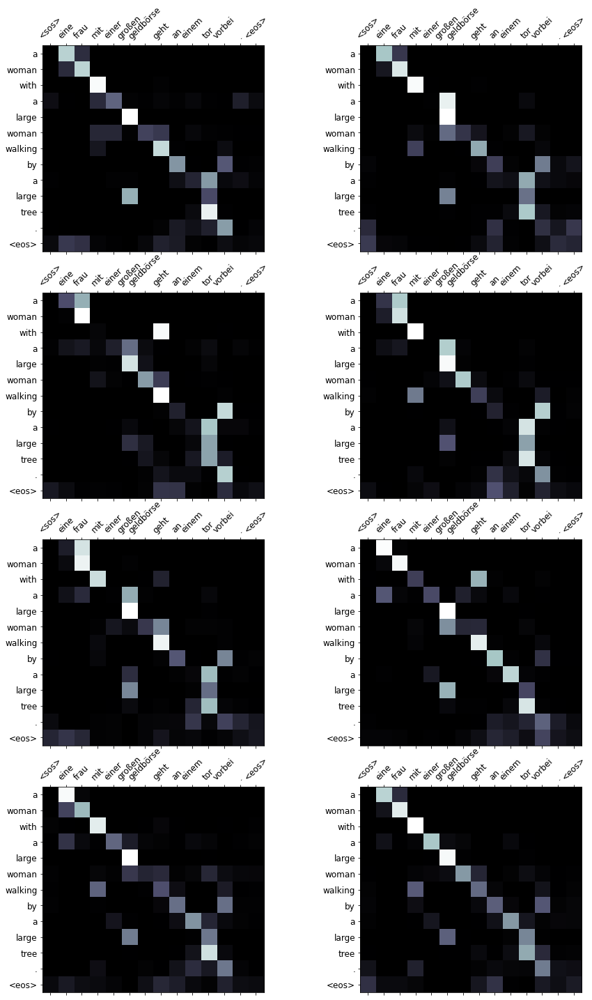

In [50]:
display_attention(src, translation, attention)

Next, let's get an example the model has not been trained on from the validation set.

In [51]:
example_idx = 6

src = vars(valid_data.examples[example_idx])['src']
trg = vars(valid_data.examples[example_idx])['trg']

print(f'src = {src}')
print(f'trg = {trg}')

src = ['ein', 'brauner', 'hund', 'rennt', 'dem', 'schwarzen', 'hund', 'hinterher', '.']
trg = ['a', 'brown', 'dog', 'is', 'running', 'after', 'the', 'black', 'dog', '.']


The model translates it by switching *is running* to just *runs*, but it is an acceptable swap.

In [52]:
translation, attention = translate_sentence(src, SRC, TRG, model, device)

print(f'predicted trg = {translation}')

predicted trg = ['a', 'brown', 'dog', 'running', 'in', 'the', 'black', 'dog', '.', '<eos>']


Again, some heads pay full attention to "ein" whilst some pay no attention to it. Again, most of the heads seem to spread their attention over both the period and `<eos>` tokens in the source sentence when outputting the period and `<eos>` sentence in the predicted target sentence, though some seem to pay attention to tokens from near the start of the sentence.

<ipython-input-47-8546ab0d7ba0>:16: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(['']+['<sos>']+[t.lower() for t in sentence]+['<eos>'],
<ipython-input-47-8546ab0d7ba0>:18: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels(['']+translation)


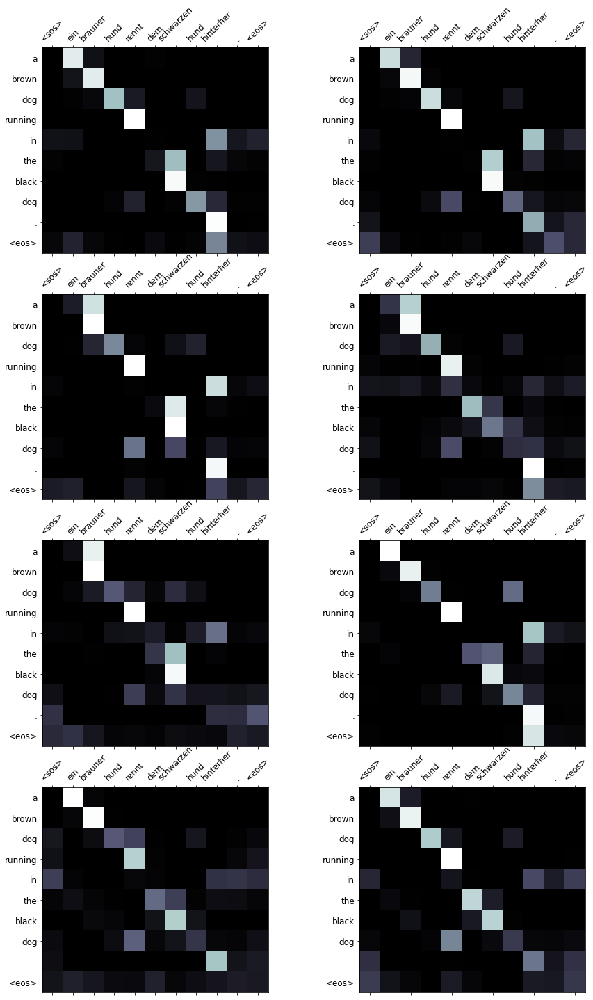

In [53]:
display_attention(src, translation, attention)

Finally, we'll look at an example from the test data.

In [54]:
example_idx = 10

src = vars(test_data.examples[example_idx])['src']
trg = vars(test_data.examples[example_idx])['trg']

print(f'src = {src}')
print(f'trg = {trg}')

src = ['eine', 'mutter', 'und', 'ihr', 'kleiner', 'sohn', 'genießen', 'einen', 'schönen', 'tag', 'im', 'freien', '.']
trg = ['a', 'mother', 'and', 'her', 'young', 'song', 'enjoying', 'a', 'beautiful', 'day', 'outside', '.']


A perfect translation!

In [55]:
translation, attention = translate_sentence(src, SRC, TRG, model, device)

print(f'predicted trg = {translation}')

predicted trg = ['a', 'small', 'child', 'and', 'a', 'baby', 'are', 'gathered', 'around', 'in', 'the', 'day', '.', '<eos>']


<ipython-input-47-8546ab0d7ba0>:16: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(['']+['<sos>']+[t.lower() for t in sentence]+['<eos>'],
<ipython-input-47-8546ab0d7ba0>:18: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels(['']+translation)


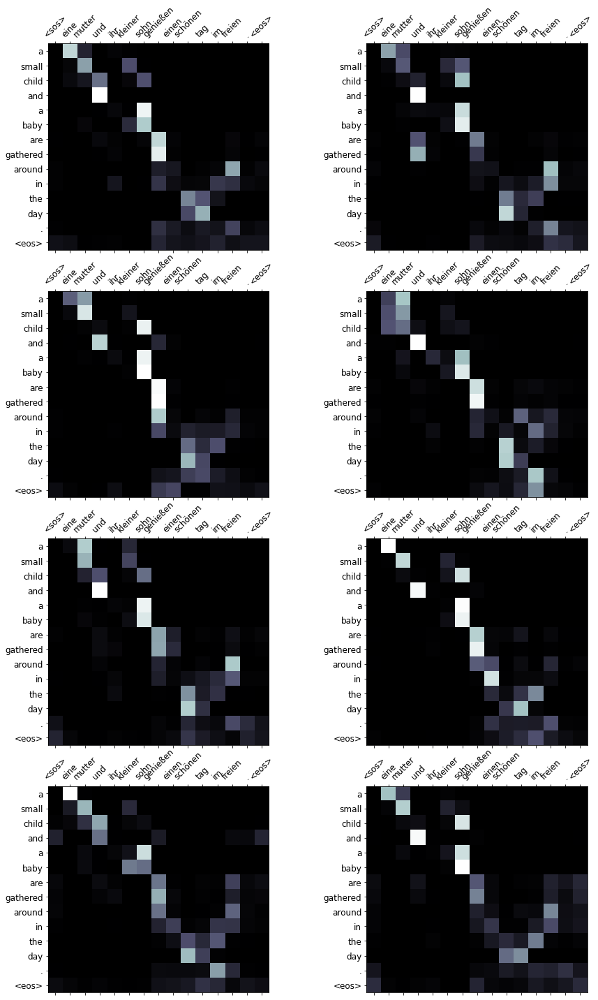

In [56]:
display_attention(src, translation, attention)

## BLEU

Finally we calculate the BLEU score for the Transformer.

In [57]:
from torchtext.data.metrics import bleu_score

def calculate_bleu(data, src_field, trg_field, model, device, max_len = 50):
    
    trgs = []
    pred_trgs = []
    
    for datum in data:
        
        src = vars(datum)['src']
        trg = vars(datum)['trg']
        
        pred_trg, _ = translate_sentence(src, src_field, trg_field, model, device, max_len)
        
        #cut off <eos> token
        pred_trg = pred_trg[:-1]
        
        pred_trgs.append(pred_trg)
        trgs.append([trg])
        
    return bleu_score(pred_trgs, trgs)

We get a BLEU score of 36.52, which beats the ~34 of the convolutional sequence-to-sequence model and ~28 of the attention based RNN model. All this whilst having the least amount of parameters and the fastest training time!

In [ ]:
bleu_score = calculate_bleu(test_data, SRC, TRG, model, device)

print(f'BLEU score = {bleu_score*100:.2f}')

Congratulations for finishing these tutorials! I hope you've found them useful.

If you find any mistakes or want to ask any questions about any of the code or explanations used, feel free to submit a GitHub issue and I will try to correct it ASAP.

## Appendix

The `calculate_bleu` function above is unoptimized. Below is a significantly faster, vectorized version of it that should be used if needed. Credit for the implementation goes to [@azadyasar](https://github.com/azadyasar).

In [ ]:
def translate_sentence_vectorized(src_tensor, src_field, trg_field, model, device, max_len=50):
    assert isinstance(src_tensor, torch.Tensor)

    model.eval()
    src_mask = model.make_src_mask(src_tensor)

    with torch.no_grad():
        enc_src = model.encoder(src_tensor, src_mask)
    # enc_src = [batch_sz, src_len, hid_dim]

    trg_indexes = [[trg_field.vocab.stoi[trg_field.init_token]] for _ in range(len(src_tensor))]
    # Even though some examples might have been completed by producing a <eos> token
    # we still need to feed them through the model because other are not yet finished
    # and all examples act as a batch. Once every single sentence prediction encounters
    # <eos> token, then we can stop predicting.
    translations_done = [0] * len(src_tensor)
    for i in range(max_len):
        trg_tensor = torch.LongTensor(trg_indexes).to(device)
        trg_mask = model.make_trg_mask(trg_tensor)
        with torch.no_grad():
            output, attention = model.decoder(trg_tensor, enc_src, trg_mask, src_mask)
        pred_tokens = output.argmax(2)[:,-1]
        for i, pred_token_i in enumerate(pred_tokens):
            trg_indexes[i].append(pred_token_i)
            if pred_token_i == trg_field.vocab.stoi[trg_field.eos_token]:
                translations_done[i] = 1
        if all(translations_done):
            break

    # Iterate through each predicted example one by one;
    # Cut-off the portion including the after the <eos> token
    pred_sentences = []
    for trg_sentence in trg_indexes:
        pred_sentence = []
        for i in range(1, len(trg_sentence)):
            if trg_sentence[i] == trg_field.vocab.stoi[trg_field.eos_token]:
                break
            pred_sentence.append(trg_field.vocab.itos[trg_sentence[i]])
        pred_sentences.append(pred_sentence)

    return pred_sentences, attention

In [ ]:
from torchtext.data.metrics import bleu_score

def calculate_bleu_alt(iterator, src_field, trg_field, model, device, max_len = 50):
    trgs = []
    pred_trgs = []
    with torch.no_grad():
        for batch in iterator:
            src = batch.src
            trg = batch.trg
            _trgs = []
            for sentence in trg:
                tmp = []
                # Start from the first token which skips the <start> token
                for i in sentence[1:]:
                    # Targets are padded. So stop appending as soon as a padding or eos token is encountered
                    if i == trg_field.vocab.stoi[trg_field.eos_token] or i == trg_field.vocab.stoi[trg_field.pad_token]:
                        break
                    tmp.append(trg_field.vocab.itos[i])
                _trgs.append([tmp])
            trgs += _trgs
            pred_trg, _ = translate_sentence_vectorized(src, src_field, trg_field, model, device)
            pred_trgs += pred_trg
    return pred_trgs, trgs, bleu_score(pred_trgs, trgs)